# Results Analysis: Non-Reshuffling Settings

This notebook contains all analyses for the results section of my thesis.

**Structure:**
1. Setup and Data Loading
2. Purely Offline Optimization
3. Purely Online Optimization
4. Hybrid Performance Analysis
5. Algorithm Comparison and Synthesis

## 1. Setup and Data Loading

In [1]:
# Global dispersion label helper
DISPERSION_LABELS = {
    "vol_lowvar": "Low variance",
    "vol_midvar": "Medium variance",
    "vol_highuncert_uniform": "High variance",
}

def map_dispersion_label(val):
    if val is None:
        return None
    s = str(val)
    for key, label in DISPERSION_LABELS.items():
        if key in s:
            return label
    return None

from pathlib import Path
import json
import re
from datetime import datetime
import numpy as np
import pandas as pd
import scienceplots
import matplotlib.pyplot as plt
from scipy import stats

# Science plots styling
plt.style.use('science')
%config InlineBackend.figure_format = "retina"
%config InlineBackend.print_figure_kwargs = {"dpi": 200}

# Output directory for figures
ROOT = Path.cwd()
for parent in [ROOT] + list(ROOT.parents):
    if (parent / "outputs").exists():
        ROOT = parent
        break

FIG_DIR = ROOT / "outputs/bgap/analysis/figures"
FIG_DIR.mkdir(parents=True, exist_ok=True)

# Stable root for per-feasibility folders
FIG_DIR_ROOT = FIG_DIR

# Data sources (switchable)
BASE_DIR_OLD = ROOT / "outputs/bgap/results/param_sweep"
BASE_DIR_PD_RETUNED = ROOT / "outputs/bgap/results/param_sweep_pd_retuned_latest"
BASE_DIR_RH_NO_COST = ROOT / "outputs/bgap/results/param_sweep_rh_no_cost_lookahead"

# "old": baseline sweep only
# "new": PD-retuned sweep only
# "merge_pd": baseline sweep + replace only primal_dual eval rows from PD-retuned sweep
# "merge_pd_rh_no_cost": merge_pd + append rolling-MILP runs without future-cost lookahead
RESULTS_SOURCE_MODE = "merge_pd_rh_no_cost"

if RESULTS_SOURCE_MODE == "old":
    ACTIVE_RESULT_DIRS = [("old", BASE_DIR_OLD)]
    BASE_DIR = BASE_DIR_OLD
elif RESULTS_SOURCE_MODE == "new":
    ACTIVE_RESULT_DIRS = [("new", BASE_DIR_PD_RETUNED)]
    BASE_DIR = BASE_DIR_PD_RETUNED
elif RESULTS_SOURCE_MODE == "merge_pd":
    ACTIVE_RESULT_DIRS = [("old", BASE_DIR_OLD), ("pd_new", BASE_DIR_PD_RETUNED)]
    BASE_DIR = BASE_DIR_OLD
elif RESULTS_SOURCE_MODE == "merge_pd_rh_no_cost":
    ACTIVE_RESULT_DIRS = [
        ("old", BASE_DIR_OLD),
        ("pd_new", BASE_DIR_PD_RETUNED),
        ("rh_no_cost", BASE_DIR_RH_NO_COST),
    ]
    BASE_DIR = BASE_DIR_OLD
else:
    raise ValueError(
        f"Unknown RESULTS_SOURCE_MODE={RESULTS_SOURCE_MODE!r}. "
        "Use one of: old, new, merge_pd, merge_pd_rh_no_cost"
    )

missing = [f"{tag}: {base_dir}" for tag, base_dir in ACTIVE_RESULT_DIRS if not base_dir.exists()]
if missing:
    raise FileNotFoundError(
        "Missing result directories for selected RESULTS_SOURCE_MODE:\n" + "\n".join(missing)
    )

print(f"Using RESULTS_SOURCE_MODE={RESULTS_SOURCE_MODE}")
for tag, base_dir in ACTIVE_RESULT_DIRS:
    print(f"  - {tag}: {base_dir}")

# Feasibility variants appended to scenario names by run_param_sweep
# Write figures to per-feasibility subfolders
FIGS_BY_FEAS = True

FEAS_TAGS = ("uniform", "expbin_a2") #"expbin_a3"
# Filter analyses to a subset of feasibility modes (None = keep all)
FEAS_FILTER = None
FILENAME_RE = re.compile(r"^(?P<kind>[^_]+)_(?P<label>.+)_(?P<ts>\d{8}_\d{6})\.json$")



Using RESULTS_SOURCE_MODE=merge_pd_rh_no_cost
  - old: /u/halle/rsim/home_at/projects/Bachelorarbeit/outputs/bgap/results/param_sweep
  - pd_new: /u/halle/rsim/home_at/projects/Bachelorarbeit/outputs/bgap/results/param_sweep_pd_retuned_latest
  - rh_no_cost: /u/halle/rsim/home_at/projects/Bachelorarbeit/outputs/bgap/results/param_sweep_rh_no_cost_lookahead


In [2]:
def read_json(path: Path) -> dict:
    with path.open("r", encoding="utf-8") as f:
        return json.load(f)


def split_family_variant(group: str):
    if not group:
        return None, None
    parts = group.split("_", 1)
    family = parts[0]
    variant = parts[1] if len(parts) > 1 else None
    return family, variant


def split_feasibility_suffix(name: str):
    if not name:
        return None, None
    for tag in FEAS_TAGS:
        suffix = f"_{tag}"
        if name.endswith(suffix):
            return name[: -len(suffix)], tag
    return name, None


def parse_sweep_name(name: str) -> dict:
    base_name, feas = split_feasibility_suffix(name)
    prefix = base_name
    off_pct = None
    on_pct = None
    m = re.search(r"_off(\d+)_on(\d+)", base_name or "")
    if m:
        prefix = base_name[: m.start()]
        off_pct = int(m.group(1))
        on_pct = int(m.group(2))
    family, variant = split_family_variant(prefix)
    return {
        "sweep": name,
        "sweep_base": base_name,
        "feasibility": feas,
        "sweep_group": prefix,
        "family": family,
        "variant": variant,
        "off_pct": off_pct,
        "on_pct": on_pct,
    }


def parse_filename(path: Path) -> dict:
    m = FILENAME_RE.match(path.name)
    if not m:
        return {"kind": None, "label": None, "run_id": None, "run_dt": None}
    run_id = m.group("ts")
    try:
        run_dt = datetime.strptime(run_id, "%Y%m%d_%H%M%S")
    except ValueError:
        run_dt = None
    return {
        "kind": m.group("kind"),
        "label": m.group("label"),
        "run_id": run_id,
        "run_dt": run_dt,
    }


def split_label(label: str):
    if not label:
        return None, None
    if "+" in label:
        return label.split("+", 1)
    return label, None


def flatten_record(data: dict, path: Path, base_dir: Path, source_tag: str) -> dict:
    agg = data.get("aggregate", {})
    problem = data.get("problem", {})
    rel = path.relative_to(base_dir)
    sweep_meta = parse_sweep_name(rel.parts[0]) if rel.parts else {}
    name_meta = parse_filename(path)
    pipeline = data.get("pipeline") or name_meta.get("label")
    offline_short, online_short = split_label(pipeline)

    scenario = data.get("scenario")
    scenario_base, scenario_feas = split_feasibility_suffix(scenario)
    feasibility = scenario_feas or sweep_meta.get("feasibility")

    return {
        "file": path.name,
        "path": str(path),
        "result_source": source_tag,
        "result_base_dir": str(base_dir),
        **sweep_meta,
        **name_meta,
        "scenario": scenario,
        "scenario_base": scenario_base,
        "feasibility": feasibility,
        "scenario_description": data.get("scenario_description"),
        "pipeline": pipeline,
        "offline_solver": data.get("offline_solver"),
        "online_policy": data.get("online_policy"),
        "offline_short": offline_short,
        "online_short": online_short,
        "seed_count": data.get("seed_count"),
        "per_seed": data.get("per_seed"),
        "total_objective_mean": agg.get("total_objective_mean"),
        "total_objective_penalized_mean": agg.get("total_objective_penalized_mean"),
        "offline_objective_mean": agg.get("offline_objective_mean"),
        "online_objective_mean": agg.get("online_objective_mean"),
        "offline_runtime_mean": agg.get("offline_runtime_mean"),
        "online_runtime_mean": agg.get("online_runtime_mean"),
        "runtime_mean": agg.get("runtime_mean"),
        "offline_utilization_mean": agg.get("offline_utilization_mean"),
        "offline_failures": agg.get("offline_failures"),
        "online_failures": agg.get("online_failures"),
        "failures": agg.get("failures"),
        "N": problem.get("N"),
        "T_off": problem.get("T_off"),
        "T_onl": problem.get("T_onl"),
        "dimensions": problem.get("dimensions"),
    }


def _is_pd_eval_row(row: dict) -> bool:
    return (
        row.get("kind") == "eval"
        and str(row.get("online_short") or "").lower() == "primal_dual"
    )


def _is_rh_no_cost_eval_row(row: dict) -> bool:
    return (
        row.get("kind") == "eval"
        and str(row.get("online_short") or "").lower() == "rolling_horizon_milp_no_cost_lookahead"
    )


def load_results(
    source_mode: str = RESULTS_SOURCE_MODE,
    base_dir_old: Path = BASE_DIR_OLD,
    base_dir_new: Path = BASE_DIR_PD_RETUNED,
    base_dir_rh_no_cost: Path = BASE_DIR_RH_NO_COST,
):
    mode = str(source_mode).strip().lower()
    if mode == "old":
        dir_specs = [("old", base_dir_old)]
    elif mode == "new":
        dir_specs = [("new", base_dir_new)]
    elif mode == "merge_pd":
        dir_specs = [("old", base_dir_old), ("pd_new", base_dir_new)]
    elif mode == "merge_pd_rh_no_cost":
        dir_specs = [
            ("old", base_dir_old),
            ("pd_new", base_dir_new),
            ("rh_no_cost", base_dir_rh_no_cost),
        ]
    else:
        raise ValueError(
            f"Unknown source_mode={source_mode!r}. Use one of: old, new, merge_pd, merge_pd_rh_no_cost"
        )

    records = []
    for source_tag, base_dir in dir_specs:
        for path in sorted(base_dir.rglob("*.json")):
            records.append(
                flatten_record(read_json(path), path, base_dir=base_dir, source_tag=source_tag)
            )

    if mode in {"old", "new"}:
        return records

    old_records = [r for r in records if r.get("result_source") == "old"]
    new_pd_eval = [
        r for r in records
        if r.get("result_source") == "pd_new" and _is_pd_eval_row(r)
    ]

    if not new_pd_eval:
        print("merge_pd selected, but no new primal_dual eval rows found. Falling back to old only.")
        merged = old_records
    else:
        merged = [r for r in old_records if not _is_pd_eval_row(r)]
        merged.extend(new_pd_eval)

    if mode == "merge_pd":
        return merged

    rh_no_cost_eval = [
        r for r in records
        if r.get("result_source") == "rh_no_cost" and _is_rh_no_cost_eval_row(r)
    ]
    if not rh_no_cost_eval:
        print("merge_pd_rh_no_cost selected, but no rolling_horizon_milp_no_cost_lookahead eval rows found.")
        return merged

    merged.extend(rh_no_cost_eval)
    return merged



In [3]:
# Load all results
records = load_results(source_mode=RESULTS_SOURCE_MODE)
print(f"Loaded {len(records)} result files (mode={RESULTS_SOURCE_MODE})")
if RESULTS_SOURCE_MODE in {"merge_pd", "merge_pd_rh_no_cost"}:
    pd_eval_count = sum(
        1 for row in records
        if row.get("kind") == "eval" and str(row.get("online_short") or "").lower() == "primal_dual"
    )
    print(f"Merged primal_dual eval rows: {pd_eval_count}")
if RESULTS_SOURCE_MODE == "merge_pd_rh_no_cost":
    rh_no_cost_eval_count = sum(
        1 for row in records
        if row.get("kind") == "eval"
        and str(row.get("online_short") or "").lower() == "rolling_horizon_milp_no_cost_lookahead"
    )
    print(f"Appended rolling_horizon_milp_no_cost_lookahead eval rows: {rh_no_cost_eval_count}")



Loaded 1834 result files (mode=merge_pd_rh_no_cost)
Merged primal_dual eval rows: 180
Appended rolling_horizon_milp_no_cost_lookahead eval rows: 304


In [4]:
# PHASE 1: CLEANED UP 
df = pd.DataFrame(records)

if df.empty:
    df_eval = None
    df_opt = None
    df_per_seed = None
    print("No records loaded. Check BASE_DIR or records.")
else:
    # Algorithm name mappings 
    offline_map = {
        "cabfd": "CaBfd",
        "util": "UtilDecr",
        'bgap_milp':'MILP',#"bgap_milp": "MILP",
        "full_horizon": "Benchmark",
    }
    online_map = {
        "primal_dual": "PrimalDual",
        "sim_dual": "SimDual",  
        "dynamic_learning": "DL",
        "cost_best_fit": "CaBf",
        "rolling_horizon_milp": "RollingMILP",
        "rolling_horizon_milp_no_cost_lookahead": "RollingMILP-NoCLA",
    }

    def pretty_pipeline(label):
        if not isinstance(label, str) or not label:
            return label
        if "+" in label:
            off_raw, on_raw = (part.strip() for part in label.split("+", 1))
            off_name = offline_map.get(off_raw, off_raw)
            on_name = online_map.get(on_raw, on_raw)
            return f"{off_name} + {on_name}"
        return offline_map.get(label, label)

    df["offline_short_raw"] = df["offline_short"]
    df["online_short_raw"] = df["online_short"]
    df["pipeline_raw"] = df["pipeline"]

    df["offline_short"] = df["offline_short"].map(offline_map).fillna(df["offline_short"])
    df["online_short"] = df["online_short"].map(online_map).fillna(df["online_short"])
    df["pipeline"] = df["pipeline"].apply(pretty_pipeline)


    def apply_feasibility_filter(frame, feas=FEAS_FILTER):
        if frame is None:
            return None
        if feas is None:
            return frame
        if isinstance(feas, str):
            feas = [feas]
        if "feasibility" not in frame.columns:
            raise KeyError("Missing feasibility column in results.")
        return frame[frame["feasibility"].isin(feas)].copy()
    # Process per-seed data
    df_per_seed = None
    if "per_seed" in df.columns:
        df_seed = df[df["per_seed"].notna()].copy()
        if not df_seed.empty:
            df_seed = df_seed.explode("per_seed").reset_index(drop=True)
            seed_cols = pd.json_normalize(df_seed["per_seed"])
            df_seed = df_seed.drop(columns=["per_seed"]).reset_index(drop=True)
            df_seed = pd.concat([df_seed, seed_cols], axis=1)
            df_seed["offline_short"] = (
                df_seed["offline_short"].map(offline_map).fillna(df_seed["offline_short"])
            )
            df_seed["online_short"] = (
                df_seed["online_short"].map(online_map).fillna(df_seed["online_short"])
            )
            df_seed["pipeline"] = df_seed["pipeline"].apply(pretty_pipeline)
            # Handle old + mixed data formats: eval rows have penalized cols, optimal rows may not.
            for base, pen in [
                ("total_objective", "total_objective_penalized"),
                ("offline_objective", "offline_objective_penalized"),
                ("online_objective", "online_objective_penalized"),
            ]:
                if pen not in df_seed.columns:
                    df_seed[pen] = df_seed[base]
                else:
                    df_seed[pen] = df_seed[pen].where(df_seed[pen].notna(), df_seed[base])
            df_seed["total_objective"] = df_seed["total_objective_penalized"]
            df_seed["offline_objective"] = df_seed["offline_objective_penalized"]
            df_seed["online_objective"] = df_seed["online_objective_penalized"]
            df_per_seed = df_seed

    df_eval = df[df["kind"] == "eval"].copy()
    # Handle both old and new data formats
    if "total_objective_penalized_mean" not in df_eval.columns:
        raise KeyError("Missing total_objective_penalized...")
        # could use below
        # Old format: use regular mean as penalized mean
        #df_eval["total_objective_penalized_mean"] = df_eval["total_objective_mean"]
    df_eval["total_objective_mean"] = df_eval["total_objective_penalized_mean"]
    df_opt = df[df["kind"] == "optimal"].copy()
    df = apply_feasibility_filter(df)
    df_eval = apply_feasibility_filter(df_eval)
    df_opt = apply_feasibility_filter(df_opt)
    df_per_seed = apply_feasibility_filter(df_per_seed)

# COMMENTED OUT: This reassignment breaks FEAS_LOOP logic
# The FEAS_LOOP cells handle scenario reassignment themselves
# Original code was:
#     # Normalize scenario columns to base names for all frames
#     for frame in (df, df_eval, df_opt, df_per_seed):
#         if frame is None:
#             continue
#         if "scenario_base" not in frame.columns and "scenario" in frame.columns:
#             frame["scenario_base"] = frame["scenario"]
#         if "scenario_base" in frame.columns:
#             frame["scenario"] = frame["scenario_base"]
# 
# 
# 
#     if FEAS_FILTER is not None and len(FEAS_FILTER) == 1:
#         for frame in (df, df_eval, df_opt, df_per_seed):
#             if frame is not None and "scenario_base" in frame.columns:
#                 frame["scenario"] = frame["scenario_base"]


# Master copies to avoid downstream in-place filtering issues
df_eval_master = df_eval.copy() if df_eval is not None else None
df_opt_master = df_opt.copy() if df_opt is not None else None
df_per_seed_master = df_per_seed.copy() if df_per_seed is not None else None
print(f"Processed: {len(df_eval)} eval results, {len(df_opt)} optimal benchmarks")
df.head()



Processed: 1715 eval results, 119 optimal benchmarks


,file,path,result_source,result_base_dir,sweep,sweep_base,feasibility,sweep_group,family,variant,...,offline_failures,online_failures,failures,N,T_off,T_onl,dimensions,offline_short_raw,online_short_raw,pipeline_raw
0,eval_bgap_milp+cost_best_fit_20260223_124201.json,/u/halle/rsim/home_at/projects/Bachelorarbeit/...,old,/u/halle/rsim/home_at/projects/Bachelorarbeit/...,baseline_midvar_off0_on100_expbin_a2,baseline_midvar_off0_on100,expbin_a2,baseline_midvar,baseline,midvar,...,0.0,0.0,NaN,None,0,200,None,bgap_milp,cost_best_fit,bgap_milp+cost_best_fit
1,eval_bgap_milp+dynamic_learning_20260223_12420...,/u/halle/rsim/home_at/projects/Bachelorarbeit/...,old,/u/halle/rsim/home_at/projects/Bachelorarbeit/...,baseline_midvar_off0_on100_expbin_a2,baseline_midvar_off0_on100,expbin_a2,baseline_midvar,baseline,midvar,...,0.0,0.0,NaN,None,0,200,None,bgap_milp,dynamic_learning,bgap_milp+dynamic_learning
2,eval_bgap_milp+rolling_horizon_milp_20260223_1...,/u/halle/rsim/home_at/projects/Bachelorarbeit/...,old,/u/halle/rsim/home_at/projects/Bachelorarbeit/...,baseline_midvar_off0_on100_expbin_a2,baseline_midvar_off0_on100,expbin_a2,baseline_midvar,baseline,midvar,...,0.0,0.0,NaN,None,0,200,None,bgap_milp,rolling_horizon_milp,bgap_milp+rolling_horizon_milp
3,eval_bgap_milp+sim_dual_20260223_124201.json,/u/halle/rsim/home_at/projects/Bachelorarbeit/...,old,/u/halle/rsim/home_at/projects/Bachelorarbeit/...,baseline_midvar_off0_on100_expbin_a2,baseline_midvar_off0_on100,expbin_a2,baseline_midvar,baseline,midvar,...,0.0,0.0,NaN,None,0,200,None,bgap_milp,sim_dual,bgap_milp+sim_dual
4,eval_cabfd+cost_best_fit_20260223_124201.json,/u/halle/rsim/home_at/projects/Bachelorarbeit/...,old,/u/halle/rsim/home_at/projects/Bachelorarbeit/...,baseline_midvar_off0_on100_expbin_a2,baseline_midvar_off0_on100,expbin_a2,baseline_midvar,baseline,midvar,...,0.0,0.0,NaN,None,0,200,None,cabfd,cost_best_fit,cabfd+cost_best_fit


In [5]:
# Should show full names WITH feasibility suffix
print(df_per_seed_master["scenario"].unique()[:3])
# Expected: ['baseline_midvar_off0_on100_expbin_a2', 
#            'baseline_midvar_off0_on100_uniform', ...]


['baseline_midvar_off0_on100_expbin_a2'
 'baseline_midvar_off0_on100_uniform'
 'baseline_midvar_off20_on80_expbin_a2']


In [6]:
# Should show FULL names WITH _uniform or _expbin_a2 suffix
print(df_per_seed_master["scenario"].unique()[:3])


['baseline_midvar_off0_on100_expbin_a2'
 'baseline_midvar_off0_on100_uniform'
 'baseline_midvar_off20_on80_expbin_a2']


## 2. Purely Offline Optimization

Analyzing offline algorithms (CaBfd, UtilDecr) against MILP benchmark.

**Scenarios:** Varying T_onl lengths (T_off ∈ {40, 80, 120, 160})

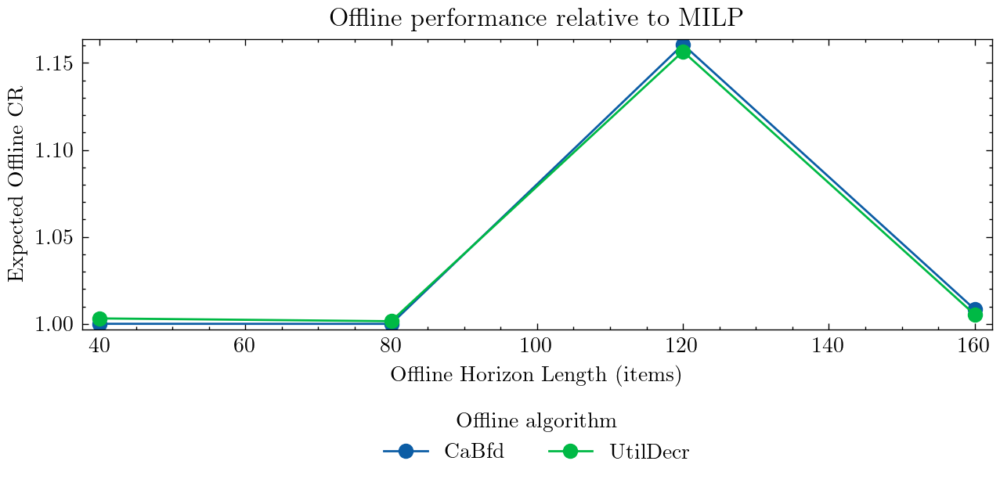

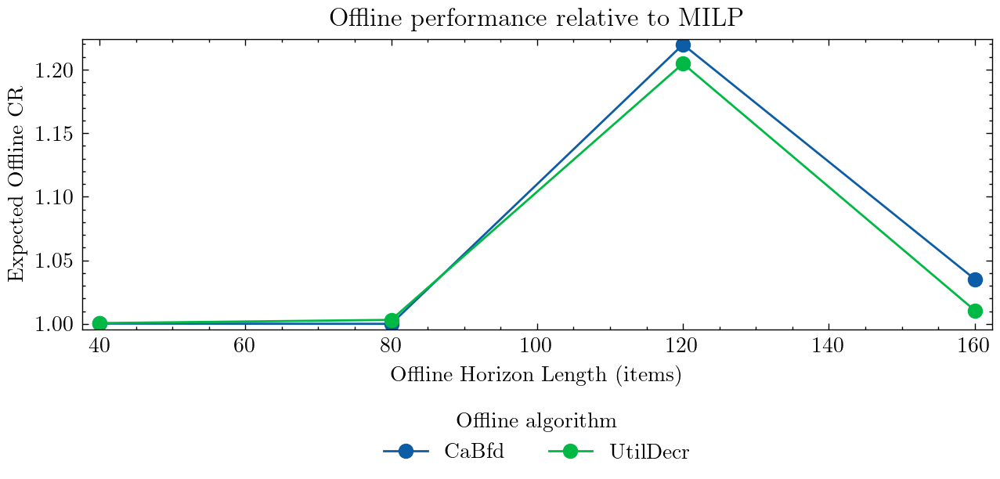

In [7]:
# FEAS_LOOP_BEGIN
df_eval_all = df_eval_master if "df_eval_master" in globals() and df_eval_master is not None else df_eval
df_opt_all = df_opt_master if "df_opt_master" in globals() and df_opt_master is not None else df_opt
df_per_seed_all = df_per_seed_master if "df_per_seed_master" in globals() and df_per_seed_master is not None else df_per_seed
FIG_DIR_BASE = FIG_DIR_ROOT
for feas in FEAS_TAGS:
    FIG_DIR = FIG_DIR_BASE / feas if FIGS_BY_FEAS else FIG_DIR_BASE
    FIG_DIR.mkdir(parents=True, exist_ok=True)
    df_eval = df_eval_all[df_eval_all["feasibility"] == feas].copy() if df_eval_all is not None else None
    df_opt = df_opt_all[df_opt_all["feasibility"] == feas].copy() if df_opt_all is not None else None
    df_per_seed = df_per_seed_all[df_per_seed_all["feasibility"] == feas].copy() if df_per_seed_all is not None else None
    if df_eval is not None and "scenario_base" in df_eval.columns:
        df_eval["scenario"] = df_eval["scenario_base"]
    if df_opt is not None and "scenario_base" in df_opt.columns:
        df_opt["scenario"] = df_opt["scenario_base"]
    if df_per_seed is not None and "scenario_base" in df_per_seed.columns:
        df_per_seed["scenario"] = df_per_seed["scenario_base"]
    # Competitive Ratio vs. Horizon Length
    if df_eval is not None:
        df_offline_plot = df_eval[
            ["T_off", "offline_short", "offline_objective_mean"]
        ].copy()
        df_offline_plot = df_offline_plot[df_offline_plot["T_off"].notna()]
        df_offline_plot = df_offline_plot[df_offline_plot["T_off"].gt(0)]
        df_offline_plot = df_offline_plot[df_offline_plot["offline_objective_mean"].notna()]

        grouped = (
            df_offline_plot.groupby(["T_off", "offline_short"], dropna=False)
            .agg(expected_obj=("offline_objective_mean", "mean"))
            .reset_index()
        )

        df_milp = grouped[grouped["offline_short"] == "MILP"][
            ["T_off", "expected_obj"]
        ].rename(columns={"expected_obj": "milp_obj"})
        df_rel = grouped.merge(df_milp, on="T_off", how="left")
        df_rel = df_rel[df_rel["milp_obj"].notna()]
        df_rel["relative_obj"] = df_rel["expected_obj"] / df_rel["milp_obj"]

        offline_order = ["CaBfd", "UtilDecr"]
        df_rel = df_rel[df_rel["offline_short"].isin(offline_order)]
        df_rel["offline_short"] = pd.Categorical(
            df_rel["offline_short"], categories=offline_order, ordered=True
        )
        df_rel = df_rel.sort_values(["offline_short", "T_off"])

        fig, ax = plt.subplots(figsize=(7.5, 3.2))
        for algo in offline_order:
            df_algo = df_rel[df_rel["offline_short"] == algo]
            if df_algo.empty:
                continue
            ax.plot(
                df_algo["T_off"],
                df_algo["relative_obj"],
                marker="o",
                label=algo,
            )

        ax.set_title("Offline performance relative to MILP")
        ax.set_xlabel("Offline Horizon Length (items)")
        ax.set_ylabel("Expected Offline CR")

        y_min = df_rel["relative_obj"].min()
        y_max = df_rel["relative_obj"].max()
        if pd.isna(y_min) or pd.isna(y_max):
            y_min, y_max = 0.0, 1.0
        y_pad = 0.02 * (y_max - y_min) if y_max > y_min else 0.02 * max(1.0, abs(y_max))
        ax.set_ylim(y_min - y_pad, y_max + y_pad)

        x_min = df_rel["T_off"].min()
        x_max = df_rel["T_off"].max()
        if pd.notna(x_min) and pd.notna(x_max):
            x_pad = 0.02 * (x_max - x_min) if x_max > x_min else 1
            ax.set_xlim(x_min - x_pad, x_max + x_pad)

        ncol = max(1, df_rel["offline_short"].nunique())
        ax.legend(
            title="Offline algorithm",
            ncol=ncol,
            loc="upper center",
            bbox_to_anchor=(0.5, -0.22),
        )
        fig.subplots_adjust(bottom=0.3)
        fig.savefig(FIG_DIR / f"offline_cr_vs_horizon_{feas}.pdf", dpi=200, bbox_inches="tight")
        plt.show()
df_eval = df_eval_all
df_opt = df_opt_all
df_per_seed = df_per_seed_all
# FEAS_LOOP_END


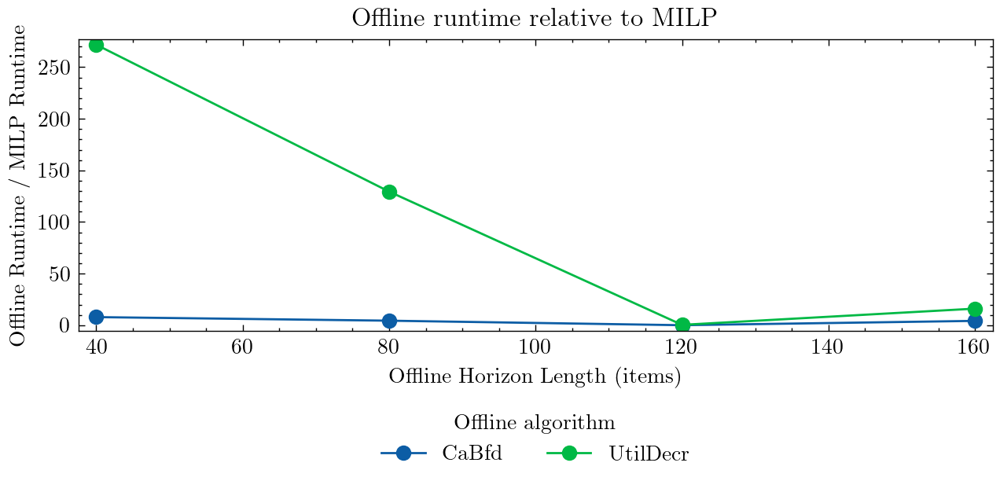

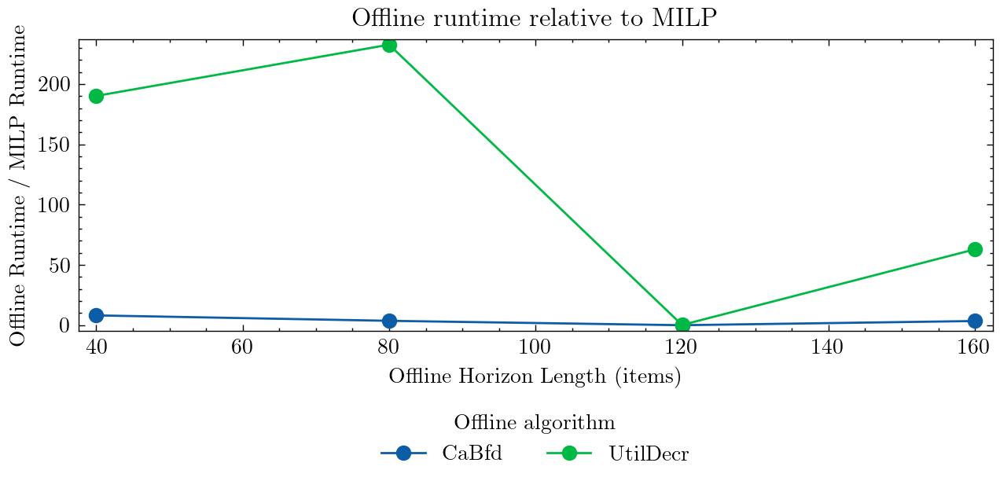

In [8]:
# FEAS_LOOP_BEGIN
df_eval_all = df_eval_master if "df_eval_master" in globals() and df_eval_master is not None else df_eval
df_opt_all = df_opt_master if "df_opt_master" in globals() and df_opt_master is not None else df_opt
df_per_seed_all = df_per_seed_master if "df_per_seed_master" in globals() and df_per_seed_master is not None else df_per_seed
FIG_DIR_BASE = FIG_DIR_ROOT
for feas in FEAS_TAGS:
    FIG_DIR = FIG_DIR_BASE / feas if FIGS_BY_FEAS else FIG_DIR_BASE
    FIG_DIR.mkdir(parents=True, exist_ok=True)
    df_eval = df_eval_all[df_eval_all["feasibility"] == feas].copy() if df_eval_all is not None else None
    df_opt = df_opt_all[df_opt_all["feasibility"] == feas].copy() if df_opt_all is not None else None
    df_per_seed = df_per_seed_all[df_per_seed_all["feasibility"] == feas].copy() if df_per_seed_all is not None else None
    if df_eval is not None and "scenario_base" in df_eval.columns:
        df_eval["scenario"] = df_eval["scenario_base"]
    if df_opt is not None and "scenario_base" in df_opt.columns:
        df_opt["scenario"] = df_opt["scenario_base"]
    if df_per_seed is not None and "scenario_base" in df_per_seed.columns:
        df_per_seed["scenario"] = df_per_seed["scenario_base"]
    # Runtime vs. Horizon Length
    if df_eval is not None:
        df_runtime_plot = df_eval[
            ["T_off", "offline_short", "offline_runtime_mean"]
        ].copy()
        df_runtime_plot = df_runtime_plot[df_runtime_plot["T_off"].notna()]
        df_runtime_plot = df_runtime_plot[df_runtime_plot["T_off"].gt(0)]
        df_runtime_plot = df_runtime_plot[df_runtime_plot["offline_runtime_mean"].notna()]

        grouped = (
            df_runtime_plot.groupby(["T_off", "offline_short"], dropna=False)
            .agg(expected_runtime=("offline_runtime_mean", "mean"))
            .reset_index()
        )

        df_milp = grouped[grouped["offline_short"] == "MILP"][
            ["T_off", "expected_runtime"]
        ].rename(columns={"expected_runtime": "milp_runtime"})
        df_rel = grouped.merge(df_milp, on="T_off", how="left")
        df_rel = df_rel[df_rel["milp_runtime"].notna()]
        df_rel = df_rel[df_rel["milp_runtime"].gt(0)]
        df_rel["relative_runtime"] = df_rel["expected_runtime"] / df_rel["milp_runtime"]

        offline_order = ["CaBfd", "UtilDecr"]
        df_rel = df_rel[df_rel["offline_short"].isin(offline_order)]
        df_rel["offline_short"] = pd.Categorical(
            df_rel["offline_short"], categories=offline_order, ordered=True
        )
        df_rel = df_rel.sort_values(["offline_short", "T_off"])

        fig, ax = plt.subplots(figsize=(7.5, 3.2))
        for algo in offline_order:
            df_algo = df_rel[df_rel["offline_short"] == algo]
            if df_algo.empty:
                continue
            ax.plot(
                df_algo["T_off"],
                df_algo["relative_runtime"],
                marker="o",
                label=algo,
            )

        ax.set_title("Offline runtime relative to MILP")
        ax.set_xlabel("Offline Horizon Length (items)")
        ax.set_ylabel("Offline Runtime / MILP Runtime")

        y_min = df_rel["relative_runtime"].min()
        y_max = df_rel["relative_runtime"].max()
        if pd.isna(y_min) or pd.isna(y_max):
            y_min, y_max = 0.0, 1.0
        y_pad = 0.02 * (y_max - y_min) if y_max > y_min else 0.02 * max(1.0, abs(y_max))
        ax.set_ylim(y_min - y_pad, y_max + y_pad)

        x_min = df_rel["T_off"].min()
        x_max = df_rel["T_off"].max()
        if pd.notna(x_min) and pd.notna(x_max):
            x_pad = 0.02 * (x_max - x_min) if x_max > x_min else 1
            ax.set_xlim(x_min - x_pad, x_max + x_pad)

        ncol = max(1, df_rel["offline_short"].nunique())
        ax.legend(
            title="Offline algorithm",
            ncol=ncol,
            loc="upper center",
            bbox_to_anchor=(0.5, -0.22),
        )
        fig.subplots_adjust(bottom=0.3)
        fig.savefig(FIG_DIR / f"offline_runtime_vs_horizon_{feas}.pdf", dpi=200, bbox_inches="tight")
        plt.show()
df_eval = df_eval_all
df_opt = df_opt_all
df_per_seed = df_per_seed_all
# FEAS_LOOP_END


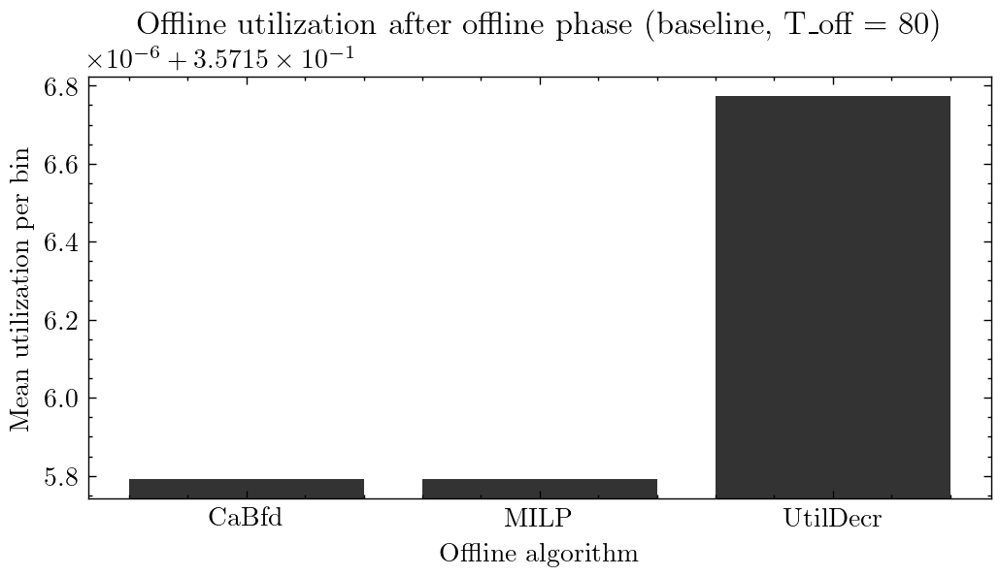

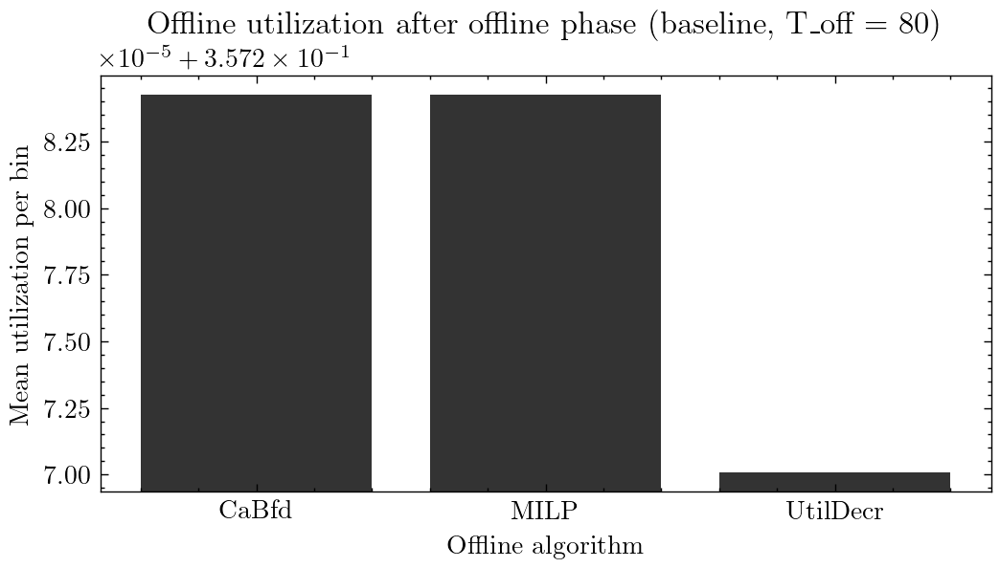

In [9]:
# FEAS_LOOP_BEGIN
df_eval_all = df_eval_master if "df_eval_master" in globals() and df_eval_master is not None else df_eval
df_opt_all = df_opt_master if "df_opt_master" in globals() and df_opt_master is not None else df_opt
df_per_seed_all = df_per_seed_master if "df_per_seed_master" in globals() and df_per_seed_master is not None else df_per_seed
FIG_DIR_BASE = FIG_DIR_ROOT
for feas in FEAS_TAGS:
    FIG_DIR = FIG_DIR_BASE / feas if FIGS_BY_FEAS else FIG_DIR_BASE
    FIG_DIR.mkdir(parents=True, exist_ok=True)
    df_eval = df_eval_all[df_eval_all["feasibility"] == feas].copy() if df_eval_all is not None else None
    df_opt = df_opt_all[df_opt_all["feasibility"] == feas].copy() if df_opt_all is not None else None
    df_per_seed = df_per_seed_all[df_per_seed_all["feasibility"] == feas].copy() if df_per_seed_all is not None else None
    if df_eval is not None and "scenario_base" in df_eval.columns:
        df_eval["scenario"] = df_eval["scenario_base"]
    if df_opt is not None and "scenario_base" in df_opt.columns:
        df_opt["scenario"] = df_opt["scenario_base"]
    if df_per_seed is not None and "scenario_base" in df_per_seed.columns:
        df_per_seed["scenario"] = df_per_seed["scenario_base"]
    # Offline utilization after offline phase (baseline, T_off = 80)
    if df_eval is not None:
        df_util_plot = df_eval[["family", "T_off", "offline_short", "offline_utilization_mean"]].copy()
        df_util_plot = df_util_plot[df_util_plot["family"] == "baseline"]
        df_util_plot = df_util_plot[df_util_plot["offline_utilization_mean"].notna()]
        df_util_plot = df_util_plot[df_util_plot["T_off"] == 80]

        if df_util_plot.empty:
            print("No offline utilization data for baseline with T_off = 80.")
        else:
            grouped = (
                df_util_plot.groupby("offline_short", dropna=False)
                .agg(util_mean=("offline_utilization_mean", "mean"))
                .reset_index()
            )

            offline_order = ["CaBfd", "MILP", "UtilDecr"]
            grouped["offline_short"] = pd.Categorical(
                grouped["offline_short"], categories=offline_order, ordered=True
            )
            grouped = grouped.sort_values("offline_short").dropna(subset=["offline_short"])

            fig, ax = plt.subplots(figsize=(6.0, 3.2))
            positions = np.arange(len(grouped))
            ax.bar(positions, grouped["util_mean"], color="black", alpha=0.8)

            ax.set_title("Offline utilization after offline phase (baseline, T_off = 80)")
            ax.set_xlabel("Offline algorithm")
            ax.set_ylabel("Mean utilization per bin")
            ax.set_xticks(positions)
            ax.set_xticklabels(grouped["offline_short"])

            y_min = grouped["util_mean"].min()
            y_max = grouped["util_mean"].max()
            if pd.isna(y_min) or pd.isna(y_max):
                y_min, y_max = 0.0, 1.0
            y_pad = 0.05 * (y_max - y_min) if y_max > y_min else 0.05
            ax.set_ylim(max(0.0, y_min - y_pad), y_max + y_pad)

            fig.subplots_adjust(bottom=0.2)
            fig.savefig(FIG_DIR / f"offline_utilization_moff80_{feas}.pdf", dpi=200, bbox_inches="tight")
            plt.show()
df_eval = df_eval_all
df_opt = df_opt_all
df_per_seed = df_per_seed_all
# FEAS_LOOP_END


## 3. Purely Online Optimization

Analyzing online algorithms without offline buffer capacity.

**Scenario:** baseline_midvar_off0_on100  
**Algorithms:** CaBf, RollingMILP, DL, SimDual, PrimalDual

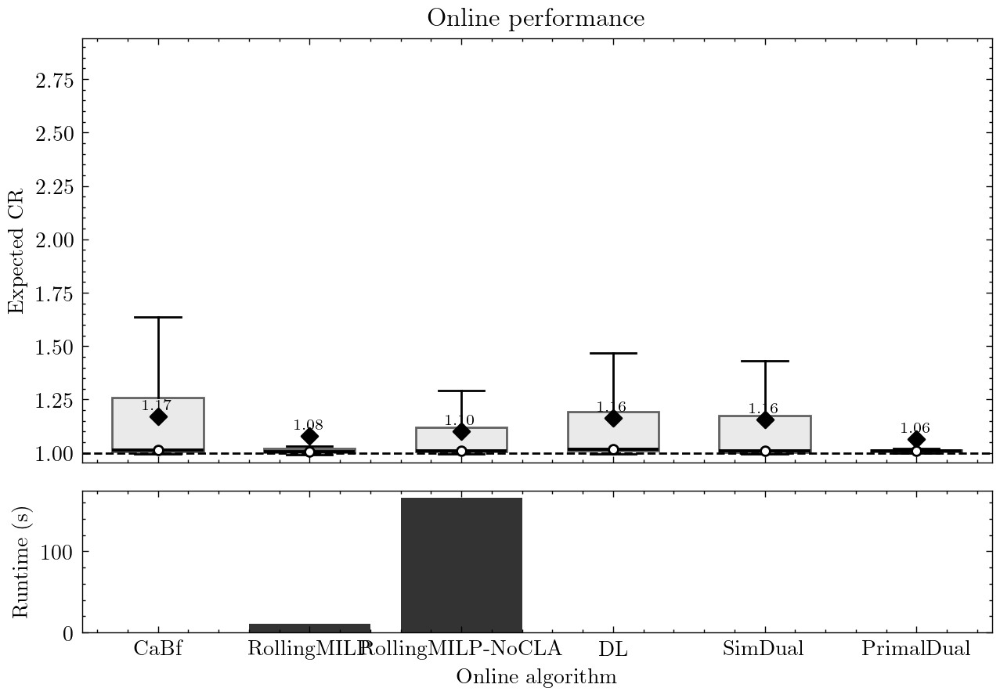

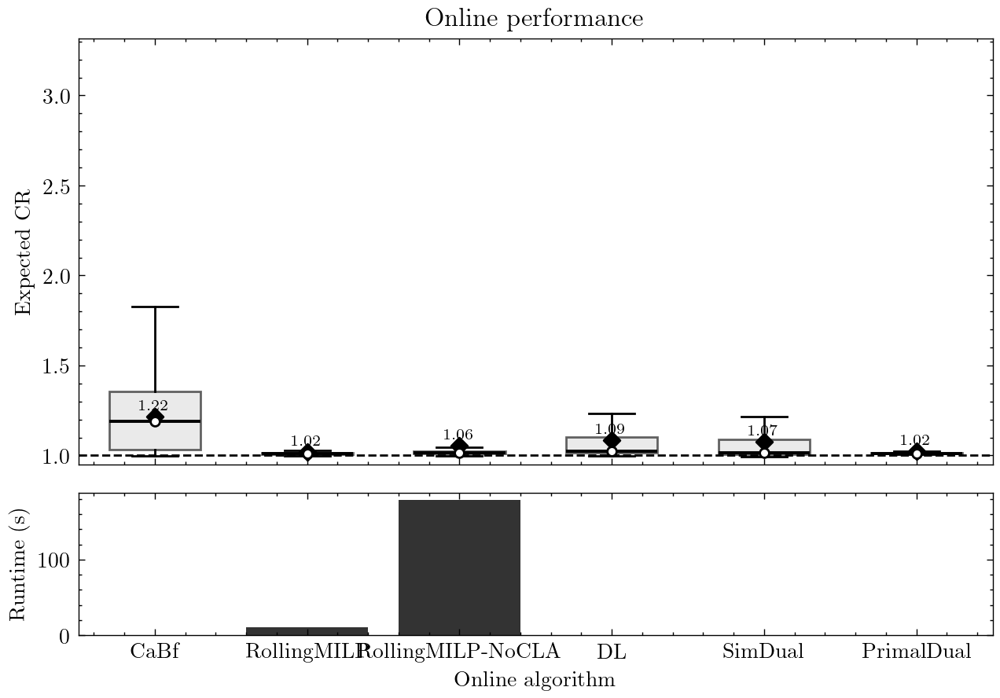

In [10]:
# FEAS_LOOP_BEGIN
df_eval_all = df_eval_master if "df_eval_master" in globals() and df_eval_master is not None else df_eval
df_opt_all = df_opt_master if "df_opt_master" in globals() and df_opt_master is not None else df_opt
df_per_seed_all = df_per_seed_master if "df_per_seed_master" in globals() and df_per_seed_master is not None else df_per_seed
FIG_DIR_BASE = FIG_DIR_ROOT
for feas in FEAS_TAGS:
    FIG_DIR = FIG_DIR_BASE / feas if FIGS_BY_FEAS else FIG_DIR_BASE
    FIG_DIR.mkdir(parents=True, exist_ok=True)
    df_eval = df_eval_all[df_eval_all["feasibility"] == feas].copy() if df_eval_all is not None else None
    df_opt = df_opt_all[df_opt_all["feasibility"] == feas].copy() if df_opt_all is not None else None
    df_per_seed = df_per_seed_all[df_per_seed_all["feasibility"] == feas].copy() if df_per_seed_all is not None else None
    if df_eval is not None and "scenario_base" in df_eval.columns:
        df_eval["scenario"] = df_eval["scenario_base"]
    if df_opt is not None and "scenario_base" in df_opt.columns:
        df_opt["scenario"] = df_opt["scenario_base"]
    if df_per_seed is not None and "scenario_base" in df_per_seed.columns:
        df_per_seed["scenario"] = df_per_seed["scenario_base"]
    # PHASE 1: CLEANED - NO SIMBASE IN online_order
    # Competitive Ratio Distribution
    if df_per_seed is not None:
        offline_fail_statuses = {"INFEASIBLE", "INF_OR_UNBD", "UNBOUNDED"}
        online_fail_statuses = {"INFEASIBLE"}

        df_online_all = df_per_seed[(df_per_seed["kind"] == "eval") & (df_per_seed["T_off"] == 0)].copy()
        df_online_success = df_online_all[
            ~df_online_all["offline_status"].isin(offline_fail_statuses)
            & ~df_online_all["online_status"].isin(online_fail_statuses)
        ].copy()

        df_opt_all = df_per_seed[(df_per_seed["kind"] == "optimal") & (df_per_seed["T_off"] == 0)].copy()
        df_opt_success = df_opt_all[~df_opt_all["status"].isin(offline_fail_statuses)].copy()
        df_opt_success = df_opt_success.rename(columns={"total_objective": "optimal_objective"})

        df_join = df_online_success.merge(
            df_opt_success[["scenario", "seed", "optimal_objective"]],
            on=["scenario", "seed"],
            how="left",
        )
        df_join = df_join[df_join["optimal_objective"].notna()]
        df_join = df_join[df_join["online_objective"].notna()]
        df_join["competitive_ratio"] = df_join["online_objective"] / df_join["optimal_objective"]

        # NO SIMBASE
        online_order = ["CaBf", "RollingMILP", "RollingMILP-NoCLA", "DL", "SimDual", "PrimalDual"]
        df_join["online_short"] = pd.Categorical(
            df_join["online_short"], categories=online_order, ordered=True
        )
        df_join = df_join.sort_values(["online_short", "seed"])

        data = []
        labels = []
        for algo in online_order:
            vals = df_join[df_join["online_short"] == algo]["competitive_ratio"].dropna().values
            if len(vals) == 0:
                continue
            data.append(vals)
            labels.append(algo)

        if data:
            runtime_stats = None
            if not df_online_all.empty and "online_runtime" in df_online_all.columns:
                runtime_stats = (
                    df_online_all.groupby("online_short")["online_runtime"]
                    .agg(mean_runtime="mean", std_runtime="std")
                )

            fig, (ax_box, ax_runtime) = plt.subplots(
                2, 1, figsize=(7.5, 5.2), sharex=True, gridspec_kw={"height_ratios": [3, 1]}
            )
            positions = np.arange(1, len(labels) + 1)
            bp = ax_box.boxplot(
                data,
                positions=positions,
                widths=0.6,
                showfliers=False,
                patch_artist=True,
                medianprops=dict(color="black", linewidth=1.4),
                whiskerprops=dict(color="black", linewidth=1.0),
                capprops=dict(color="black", linewidth=1.0),
            )
            for patch in bp["boxes"]:
                patch.set_facecolor("#dddddd")
                patch.set_alpha(0.6)

            ax_box.axhline(1.0, color="black", linestyle="--", linewidth=1)
            ax_box.set_title("Online performance")
            ax_box.set_ylabel("Expected CR")
            ax_box.tick_params(axis="x", labelbottom=False)

            y_min = df_join["competitive_ratio"].min()
            y_max = df_join["competitive_ratio"].max()
            if pd.isna(y_min) or pd.isna(y_max):
                y_min, y_max = 0.0, 1.0
            y_pad = 0.02 * (y_max - y_min) if y_max > y_min else 0.02 * max(1.0, abs(y_max))
            ax_box.set_ylim(y_min - y_pad, y_max + y_pad)
            y_offset = 0.01 * (y_max - y_min) if y_max > y_min else 0.01
            for pos, vals in zip(positions, data):
                vals = np.array(vals, dtype=float)
                vals = vals[~np.isnan(vals)]
                if len(vals) == 0:
                    continue
                mean_val = float(np.mean(vals))
                median_val = float(np.median(vals))
                ax_box.scatter(pos, mean_val, s=28, marker="D", color="black", zorder=3)
                ax_box.scatter(pos, median_val, s=18, marker="o", facecolor="white", edgecolor="black", zorder=3)
                ax_box.text(
                    pos,
                    mean_val + y_offset,
                    f"{mean_val:.2f}",
                    ha="center",
                    va="bottom",
                    fontsize=7,
                    color="black",
                )

            mean_runtimes = [0.0] * len(labels)
            std_runtimes = [0.0] * len(labels)
            if runtime_stats is not None:
                for i, algo in enumerate(labels):
                    if algo in runtime_stats.index:
                        mean_runtimes[i] = float(runtime_stats.loc[algo, "mean_runtime"])
                        std_runtimes[i] = float(runtime_stats.loc[algo, "std_runtime"]) if not pd.isna(runtime_stats.loc[algo, "std_runtime"]) else 0.0

            ax_runtime.bar(positions, mean_runtimes, color="black", alpha=0.8)
            ax_runtime.set_ylabel("Runtime (s)")
            ax_runtime.set_xlabel("Online algorithm")
            ax_runtime.set_xticks(positions)
            ax_runtime.set_xticklabels(labels)

            fig.subplots_adjust(hspace=0.1, bottom=0.15)
            fig.savefig(FIG_DIR / f"online_cr_distribution_{feas}.pdf", dpi=200, bbox_inches="tight")
            plt.show()
df_eval = df_eval_all
df_opt = df_opt_all
df_per_seed = df_per_seed_all
# FEAS_LOOP_END


In [11]:
df_per_seed_master is None
df_per_seed_master.columns
df_per_seed_master[["scenario","scenario_base","feasibility"]].drop_duplicates().head(10)

for feas in FEAS_TAGS:
    sub = df_per_seed_master[df_per_seed_master["feasibility"] == feas]
    print(feas, sub[sub["scenario_base"].isin(["baseline_midvar_off0_on100","online_h400_off0_on400"])].shape)


uniform (2550, 57)
expbin_a2 (2550, 57)


In [12]:
df_per_seed_master["online_short"].unique()[:10]


array(['CaBf', 'DL', 'RollingMILP', 'SimDual', None, 'PrimalDual',
       'RollingMILP-NoCLA'], dtype=object)

In [13]:
for feas in FEAS_TAGS:
    df_per_seed = df_per_seed_master[df_per_seed_master["feasibility"] == feas].copy()
    df_per_seed["scenario"] = df_per_seed["scenario_base"]

    base_scenario = "baseline_midvar_off0_on100"
    long_scenario = "online_h400_off0_on400"

    df_online_all = df_per_seed[
        (df_per_seed["kind"] == "eval")
        & (df_per_seed["T_off"] == 0)
        & (df_per_seed["scenario"].isin([base_scenario, long_scenario]))
    ].copy()

    df_opt_all = df_per_seed[
        (df_per_seed["kind"] == "optimal")
        & (df_per_seed["T_off"] == 0)
        & (df_per_seed["scenario"].isin([base_scenario, long_scenario]))
    ].copy()

    print(feas, "online_all", len(df_online_all), "opt_all", len(df_opt_all))

    offline_fail = {"INFEASIBLE", "INF_OR_UNBD", "UNBOUNDED"}
    online_fail = {"INFEASIBLE"}

    df_online_success = df_online_all[
        ~df_online_all["offline_status"].isin(offline_fail)
        & ~df_online_all["online_status"].isin(online_fail)
    ].copy()

    df_opt_success = df_opt_all[~df_opt_all["status"].isin(offline_fail)].copy()

    df_opt_success = df_opt_success.rename(columns={"total_objective": "optimal_objective"})
    df_join = df_online_success.merge(
        df_opt_success[["scenario", "seed", "optimal_objective"]],
        on=["scenario", "seed"],
        how="left",
    )
    df_join = df_join[df_join["optimal_objective"].notna()]
    df_join = df_join[df_join["online_objective"].notna()]

    print(feas, "online_success", len(df_online_success), "opt_success", len(df_opt_success), "join", len(df_join))


uniform online_all 2400 opt_all 150
uniform online_success 2400 opt_success 150 join 3900
expbin_a2 online_all 2400 opt_all 150
expbin_a2 online_success 2400 opt_success 150 join 3900


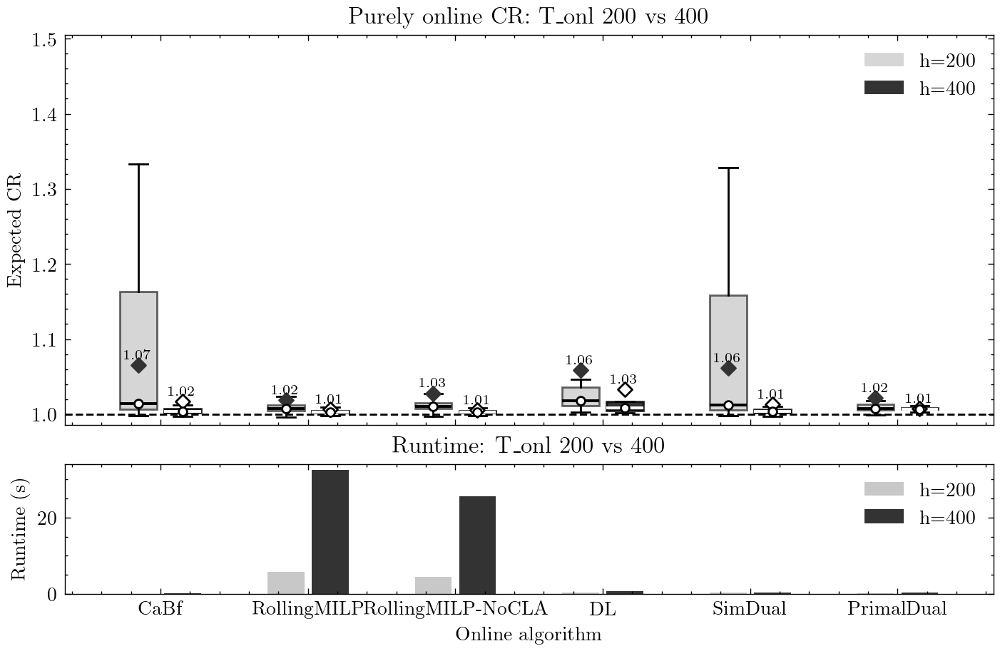

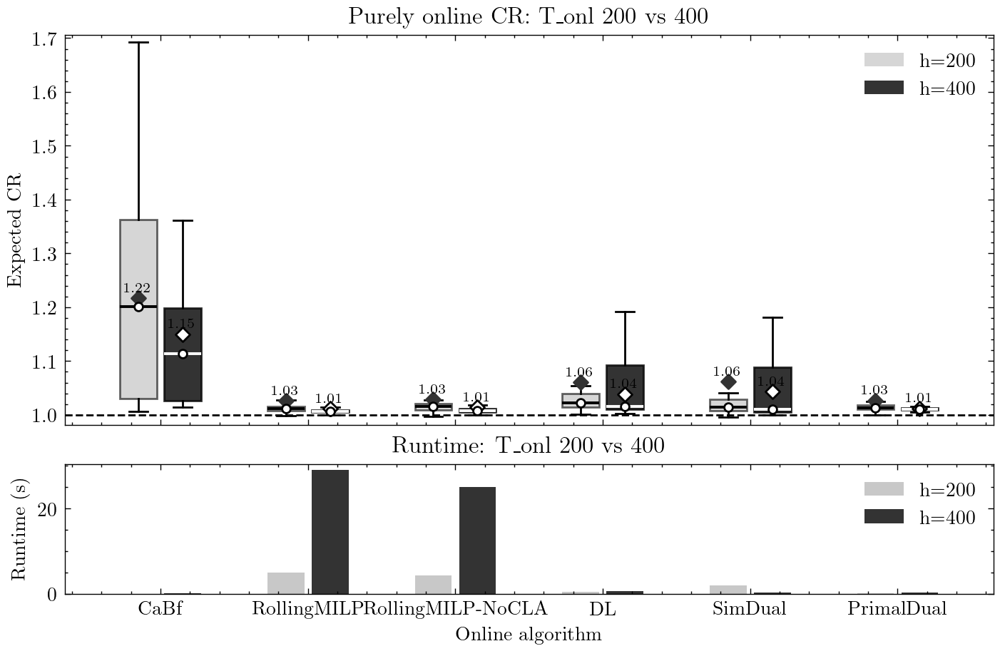

In [14]:
# FEAS_LOOP_BEGIN
df_eval_all = df_eval_master if "df_eval_master" in globals() and df_eval_master is not None else df_eval
df_opt_all = df_opt_master if "df_opt_master" in globals() and df_opt_master is not None else df_opt
df_per_seed_all = df_per_seed_master if "df_per_seed_master" in globals() and df_per_seed_master is not None else df_per_seed
FIG_DIR_BASE = FIG_DIR_ROOT
for feas in FEAS_TAGS:
    FIG_DIR = FIG_DIR_BASE / feas if FIGS_BY_FEAS else FIG_DIR_BASE
    FIG_DIR.mkdir(parents=True, exist_ok=True)
    df_eval = df_eval_all[df_eval_all["feasibility"] == feas].copy() if df_eval_all is not None else None
    df_opt = df_opt_all[df_opt_all["feasibility"] == feas].copy() if df_opt_all is not None else None
    df_per_seed = df_per_seed_all[df_per_seed_all["feasibility"] == feas].copy() if df_per_seed_all is not None else None
    if df_eval is not None and "scenario_base" in df_eval.columns:
        df_eval["scenario"] = df_eval["scenario_base"]
    if df_opt is not None and "scenario_base" in df_opt.columns:
        df_opt["scenario"] = df_opt["scenario_base"]
    if df_per_seed is not None and "scenario_base" in df_per_seed.columns:
        df_per_seed["scenario"] = df_per_seed["scenario_base"]
    # PHASE 1B: Purely online CR (T_onl 200 vs 400) + runtime for all online algorithms
    if df_per_seed is not None:
        offline_fail_statuses = {"INFEASIBLE", "INF_OR_UNBD", "UNBOUNDED"}
        online_fail_statuses = {"INFEASIBLE"}

        base_scenario = "baseline_midvar_off0_on100"
        long_scenario = "online_h400_off0_on400"

        df_online_all = df_per_seed[
            (df_per_seed["kind"] == "eval")
            & (df_per_seed["T_off"] == 0)
            & (df_per_seed["scenario"].isin([base_scenario, long_scenario]))
        ].copy()

        df_online_success = df_online_all[
            ~df_online_all["offline_status"].isin(offline_fail_statuses)
            & ~df_online_all["online_status"].isin(online_fail_statuses)
        ].copy()

        df_opt_all = df_per_seed[
            (df_per_seed["kind"] == "optimal")
            & (df_per_seed["T_off"] == 0)
            & (df_per_seed["scenario"].isin([base_scenario, long_scenario]))
        ].copy()
        df_opt_success = df_opt_all[~df_opt_all["status"].isin(offline_fail_statuses)].copy()
        df_opt_success = df_opt_success.rename(columns={"total_objective": "optimal_objective"})

        df_join = df_online_success.merge(
            df_opt_success[["scenario", "seed", "optimal_objective"]],
            on=["scenario", "seed"],
            how="left",
        )
        df_join = df_join[df_join["optimal_objective"].notna()]
        df_join = df_join[df_join["online_objective"].notna()]
        df_join["competitive_ratio"] = df_join["online_objective"] / df_join["optimal_objective"]

        online_order = ["CaBf", "RollingMILP", "RollingMILP-NoCLA", "DL", "SimDual", "PrimalDual"]
        df_join["online_short"] = pd.Categorical(
            df_join["online_short"], categories=online_order, ordered=True
        )
        df_join = df_join.sort_values(["online_short", "seed"])

        data_200 = []
        data_400 = []
        labels = []
        for algo in online_order:
            vals_200 = df_join[(df_join["online_short"] == algo) & (df_join["scenario"] == base_scenario)]["competitive_ratio"].dropna().values
            vals_400 = df_join[(df_join["online_short"] == algo) & (df_join["scenario"] == long_scenario)]["competitive_ratio"].dropna().values
            if len(vals_200) == 0 and len(vals_400) == 0:
                continue
            data_200.append(vals_200)
            data_400.append(vals_400)
            labels.append(algo)

        if labels:
            # Runtime stats for T_onl=200 and 400 (eval, all runs)
            runtime_stats = None
            if not df_online_all.empty and "online_runtime" in df_online_all.columns:
                runtime_stats = (
                    df_online_all[df_online_all["online_short"].isin(online_order)]
                    .groupby(["scenario", "online_short"])["online_runtime"]
                    .agg(mean_runtime="mean", std_runtime="std")
                )

            fig, (ax_box, ax_runtime) = plt.subplots(
                2, 1, figsize=(8.4, 5.6), sharex=True, gridspec_kw={"height_ratios": [3, 1]}
            )
            positions = np.arange(1, len(labels) + 1)
            width = 0.3
            pos_200 = positions - width / 2
            pos_400 = positions + width / 2

            ax_box.boxplot(
                data_200,
                positions=pos_200,
                widths=0.25,
                showfliers=False,
                patch_artist=True,
                boxprops=dict(facecolor="#bbbbbb", alpha=0.6),
                medianprops=dict(color="black", linewidth=1.4),
                whiskerprops=dict(color="black", linewidth=1.0),
                capprops=dict(color="black", linewidth=1.0),
            )
            ax_box.boxplot(
                data_400,
                positions=pos_400,
                widths=0.25,
                showfliers=False,
                patch_artist=True,
                boxprops=dict(facecolor="#000000", alpha=0.8),
                medianprops=dict(color="white", linewidth=1.4),
                whiskerprops=dict(color="black", linewidth=1.0),
                capprops=dict(color="black", linewidth=1.0),
            )

            ax_box.axhline(1.0, color="black", linestyle="--", linewidth=1)
            ax_box.set_title("Purely online CR: T_onl 200 vs 400")
            ax_box.set_ylabel("Expected CR")
            ax_box.tick_params(axis="x", labelbottom=False)
            legend_handles = [
                plt.Rectangle((0, 0), 1, 1, facecolor="#bbbbbb", alpha=0.6, edgecolor="none", label="h=200"),
                plt.Rectangle((0, 0), 1, 1, facecolor="#000000", alpha=0.8, edgecolor="none", label="h=400"),
            ]
            ax_box.legend(handles=legend_handles, loc="best", frameon=False)

            y_vals = []
            for arr in data_200 + data_400:
                y_vals.extend(list(arr))
            if y_vals:
                y_min = float(min(y_vals))
                y_max = float(max(y_vals))
                y_pad = 0.02 * (y_max - y_min) if y_max > y_min else 0.02 * max(1.0, abs(y_max))
                ax_box.set_ylim(y_min - y_pad, y_max + y_pad)
                y_offset = 0.01 * (y_max - y_min) if y_max > y_min else 0.01
                for pos, vals in zip(pos_200, data_200):
                    vals = np.array(vals, dtype=float)
                    vals = vals[~np.isnan(vals)]
                    if len(vals) == 0:
                        continue
                    mean_val = float(np.mean(vals))
                    median_val = float(np.median(vals))
                    ax_box.scatter(pos, mean_val, s=26, marker="D", color="#333333", zorder=3)
                    ax_box.scatter(pos, median_val, s=18, marker="o", facecolor="white", edgecolor="black", zorder=3)
                    ax_box.text(
                        pos,
                        mean_val + y_offset,
                        f"{mean_val:.2f}",
                        ha="center",
                        va="bottom",
                        fontsize=7,
                        color="black",
                    )
                for pos, vals in zip(pos_400, data_400):
                    vals = np.array(vals, dtype=float)
                    vals = vals[~np.isnan(vals)]
                    if len(vals) == 0:
                        continue
                    mean_val = float(np.mean(vals))
                    median_val = float(np.median(vals))
                    ax_box.scatter(pos, mean_val, s=26, marker="D", facecolor="white", edgecolor="black", zorder=3)
                    ax_box.scatter(pos, median_val, s=18, marker="o", facecolor="white", edgecolor="black", zorder=3)
                    ax_box.text(
                        pos,
                        mean_val + y_offset,
                        f"{mean_val:.2f}",
                        ha="center",
                        va="bottom",
                        fontsize=7,
                        color="black",
                    )

            # Runtime bars (200 vs 400)
            mean_rt_200 = [0.0] * len(labels)
            std_rt_200 = [0.0] * len(labels)
            mean_rt_400 = [0.0] * len(labels)
            std_rt_400 = [0.0] * len(labels)
            if runtime_stats is not None:
                for i, algo in enumerate(labels):
                    for scenario, mean_arr, std_arr in [
                        (base_scenario, mean_rt_200, std_rt_200),
                        (long_scenario, mean_rt_400, std_rt_400),
                    ]:
                        if (scenario, algo) in runtime_stats.index:
                            mean_arr[i] = float(runtime_stats.loc[(scenario, algo), "mean_runtime"])
                            std_val = runtime_stats.loc[(scenario, algo), "std_runtime"]
                            std_arr[i] = float(std_val) if not pd.isna(std_val) else 0.0

            ax_runtime.bar(pos_200, mean_rt_200, width=0.25, color="#bbbbbb", alpha=0.8, label="h=200")
            ax_runtime.bar(pos_400, mean_rt_400, width=0.25, color="#000000", alpha=0.8, label="h=400")
            ax_runtime.legend(loc="best", frameon=False)
            ax_runtime.set_ylabel("Runtime (s)")
            ax_runtime.set_xlabel("Online algorithm")
            ax_runtime.set_xticks(positions)
            ax_runtime.set_xticklabels(labels)
            ax_runtime.set_title("Runtime: T_onl 200 vs 400")

            fig.subplots_adjust(hspace=0.15, bottom=0.18)
            fig.savefig(FIG_DIR / f"online_cr_distribution_h200_h400_{feas}.pdf", dpi=200, bbox_inches="tight")
            plt.show()
        else:
            print("No data found for baseline_midvar_off0_on100 or online_h400_off0_on400")
df_eval = df_eval_all
df_opt = df_opt_all
df_per_seed = df_per_seed_all
# FEAS_LOOP_END


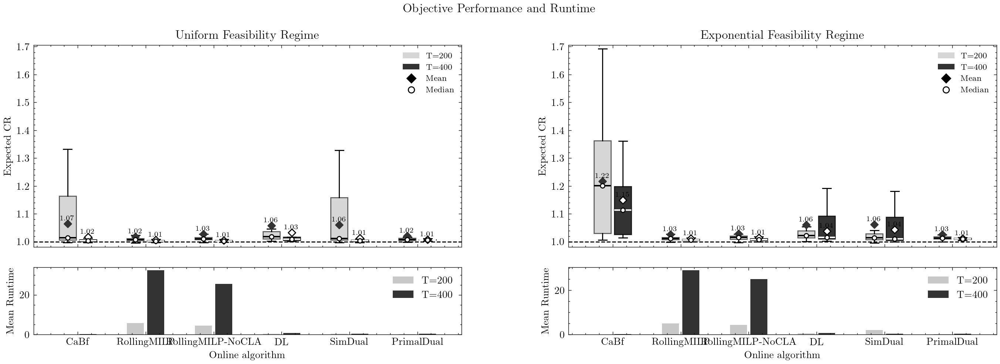

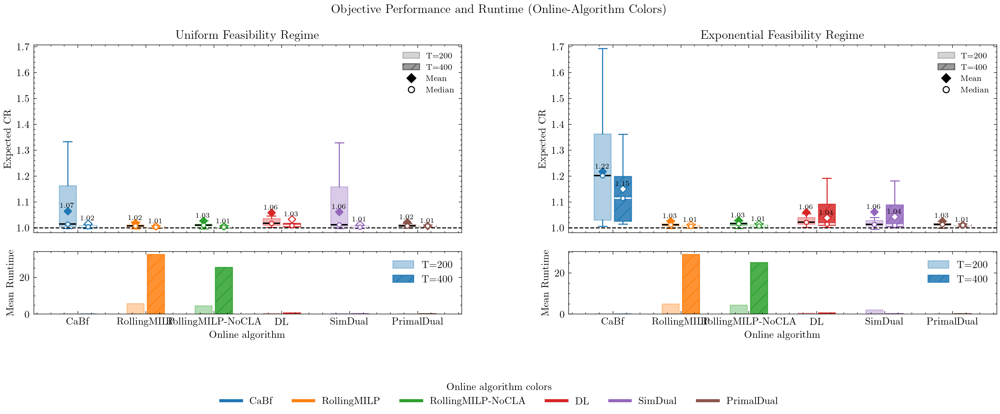

In [15]:
# Side-by-side plots for feasibility regimes (h=200 vs 400)
df_per_seed_all = df_per_seed_master if "df_per_seed_master" in globals() and df_per_seed_master is not None else df_per_seed
if df_per_seed_all is not None:
    offline_fail_statuses = {"INFEASIBLE", "INF_OR_UNBD", "UNBOUNDED"}
    online_fail_statuses = {"INFEASIBLE"}

    base_scenario = "baseline_midvar_off0_on100"
    long_scenario = "online_h400_off0_on400"
    online_order = ["CaBf", "RollingMILP", "RollingMILP-NoCLA", "DL", "SimDual", "PrimalDual"]

    feas_list = list(FEAS_TAGS)
    ncols = len(feas_list)
    fig, axes = plt.subplots(
        2, ncols, figsize=(8.4 * max(1, ncols), 5.6), sharex="col", gridspec_kw={"height_ratios": [3, 1]}
    )
    if ncols == 1:
        axes = np.array([[axes[0]], [axes[1]]])

    # Global y-range for CR boxes across all feas
    all_vals = []
    for feas in feas_list:
        df_per_seed = df_per_seed_all[df_per_seed_all["feasibility"] == feas].copy()
        if df_per_seed is None or df_per_seed.empty:
            continue
        if "scenario_base" in df_per_seed.columns:
            df_per_seed["scenario"] = df_per_seed["scenario_base"]
        df_online_all = df_per_seed[
            (df_per_seed["kind"] == "eval")
            & (df_per_seed["T_off"] == 0)
            & (df_per_seed["scenario"].isin([base_scenario, long_scenario]))
        ].copy()
        df_online_success = df_online_all[
            ~df_online_all["offline_status"].isin(offline_fail_statuses)
            & ~df_online_all["online_status"].isin(online_fail_statuses)
        ].copy()
        df_opt_all = df_per_seed[
            (df_per_seed["kind"] == "optimal")
            & (df_per_seed["T_off"] == 0)
            & (df_per_seed["scenario"].isin([base_scenario, long_scenario]))
        ].copy()
        df_opt_success = df_opt_all[~df_opt_all["status"].isin(offline_fail_statuses)].copy()
        df_opt_success = df_opt_success.rename(columns={"total_objective": "optimal_objective"})
        df_join = df_online_success.merge(
            df_opt_success[["scenario", "seed", "optimal_objective"]],
            on=["scenario", "seed"],
            how="left",
        )
        df_join = df_join[df_join["optimal_objective"].notna()]
        df_join = df_join[df_join["online_objective"].notna()]
        df_join["competitive_ratio"] = df_join["online_objective"] / df_join["optimal_objective"]
        for scenario in [base_scenario, long_scenario]:
            vals = df_join[df_join["scenario"] == scenario]["competitive_ratio"].dropna().values
            if len(vals):
                all_vals.extend(list(vals))

    if all_vals:
        global_y_min = float(min(all_vals))
        global_y_max = float(max(all_vals))
        global_y_pad = 0.02 * (global_y_max - global_y_min) if global_y_max > global_y_min else 0.02 * max(1.0, abs(global_y_max))
    else:
        global_y_min, global_y_max, global_y_pad = 0.0, 1.0, 0.02

    for col, feas in enumerate(feas_list):
        ax_box = axes[0, col]
        ax_runtime = axes[1, col]

        df_per_seed = df_per_seed_all[df_per_seed_all["feasibility"] == feas].copy()
        if df_per_seed is None or df_per_seed.empty:
            ax_box.set_title(f"{feas}: no data")
            ax_runtime.axis("off")
            continue
        if "scenario_base" in df_per_seed.columns:
            df_per_seed["scenario"] = df_per_seed["scenario_base"]

        df_online_all = df_per_seed[
            (df_per_seed["kind"] == "eval")
            & (df_per_seed["T_off"] == 0)
            & (df_per_seed["scenario"].isin([base_scenario, long_scenario]))
        ].copy()

        df_online_success = df_online_all[
            ~df_online_all["offline_status"].isin(offline_fail_statuses)
            & ~df_online_all["online_status"].isin(online_fail_statuses)
        ].copy()

        df_opt_all = df_per_seed[
            (df_per_seed["kind"] == "optimal")
            & (df_per_seed["T_off"] == 0)
            & (df_per_seed["scenario"].isin([base_scenario, long_scenario]))
        ].copy()
        df_opt_success = df_opt_all[~df_opt_all["status"].isin(offline_fail_statuses)].copy()
        df_opt_success = df_opt_success.rename(columns={"total_objective": "optimal_objective"})

        df_join = df_online_success.merge(
            df_opt_success[["scenario", "seed", "optimal_objective"]],
            on=["scenario", "seed"],
            how="left",
        )
        df_join = df_join[df_join["optimal_objective"].notna()]
        df_join = df_join[df_join["online_objective"].notna()]
        df_join["competitive_ratio"] = df_join["online_objective"] / df_join["optimal_objective"]

        df_join["online_short"] = pd.Categorical(
            df_join["online_short"], categories=online_order, ordered=True
        )
        df_join = df_join.sort_values(["online_short", "seed"])

        data_200 = []
        data_400 = []
        labels = []
        for algo in online_order:
            vals_200 = df_join[(df_join["online_short"] == algo) & (df_join["scenario"] == base_scenario)]["competitive_ratio"].dropna().values
            vals_400 = df_join[(df_join["online_short"] == algo) & (df_join["scenario"] == long_scenario)]["competitive_ratio"].dropna().values
            if len(vals_200) == 0 and len(vals_400) == 0:
                continue
            data_200.append(vals_200)
            data_400.append(vals_400)
            labels.append(algo)

        if not labels:
            ax_box.set_title(f"{feas}: no data for horizons 200/400")
            ax_runtime.axis("off")
            continue

        runtime_stats = None
        if not df_online_all.empty and "online_runtime" in df_online_all.columns:
            runtime_stats = (
                df_online_all[df_online_all["online_short"].isin(online_order)]
                .groupby(["scenario", "online_short"])["online_runtime"]
                .agg(mean_runtime="mean", std_runtime="std")
            )

        positions = np.arange(1, len(labels) + 1)
        width = 0.3
        pos_200 = positions - width / 2
        pos_400 = positions + width / 2

        ax_box.boxplot(
            data_200,
            positions=pos_200,
            widths=0.25,
            showfliers=False,
            patch_artist=True,
            boxprops=dict(facecolor="#bbbbbb", alpha=0.6),
            medianprops=dict(color="black", linewidth=1.4),
            whiskerprops=dict(color="black", linewidth=1.0),
            capprops=dict(color="black", linewidth=1.0),
        )
        ax_box.boxplot(
            data_400,
            positions=pos_400,
            widths=0.25,
            showfliers=False,
            patch_artist=True,
            boxprops=dict(facecolor="#000000", alpha=0.8),
            medianprops=dict(color="white", linewidth=1.4),
            whiskerprops=dict(color="black", linewidth=1.0),
            capprops=dict(color="black", linewidth=1.0),
        )

        ax_box.axhline(1.0, color="black", linestyle="--", linewidth=1)
        if feas == "uniform": 
            setting = "Uniform Feasibility Regime"
        else: 
            setting = "Exponential Feasibility Regime"
        ax_box.set_title(f"{setting}")
        ax_box.set_ylabel("Expected CR")
        ax_box.tick_params(axis="x", labelbottom=False)
        legend_handles = [
            plt.Rectangle((0, 0), 1, 1, facecolor="#bbbbbb", alpha=0.6, edgecolor="none", label="T=200"),
            plt.Rectangle((0, 0), 1, 1, facecolor="#000000", alpha=0.8, edgecolor="none", label="T=400"),
        ]
        mean_median_handles = [
            plt.Line2D([0], [0], marker="D", linestyle="None", color="black", label="Mean"),
            plt.Line2D([0], [0], marker="o", linestyle="None", markerfacecolor="white", markeredgecolor="black", label="Median"),
        ]
        ax_box.legend(
            handles=legend_handles + mean_median_handles,
            loc="upper right",
            frameon=False,
            fontsize=8,
        )

        y_vals = []
        for arr in data_200 + data_400:
            y_vals.extend(list(arr))
        if y_vals:
            ax_box.set_ylim(global_y_min - global_y_pad, global_y_max + global_y_pad)
            y_offset = 0.01 * (global_y_max - global_y_min) if global_y_max > global_y_min else 0.01
            for pos, vals in zip(pos_200, data_200):
                vals = np.array(vals, dtype=float)
                vals = vals[~np.isnan(vals)]
                if len(vals) == 0:
                    continue
                mean_val = float(np.mean(vals))
                median_val = float(np.median(vals))
                ax_box.scatter(pos, mean_val, s=26, marker="D", color="#333333", zorder=3)
                ax_box.scatter(pos, median_val, s=18, marker="o", facecolor="white", edgecolor="black", zorder=3)
                ax_box.text(
                    pos,
                    mean_val + y_offset,
                    f"{mean_val:.2f}",
                    ha="center",
                    va="bottom",
                    fontsize=7,
                    color="black",
                )
            for pos, vals in zip(pos_400, data_400):
                vals = np.array(vals, dtype=float)
                vals = vals[~np.isnan(vals)]
                if len(vals) == 0:
                    continue
                mean_val = float(np.mean(vals))
                median_val = float(np.median(vals))
                ax_box.scatter(pos, mean_val, s=26, marker="D", facecolor="white", edgecolor="black", zorder=3)
                ax_box.scatter(pos, median_val, s=18, marker="o", facecolor="white", edgecolor="black", zorder=3)
                ax_box.text(
                    pos,
                    mean_val + y_offset,
                    f"{mean_val:.2f}",
                    ha="center",
                    va="bottom",
                    fontsize=7,
                    color="black",
                )

        mean_rt_200 = [0.0] * len(labels)
        std_rt_200 = [0.0] * len(labels)
        mean_rt_400 = [0.0] * len(labels)
        std_rt_400 = [0.0] * len(labels)
        if runtime_stats is not None:
            for i, algo in enumerate(labels):
                for scenario, mean_arr, std_arr in [
                    (base_scenario, mean_rt_200, std_rt_200),
                    (long_scenario, mean_rt_400, std_rt_400),
                ]:
                    if (scenario, algo) in runtime_stats.index:
                        mean_arr[i] = float(runtime_stats.loc[(scenario, algo), "mean_runtime"])
                        std_val = runtime_stats.loc[(scenario, algo), "std_runtime"]
                        std_arr[i] = float(std_val) if not pd.isna(std_val) else 0.0

        ax_runtime.bar(pos_200, mean_rt_200, width=0.25, color="#bbbbbb", alpha=0.8, label="T=200")
        ax_runtime.bar(pos_400, mean_rt_400, width=0.25, color="#000000", alpha=0.8, label="T=400")
        ax_runtime.legend(loc="best", frameon=False)
        ax_runtime.set_ylabel("Mean Runtime")
        ax_runtime.set_xlabel("Online algorithm")
        ax_runtime.set_xticks(positions)
        ax_runtime.set_xticklabels(labels)
        #ax_runtime.set_title("Runtime")
    fig.suptitle('Objective Performance and Runtime')
    fig.subplots_adjust(wspace=0.25, hspace=0.15, bottom=0.18)
    fig.savefig(FIG_DIR_ROOT / "online_cr_distribution_h200_h400_all_feas.pdf", dpi=200, bbox_inches="tight")
    plt.show()


    # Additional variant: same comparison with consistent online-algorithm colors
    algo_colors = {algo: plt.cm.tab10(i % 10) for i, algo in enumerate(online_order)}

    fig_c, axes_c = plt.subplots(
        2, ncols, figsize=(8.4 * max(1, ncols), 5.6), sharex="col", gridspec_kw={"height_ratios": [3, 1]}
    )
    if ncols == 1:
        axes_c = np.array([[axes_c[0]], [axes_c[1]]])

    for col, feas in enumerate(feas_list):
        ax_box = axes_c[0, col]
        ax_runtime = axes_c[1, col]

        df_per_seed = df_per_seed_all[df_per_seed_all["feasibility"] == feas].copy()
        if df_per_seed is None or df_per_seed.empty:
            ax_box.set_title(f"{feas}: no data")
            ax_runtime.axis("off")
            continue
        if "scenario_base" in df_per_seed.columns:
            df_per_seed["scenario"] = df_per_seed["scenario_base"]

        df_online_all = df_per_seed[
            (df_per_seed["kind"] == "eval")
            & (df_per_seed["T_off"] == 0)
            & (df_per_seed["scenario"].isin([base_scenario, long_scenario]))
        ].copy()

        df_online_success = df_online_all[
            ~df_online_all["offline_status"].isin(offline_fail_statuses)
            & ~df_online_all["online_status"].isin(online_fail_statuses)
        ].copy()

        df_opt_all = df_per_seed[
            (df_per_seed["kind"] == "optimal")
            & (df_per_seed["T_off"] == 0)
            & (df_per_seed["scenario"].isin([base_scenario, long_scenario]))
        ].copy()
        df_opt_success = df_opt_all[~df_opt_all["status"].isin(offline_fail_statuses)].copy()
        df_opt_success = df_opt_success.rename(columns={"total_objective": "optimal_objective"})

        df_join = df_online_success.merge(
            df_opt_success[["scenario", "seed", "optimal_objective"]],
            on=["scenario", "seed"],
            how="left",
        )
        df_join = df_join[df_join["optimal_objective"].notna()]
        df_join = df_join[df_join["online_objective"].notna()]
        df_join["competitive_ratio"] = df_join["online_objective"] / df_join["optimal_objective"]

        df_join["online_short"] = pd.Categorical(
            df_join["online_short"], categories=online_order, ordered=True
        )
        df_join = df_join.sort_values(["online_short", "seed"])

        data_200 = []
        data_400 = []
        labels = []
        for algo in online_order:
            vals_200 = df_join[(df_join["online_short"] == algo) & (df_join["scenario"] == base_scenario)]["competitive_ratio"].dropna().values
            vals_400 = df_join[(df_join["online_short"] == algo) & (df_join["scenario"] == long_scenario)]["competitive_ratio"].dropna().values
            if len(vals_200) == 0 and len(vals_400) == 0:
                continue
            data_200.append(vals_200)
            data_400.append(vals_400)
            labels.append(algo)

        if not labels:
            ax_box.set_title(f"{feas}: no data for horizons 200/400")
            ax_runtime.axis("off")
            continue

        runtime_stats = None
        if not df_online_all.empty and "online_runtime" in df_online_all.columns:
            runtime_stats = (
                df_online_all[df_online_all["online_short"].isin(online_order)]
                .groupby(["scenario", "online_short"])["online_runtime"]
                .agg(mean_runtime="mean", std_runtime="std")
            )

        positions = np.arange(1, len(labels) + 1)
        width = 0.3
        pos_200 = positions - width / 2
        pos_400 = positions + width / 2

        bp_200 = ax_box.boxplot(
            data_200,
            positions=pos_200,
            widths=0.25,
            showfliers=False,
            patch_artist=True,
            medianprops=dict(color="black", linewidth=1.4),
            whiskerprops=dict(color="black", linewidth=1.0),
            capprops=dict(color="black", linewidth=1.0),
        )
        bp_400 = ax_box.boxplot(
            data_400,
            positions=pos_400,
            widths=0.25,
            showfliers=False,
            patch_artist=True,
            medianprops=dict(color="white", linewidth=1.4),
            whiskerprops=dict(color="black", linewidth=1.0),
            capprops=dict(color="black", linewidth=1.0),
        )

        for i, algo in enumerate(labels):
            color = algo_colors.get(algo, "C7")
            bp_200["boxes"][i].set(facecolor=color, edgecolor=color, alpha=0.35)
            bp_400["boxes"][i].set(facecolor=color, edgecolor=color, alpha=0.85, hatch="//")
            bp_200["medians"][i].set(color="black")
            bp_400["medians"][i].set(color="white")

            for w in (bp_200["whiskers"][2 * i], bp_200["whiskers"][2 * i + 1], bp_200["caps"][2 * i], bp_200["caps"][2 * i + 1]):
                w.set(color=color)
            for w in (bp_400["whiskers"][2 * i], bp_400["whiskers"][2 * i + 1], bp_400["caps"][2 * i], bp_400["caps"][2 * i + 1]):
                w.set(color=color)

        ax_box.axhline(1.0, color="black", linestyle="--", linewidth=1)
        if feas == "uniform":
            setting = "Uniform Feasibility Regime"
        else:
            setting = "Exponential Feasibility Regime"
        ax_box.set_title(f"{setting}")
        ax_box.set_ylabel("Expected CR")
        ax_box.tick_params(axis="x", labelbottom=False)

        style_handles = [
            plt.Rectangle((0, 0), 1, 1, facecolor="#888888", alpha=0.35, edgecolor="#555555", label="T=200"),
            plt.Rectangle((0, 0), 1, 1, facecolor="#888888", alpha=0.85, edgecolor="#555555", hatch="//", label="T=400"),
            plt.Line2D([0], [0], marker="D", linestyle="None", color="black", label="Mean"),
            plt.Line2D([0], [0], marker="o", linestyle="None", markerfacecolor="white", markeredgecolor="black", label="Median"),
        ]
        ax_box.legend(handles=style_handles, loc="upper right", frameon=False, fontsize=8)

        y_vals = []
        for arr in data_200 + data_400:
            y_vals.extend(list(arr))
        if y_vals:
            ax_box.set_ylim(global_y_min - global_y_pad, global_y_max + global_y_pad)
            y_offset = 0.01 * (global_y_max - global_y_min) if global_y_max > global_y_min else 0.01
            for pos, vals, algo in zip(pos_200, data_200, labels):
                vals = np.array(vals, dtype=float)
                vals = vals[~np.isnan(vals)]
                if len(vals) == 0:
                    continue
                mean_val = float(np.mean(vals))
                median_val = float(np.median(vals))
                color = algo_colors.get(algo, "#333333")
                ax_box.scatter(pos, mean_val, s=26, marker="D", color=color, zorder=3)
                ax_box.scatter(pos, median_val, s=18, marker="o", facecolor="white", edgecolor=color, zorder=3)
                ax_box.text(
                    pos,
                    mean_val + y_offset,
                    f"{mean_val:.2f}",
                    ha="center",
                    va="bottom",
                    fontsize=7,
                    color="black",
                )
            for pos, vals, algo in zip(pos_400, data_400, labels):
                vals = np.array(vals, dtype=float)
                vals = vals[~np.isnan(vals)]
                if len(vals) == 0:
                    continue
                mean_val = float(np.mean(vals))
                median_val = float(np.median(vals))
                color = algo_colors.get(algo, "#333333")
                ax_box.scatter(pos, mean_val, s=26, marker="D", facecolor="white", edgecolor=color, zorder=3)
                ax_box.scatter(pos, median_val, s=18, marker="o", facecolor="white", edgecolor=color, zorder=3)
                ax_box.text(
                    pos,
                    mean_val + y_offset,
                    f"{mean_val:.2f}",
                    ha="center",
                    va="bottom",
                    fontsize=7,
                    color="black",
                )

        mean_rt_200 = [0.0] * len(labels)
        std_rt_200 = [0.0] * len(labels)
        mean_rt_400 = [0.0] * len(labels)
        std_rt_400 = [0.0] * len(labels)
        if runtime_stats is not None:
            for i, algo in enumerate(labels):
                for scenario, mean_arr, std_arr in [
                    (base_scenario, mean_rt_200, std_rt_200),
                    (long_scenario, mean_rt_400, std_rt_400),
                ]:
                    if (scenario, algo) in runtime_stats.index:
                        mean_arr[i] = float(runtime_stats.loc[(scenario, algo), "mean_runtime"])
                        std_val = runtime_stats.loc[(scenario, algo), "std_runtime"]
                        std_arr[i] = float(std_val) if not pd.isna(std_val) else 0.0

        runtime_colors = [algo_colors.get(a, "C7") for a in labels]
        ax_runtime.bar(
            pos_200,
            mean_rt_200,
            width=0.25,
            color=runtime_colors,
            alpha=0.35,
            edgecolor=runtime_colors,
            label="T=200",
        )
        ax_runtime.bar(
            pos_400,
            mean_rt_400,
            width=0.25,
            color=runtime_colors,
            alpha=0.85,
            edgecolor=runtime_colors,
            hatch="//",
            label="T=400",
        )
        ax_runtime.legend(loc="best", frameon=False)
        ax_runtime.set_ylabel("Mean Runtime")
        ax_runtime.set_xlabel("Online algorithm")
        ax_runtime.set_xticks(positions)
        ax_runtime.set_xticklabels(labels)

    from matplotlib.lines import Line2D
    algo_handles = [Line2D([0], [0], color=algo_colors[a], lw=3, label=a) for a in online_order]
    fig_c.legend(
        handles=algo_handles,
        title="Online algorithm colors",
        loc="lower center",
        ncol=len(online_order),
        frameon=False,
        bbox_to_anchor=(0.5, -0.015),
    )

    fig_c.suptitle('Objective Performance and Runtime (Online-Algorithm Colors)')
    fig_c.subplots_adjust(wspace=0.25, hspace=0.15, bottom=0.23)
    fig_c.savefig(FIG_DIR_ROOT / "online_cr_distribution_h200_h400_all_feas_grouped_colors.pdf", dpi=200, bbox_inches="tight")
    plt.show()


<>:74: SyntaxWarning: invalid escape sequence '\%'
<>:74: SyntaxWarning: invalid escape sequence '\%'
/tmp/ipykernel_2067729/4021865654.py:74: SyntaxWarning: invalid escape sequence '\%'
  ax.set_ylabel("Failure rate (\%)")


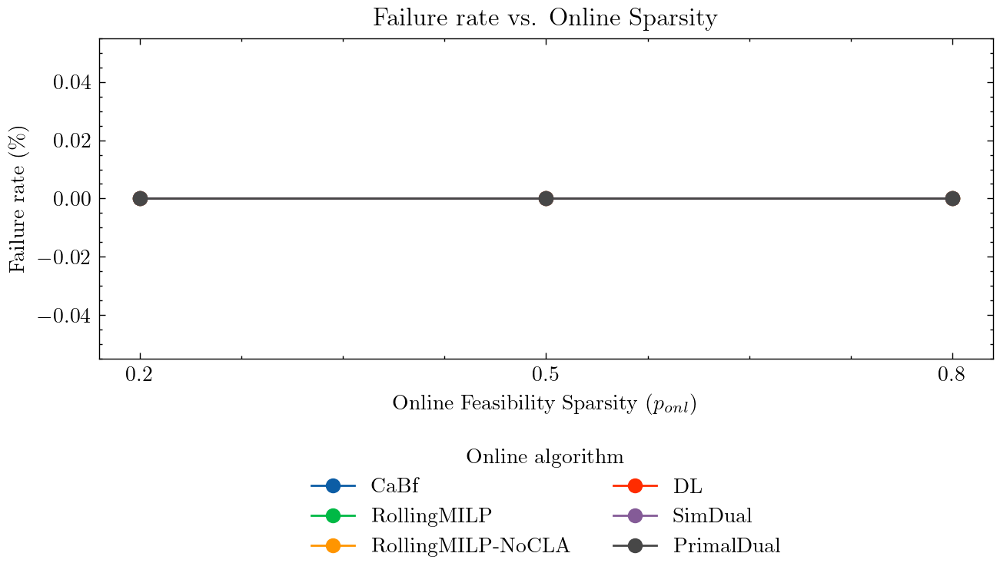

In [16]:
# FEAS_LOOP_BEGIN
df_eval_all = df_eval_master if "df_eval_master" in globals() and df_eval_master is not None else df_eval
df_opt_all = df_opt_master if "df_opt_master" in globals() and df_opt_master is not None else df_opt
df_per_seed_all = df_per_seed_master if "df_per_seed_master" in globals() and df_per_seed_master is not None else df_per_seed
FIG_DIR_BASE = FIG_DIR_ROOT
for feas in FEAS_TAGS:
    FIG_DIR = FIG_DIR_BASE / feas if FIGS_BY_FEAS else FIG_DIR_BASE
    FIG_DIR.mkdir(parents=True, exist_ok=True)
    df_eval = df_eval_all[df_eval_all["feasibility"] == feas].copy() if df_eval_all is not None else None
    df_opt = df_opt_all[df_opt_all["feasibility"] == feas].copy() if df_opt_all is not None else None
    df_per_seed = df_per_seed_all[df_per_seed_all["feasibility"] == feas].copy() if df_per_seed_all is not None else None
    if df_eval is not None and "scenario_base" in df_eval.columns:
        df_eval["scenario"] = df_eval["scenario_base"]
    if df_opt is not None and "scenario_base" in df_opt.columns:
        df_opt["scenario"] = df_opt["scenario_base"]
    if df_per_seed is not None and "scenario_base" in df_per_seed.columns:
        df_per_seed["scenario"] = df_per_seed["scenario_base"]
    if df_per_seed is not None and "scenario_base" not in df_per_seed.columns:
        df_per_seed["scenario_base"] = df_per_seed["scenario"].str.replace(f"_{feas}$", "", regex=True)
    if feas != "uniform":
        continue
    # Failure rates vs. online sparsity (p_onl) for purely online setting
    if df_per_seed is not None:
        offline_fail_statuses = {"INFEASIBLE", "INF_OR_UNBD", "UNBOUNDED"}
        online_fail_statuses = {"INFEASIBLE"}

        scenario_p_onl = {
            "graph_dense_off0_on100": 0.8,
            "graph_mid_off0_on100": 0.5,
            "graph_sparse_off0_on100": 0.2,
        }

        mask = (df_per_seed["kind"] == "eval") & (df_per_seed["scenario_base"].isin(scenario_p_onl))
        if "off_pct" in df_per_seed.columns:
            mask &= df_per_seed["off_pct"] == 0
        else:
            mask &= df_per_seed["T_off"] == 0

        df_graph = df_per_seed[mask].copy()

        if df_graph.empty:
            print("No graph sparsity scenarios found for off0_on100. Did you run family 3b?")
        else:
            df_graph["p_onl"] = df_graph["scenario_base"].map(scenario_p_onl)
            df_graph["failed"] = (
                df_graph["offline_status"].isin(offline_fail_statuses)
                | df_graph["online_status"].isin(online_fail_statuses)
            )

            online_order = ["CaBf", "RollingMILP", "RollingMILP-NoCLA", "DL", "SimDual", "PrimalDual"]
            df_graph = df_graph[df_graph["online_short"].isin(online_order)]

            grouped = (
                df_graph.groupby(["p_onl", "online_short"], dropna=False)["failed"]
                .mean()
                .reset_index()
                .sort_values(["online_short", "p_onl"])
            )

            fig, ax = plt.subplots(figsize=(7.5, 3.6))
            for algo in online_order:
                df_algo = grouped[grouped["online_short"] == algo]
                if df_algo.empty:
                    continue
                ax.plot(
                    df_algo["p_onl"],
                    df_algo["failed"] * 100.0,
                    marker="o",
                    label=algo,
                )

            ax.set_title("Failure rate vs. Online Sparsity")
            ax.set_xlabel("Online Feasibility Sparsity ($p_{onl}$)")
            ax.set_ylabel("Failure rate (\%)")
            ax.set_xticks(sorted(scenario_p_onl.values()))
            ax.legend(title="Online algorithm", ncol=2, loc="upper center", bbox_to_anchor=(0.5, -0.22))
            fig.subplots_adjust(bottom=0.3)
            fig.savefig(FIG_DIR / f"online_failure_rate_vs_ponl_{feas}.pdf", dpi=200, bbox_inches="tight")
            plt.show()
df_eval = df_eval_all
df_opt = df_opt_all
df_per_seed = df_per_seed_all
# FEAS_LOOP_END


In [17]:
# Detailed Failure Analysis
if df_per_seed is not None:
    offline_fail_statuses = {"INFEASIBLE", "INF_OR_UNBD", "UNBOUNDED"}
    online_fail_statuses = {"INFEASIBLE"}

    df_online_seed = df_per_seed[(df_per_seed["kind"] == "eval") & (df_per_seed["T_off"] == 0)].copy()
    if not df_online_seed.empty:
        df_online_seed["failed"] = (
            df_online_seed["offline_status"].isin(offline_fail_statuses)
            | df_online_seed["online_status"].isin(online_fail_statuses)
        )

        status_counts = (
            df_online_seed.groupby(["online_short", "online_status"], dropna=False)
            .size()
            .reset_index(name="count")
            .sort_values(["online_short", "count"], ascending=[True, False])
        )
        print("\nStatus Counts by Algorithm:")
        display(status_counts)

        failure_rates = (
            df_online_seed.groupby("online_short")["failed"]
            .agg(fail_rate="mean", total_runs="size")
            .reset_index()
            .sort_values("fail_rate", ascending=False)
        )
        print("\nFailure Rates:")
        display(failure_rates)

        scenario_failures = (
            df_online_seed[df_online_seed["failed"]]
            .groupby(["online_short", "scenario"], dropna=False)
            .size()
            .reset_index(name="fail_count")
            .sort_values("fail_count", ascending=False)
        )
        print("\nTop Failure Scenarios:")
        display(scenario_failures.head(20))


Status Counts by Algorithm:


,online_short,online_status,count
0,CaBf,COMPLETED,3500
1,DL,COMPLETED,3500
2,PrimalDual,COMPLETED,1500
3,RollingMILP,COMPLETED,2700
4,RollingMILP-NoCLA,COMPLETED,2300
5,SimDual,COMPLETED,3500



Failure Rates:


,online_short,fail_rate,total_runs
0,CaBf,0.0,3500
1,DL,0.0,3500
2,PrimalDual,0.0,1500
3,RollingMILP,0.0,2700
4,RollingMILP-NoCLA,0.0,2300
5,SimDual,0.0,3500



Top Failure Scenarios:


,online_short,scenario,fail_count


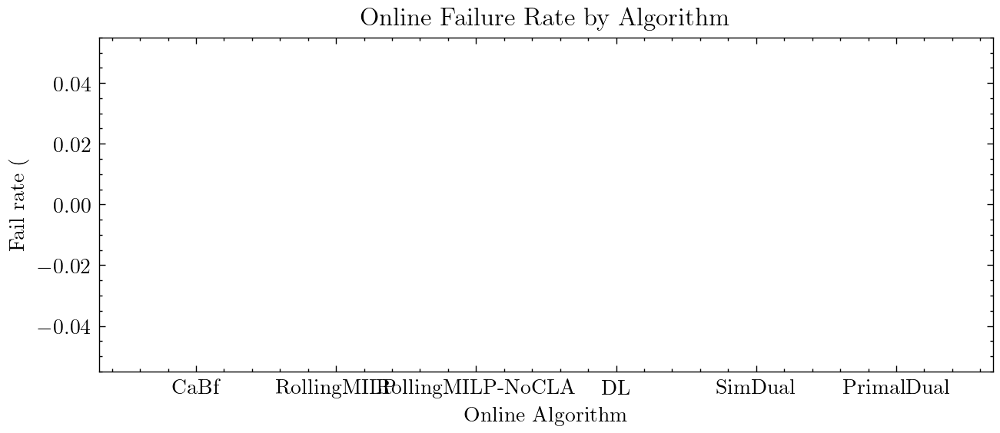

Online Failure Rate Statistics:


,online_short,fail_rate,total_runs
0,CaBf,0.0,1750
3,RollingMILP,0.0,1350
4,RollingMILP-NoCLA,0.0,1150
1,DL,0.0,1750
5,SimDual,0.0,1750
2,PrimalDual,0.0,750


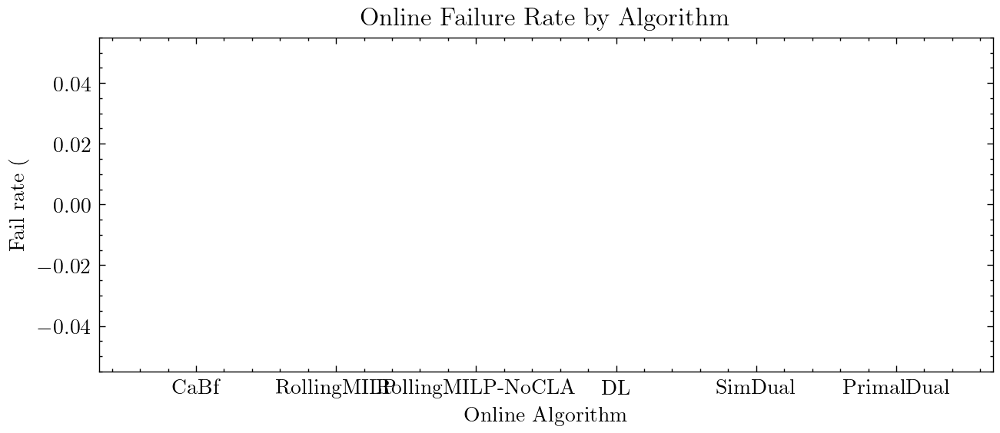

Online Failure Rate Statistics:


,online_short,fail_rate,total_runs
0,CaBf,0.0,1750
3,RollingMILP,0.0,1350
4,RollingMILP-NoCLA,0.0,1150
1,DL,0.0,1750
5,SimDual,0.0,1750
2,PrimalDual,0.0,750


In [18]:
# FEAS_LOOP_BEGIN
df_eval_all = df_eval_master if "df_eval_master" in globals() and df_eval_master is not None else df_eval
df_opt_all = df_opt_master if "df_opt_master" in globals() and df_opt_master is not None else df_opt
df_per_seed_all = df_per_seed_master if "df_per_seed_master" in globals() and df_per_seed_master is not None else df_per_seed
FIG_DIR_BASE = FIG_DIR_ROOT
for feas in FEAS_TAGS:
    FIG_DIR = FIG_DIR_BASE / feas if FIGS_BY_FEAS else FIG_DIR_BASE
    FIG_DIR.mkdir(parents=True, exist_ok=True)
    df_eval = df_eval_all[df_eval_all["feasibility"] == feas].copy() if df_eval_all is not None else None
    df_opt = df_opt_all[df_opt_all["feasibility"] == feas].copy() if df_opt_all is not None else None
    df_per_seed = df_per_seed_all[df_per_seed_all["feasibility"] == feas].copy() if df_per_seed_all is not None else None
    if df_eval is not None and "scenario_base" in df_eval.columns:
        df_eval["scenario"] = df_eval["scenario_base"]
    if df_opt is not None and "scenario_base" in df_opt.columns:
        df_opt["scenario"] = df_opt["scenario_base"]
    if df_per_seed is not None and "scenario_base" in df_per_seed.columns:
        df_per_seed["scenario"] = df_per_seed["scenario_base"]
    # PHASE 3: Online Failure Rate Analysis
    if df_per_seed is not None:
        offline_fail_statuses = {"INFEASIBLE", "INF_OR_UNBD", "UNBOUNDED"}
        online_fail_statuses = {"INFEASIBLE"}

        df_online_seed = df_per_seed[(df_per_seed["kind"] == "eval") & (df_per_seed["T_off"] == 0)].copy()
        if not df_online_seed.empty:
            df_online_seed["failed"] = (
                df_online_seed["offline_status"].isin(offline_fail_statuses)
                | df_online_seed["online_status"].isin(online_fail_statuses)
            )

            grouped = (
                df_online_seed.groupby("online_short", dropna=False)
                .agg(fail_rate=("failed", "mean"), total_runs=("failed", "size"))
                .reset_index()
            )

            online_order = ["CaBf", "RollingMILP", "RollingMILP-NoCLA", "DL", "SimDual", "PrimalDual"]
            grouped["online_short"] = pd.Categorical(
                grouped["online_short"], categories=online_order, ordered=True
            )
            grouped = grouped.sort_values("online_short").dropna(subset=["online_short"])

            if not grouped.empty:
                fig, ax = plt.subplots(figsize=(7.5, 3.2))
                positions = np.arange(len(grouped))

                ax.bar(positions, grouped["fail_rate"] * 100.0, color="black", alpha=0.8)
                ax.set_title("Online Failure Rate by Algorithm")
                ax.set_xlabel("Online Algorithm")
                ax.set_ylabel("Fail rate (%)")
                ax.set_xticks(positions)
                ax.set_xticklabels(grouped["online_short"])

                fig.subplots_adjust(bottom=0.2)
                fig.savefig(FIG_DIR / f"online_failure_rate_{feas}.pdf", dpi=200, bbox_inches="tight")
                plt.show()

                print("Online Failure Rate Statistics:")
                display(grouped)
df_eval = df_eval_all
df_opt = df_opt_all
df_per_seed = df_per_seed_all
# FEAS_LOOP_END


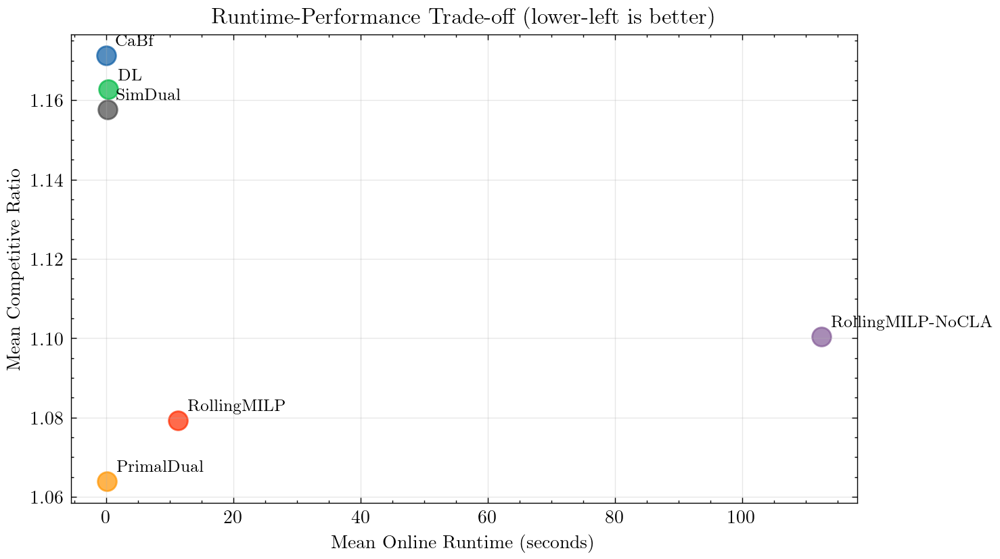


Runtime vs. Performance:


,online_short,mean_cr,mean_runtime,std_cr,std_runtime
2,PrimalDual,1.063874,0.176948,0.141072,0.059799
3,RollingMILP,1.079337,11.338777,0.160319,11.960675
4,RollingMILP-NoCLA,1.100483,112.486838,0.194503,300.946393
5,SimDual,1.157657,0.185318,0.273313,0.515363
1,DL,1.162700,0.365147,0.260698,0.192606
0,CaBf,1.171213,0.067640,0.276271,0.041084


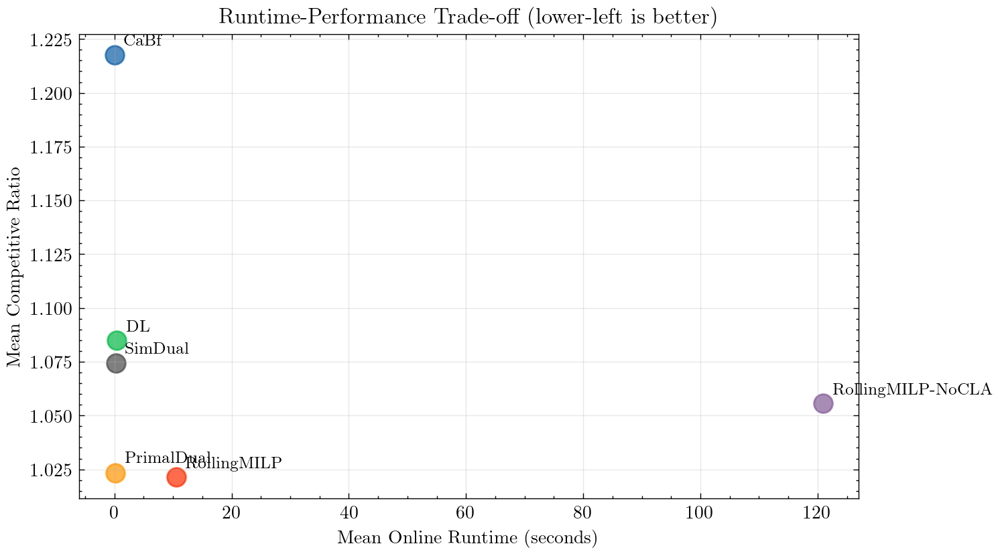


Runtime vs. Performance:


,online_short,mean_cr,mean_runtime,std_cr,std_runtime
3,RollingMILP,1.021331,10.496784,0.041799,10.286444
2,PrimalDual,1.023423,0.175781,0.040437,0.059016
4,RollingMILP-NoCLA,1.055715,120.942643,0.144353,321.840351
5,SimDual,1.074323,0.262356,0.150347,2.130372
1,DL,1.085028,0.365791,0.146386,0.537201
0,CaBf,1.217493,0.066172,0.210249,0.028659


In [19]:
# FEAS_LOOP_BEGIN
df_eval_all = df_eval_master if "df_eval_master" in globals() and df_eval_master is not None else df_eval
df_opt_all = df_opt_master if "df_opt_master" in globals() and df_opt_master is not None else df_opt
df_per_seed_all = df_per_seed_master if "df_per_seed_master" in globals() and df_per_seed_master is not None else df_per_seed
FIG_DIR_BASE = FIG_DIR_ROOT
for feas in FEAS_TAGS:
    FIG_DIR = FIG_DIR_BASE / feas if FIGS_BY_FEAS else FIG_DIR_BASE
    FIG_DIR.mkdir(parents=True, exist_ok=True)
    df_eval = df_eval_all[df_eval_all["feasibility"] == feas].copy() if df_eval_all is not None else None
    df_opt = df_opt_all[df_opt_all["feasibility"] == feas].copy() if df_opt_all is not None else None
    df_per_seed = df_per_seed_all[df_per_seed_all["feasibility"] == feas].copy() if df_per_seed_all is not None else None
    if df_eval is not None and "scenario_base" in df_eval.columns:
        df_eval["scenario"] = df_eval["scenario_base"]
    if df_opt is not None and "scenario_base" in df_opt.columns:
        df_opt["scenario"] = df_opt["scenario_base"]
    if df_per_seed is not None and "scenario_base" in df_per_seed.columns:
        df_per_seed["scenario"] = df_per_seed["scenario_base"]
    # Runtime vs. Performance Trade-off
    if df_per_seed is not None:
        offline_fail_statuses = {"INFEASIBLE", "INF_OR_UNBD", "UNBOUNDED"}
        online_fail_statuses = {"INFEASIBLE"}

        # Get purely online data (T_off = 0)
        df_online_only = df_per_seed[
            (df_per_seed["kind"] == "eval") & (df_per_seed["T_off"] == 0)
        ].copy()

        df_online_success = df_online_only[
            ~df_online_only["offline_status"].isin(offline_fail_statuses)
            & ~df_online_only["online_status"].isin(online_fail_statuses)
        ].copy()

        # Get optimal benchmarks
        df_opt_only = df_per_seed[
            (df_per_seed["kind"] == "optimal") & (df_per_seed["T_off"] == 0)
        ].copy()
        df_opt_success = df_opt_only[
            ~df_opt_only["status"].isin(offline_fail_statuses)
        ].copy()
        df_opt_success = df_opt_success.rename(columns={"total_objective": "optimal_objective"})

        # Merge and compute CR
        df_perf = df_online_success.merge(
            df_opt_success[["scenario", "seed", "optimal_objective"]],
            on=["scenario", "seed"],
            how="left",
        )
        df_perf = df_perf[df_perf["optimal_objective"].notna()]
        df_perf = df_perf[df_perf["online_objective"].notna()]
        df_perf["competitive_ratio"] = df_perf["online_objective"] / df_perf["optimal_objective"]

        # Aggregate by algorithm
        agg_perf = df_perf.groupby("online_short", dropna=False).agg(
            mean_cr=("competitive_ratio", "mean"),
            mean_runtime=("online_runtime", "mean"),
            std_cr=("competitive_ratio", "std"),
            std_runtime=("online_runtime", "std"),
        ).reset_index()

        # NO SIMBASE
        online_order = ["CaBf", "RollingMILP", "RollingMILP-NoCLA", "DL", "SimDual", "PrimalDual"]
        agg_perf = agg_perf[agg_perf["online_short"].isin(online_order)]

        if not agg_perf.empty:
            fig, ax = plt.subplots(figsize=(7.5, 4.5))

            for _, row in agg_perf.iterrows():
                ax.scatter(row["mean_runtime"], row["mean_cr"], s=100, alpha=0.7)
                ax.annotate(
                    row["online_short"],
                    (row["mean_runtime"], row["mean_cr"]),
                    xytext=(5, 5),
                    textcoords="offset points",
                    fontsize=9,
                )

            ax.set_xlabel("Mean Online Runtime (seconds)")
            ax.set_ylabel("Mean Competitive Ratio")
            ax.set_title("Runtime-Performance Trade-off (lower-left is better)")
            ax.grid(True, alpha=0.3)

            fig.savefig(FIG_DIR / f"runtime_vs_performance_{feas}.pdf", dpi=200, bbox_inches="tight")
            plt.show()

            print("\nRuntime vs. Performance:")
            display(agg_perf.sort_values("mean_cr"))
df_eval = df_eval_all
df_opt = df_opt_all
df_per_seed = df_per_seed_all
# FEAS_LOOP_END


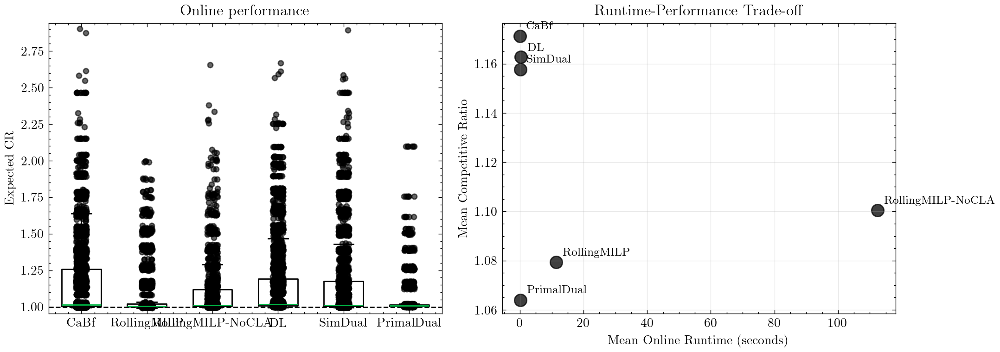

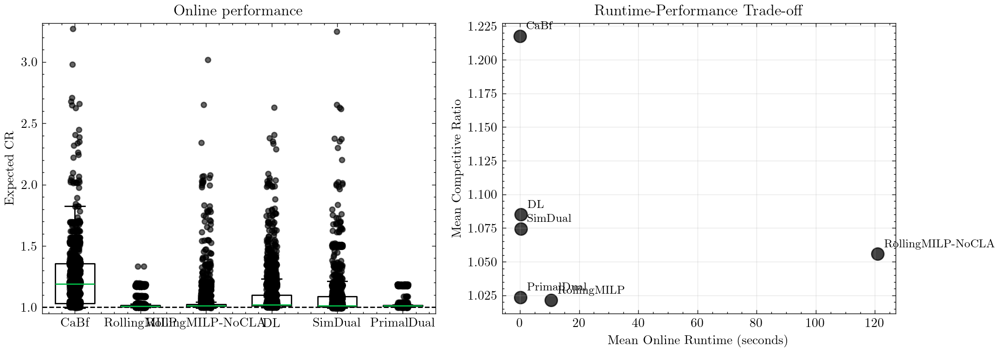

In [20]:
# FEAS_LOOP_BEGIN
df_eval_all = df_eval_master if "df_eval_master" in globals() and df_eval_master is not None else df_eval
df_opt_all = df_opt_master if "df_opt_master" in globals() and df_opt_master is not None else df_opt
df_per_seed_all = df_per_seed_master if "df_per_seed_master" in globals() and df_per_seed_master is not None else df_per_seed
FIG_DIR_BASE = FIG_DIR_ROOT
for feas in FEAS_TAGS:
    FIG_DIR = FIG_DIR_BASE / feas if FIGS_BY_FEAS else FIG_DIR_BASE
    FIG_DIR.mkdir(parents=True, exist_ok=True)
    df_eval = df_eval_all[df_eval_all["feasibility"] == feas].copy() if df_eval_all is not None else None
    df_opt = df_opt_all[df_opt_all["feasibility"] == feas].copy() if df_opt_all is not None else None
    df_per_seed = df_per_seed_all[df_per_seed_all["feasibility"] == feas].copy() if df_per_seed_all is not None else None
    if df_eval is not None and "scenario_base" in df_eval.columns:
        df_eval["scenario"] = df_eval["scenario_base"]
    if df_opt is not None and "scenario_base" in df_opt.columns:
        df_opt["scenario"] = df_opt["scenario_base"]
    if df_per_seed is not None and "scenario_base" in df_per_seed.columns:
        df_per_seed["scenario"] = df_per_seed["scenario_base"]
    # Combined view: Competitive Ratio Distribution + Runtime-Performance Trade-off
    if df_per_seed is not None:
        offline_fail_statuses = {"INFEASIBLE", "INF_OR_UNBD", "UNBOUNDED"}
        online_fail_statuses = {"INFEASIBLE"}

        # Purely online data
        df_online_all = df_per_seed[(df_per_seed["kind"] == "eval") & (df_per_seed["T_off"] == 0)].copy()
        df_online_success = df_online_all[
            ~df_online_all["offline_status"].isin(offline_fail_statuses)
            & ~df_online_all["online_status"].isin(online_fail_statuses)
        ].copy()

        df_opt_all = df_per_seed[(df_per_seed["kind"] == "optimal") & (df_per_seed["T_off"] == 0)].copy()
        df_opt_success = df_opt_all[~df_opt_all["status"].isin(offline_fail_statuses)].copy()
        df_opt_success = df_opt_success.rename(columns={"total_objective": "optimal_objective"})

        df_join = df_online_success.merge(
            df_opt_success[["scenario", "seed", "optimal_objective"]],
            on=["scenario", "seed"],
            how="left",
        )
        df_join = df_join[df_join["optimal_objective"].notna()]
        df_join = df_join[df_join["online_objective"].notna()]
        df_join["competitive_ratio"] = df_join["online_objective"] / df_join["optimal_objective"]

        online_order = ["CaBf", "RollingMILP", "RollingMILP-NoCLA", "DL", "SimDual", "PrimalDual"]
        df_join["online_short"] = pd.Categorical(
            df_join["online_short"], categories=online_order, ordered=True
        )
        df_join = df_join.sort_values(["online_short", "seed"])

        data = []
        labels = []
        for algo in online_order:
            vals = df_join[df_join["online_short"] == algo]["competitive_ratio"].dropna().values
            if len(vals) == 0:
                continue
            data.append(vals)
            labels.append(algo)

        # Runtime-performance aggregation
        df_perf = df_online_success.merge(
            df_opt_success[["scenario", "seed", "optimal_objective"]],
            on=["scenario", "seed"],
            how="left",
        )
        df_perf = df_perf[df_perf["optimal_objective"].notna()]
        df_perf = df_perf[df_perf["online_objective"].notna()]
        df_perf["competitive_ratio"] = df_perf["online_objective"] / df_perf["optimal_objective"]

        agg_perf = df_perf.groupby("online_short", dropna=False).agg(
            mean_cr=("competitive_ratio", "mean"),
            mean_runtime=("online_runtime", "mean"),
        ).reset_index()
        agg_perf = agg_perf[agg_perf["online_short"].isin(online_order)]

        if data and not agg_perf.empty:
            fig, (ax_box, ax_scatter) = plt.subplots(1, 2, figsize=(11.0, 4.0))

            # Left: competitive ratio distribution
            positions = np.arange(1, len(labels) + 1)
            ax_box.boxplot(data, positions=positions, widths=0.6, showfliers=False)
            rng = np.random.default_rng(0)
            for pos, vals in zip(positions, data):
                jitter = rng.uniform(-0.08, 0.08, size=len(vals))
                ax_box.scatter(pos + jitter, vals, s=16, alpha=0.6, color="black")
            ax_box.axhline(1.0, color="black", linestyle="--", linewidth=1)
            ax_box.set_title("Online performance")
            ax_box.set_ylabel("Expected CR")
            ax_box.set_xticks(positions)
            ax_box.set_xticklabels(labels, rotation=0)

            y_min = df_join["competitive_ratio"].min()
            y_max = df_join["competitive_ratio"].max()
            if pd.isna(y_min) or pd.isna(y_max):
                y_min, y_max = 0.0, 1.0
            y_pad = 0.02 * (y_max - y_min) if y_max > y_min else 0.02 * max(1.0, abs(y_max))
            ax_box.set_ylim(y_min - y_pad, y_max + y_pad)

            # Right: runtime vs performance
            for _, row in agg_perf.iterrows():
                ax_scatter.scatter(row["mean_runtime"], row["mean_cr"], s=90, alpha=0.75, color="black")
                ax_scatter.annotate(
                    row["online_short"],
                    (row["mean_runtime"], row["mean_cr"]),
                    xytext=(5, 5),
                    textcoords="offset points",
                    fontsize=9,
                )

            ax_scatter.set_xlabel("Mean Online Runtime (seconds)")
            ax_scatter.set_ylabel("Mean Competitive Ratio")
            ax_scatter.set_title("Runtime-Performance Trade-off")
            ax_scatter.grid(True, alpha=0.3)

            fig.tight_layout()
            fig.savefig(FIG_DIR / f"online_perf_runtime_combined_{feas}.pdf", dpi=200, bbox_inches="tight")
            plt.show()
df_eval = df_eval_all
df_opt = df_opt_all
df_per_seed = df_per_seed_all
# FEAS_LOOP_END


## 4. Hybrid Performance Analysis\n\nAnalyzing pipelines across varying offline/online splits and comparing failure rates.

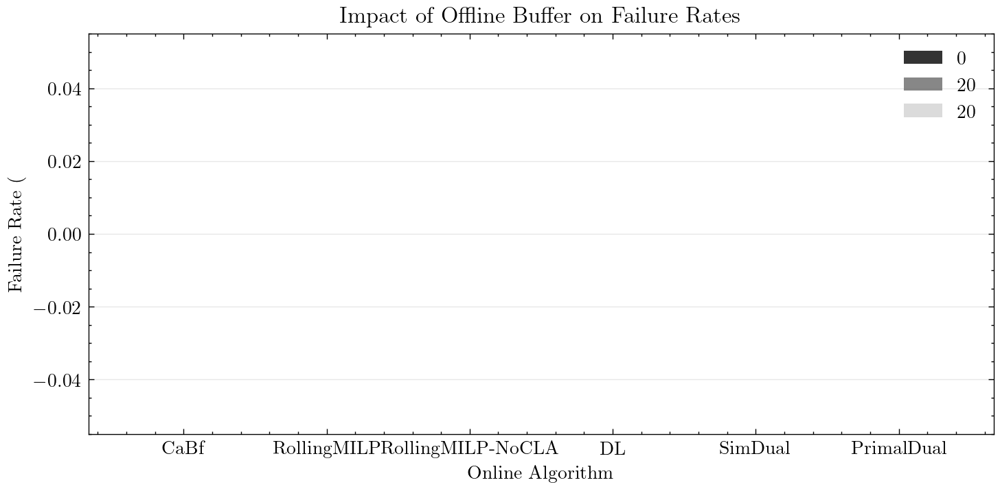


Failure Rate Reduction (0% → 20% offline):


,Algorithm,0% Offline,20% MILP,20% UtilDecr,Reduction (MILP),Reduction (UtilDecr)
online_short,,,,,,
CaBf,CaBf,0.0,0.0,0.0,0.0,0.0
RollingMILP,RollingMILP,0.0,0.0,0.0,0.0,0.0
RollingMILP-NoCLA,RollingMILP-NoCLA,0.0,0.0,0.0,0.0,0.0
DL,DL,0.0,0.0,0.0,0.0,0.0
SimDual,SimDual,0.0,0.0,0.0,0.0,0.0
PrimalDual,PrimalDual,0.0,0.0,0.0,0.0,0.0


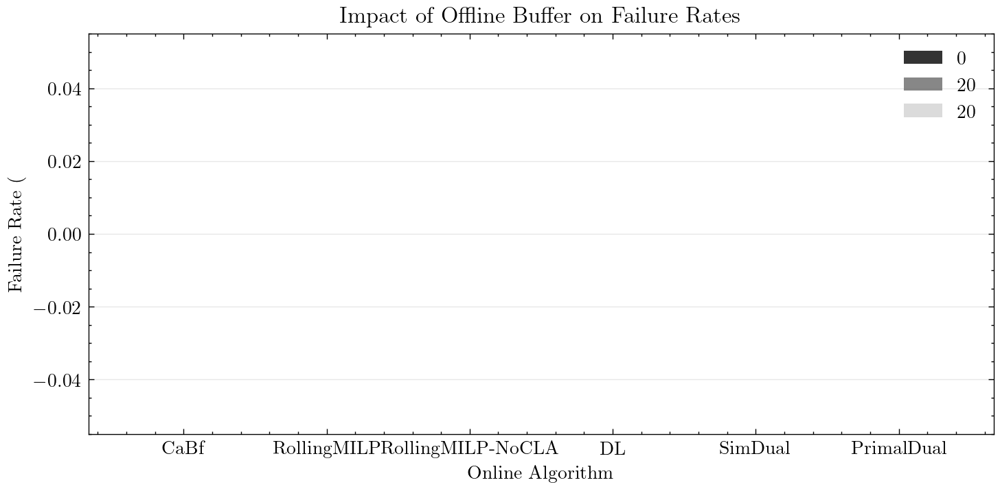


Failure Rate Reduction (0% → 20% offline):


,Algorithm,0% Offline,20% MILP,20% UtilDecr,Reduction (MILP),Reduction (UtilDecr)
online_short,,,,,,
CaBf,CaBf,0.0,0.0,0.0,0.0,0.0
RollingMILP,RollingMILP,0.0,0.0,0.0,0.0,0.0
RollingMILP-NoCLA,RollingMILP-NoCLA,0.0,0.0,0.0,0.0,0.0
DL,DL,0.0,0.0,0.0,0.0,0.0
SimDual,SimDual,0.0,0.0,0.0,0.0,0.0
PrimalDual,PrimalDual,0.0,0.0,0.0,0.0,0.0


In [21]:
# FEAS_LOOP_BEGIN
df_eval_all = df_eval_master if "df_eval_master" in globals() and df_eval_master is not None else df_eval
df_opt_all = df_opt_master if "df_opt_master" in globals() and df_opt_master is not None else df_opt
df_per_seed_all = df_per_seed_master if "df_per_seed_master" in globals() and df_per_seed_master is not None else df_per_seed
FIG_DIR_BASE = FIG_DIR_ROOT
for feas in FEAS_TAGS:
    FIG_DIR = FIG_DIR_BASE / feas if FIGS_BY_FEAS else FIG_DIR_BASE
    FIG_DIR.mkdir(parents=True, exist_ok=True)
    df_eval = df_eval_all[df_eval_all["feasibility"] == feas].copy() if df_eval_all is not None else None
    df_opt = df_opt_all[df_opt_all["feasibility"] == feas].copy() if df_opt_all is not None else None
    df_per_seed = df_per_seed_all[df_per_seed_all["feasibility"] == feas].copy() if df_per_seed_all is not None else None
    if df_eval is not None and "scenario_base" in df_eval.columns:
        df_eval["scenario"] = df_eval["scenario_base"]
    if df_opt is not None and "scenario_base" in df_opt.columns:
        df_opt["scenario"] = df_opt["scenario_base"]
    if df_per_seed is not None and "scenario_base" in df_per_seed.columns:
        df_per_seed["scenario"] = df_per_seed["scenario_base"]
    # PHASE 4: Failure Rate Comparison - 0% vs 20% Offline (MILP vs UtilDecr)
    if df_eval is not None and df_opt is not None:
        df_opt_key = df_opt[["scenario", "total_objective_mean"]].rename(
            columns={"total_objective_mean": "optimal_objective_mean"}
        )
        df_ratio_base_all = df_eval.merge(df_opt_key, on=["scenario"], how="left")

        df_baseline = df_ratio_base_all[df_ratio_base_all["family"] == "baseline"].copy()

        denom = df_baseline["T_off"].fillna(0) + df_baseline["T_onl"].fillna(0)
        df_baseline["offline_pct"] = (
            (df_baseline["T_off"] / denom) * 100
        ).where(denom > 0)

        if df_per_seed is not None:
            offline_fail_statuses = {"INFEASIBLE", "INF_OR_UNBD", "UNBOUNDED"}
            online_fail_statuses = {"INFEASIBLE"}
            df_fail_seed = df_per_seed[df_per_seed["kind"] == "eval"].copy()
            df_fail_seed["any_failed"] = (
                df_fail_seed["offline_status"].isin(offline_fail_statuses)
                | df_fail_seed["online_status"].isin(online_fail_statuses)
            )
            fail_agg = (
                df_fail_seed.groupby(["sweep", "run_id", "scenario", "pipeline"], dropna=False)
                .agg(
                    failure_count=("any_failed", "sum"),
                    seed_count_seed=("any_failed", "size"),
                )
                .reset_index()
            )
            df_baseline = df_baseline.merge(
                fail_agg, on=["sweep", "run_id", "scenario", "pipeline"], how="left"
            )
        else:
            print("No per-seed data; using aggregate failure counts (may overcount).")
            df_baseline["failure_count"] = (
                df_baseline["offline_failures"].fillna(0) + df_baseline["online_failures"].fillna(0)
            )
            df_baseline["seed_count_seed"] = df_baseline["seed_count"].fillna(0)

        df_baseline["failure_count"] = df_baseline["failure_count"].fillna(0)
        df_baseline["seed_count_seed"] = df_baseline["seed_count_seed"].fillna(0)

        # Filter to 0% and 20% offline
        df_comparison = df_baseline[df_baseline["offline_pct"].isin([0, 20])].copy()

        # Group by offline_pct, offline_short, AND online_short
        grouped = (
            df_comparison.groupby(["offline_pct", "offline_short", "online_short"], dropna=False)
            .agg(
                failure_count=("failure_count", "sum"),
                seed_count=("seed_count_seed", "sum"),
            )
            .reset_index()
        )

        grouped["failure_rate"] = grouped["failure_count"] / grouped["seed_count"].replace({0: pd.NA})

        # NO SIMBASE
        online_order = ["CaBf", "RollingMILP", "RollingMILP-NoCLA", "DL", "SimDual", "PrimalDual"]
        grouped = grouped[grouped["online_short"].isin(online_order)]

        # For 0% offline, all offline_short values are the same (no offline items)
        # So we just take the first one for each online algorithm
        df_0pct = grouped[grouped["offline_pct"] == 0].groupby("online_short").first().reset_index()
        df_0pct = df_0pct[["online_short", "failure_rate"]].rename(columns={"failure_rate": "0pct"})

        # For 20% offline, separate by offline solver
        df_20pct_milp = grouped[(grouped["offline_pct"] == 20) & (grouped["offline_short"] == "MILP")]
        df_20pct_milp = df_20pct_milp[["online_short", "failure_rate"]].rename(columns={"failure_rate": "20pct_milp"})

        df_20pct_util = grouped[(grouped["offline_pct"] == 20) & (grouped["offline_short"] == "UtilDecr")]
        df_20pct_util = df_20pct_util[["online_short", "failure_rate"]].rename(columns={"failure_rate": "20pct_util"})

        # Merge all three
        pivot = df_0pct.merge(df_20pct_milp, on="online_short", how="outer")
        pivot = pivot.merge(df_20pct_util, on="online_short", how="outer")
        pivot = pivot.set_index("online_short").reindex(online_order)

        if not pivot.empty:
            fig, ax = plt.subplots(figsize=(8.5, 4.0))

            x = np.arange(len(pivot))
            width = 0.25

            # Three bars per algorithm
            ax.bar(x - width, pivot["0pct"] * 100, width,
                   label="0% Offline (Pure Online)", color="black", alpha=0.8)
            ax.bar(x, pivot["20pct_milp"] * 100, width,
                   label="20% Offline (MILP)", color="dimgray", alpha=0.8)
            ax.bar(x + width, pivot["20pct_util"] * 100, width,
                   label="20% Offline (UtilDecr)", color="lightgray", alpha=0.8)

            ax.set_ylabel("Failure Rate (%)")
            ax.set_xlabel("Online Algorithm")
            ax.set_title("Impact of Offline Buffer on Failure Rates")
            ax.set_xticks(x)
            ax.set_xticklabels(pivot.index)
            ax.legend()
            ax.grid(True, axis='y', alpha=0.3)

            fig.subplots_adjust(bottom=0.15)
            fig.savefig(FIG_DIR / f"failure_comparison_0vs20_{feas}.pdf", dpi=200, bbox_inches="tight")
            plt.show()

            print("\nFailure Rate Reduction (0% → 20% offline):")
            reduction = pd.DataFrame({
                "Algorithm": pivot.index,
                "0% Offline": (pivot["0pct"] * 100).round(1),
                "20% MILP": (pivot["20pct_milp"] * 100).round(1),
                "20% UtilDecr": (pivot["20pct_util"] * 100).round(1),
                "Reduction (MILP)": ((pivot["0pct"] - pivot["20pct_milp"]) * 100).round(1),
                "Reduction (UtilDecr)": ((pivot["0pct"] - pivot["20pct_util"]) * 100).round(1),
            })
            display(reduction)
df_eval = df_eval_all
df_opt = df_opt_all
df_per_seed = df_per_seed_all
# FEAS_LOOP_END


In [22]:
# Create df_baseline_expected with ALL feasibility data
# ⚠ IMPORTANT: This cell must run AFTER Cell 5 and BEFORE cells that use df_baseline_expected

# Always use the master copies to ensure we have all data
if "df_eval_master" not in globals() or df_eval_master is None:
    print("⚠ ERROR: df_eval_master not found. Please run Cell 5 first!")
    df_baseline_expected = None
elif "df_opt_master" not in globals() or df_opt_master is None:
    print("⚠ ERROR: df_opt_master not found. Please run Cell 5 first!")
    df_baseline_expected = None
else:
    df_eval_src = df_eval_master
    df_opt_src = df_opt_master
    df_per_seed_src = df_per_seed_master if "df_per_seed_master" in globals() else None

    # Build per-seed CR (E[CR]) using df_per_seed_src
    if df_per_seed_src is None:
        print("⚠ Warning: df_per_seed_src not available; cannot compute E[CR] for baseline.")
        df_baseline_expected = pd.DataFrame()
    else:
        df_eval_use = df_per_seed_src[df_per_seed_src["kind"] == "eval"].copy()
        df_opt_use = df_per_seed_src[df_per_seed_src["kind"] == "optimal"].copy()
        if "scenario_base" not in df_eval_use.columns:
            df_eval_use["scenario_base"] = df_eval_use["scenario"]
        if "scenario_base" not in df_opt_use.columns:
            df_opt_use["scenario_base"] = df_opt_use["scenario"]

        offline_fail_statuses = {"INFEASIBLE", "INF_OR_UNBD", "UNBOUNDED"}
        online_fail_statuses = {"INFEASIBLE"}
        df_eval_use = df_eval_use[(~df_eval_use["offline_status"].isin(offline_fail_statuses)) & (~df_eval_use["online_status"].isin(online_fail_statuses))].copy()
        df_opt_use = df_opt_use[~df_opt_use["status"].isin(offline_fail_statuses)].copy()
        df_opt_use = df_opt_use.rename(columns={"total_objective": "optimal_objective"})
        # Deduplicate optimal rows (keep latest run_id)
        df_opt_use = df_opt_use.sort_values(["run_id"]).drop_duplicates(
            ["scenario_base", "feasibility", "seed"], keep="last"
        )

        df_ratio_seed_all = df_eval_use.merge(
            df_opt_use[["scenario_base", "feasibility", "seed", "optimal_objective"]],
            on=["scenario_base", "feasibility", "seed"],
            how="left",
            validate="many_to_one",
        )
        df_ratio_seed_all = df_ratio_seed_all[df_ratio_seed_all["optimal_objective"].notna()].copy()
        df_ratio_seed_all = df_ratio_seed_all[df_ratio_seed_all["total_objective"].notna()].copy()
        df_ratio_seed_all["competitive_ratio"] = df_ratio_seed_all["total_objective"] / df_ratio_seed_all["optimal_objective"]

        df_baseline = df_ratio_seed_all[df_ratio_seed_all["family"] == "baseline"].copy()
        denom = df_baseline["T_off"].fillna(0) + df_baseline["T_onl"].fillna(0)
        df_baseline["offline_pct"] = ((df_baseline["T_off"] / denom) * 100).where(denom > 0)

        # Failure counting (uses all eval seeds)
        df_fail_seed = df_per_seed_src[df_per_seed_src["kind"] == "eval"].copy()
        df_fail_seed["any_failed"] = (
            df_fail_seed["offline_status"].isin(offline_fail_statuses)
            | df_fail_seed["online_status"].isin(online_fail_statuses)
        )
        if "scenario_base" not in df_fail_seed.columns:
            df_fail_seed["scenario_base"] = df_fail_seed["scenario"]
        fail_agg = df_fail_seed.groupby(["sweep", "run_id", "scenario_base", "pipeline"], dropna=False).agg(
            failure_count=("any_failed", "sum"),
            seed_count_seed=("any_failed", "size"),
        ).reset_index()
        df_baseline = df_baseline.merge(fail_agg, on=["sweep", "run_id", "scenario_base", "pipeline"], how="left")

        df_baseline["failure_count"] = df_baseline["failure_count"].fillna(0)
        df_baseline["seed_count_seed"] = df_baseline["seed_count_seed"].fillna(0)

        grouped = df_baseline.groupby(["feasibility", "offline_pct", "offline_short", "online_short"], dropna=False).agg(
            expected_cr=("competitive_ratio", "mean"),
            failure_count=("failure_count", "sum"),
            seed_count=("seed_count_seed", "sum"),
        ).reset_index()
        grouped["failure_rate"] = grouped["failure_count"] / grouped["seed_count"].replace({0: pd.NA})

        df_baseline_expected = grouped.rename(columns={"offline_short": "offline_algorithm", "online_short": "online_algorithm"})[["feasibility", "offline_pct", "offline_algorithm", "online_algorithm", "expected_cr", "failure_rate"]]
        df_baseline_expected["offline_pct"] = df_baseline_expected["offline_pct"] .round(0).astype("Int64")

        print(f"✓ Created df_baseline_expected: {len(df_baseline_expected)} rows")
        print(f"  Feasibilities: {sorted(df_baseline_expected['feasibility'].unique())}")
        print(f"  Offline algorithms: {sorted(df_baseline_expected['offline_algorithm'].unique())}")
        print(f"  Online algorithms: {sorted(df_baseline_expected['online_algorithm'].unique())}")
        print(f"  Offline percentages: {sorted(df_baseline_expected['offline_pct'].dropna().unique())}")


✓ Created df_baseline_expected: 180 rows
  Feasibilities: ['expbin_a2', 'uniform']
  Offline algorithms: ['CaBfd', 'MILP', 'UtilDecr']
  Online algorithms: ['CaBf', 'DL', 'PrimalDual', 'RollingMILP', 'RollingMILP-NoCLA', 'SimDual']
  Offline percentages: [np.int64(0), np.int64(20), np.int64(40), np.int64(60), np.int64(80)]


In [23]:
# Debug Cell 20 merge
print("=== Debugging Cell 20 Merge ===")

if df_eval is not None and df_opt is not None:
    print(f"df_eval shape: {df_eval.shape}")
    print(f"df_opt shape: {df_opt.shape}")
    
    print(f"\ndf_eval scenario column sample:")
    print(df_eval[["sweep", "run_id", "scenario", "scenario_base", "feasibility"]].head())
    
    print(f"\ndf_opt scenario column sample:")
    print(df_opt[["sweep", "run_id", "scenario", "scenario_base", "feasibility", "total_objective_mean"]].head())
    
    # Test the merge
    df_opt_key = df_opt[["scenario_base", "total_objective_mean"]].rename(
        columns={"total_objective_mean": "optimal_objective_mean"}
    )
    df_test_merge = df_eval.merge(df_opt_key, on=["scenario_base"], how="left")
    
    print(f"\nAfter merge:")
    print(f"Rows with non-null optimal_objective_mean: {df_test_merge['optimal_objective_mean'].notna().sum()}")
    print(f"Rows with null optimal_objective_mean: {df_test_merge['optimal_objective_mean'].isna().sum()}")
    
    if df_test_merge['optimal_objective_mean'].isna().all():
        print("\n⚠️ MERGE FAILED on scenario_base - All values are NaN!")
        print("\nChecking scenario values:")
        print(f"Unique scenario_base in df_eval: {sorted(df_eval['scenario_base'].dropna().unique())}")
        print(f"Unique scenario_base in df_opt: {sorted(df_opt['scenario_base'].dropna().unique())}")


=== Debugging Cell 20 Merge ===
df_eval shape: (1715, 44)
df_opt shape: (119, 44)

df_eval scenario column sample:
                                  sweep           run_id  \
0  baseline_midvar_off0_on100_expbin_a2  20260223_124201   
1  baseline_midvar_off0_on100_expbin_a2  20260223_124201   
2  baseline_midvar_off0_on100_expbin_a2  20260223_124201   
3  baseline_midvar_off0_on100_expbin_a2  20260223_124201   
4  baseline_midvar_off0_on100_expbin_a2  20260223_124201   

                               scenario               scenario_base  \
0  baseline_midvar_off0_on100_expbin_a2  baseline_midvar_off0_on100   
1  baseline_midvar_off0_on100_expbin_a2  baseline_midvar_off0_on100   
2  baseline_midvar_off0_on100_expbin_a2  baseline_midvar_off0_on100   
3  baseline_midvar_off0_on100_expbin_a2  baseline_midvar_off0_on100   
4  baseline_midvar_off0_on100_expbin_a2  baseline_midvar_off0_on100   

  feasibility  
0   expbin_a2  
1   expbin_a2  
2   expbin_a2  
3   expbin_a2  
4   expbin_a2  



In [24]:
# Debug Cell 20 merge - UPDATED
print("=== Debugging Cell 20 Merge (using scenario_base) ===")

if df_eval is not None and df_opt is not None:
    print(f"df_eval shape: {df_eval.shape}")
    print(f"df_opt shape: {df_opt.shape}")
    
    print(f"\ndf_eval scenario_base column sample:")
    print(df_eval[["sweep", "run_id", "scenario", "scenario_base", "feasibility"]].head())
    
    print(f"\ndf_opt scenario_base column sample:")
    print(df_opt[["sweep", "run_id", "scenario", "scenario_base", "feasibility", "total_objective_mean"]].head())
    
    print(f"\nUnique scenario_base in df_eval: {sorted(df_eval['scenario_base'].dropna().unique())}")
    print(f"Unique scenario_base in df_opt: {sorted(df_opt['scenario_base'].dropna().unique())}")
    
    # Test the merge using scenario_base
    df_opt_key = df_opt[["scenario_base", "total_objective_mean"]].rename(
        columns={"total_objective_mean": "optimal_objective_mean"}
    )
    df_test_merge = df_eval.merge(df_opt_key, on=["scenario_base"], how="left")
    
    print(f"\nAfter merge on scenario_base:")
    print(f"Rows with non-null optimal_objective_mean: {df_test_merge['optimal_objective_mean'].notna().sum()}")
    print(f"Rows with null optimal_objective_mean: {df_test_merge['optimal_objective_mean'].isna().sum()}")


=== Debugging Cell 20 Merge (using scenario_base) ===
df_eval shape: (1715, 44)
df_opt shape: (119, 44)

df_eval scenario_base column sample:
                                  sweep           run_id  \
0  baseline_midvar_off0_on100_expbin_a2  20260223_124201   
1  baseline_midvar_off0_on100_expbin_a2  20260223_124201   
2  baseline_midvar_off0_on100_expbin_a2  20260223_124201   
3  baseline_midvar_off0_on100_expbin_a2  20260223_124201   
4  baseline_midvar_off0_on100_expbin_a2  20260223_124201   

                               scenario               scenario_base  \
0  baseline_midvar_off0_on100_expbin_a2  baseline_midvar_off0_on100   
1  baseline_midvar_off0_on100_expbin_a2  baseline_midvar_off0_on100   
2  baseline_midvar_off0_on100_expbin_a2  baseline_midvar_off0_on100   
3  baseline_midvar_off0_on100_expbin_a2  baseline_midvar_off0_on100   
4  baseline_midvar_off0_on100_expbin_a2  baseline_midvar_off0_on100   

  feasibility  
0   expbin_a2  
1   expbin_a2  
2   expbin_a2  
3   ex

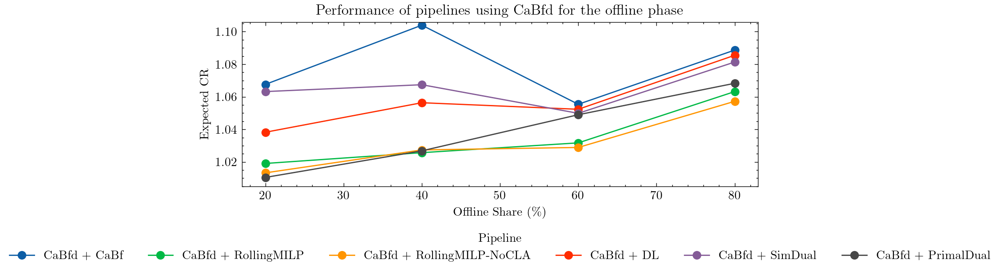

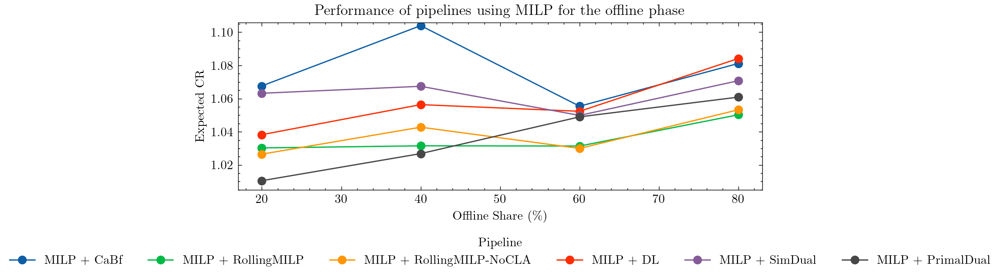

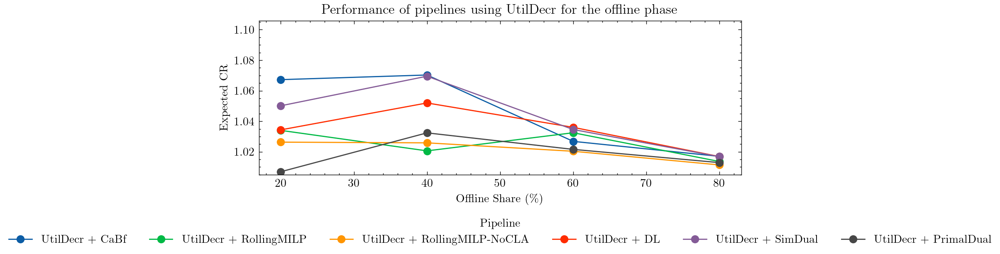

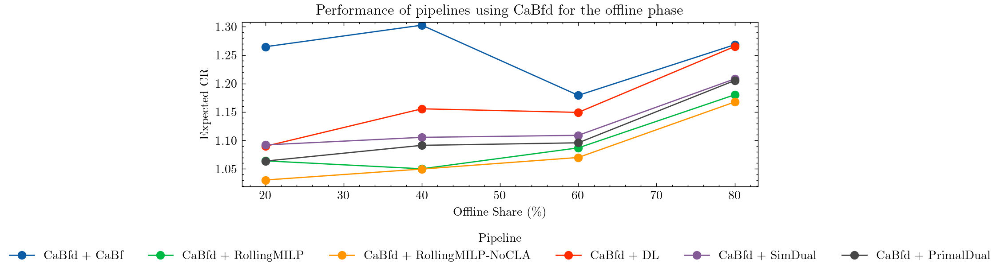

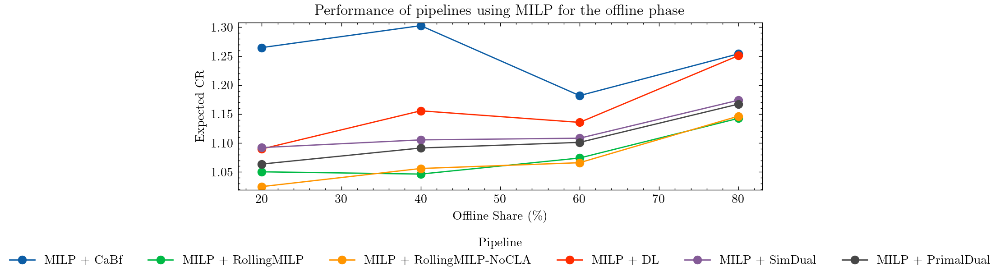

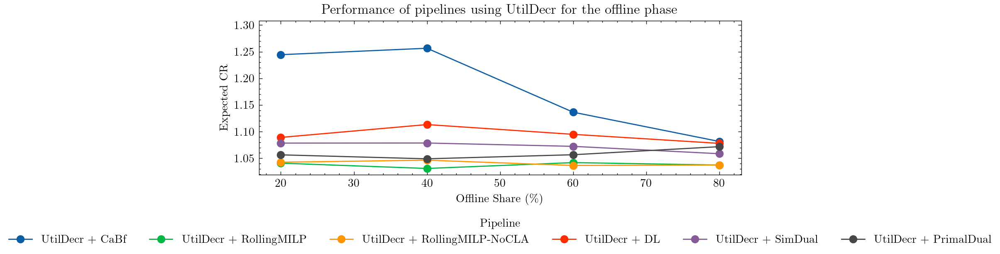

=== Debugging df_baseline_expected ===
df_baseline_expected exists: True

Shape: (180, 6)

Feasibility values: ['expbin_a2' 'uniform']

offline_pct values: [np.int64(0), np.int64(20), np.int64(40), np.int64(60), np.int64(80)]

First 10 rows:
  feasibility  offline_pct offline_algorithm   online_algorithm  expected_cr  \
0   expbin_a2            0             CaBfd               CaBf     1.217054   
1   expbin_a2            0             CaBfd                 DL     1.060087   
2   expbin_a2            0             CaBfd         PrimalDual     1.026666   
3   expbin_a2            0             CaBfd        RollingMILP     1.027976   
4   expbin_a2            0             CaBfd  RollingMILP-NoCLA     1.024351   
5   expbin_a2            0             CaBfd            SimDual     1.061722   
6   expbin_a2            0              MILP               CaBf     1.217054   
7   expbin_a2            0              MILP                 DL     1.060087   
8   expbin_a2            0            

In [25]:
# FEAS_LOOP_BEGIN
df_eval_all = df_eval_master if "df_eval_master" in globals() and df_eval_master is not None else df_eval
df_opt_all = df_opt_master if "df_opt_master" in globals() and df_opt_master is not None else df_opt
df_per_seed_all = df_per_seed_master if "df_per_seed_master" in globals() and df_per_seed_master is not None else df_per_seed
FIG_DIR_BASE = FIG_DIR_ROOT
for feas in FEAS_TAGS:
    FIG_DIR = FIG_DIR_BASE / feas if FIGS_BY_FEAS else FIG_DIR_BASE
    FIG_DIR.mkdir(parents=True, exist_ok=True)
    df_eval = df_eval_all[df_eval_all["feasibility"] == feas].copy() if df_eval_all is not None else None
    df_opt = df_opt_all[df_opt_all["feasibility"] == feas].copy() if df_opt_all is not None else None
    df_per_seed = df_per_seed_all[df_per_seed_all["feasibility"] == feas].copy() if df_per_seed_all is not None else None
    if df_eval is not None and "scenario_base" in df_eval.columns:
        df_eval["scenario"] = df_eval["scenario_base"]
    if df_opt is not None and "scenario_base" in df_opt.columns:
        df_opt["scenario"] = df_opt["scenario_base"]
    if df_per_seed is not None and "scenario_base" in df_per_seed.columns:
        df_per_seed["scenario"] = df_per_seed["scenario_base"]
    
    # Filter df_baseline_expected to current feasibility
    df_plot_data = df_baseline_expected[
        df_baseline_expected["feasibility"] == feas
    ].copy() if df_baseline_expected is not None else None
    # Performance vs. Offline Share (per offline solver)
    if df_plot_data is not None:
        df_plot = df_plot_data[
            df_plot_data["offline_pct"].gt(0).fillna(False)
        ].copy()

        offline_order = ["CaBfd", "MILP", "UtilDecr"]
        online_order = ["CaBf", "RollingMILP", "RollingMILP-NoCLA", "DL", "SimDual", "PrimalDual"]  # NO SIMBASE

        df_plot["offline_algorithm"] = pd.Categorical(
            df_plot["offline_algorithm"], categories=offline_order, ordered=True
        )
        df_plot["online_algorithm"] = pd.Categorical(
            df_plot["online_algorithm"], categories=online_order, ordered=True
        )
        df_plot = df_plot.sort_values(
            ["offline_algorithm", "online_algorithm", "offline_pct"]
        )

        y_min = df_plot["expected_cr"].min()
        y_max = df_plot["expected_cr"].max()
        if pd.isna(y_min) or pd.isna(y_max):
            y_min, y_max = 0.0, 1.0
        y_pad = 0.02 * (y_max - y_min) if y_max > y_min else 0.02 * max(1.0, abs(y_max))

        for offline in offline_order:
            df_sub = df_plot[df_plot["offline_algorithm"] == offline].copy()
            if df_sub.empty:
                continue

            df_sub["pipeline"] = (
                df_sub["offline_algorithm"].astype(str)
                + " + "
                + df_sub["online_algorithm"].astype(str)
            )

            fig, ax = plt.subplots(figsize=(7.5, 3.2))
            for pipeline, df_pipe in df_sub.groupby("pipeline", sort=False):
                ax.plot(
                    df_pipe["offline_pct"],
                    df_pipe["expected_cr"],
                    marker="o",
                    label=pipeline,
                )

            ax.set_title(f"Performance of pipelines using {offline} for the offline phase")
            ax.set_xlabel(r"Offline Share (\%)")
            ax.set_ylabel("Expected CR")
            ax.set_ylim(y_min - y_pad, y_max + y_pad)
            ncol = max(1, df_sub["pipeline"].nunique())
            ax.legend(
                title="Pipeline",
                ncol=ncol,
                loc="upper center",
                bbox_to_anchor=(0.5, -0.22),
            )
            fig.subplots_adjust(bottom=0.3)

            filename = f"hybrid_cr_{offline.lower()}_{feas}.pdf"
            fig.savefig(FIG_DIR / filename, dpi=200, bbox_inches="tight")
            plt.show()
df_eval = df_eval_all
df_opt = df_opt_all
df_per_seed = df_per_seed_all
# FEAS_LOOP_END
# Debug: Check df_baseline_expected
print("=== Debugging df_baseline_expected ===")
print(f"df_baseline_expected exists: {df_baseline_expected is not None}")

if df_baseline_expected is not None:
    print(f"\nShape: {df_baseline_expected.shape}")
    print(f"\nFeasibility values: {df_baseline_expected['feasibility'].unique()}")
    print(f"\noffline_pct values: {sorted(df_baseline_expected['offline_pct'].dropna().unique())}")
    print(f"\nFirst 10 rows:")
    print(df_baseline_expected.head(10))
    
    # Check for current feasibility
    feas = "uniform"  # or whichever you're viewing
    df_test = df_baseline_expected[df_baseline_expected["feasibility"] == feas]
    print(f"\n\nFiltered to {feas}: {len(df_test)} rows")
    if len(df_test) > 0:
        print(f"offline_pct values: {sorted(df_test['offline_pct'].dropna().unique())}")
        print(df_test.head())
    else:
        print("⚠️ No data for this feasibility!")
else:
    print("⚠️ df_baseline_expected is None!")
    print("\nCheck if Cell 20 ran successfully.")



<>:89: SyntaxWarning: invalid escape sequence '\%'
<>:89: SyntaxWarning: invalid escape sequence '\%'
/tmp/ipykernel_2067729/932985516.py:89: SyntaxWarning: invalid escape sequence '\%'
  ax.set_xlabel("Offline share (\%)")


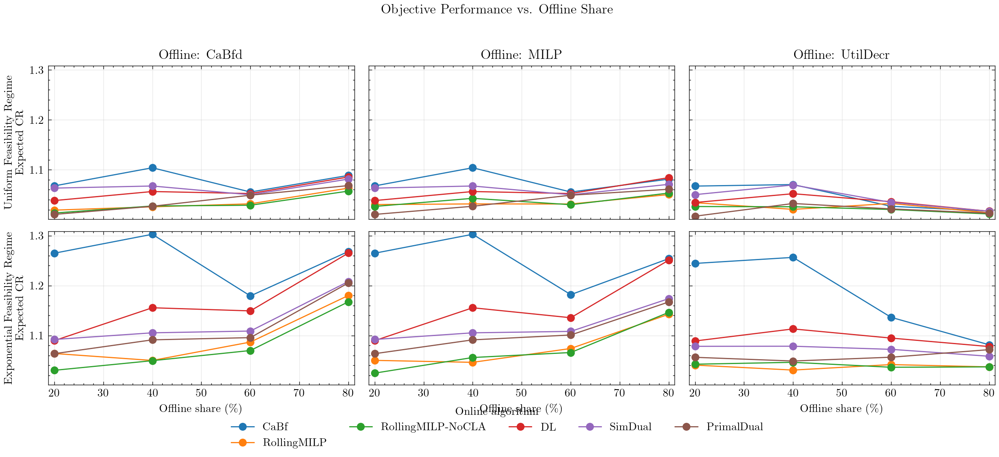

In [26]:
# Combined grid plot: offline solvers (rows) x feasibility variants (cols)
if df_baseline_expected is None:
    print("⚠ ERROR: df_baseline_expected not found. Please run Cell 23 first!")
else:
    df_plot = df_baseline_expected.copy()
    df_plot = df_plot[df_plot["offline_pct"].gt(0).fillna(False)].copy()
    if df_plot.empty:
        print("No data after filtering offline_pct > 0.")
    else:
        offline_order = ["CaBfd", "MILP", "UtilDecr"]
        online_order = ["CaBf", "RollingMILP", "RollingMILP-NoCLA", "DL", "SimDual", "PrimalDual"]
        feas_order = ["uniform", "expbin_a2"]

        df_plot["offline_algorithm"] = pd.Categorical(
            df_plot["offline_algorithm"], categories=offline_order, ordered=True
        )
        df_plot["online_algorithm"] = pd.Categorical(
            df_plot["online_algorithm"], categories=online_order, ordered=True
        )
        df_plot["feasibility"] = pd.Categorical(
            df_plot["feasibility"], categories=feas_order, ordered=True
        )

        y_min = df_plot["expected_cr"].min()
        y_max = df_plot["expected_cr"].max()
        if pd.isna(y_min) or pd.isna(y_max):
            y_min, y_max = 0.0, 1.0
        y_pad = 0.02 * (y_max - y_min) if y_max > y_min else 0.02 * max(1.0, abs(y_max))

        x_min = df_plot["offline_pct"].min()
        x_max = df_plot["offline_pct"].max()
        if pd.isna(x_min) or pd.isna(x_max):
            x_min, x_max = 0.0, 100.0
        x_pad = 0.02 * (x_max - x_min) if x_max > x_min else 1

        nrows = len(feas_order)
        ncols = len(offline_order)
        fig, axes = plt.subplots(
            nrows=nrows, ncols=ncols,
            figsize=(4.2 * ncols, 2.8 * nrows),
            sharex=True, sharey=True
        )

        # Ensure 2D axes array
        if nrows == 1 and ncols == 1:
            axes = np.array([[axes]])
        elif nrows == 1:
            axes = np.array([axes])
        elif ncols == 1:
            axes = np.array([[ax] for ax in axes])

        colors = {algo: plt.cm.tab10(i % 10) for i, algo in enumerate(online_order)}

        for r, feas in enumerate(feas_order):
            for c, offline in enumerate(offline_order):
                ax = axes[r, c]
                df_sub = df_plot[(df_plot["offline_algorithm"] == offline) & (df_plot["feasibility"] == feas)].copy()

                if df_sub.empty:
                    ax.set_title(f"{offline} (no data)" if r == 0 else "")
                    ax.grid(True, alpha=0.2)
                    ax.set_ylim(y_min - y_pad, y_max + y_pad)
                    ax.set_xlim(x_min - x_pad, x_max + x_pad)
                else:
                    for online in online_order:
                        df_on = df_sub[df_sub["online_algorithm"] == online]
                        if df_on.empty:
                            continue
                        ax.plot(
                            df_on["offline_pct"],
                            df_on["expected_cr"],
                            marker="o",
                            label=str(online),
                            color=colors[online],
                        )

                    if r == 0:
                        ax.set_title("Offline: " + str(offline))
                    ax.set_ylim(y_min - y_pad, y_max + y_pad)
                    ax.set_xlim(x_min - x_pad, x_max + x_pad)
                    ax.grid(True, alpha=0.3)
                if feas == "uniform": 
                    setting = "Uniform Feasibility Regime" 
                else: 
                    setting = "Exponential Feasibility Regime"
                if c == 0:
                    ax.set_ylabel(f"{setting}\nExpected CR")
                if r == nrows - 1:
                    ax.set_xlabel("Offline share (\%)")

        from matplotlib.lines import Line2D
        handles = [Line2D([0], [0], color=colors[a], marker="o", linestyle='-', label=a) for a in online_order]
        fig.legend(
            handles=handles,
            title="Online algorithm",
            ncol=min(5, len(handles)),
            loc="lower center",
            bbox_to_anchor=(0.5, -0.02),
        )

        fig.suptitle("Objective Performance vs. Offline Share")
        fig.tight_layout(rect=[0, 0.05, 1, 0.96])
        fig.savefig(FIG_DIR_ROOT / "hybrid_cr_grid_all_feas.pdf", dpi=200, bbox_inches="tight")
        plt.show()


/tmp/ipykernel_2067729/3518488266.py:56: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for online, df_on in df_sub.groupby("online_algorithm", sort=False):
/tmp/ipykernel_2067729/3518488266.py:56: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for online, df_on in df_sub.groupby("online_algorithm", sort=False):
/tmp/ipykernel_2067729/3518488266.py:56: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for online, df_on in df_s

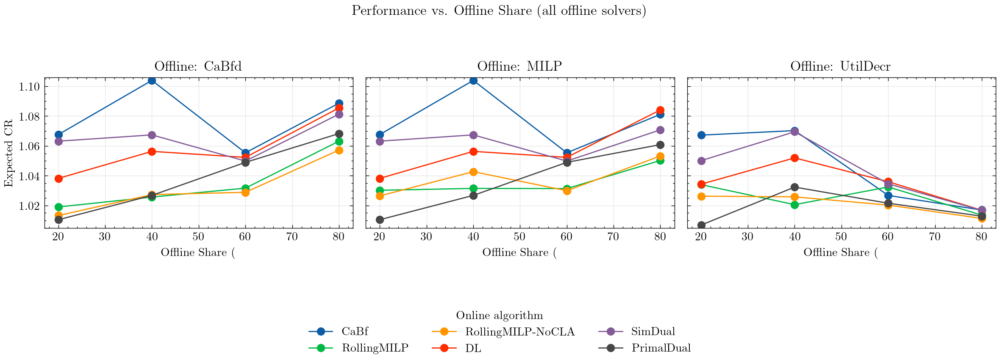

/tmp/ipykernel_2067729/3518488266.py:56: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for online, df_on in df_sub.groupby("online_algorithm", sort=False):
/tmp/ipykernel_2067729/3518488266.py:56: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for online, df_on in df_sub.groupby("online_algorithm", sort=False):
/tmp/ipykernel_2067729/3518488266.py:56: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for online, df_on in df_s

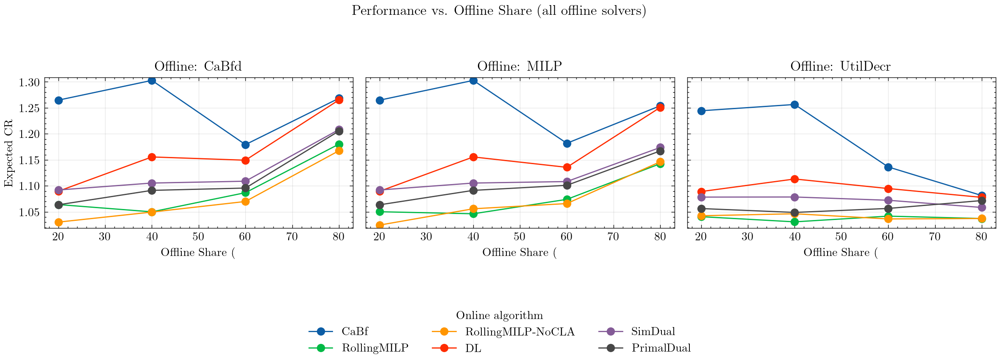

In [27]:
# FEAS_LOOP_BEGIN
df_eval_all = df_eval_master if "df_eval_master" in globals() and df_eval_master is not None else df_eval
df_opt_all = df_opt_master if "df_opt_master" in globals() and df_opt_master is not None else df_opt
df_per_seed_all = df_per_seed_master if "df_per_seed_master" in globals() and df_per_seed_master is not None else df_per_seed
FIG_DIR_BASE = FIG_DIR_ROOT
for feas in FEAS_TAGS:
    FIG_DIR = FIG_DIR_BASE / feas if FIGS_BY_FEAS else FIG_DIR_BASE
    FIG_DIR.mkdir(parents=True, exist_ok=True)
    df_eval = df_eval_all[df_eval_all["feasibility"] == feas].copy() if df_eval_all is not None else None
    df_opt = df_opt_all[df_opt_all["feasibility"] == feas].copy() if df_opt_all is not None else None
    df_per_seed = df_per_seed_all[df_per_seed_all["feasibility"] == feas].copy() if df_per_seed_all is not None else None
    if df_eval is not None and "scenario_base" in df_eval.columns:
        df_eval["scenario"] = df_eval["scenario_base"]
    if df_opt is not None and "scenario_base" in df_opt.columns:
        df_opt["scenario"] = df_opt["scenario_base"]
    if df_per_seed is not None and "scenario_base" in df_per_seed.columns:
        df_per_seed["scenario"] = df_per_seed["scenario_base"]
    
    # Filter df_baseline_expected to current feasibility
    df_plot_data = df_baseline_expected[
        df_baseline_expected["feasibility"] == feas
    ].copy() if df_baseline_expected is not None else None
    # Combined plot: Performance vs. Offline Share (all offline solvers)
    if df_plot_data is not None:
        df_plot = df_plot_data[
            df_plot_data["offline_pct"].gt(0).fillna(False)
        ].copy()

        offline_order = ["CaBfd", "MILP", "UtilDecr"]
        online_order = ["CaBf", "RollingMILP", "RollingMILP-NoCLA", "DL", "SimDual", "PrimalDual"]  # NO SIMBASE

        df_plot["offline_algorithm"] = pd.Categorical(
            df_plot["offline_algorithm"], categories=offline_order, ordered=True
        )
        df_plot["online_algorithm"] = pd.Categorical(
            df_plot["online_algorithm"], categories=online_order, ordered=True
        )
        df_plot = df_plot.sort_values(
            ["offline_algorithm", "online_algorithm", "offline_pct"]
        )

        y_min = df_plot["expected_cr"].min()
        y_max = df_plot["expected_cr"].max()
        if pd.isna(y_min) or pd.isna(y_max):
            y_min, y_max = 0.0, 1.0
        y_pad = 0.02 * (y_max - y_min) if y_max > y_min else 0.02 * max(1.0, abs(y_max))

        fig, axes = plt.subplots(1, 3, figsize=(12.0, 3.4), sharey=True)
        for ax, offline in zip(axes, offline_order):
            df_sub = df_plot[df_plot["offline_algorithm"] == offline].copy()
            if df_sub.empty:
                ax.set_title(f"{offline} (no data)")
                ax.axis("off")
                continue

            for online, df_on in df_sub.groupby("online_algorithm", sort=False):
                ax.plot(
                    df_on["offline_pct"],
                    df_on["expected_cr"],
                    marker="o",
                    label=str(online),
                )

            ax.set_title(f"Offline: {offline}")
            ax.set_xlabel("Offline Share (%)")
            ax.set_ylim(y_min - y_pad, y_max + y_pad)
            ax.grid(True, alpha=0.3)

        axes[0].set_ylabel("Expected CR")

        handles, labels = axes[0].get_legend_handles_labels()
        fig.legend(
            handles, labels,
            title="Online algorithm",
            ncol=min(3, len(labels)) if labels else 1,
            loc="upper center",
            bbox_to_anchor=(0.5, -0.05),
        )

        fig.suptitle("Performance vs. Offline Share (all offline solvers)")
        fig.tight_layout(rect=[0, 0.05, 1, 0.92])
        fig.savefig(FIG_DIR / f"hybrid_cr_all_offline_{feas}.pdf", dpi=200, bbox_inches="tight")
        plt.show()
df_eval = df_eval_all
df_opt = df_opt_all
df_per_seed = df_per_seed_all
# FEAS_LOOP_END


<>:70: SyntaxWarning: invalid escape sequence '\%'
<>:70: SyntaxWarning: invalid escape sequence '\%'
/tmp/ipykernel_2067729/199944488.py:70: SyntaxWarning: invalid escape sequence '\%'
  fig.suptitle("Residual Capacity Profile after Offline Phase (80\% Offline Share)")


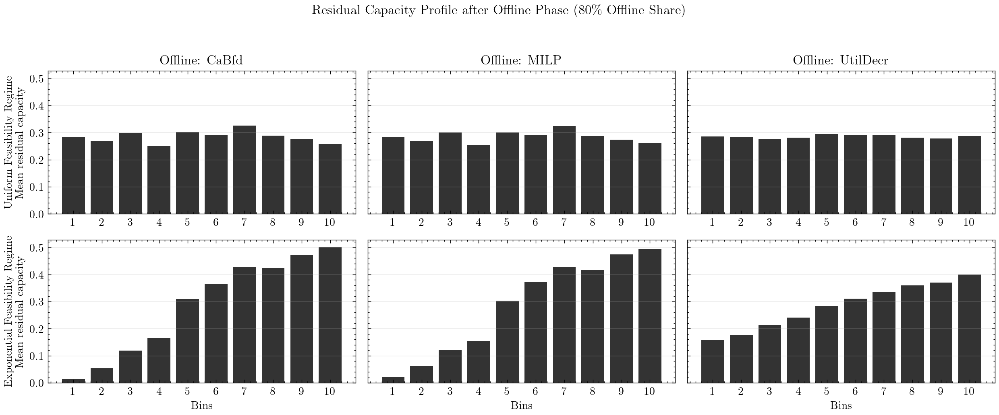

In [28]:
# Residual capacity profile per bin after offline phase (baseline, T_off = 160)
# Combined grid: rows = feasibility, cols = offline algorithm
if df_per_seed is None:
    print("No per-seed data available.")
else:
    df_res_all = df_per_seed[
        (df_per_seed["kind"] == "eval")
        & (df_per_seed["family"] == "baseline")
        & (df_per_seed["T_off"] == 160)
    ].copy()
    df_res_all = df_res_all[df_res_all["offline_util_per_bin"].notna()]

    if df_res_all.empty:
        print("No per-bin offline utilization data for baseline with T_off = 160")
    else:
        offline_order = ["CaBfd", "MILP", "UtilDecr"]
        feas_order = ["uniform", "expbin_a2"]

        # Compute grouped residuals per (feasibility, offline_short)
        grouped_by_feas = {}
        for feas in feas_order:
            df_res = df_res_all[df_res_all["feasibility"] == feas].copy()
            if df_res.empty:
                grouped_by_feas[feas] = None
                continue
            util_matrix = df_res["offline_util_per_bin"].apply(pd.Series)
            residual_matrix = 1.0 - util_matrix
            residual_matrix["offline_short"] = df_res["offline_short"].values
            grouped = residual_matrix.groupby("offline_short", dropna=False).mean(numeric_only=True)
            grouped_by_feas[feas] = grouped

        nrows = len(feas_order)
        ncols = len(offline_order)
        fig, axes = plt.subplots(nrows, ncols, figsize=(4.2 * ncols, 2.8 * nrows), sharey=True)

        # Ensure 2D axes array
        if nrows == 1 and ncols == 1:
            axes = np.array([[axes]])
        elif nrows == 1:
            axes = np.array([axes])
        elif ncols == 1:
            axes = np.array([[ax] for ax in axes])

        for r, feas in enumerate(feas_order):
            grouped = grouped_by_feas.get(feas)
            for c, algo in enumerate(offline_order):
                ax = axes[r, c]
                if grouped is None or algo not in grouped.index:
                    ax.set_title(f"{algo} (no data)" if r == 0 else "")
                    ax.axis("off")
                    continue

                values = grouped.loc[algo].values
                bins = np.arange(1, len(values) + 1)
                ax.bar(bins, values, color="black", alpha=0.8)
                if r == 0:
                    ax.set_title(f"Offline: {algo}")
                if c == 0:
                    if feas == "uniform": 
                        setting = "Uniform Feasibility Regime" 
                    else: 
                        setting = "Exponential Feasibility Regime"
                    ax.set_ylabel(f"{setting}\n Mean residual capacity")
                if r == nrows - 1:
                    ax.set_xlabel("Bins")
                ax.set_xticks(bins)
                ax.set_xticklabels(bins)
                ax.grid(True, axis="y", alpha=0.3)

        fig.suptitle("Residual Capacity Profile after Offline Phase (80\% Offline Share)")
        fig.tight_layout(rect=[0, 0.05, 1, 0.95])
        fig.savefig(FIG_DIR_ROOT / "offline_residual_profile_moff160_grid.pdf", dpi=200, bbox_inches="tight")
        plt.show()


In [29]:
# Failure Rate Table (Hybrid)
# NOTE: df_baseline_expected contains data for ALL feasibility variants.

if df_baseline_expected is not None:
    df_fail = df_baseline_expected[
        df_baseline_expected["offline_pct"].gt(0).fillna(False)
    ].copy()
    df_fail["pipeline"] = (
        df_fail["offline_algorithm"].astype(str)
        + " + "
        + df_fail["online_algorithm"].astype(str)
    )

    offline_order = ["CaBfd", "MILP", "UtilDecr"]
    online_order = ["CaBf", "RollingMILP", "RollingMILP-NoCLA", "DL", "SimDual", "PrimalDual"]  # NO SIMBASE
    pipeline_order = [f"{off} + {on}" for off in offline_order for on in online_order]

    df_fail_tbl = (
        df_fail.pivot_table(
            index="offline_pct",
            columns="pipeline",
            values="failure_rate",
            aggfunc="mean",
        )
        .reindex(columns=pipeline_order)
        .sort_index()
    )
    df_fail_tbl = (df_fail_tbl * 100.0).round(2)
    df_fail_tbl.index.name = r"Offline share (\%)"

    print("\nFailure Rates by Offline Share and Pipeline (%):")
    display(df_fail_tbl)

    # Save as LaTeX table
    latex_str = df_fail_tbl.to_latex(float_format="%.1f", na_rep="--")
    with open(FIG_DIR / "hybrid_failure_rates.tex", "w") as f:
        f.write(latex_str)
    print(f"\nSaved LaTeX table to {FIG_DIR / 'hybrid_failure_rates.tex'}")


Failure Rates by Offline Share and Pipeline (%):


pipeline,CaBfd + CaBf,CaBfd + RollingMILP,CaBfd + RollingMILP-NoCLA,CaBfd + DL,CaBfd + SimDual,CaBfd + PrimalDual,MILP + CaBf,MILP + RollingMILP,MILP + RollingMILP-NoCLA,MILP + DL,MILP + SimDual,MILP + PrimalDual,UtilDecr + CaBf,UtilDecr + RollingMILP,UtilDecr + RollingMILP-NoCLA,UtilDecr + DL,UtilDecr + SimDual,UtilDecr + PrimalDual
Offline share (\%),,,,,,,,,,,,,,,,,,
20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
40,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
60,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
80,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0



Saved LaTeX table to /u/halle/rsim/home_at/projects/Bachelorarbeit/outputs/bgap/analysis/figures/expbin_a2/hybrid_failure_rates.tex


## 5. Algorithm Comparison and Synthesis\n\nStatistical testing and Pareto frontier analysis.

In [30]:
# PHASE 5: Statistical Significance Testing
if df_per_seed is not None:
    from scipy.stats import wilcoxon
    from itertools import combinations

    offline_fail_statuses = {"INFEASIBLE", "INF_OR_UNBD", "UNBOUNDED"}
    online_fail_statuses = {"INFEASIBLE"}

    # Get purely online data
    df_online_all = df_per_seed[(df_per_seed["kind"] == "eval") & (df_per_seed["T_off"] == 0)].copy()
    df_online_success = df_online_all[
        ~df_online_all["offline_status"].isin(offline_fail_statuses)
        & ~df_online_all["online_status"].isin(online_fail_statuses)
    ].copy()

    # Get optimal benchmarks
    df_opt_all = df_per_seed[(df_per_seed["kind"] == "optimal") & (df_per_seed["T_off"] == 0)].copy()
    df_opt_success = df_opt_all[~df_opt_all["status"].isin(offline_fail_statuses)].copy()
    df_opt_success = df_opt_success.rename(columns={"total_objective": "optimal_objective"})

    # Merge and compute CR
    df_test = df_online_success.merge(
        df_opt_success[["scenario", "seed", "optimal_objective"]],
        on=["scenario", "seed"],
        how="left",
    )
    df_test = df_test[df_test["optimal_objective"].notna()]
    df_test = df_test[df_test["online_objective"].notna()]
    df_test["competitive_ratio"] = df_test["online_objective"] / df_test["optimal_objective"]

    # NO SIMBASE
    online_order = ["CaBf", "RollingMILP", "RollingMILP-NoCLA", "DL", "SimDual", "PrimalDual"]
    df_test = df_test[df_test["online_short"].isin(online_order)]

    # Perform pairwise Wilcoxon signed-rank tests
    algorithms = [algo for algo in online_order if algo in df_test["online_short"].unique()]
    p_values = pd.DataFrame(index=algorithms, columns=algorithms, dtype=float)

    pair_keys = ["scenario", "seed"]
    for algo1, algo2 in combinations(algorithms, 2):
        df1 = df_test[df_test["online_short"] == algo1]
        df2 = df_test[df_test["online_short"] == algo2]

        # Pair on shared (scenario, seed, run) so we compare like-for-like runs
        df_pair = df1.merge(
            df2[pair_keys + ["competitive_ratio"]],
            on=pair_keys,
            suffixes=("_1", "_2"),
            how="inner",
        )

        if len(df_pair) < 3:
            continue

        try:
            stat, pval = wilcoxon(
                df_pair["competitive_ratio_1"].values,
                df_pair["competitive_ratio_2"].values,
            )
            p_values.loc[algo1, algo2] = pval
            p_values.loc[algo2, algo1] = pval
        except Exception as e:
            print(f"Warning: Could not compute test for {algo1} vs {algo2}: {e}")

    # Diagonal is 1.0 (same algorithm)
    for algo in algorithms:
        p_values.loc[algo, algo] = 1.0

    print("\nPairwise Wilcoxon Signed-Rank Test (p-values):")
    print("Values < 0.05 indicate statistically significant difference")
    display(p_values.astype(float).round(4))

    # Highlight significant differences (p < 0.05)
    print("\nSignificant pairwise differences (p < 0.05):")
    sig_pairs = []
    for algo1, algo2 in combinations(algorithms, 2):
        pval = p_values.loc[algo1, algo2]
        if pd.notna(pval) and pval < 0.05:
            # Determine which is better
            mean1 = df_test[df_test["online_short"] == algo1]["competitive_ratio"].mean()
            mean2 = df_test[df_test["online_short"] == algo2]["competitive_ratio"].mean()
            better = algo1 if mean1 < mean2 else algo2
            sig_pairs.append({
                "Comparison": f"{algo1} vs {algo2}",
                "p-value": round(pval, 4),
                "Better": better
            })

    if sig_pairs:
        display(pd.DataFrame(sig_pairs))
    else:
        print("No significant pairwise differences found.")



Pairwise Wilcoxon Signed-Rank Test (p-values):
Values < 0.05 indicate statistically significant difference


,CaBf,RollingMILP,RollingMILP-NoCLA,DL,SimDual,PrimalDual
CaBf,1.0,0.0,0.0,0.0,0.0,0.0
RollingMILP,0.0,1.0,0.0,0.0,0.0,0.0
RollingMILP-NoCLA,0.0,0.0,1.0,0.0,0.0,0.0
DL,0.0,0.0,0.0,1.0,0.0,0.0
SimDual,0.0,0.0,0.0,0.0,1.0,0.0
PrimalDual,0.0,0.0,0.0,0.0,0.0,1.0



Significant pairwise differences (p < 0.05):


,Comparison,p-value,Better
0,CaBf vs RollingMILP,0.0,RollingMILP
1,CaBf vs RollingMILP-NoCLA,0.0,RollingMILP-NoCLA
2,CaBf vs DL,0.0,DL
3,CaBf vs SimDual,0.0,SimDual
4,CaBf vs PrimalDual,0.0,PrimalDual
5,RollingMILP vs RollingMILP-NoCLA,0.0,RollingMILP
6,RollingMILP vs DL,0.0,RollingMILP
7,RollingMILP vs SimDual,0.0,RollingMILP
8,RollingMILP vs PrimalDual,0.0,PrimalDual
9,RollingMILP-NoCLA vs DL,0.0,RollingMILP-NoCLA


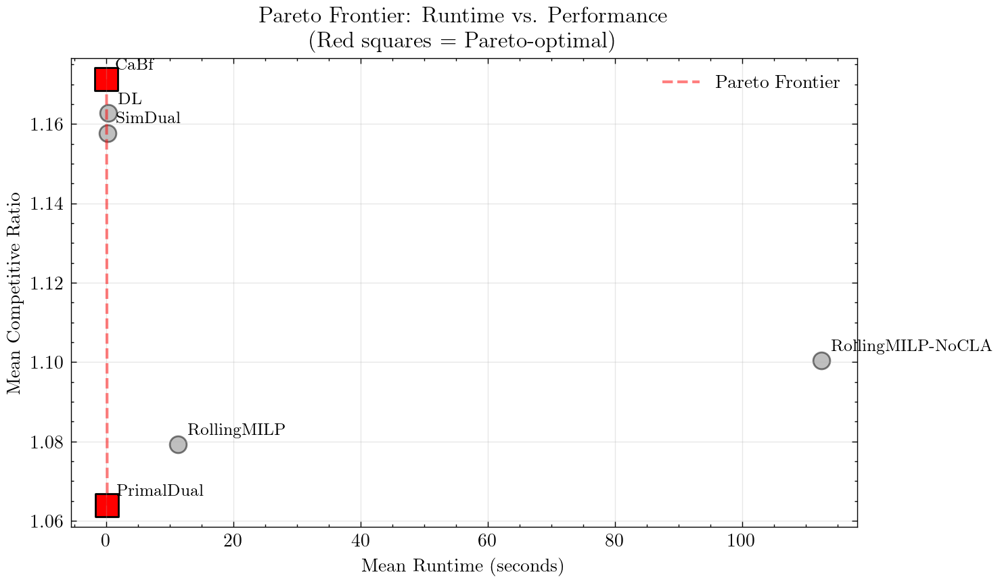


Pareto-Optimal Algorithms:


,online_short,mean_cr,mean_runtime
2,PrimalDual,1.063874,0.176948
0,CaBf,1.171213,0.067640



Dominated Algorithms:


,online_short,mean_cr,mean_runtime
3,RollingMILP,1.079337,11.338777
4,RollingMILP-NoCLA,1.100483,112.486838
5,SimDual,1.157657,0.185318
1,DL,1.162700,0.365147


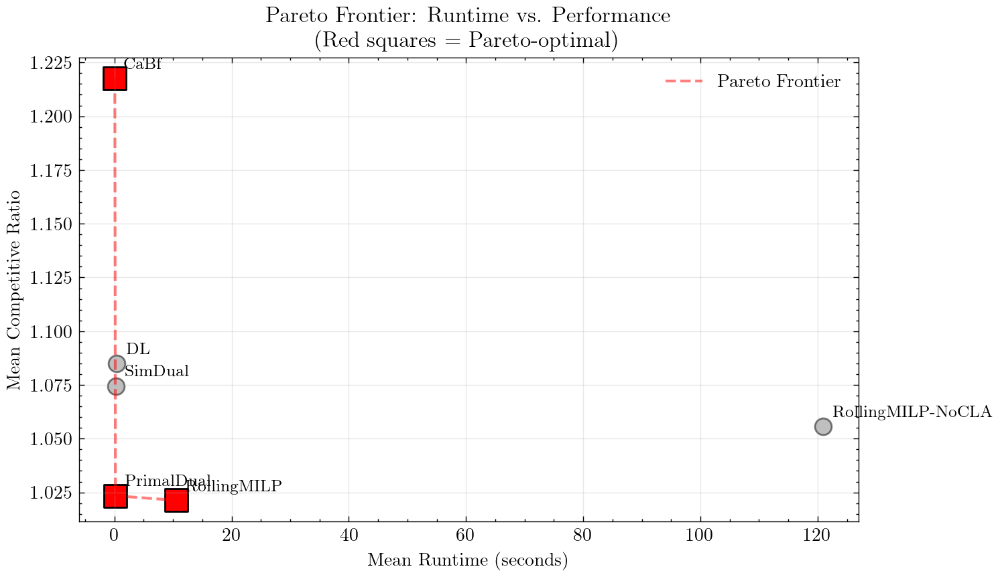


Pareto-Optimal Algorithms:


,online_short,mean_cr,mean_runtime
3,RollingMILP,1.021331,10.496784
2,PrimalDual,1.023423,0.175781
0,CaBf,1.217493,0.066172



Dominated Algorithms:


,online_short,mean_cr,mean_runtime
4,RollingMILP-NoCLA,1.055715,120.942643
5,SimDual,1.074323,0.262356
1,DL,1.085028,0.365791


In [31]:
# FEAS_LOOP_BEGIN
df_eval_all = df_eval_master if "df_eval_master" in globals() and df_eval_master is not None else df_eval
df_opt_all = df_opt_master if "df_opt_master" in globals() and df_opt_master is not None else df_opt
df_per_seed_all = df_per_seed_master if "df_per_seed_master" in globals() and df_per_seed_master is not None else df_per_seed
FIG_DIR_BASE = FIG_DIR_ROOT
for feas in FEAS_TAGS:
    FIG_DIR = FIG_DIR_BASE / feas if FIGS_BY_FEAS else FIG_DIR_BASE
    FIG_DIR.mkdir(parents=True, exist_ok=True)
    df_eval = df_eval_all[df_eval_all["feasibility"] == feas].copy() if df_eval_all is not None else None
    df_opt = df_opt_all[df_opt_all["feasibility"] == feas].copy() if df_opt_all is not None else None
    df_per_seed = df_per_seed_all[df_per_seed_all["feasibility"] == feas].copy() if df_per_seed_all is not None else None
    if df_eval is not None and "scenario_base" in df_eval.columns:
        df_eval["scenario"] = df_eval["scenario_base"]
    if df_opt is not None and "scenario_base" in df_opt.columns:
        df_opt["scenario"] = df_opt["scenario_base"]
    if df_per_seed is not None and "scenario_base" in df_per_seed.columns:
        df_per_seed["scenario"] = df_per_seed["scenario_base"]
    # Pareto Frontier Analysis
    if df_per_seed is not None:
        offline_fail_statuses = {"INFEASIBLE", "INF_OR_UNBD", "UNBOUNDED"}
        online_fail_statuses = {"INFEASIBLE"}

        # Get purely online data
        df_online_only = df_per_seed[
            (df_per_seed["kind"] == "eval") & (df_per_seed["T_off"] == 0)
        ].copy()

        df_online_success = df_online_only[
            ~df_online_only["offline_status"].isin(offline_fail_statuses)
            & ~df_online_only["online_status"].isin(online_fail_statuses)
        ].copy()

        # Get optimal benchmarks
        df_opt_only = df_per_seed[
            (df_per_seed["kind"] == "optimal") & (df_per_seed["T_off"] == 0)
        ].copy()
        df_opt_success = df_opt_only[
            ~df_opt_only["status"].isin(offline_fail_statuses)
        ].copy()
        df_opt_success = df_opt_success.rename(columns={"total_objective": "optimal_objective"})

        # Merge and compute CR
        df_pareto = df_online_success.merge(
            df_opt_success[["scenario", "seed", "optimal_objective"]],
            on=["scenario", "seed"],
            how="left",
        )
        df_pareto = df_pareto[df_pareto["optimal_objective"].notna()]
        df_pareto = df_pareto[df_pareto["online_objective"].notna()]
        df_pareto["competitive_ratio"] = df_pareto["online_objective"] / df_pareto["optimal_objective"]

        # Aggregate by algorithm
        agg = df_pareto.groupby("online_short", dropna=False).agg(
            mean_cr=("competitive_ratio", "mean"),
            mean_runtime=("online_runtime", "mean"),
        ).reset_index()

        # NO SIMBASE
        online_order = ["CaBf", "RollingMILP", "RollingMILP-NoCLA", "DL", "SimDual", "PrimalDual"]
        agg = agg[agg["online_short"].isin(online_order)]

        # Identify Pareto frontier (lower CR and lower runtime is better)
        def is_pareto_efficient(costs):
            """
            Find the Pareto-efficient points.
            costs: An (n_points, n_costs) array
            Returns: A boolean array indicating Pareto-efficient points
            """
            is_efficient = np.ones(costs.shape[0], dtype=bool)
            for i, c in enumerate(costs):
                if is_efficient[i]:
                    # Keep points that are not dominated by this point
                    is_efficient[is_efficient] = np.any(costs[is_efficient] < c, axis=1)
                    is_efficient[i] = True
            return is_efficient

        if not agg.empty:
            # Prepare data for Pareto analysis (both objectives: minimize)
            costs = agg[["mean_runtime", "mean_cr"]].values
            pareto_mask = is_pareto_efficient(costs)

            fig, ax = plt.subplots(figsize=(7.5, 4.5))

            # Plot all points
            for idx, row in agg.iterrows():
                color = "red" if pareto_mask[idx] else "gray"
                marker = "s" if pareto_mask[idx] else "o"
                size = 150 if pareto_mask[idx] else 80
                alpha = 1.0 if pareto_mask[idx] else 0.5

                ax.scatter(row["mean_runtime"], row["mean_cr"],
                          color=color, marker=marker, s=size, alpha=alpha, edgecolors="black")
                ax.annotate(
                    row["online_short"],
                    (row["mean_runtime"], row["mean_cr"]),
                    xytext=(5, 5),
                    textcoords="offset points",
                    fontsize=9,
                    fontweight="bold" if pareto_mask[idx] else "normal",
                )

            # Draw Pareto frontier line
            pareto_points = agg[pareto_mask].sort_values("mean_runtime")
            if len(pareto_points) > 1:
                ax.plot(pareto_points["mean_runtime"], pareto_points["mean_cr"],
                       'r--', alpha=0.5, linewidth=1.5, label="Pareto Frontier")

            ax.set_xlabel("Mean Runtime (seconds)")
            ax.set_ylabel("Mean Competitive Ratio")
            ax.set_title("Pareto Frontier: Runtime vs. Performance\n(Red squares = Pareto-optimal)")
            ax.grid(True, alpha=0.3)
            ax.legend()

            fig.savefig(FIG_DIR / f"pareto_frontier_{feas}.pdf", dpi=200, bbox_inches="tight")
            plt.show()

            print("\nPareto-Optimal Algorithms:")
            pareto_algos = agg[pareto_mask].sort_values("mean_cr")
            display(pareto_algos)

            print("\nDominated Algorithms:")
            dominated = agg[~pareto_mask].sort_values("mean_cr")
            if not dominated.empty:
                display(dominated)
            else:
                print("None - all algorithms are Pareto-optimal!")
df_eval = df_eval_all
df_opt = df_opt_all
df_per_seed = df_per_seed_all
# FEAS_LOOP_END


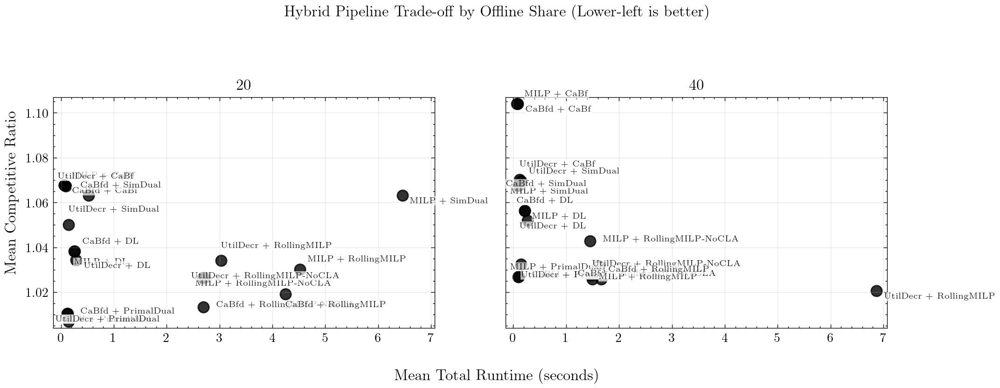

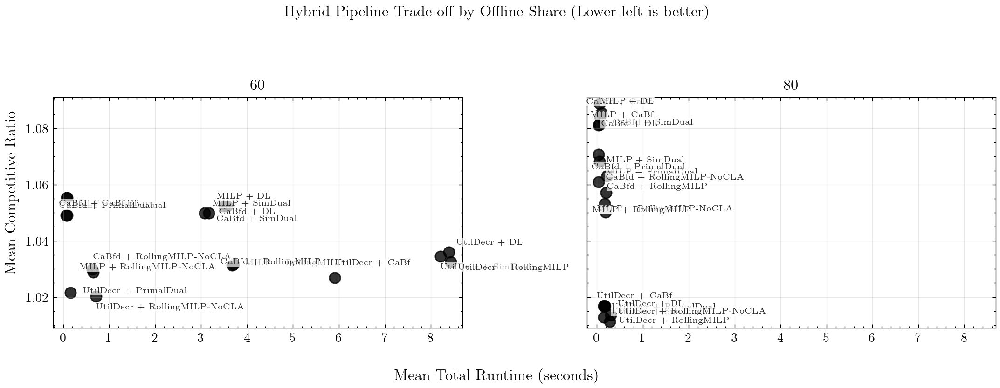


Hybrid Runtime vs. Performance (by offline share):


,pipeline,offline_pct,mean_cr,mean_runtime
71,UtilDecr + PrimalDual,20.0,1.006930,0.145032
11,CaBfd + PrimalDual,20.0,1.010496,0.125622
41,MILP + PrimalDual,20.0,1.010496,0.117850
21,CaBfd + RollingMILP-NoCLA,20.0,1.013302,2.698243
16,CaBfd + RollingMILP,20.0,1.019066,4.248962
81,UtilDecr + RollingMILP-NoCLA,20.0,1.026305,2.711163
51,MILP + RollingMILP-NoCLA,20.0,1.026490,2.687766
46,MILP + RollingMILP,20.0,1.030245,4.519874
76,UtilDecr + RollingMILP,20.0,1.034017,3.025471
66,UtilDecr + DL,20.0,1.034355,0.286134



Pareto-Optimal Hybrid Pipelines:


,pipeline,offline_pct,mean_cr,mean_runtime
71,UtilDecr + PrimalDual,20.0,1.006930,0.145032
41,MILP + PrimalDual,20.0,1.010496,0.117850
42,MILP + PrimalDual,40.0,1.026819,0.091562
43,MILP + PrimalDual,60.0,1.048976,0.063399
44,MILP + PrimalDual,80.0,1.060880,0.036852


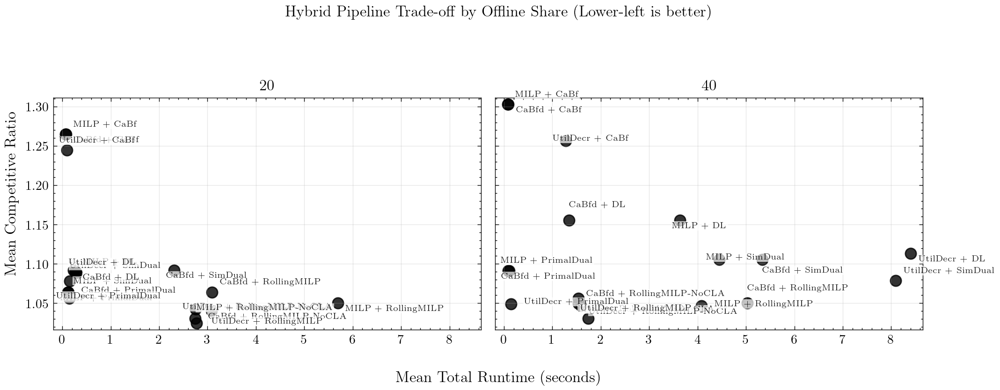

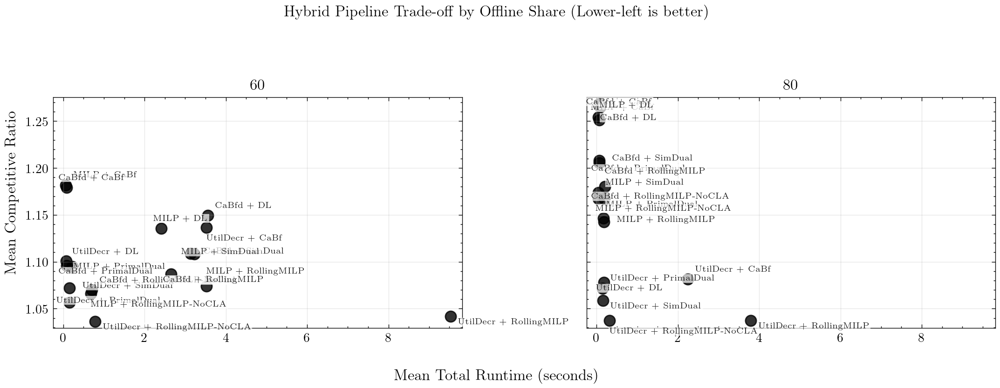


Hybrid Runtime vs. Performance (by offline share):


,pipeline,offline_pct,mean_cr,mean_runtime
51,MILP + RollingMILP-NoCLA,20.0,1.024600,2.769510
21,CaBfd + RollingMILP-NoCLA,20.0,1.030255,2.743493
76,UtilDecr + RollingMILP,20.0,1.040691,3.087729
81,UtilDecr + RollingMILP-NoCLA,20.0,1.042460,2.751211
46,MILP + RollingMILP,20.0,1.050180,5.691204
71,UtilDecr + PrimalDual,20.0,1.056322,0.145655
11,CaBfd + PrimalDual,20.0,1.063570,0.123366
41,MILP + PrimalDual,20.0,1.063570,0.117434
16,CaBfd + RollingMILP,20.0,1.063973,3.096669
86,UtilDecr + SimDual,20.0,1.078335,0.149472



Pareto-Optimal Hybrid Pipelines:


,pipeline,offline_pct,mean_cr,mean_runtime
20,CaBfd + RollingMILP-NoCLA,0.0,1.024351,4.402502
51,MILP + RollingMILP-NoCLA,20.0,1.024600,2.769510
40,MILP + PrimalDual,0.0,1.026666,0.144403
41,MILP + PrimalDual,20.0,1.063570,0.117434
42,MILP + PrimalDual,40.0,1.091282,0.091212
13,CaBfd + PrimalDual,60.0,1.095737,0.083294
43,MILP + PrimalDual,60.0,1.101017,0.065092
44,MILP + PrimalDual,80.0,1.167200,0.041209
59,MILP + SimDual,80.0,1.173896,0.038999


In [32]:
# FEAS_LOOP_BEGIN
df_eval_all = df_eval_master if "df_eval_master" in globals() and df_eval_master is not None else df_eval
df_opt_all = df_opt_master if "df_opt_master" in globals() and df_opt_master is not None else df_opt
df_per_seed_all = df_per_seed_master if "df_per_seed_master" in globals() and df_per_seed_master is not None else df_per_seed
FIG_DIR_BASE = FIG_DIR_ROOT
for feas in FEAS_TAGS:
    FIG_DIR = FIG_DIR_BASE / feas if FIGS_BY_FEAS else FIG_DIR_BASE
    FIG_DIR.mkdir(parents=True, exist_ok=True)
    df_eval = df_eval_all[df_eval_all["feasibility"] == feas].copy() if df_eval_all is not None else None
    df_opt = df_opt_all[df_opt_all["feasibility"] == feas].copy() if df_opt_all is not None else None
    df_per_seed = df_per_seed_all[df_per_seed_all["feasibility"] == feas].copy() if df_per_seed_all is not None else None
    if df_eval is not None and "scenario_base" in df_eval.columns:
        df_eval["scenario"] = df_eval["scenario_base"]
    if df_opt is not None and "scenario_base" in df_opt.columns:
        df_opt["scenario"] = df_opt["scenario_base"]
    if df_per_seed is not None and "scenario_base" in df_per_seed.columns:
        df_per_seed["scenario"] = df_per_seed["scenario_base"]
    # Hybrid Runtime-Performance Trade-off
    # Analyzing complete pipelines across different offline/online splits
    if df_per_seed is not None:
        offline_fail_statuses = {"INFEASIBLE", "INF_OR_UNBD", "UNBOUNDED"}
        online_fail_statuses = {"INFEASIBLE"}

        # Get baseline scenarios (all offline/online splits)
        df_hybrid = df_per_seed[
            (df_per_seed["kind"] == "eval") &
            (df_per_seed["family"] == "baseline")
        ].copy()

        df_hybrid_success = df_hybrid[
            ~df_hybrid["offline_status"].isin(offline_fail_statuses)
            & ~df_hybrid["online_status"].isin(online_fail_statuses)
        ].copy()

        # Get optimal benchmarks
        df_opt_hybrid = df_per_seed[
            (df_per_seed["kind"] == "optimal") &
            (df_per_seed["family"] == "baseline")
        ].copy()
        df_opt_success = df_opt_hybrid[
            ~df_opt_hybrid["status"].isin(offline_fail_statuses)
        ].copy()
        df_opt_success = df_opt_success.rename(columns={"total_objective": "optimal_objective"})

        # Merge and compute CR
        df_hybrid_perf = df_hybrid_success.merge(
            df_opt_success[["scenario", "seed", "optimal_objective"]],
            on=["scenario", "seed"],
            how="left",
        )
        df_hybrid_perf = df_hybrid_perf[df_hybrid_perf["optimal_objective"].notna()]
        df_hybrid_perf = df_hybrid_perf[df_hybrid_perf["total_objective"].notna()]
        df_hybrid_perf["competitive_ratio"] = df_hybrid_perf["total_objective"] / df_hybrid_perf["optimal_objective"]

        # Compute total runtime (offline + online)
        df_hybrid_perf["total_runtime"] = (
            df_hybrid_perf["offline_runtime"].fillna(0) +
            df_hybrid_perf["online_runtime"].fillna(0)
        )

        # Compute offline percentage
        denom = df_hybrid_perf["T_off"].fillna(0) + df_hybrid_perf["T_onl"].fillna(0)
        df_hybrid_perf["offline_pct"] = (
            (df_hybrid_perf["T_off"] / denom) * 100
        ).where(denom > 0)

        # Aggregate by pipeline and offline_pct
        agg_hybrid = df_hybrid_perf.groupby(["pipeline", "offline_pct"], dropna=False).agg(
            mean_cr=("competitive_ratio", "mean"),
            mean_runtime=("total_runtime", "mean"),
            std_cr=("competitive_ratio", "std"),
            std_runtime=("total_runtime", "std"),
        ).reset_index()

        # Filter to specific offline shares for clarity (20%, 40%, 60%, 80%)
        agg_hybrid_filtered = agg_hybrid[agg_hybrid["offline_pct"].isin([20, 40, 60, 80])]

        if not agg_hybrid_filtered.empty:
            label_offsets = [(6, 6), (6, -6), (-6, 6), (-6, -6), (10, 0), (-10, 0), (0, 10), (0, -10)]

            def plot_offline_shares(fig_name, shares):
                fig_name = fig_name.replace(".pdf", f"_{feas}.pdf")
                df_shares = agg_hybrid_filtered[agg_hybrid_filtered["offline_pct"].isin(shares)]
                x_min = df_shares["mean_runtime"].min()
                x_max = df_shares["mean_runtime"].max()
                y_min = df_shares["mean_cr"].min()
                y_max = df_shares["mean_cr"].max()

                if pd.isna(x_min) or pd.isna(x_max):
                    x_min, x_max = 0.0, 1.0
                if pd.isna(y_min) or pd.isna(y_max):
                    y_min, y_max = 0.0, 1.0

                x_span = x_max - x_min
                y_span = y_max - y_min
                x_pad = 0.03 * x_span if x_span > 0 else 1.0
                y_pad = 0.03 * y_span if y_span > 0 else 0.02

                fig, axes = plt.subplots(1, 2, figsize=(11.0, 4.2), sharex=True, sharey=True)
                for ax, off_pct in zip(axes, shares):
                    df_pct = agg_hybrid_filtered[agg_hybrid_filtered["offline_pct"] == off_pct]
                    if df_pct.empty:
                        ax.set_title(f"{int(off_pct)}% Offline Share (no data)")
                        ax.axis("off")
                        continue

                    df_pct = df_pct.sort_values(["mean_runtime", "mean_cr"]).reset_index(drop=True)
                    ax.scatter(
                        df_pct["mean_runtime"],
                        df_pct["mean_cr"],
                        s=70,
                        alpha=0.8,
                        color="black",
                    )

                    for idx, row in df_pct.iterrows():
                        dx, dy = label_offsets[idx % len(label_offsets)]
                        ax.annotate(
                            row["pipeline"],
                            (row["mean_runtime"], row["mean_cr"]),
                            xytext=(dx, dy),
                            textcoords="offset points",
                            fontsize=6.5,
                            alpha=0.85,
                            bbox=dict(facecolor="white", alpha=0.7, edgecolor="none", pad=0.6),
                        )

                    ax.set_title(f"{int(off_pct)}% Offline Share")
                    ax.grid(True, alpha=0.3)
                    ax.set_xlim(x_min - x_pad, x_max + x_pad)
                    ax.set_ylim(y_min - y_pad, y_max + y_pad)

                fig.suptitle("Hybrid Pipeline Trade-off by Offline Share (Lower-left is better)")
                fig.supxlabel("Mean Total Runtime (seconds)")
                fig.supylabel("Mean Competitive Ratio")
                fig.tight_layout(rect=[0, 0, 1, 0.9])

                fig.savefig(FIG_DIR / fig_name, dpi=200, bbox_inches="tight")
                plt.show()

            plot_offline_shares("hybrid_runtime_vs_performance_20_40.pdf", [20, 40])
            plot_offline_shares("hybrid_runtime_vs_performance_60_80.pdf", [60, 80])

            print("\nHybrid Runtime vs. Performance (by offline share):")
            summary = agg_hybrid_filtered.sort_values(["offline_pct", "mean_cr"])
            display(summary[["pipeline", "offline_pct", "mean_cr", "mean_runtime"]].head(20))

            # Identify Pareto-optimal pipelines (across ALL offline shares)
            def is_pareto_efficient(costs):
                is_efficient = np.ones(costs.shape[0], dtype=bool)
                for i, c in enumerate(costs):
                    if is_efficient[i]:
                        is_efficient[is_efficient] = np.any(costs[is_efficient] < c, axis=1)
                        is_efficient[i] = True
                return is_efficient

            costs = agg_hybrid[["mean_runtime", "mean_cr"]].values
            pareto_mask = is_pareto_efficient(costs)

            print("\nPareto-Optimal Hybrid Pipelines:")
            pareto_pipelines = agg_hybrid[pareto_mask].sort_values("mean_cr")
            display(pareto_pipelines[["pipeline", "offline_pct", "mean_cr", "mean_runtime"]])
df_eval = df_eval_all
df_opt = df_opt_all
df_per_seed = df_per_seed_all
# FEAS_LOOP_END


# Volume Variance Sweep Analysis

Found 2700 successful runs across 3 scenarios
Found 3000 successful runs across 3 scenarios


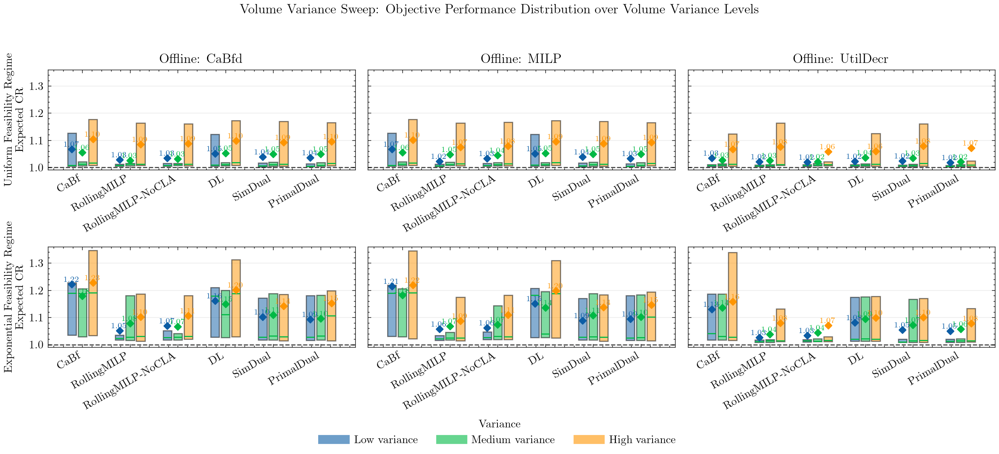

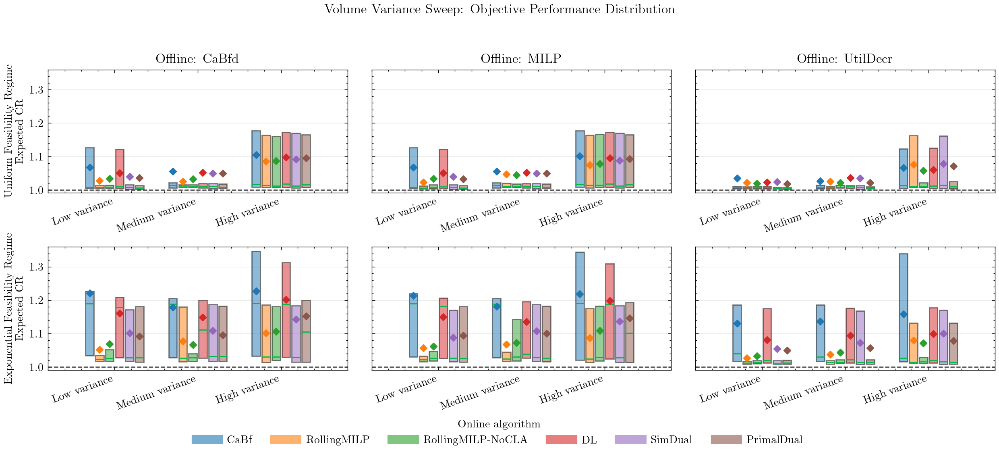

/tmp/ipykernel_2067729/2845255255.py:418: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_line.groupby("dispersion")["expected_cr"]
/tmp/ipykernel_2067729/2845255255.py:418: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_line.groupby("dispersion")["expected_cr"]
/tmp/ipykernel_2067729/2845255255.py:418: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_line.groupby("dispersion")["expected_cr"]
/tmp/ipykernel_2067729/28

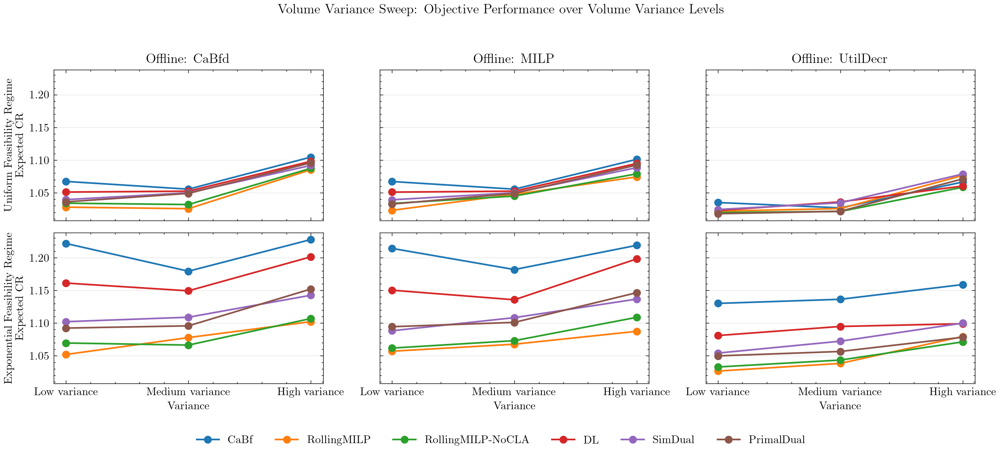

In [33]:
# FEAS_LOOP_BEGIN
df_eval_all = df_eval_master if "df_eval_master" in globals() and df_eval_master is not None else df_eval
df_opt_all = df_opt_master if "df_opt_master" in globals() and df_opt_master is not None else df_opt
df_per_seed_all = df_per_seed_master if "df_per_seed_master" in globals() and df_per_seed_master is not None else df_per_seed
FIG_DIR_BASE = FIG_DIR_ROOT

dispersion_patterns = {
    "vol_lowvar": "Low variance",
    "vol_midvar": "Medium variance",
    "vol_highuncert_uniform": "High variance",
}

dispersion_order = ["Low variance", "Medium variance", "High variance"]
disp_colors = {"Low variance": "C0", "Medium variance": "C1", "High variance": "C2"}

offline_order = ["CaBfd", "MILP", "UtilDecr"]
online_order = ["CaBf", "RollingMILP", "RollingMILP-NoCLA", "DL", "SimDual", "PrimalDual"]


def add_dispersion_label(df, scenario_col="scenario"):
    if df is None or df.empty or scenario_col not in df.columns:
        return df
    series = df[scenario_col].astype(str)
    labels = pd.Series(index=df.index, dtype=object)
    for key, label in dispersion_patterns.items():
        mask = series.str.contains(key, na=False)
        labels.loc[mask] = label
    df = df.copy()
    df["dispersion"] = labels
    return df[df["dispersion"].notna()]


for feas in FEAS_TAGS:
    FIG_DIR = FIG_DIR_BASE / feas if FIGS_BY_FEAS else FIG_DIR_BASE
    FIG_DIR.mkdir(parents=True, exist_ok=True)
    df_eval = df_eval_all[df_eval_all["feasibility"] == feas].copy() if df_eval_all is not None else None
    df_opt = df_opt_all[df_opt_all["feasibility"] == feas].copy() if df_opt_all is not None else None
    df_per_seed = df_per_seed_all[df_per_seed_all["feasibility"] == feas].copy() if df_per_seed_all is not None else None
    if df_eval is not None and "scenario_base" in df_eval.columns:
        df_eval["scenario"] = df_eval["scenario_base"]
    if df_opt is not None and "scenario_base" in df_opt.columns:
        df_opt["scenario"] = df_opt["scenario_base"]
    if df_per_seed is not None and "scenario_base" in df_per_seed.columns:
        df_per_seed["scenario"] = df_per_seed["scenario_base"]

    if df_per_seed is not None:
        df_disp = df_per_seed[df_per_seed["kind"] == "eval"].copy()
        df_disp = add_dispersion_label(df_disp)

        df_opt_disp = df_per_seed[df_per_seed["kind"] == "optimal"].copy()
        df_opt_disp = add_dispersion_label(df_opt_disp)

        if df_disp is not None and not df_disp.empty:
            offline_fail_statuses = {"INFEASIBLE", "INF_OR_UNBD", "UNBOUNDED"}
            online_fail_statuses = {"INFEASIBLE"}

            df_disp_success = df_disp[
                (~df_disp["offline_status"].isin(offline_fail_statuses))
                & (~df_disp["online_status"].isin(online_fail_statuses))
            ].copy()

            df_opt_success = df_opt_disp[
                ~df_opt_disp["status"].isin(offline_fail_statuses)
            ].copy()
            df_opt_success = df_opt_success.rename(columns={"total_objective": "optimal_objective"})

            df_disp_cr = df_disp_success.merge(
                df_opt_success[["scenario", "seed", "optimal_objective"]],
                on=["scenario", "seed"],
                how="left",
            )

            df_disp_cr = df_disp_cr[df_disp_cr["optimal_objective"].notna()]
            df_disp_cr = df_disp_cr[df_disp_cr["total_objective"].notna()]
            df_disp_cr["competitive_ratio"] = df_disp_cr["total_objective"] / df_disp_cr["optimal_objective"]

            print(f"Found {len(df_disp_cr)} successful runs across {len(df_disp_cr['scenario'].unique())} scenarios")
        else:
            print("Volume dispersion sweep data not found or no data available")

# Combined boxplot grid (rows = feasibility, cols = offline algo)
if df_per_seed_all is not None:
    df_disp_all = df_per_seed_all[df_per_seed_all["kind"] == "eval"].copy()
    if "scenario_base" in df_disp_all.columns:
        df_disp_all["scenario"] = df_disp_all["scenario_base"]
    df_disp_all = add_dispersion_label(df_disp_all)

    df_opt_disp_all = df_per_seed_all[df_per_seed_all["kind"] == "optimal"].copy()
    if "scenario_base" in df_opt_disp_all.columns:
        df_opt_disp_all["scenario"] = df_opt_disp_all["scenario_base"]
    df_opt_disp_all = add_dispersion_label(df_opt_disp_all)

    if df_disp_all is not None and not df_disp_all.empty:
        offline_fail_statuses = {"INFEASIBLE", "INF_OR_UNBD", "UNBOUNDED"}
        online_fail_statuses = {"INFEASIBLE"}

        df_disp_success = df_disp_all[
            (~df_disp_all["offline_status"].isin(offline_fail_statuses))
            & (~df_disp_all["online_status"].isin(online_fail_statuses))
        ].copy()
        df_opt_success = df_opt_disp_all[
            ~df_opt_disp_all["status"].isin(offline_fail_statuses)
        ].copy()
        df_opt_success = df_opt_success.rename(columns={"total_objective": "optimal_objective"})

        df_disp_cr_all = df_disp_success.merge(
            df_opt_success[["scenario", "feasibility", "seed", "optimal_objective"]],
            on=["scenario", "feasibility", "seed"],
            how="left",
            validate="many_to_one",
        )
        df_disp_cr_all = df_disp_cr_all[df_disp_cr_all["optimal_objective"].notna()]
        df_disp_cr_all = df_disp_cr_all[df_disp_cr_all["total_objective"].notna()]
        df_disp_cr_all["competitive_ratio"] = df_disp_cr_all["total_objective"] / df_disp_cr_all["optimal_objective"]
        df_disp_cr_all["dispersion"] = pd.Categorical(
            df_disp_cr_all["dispersion"],
            categories=dispersion_order,
            ordered=True,
        )

        # Use a tighter robust range so CR differences remain visible despite outliers.
        y_min = df_disp_cr_all["competitive_ratio"].quantile(0.05)
        y_max = df_disp_cr_all["competitive_ratio"].quantile(0.95)
        if pd.isna(y_min) or pd.isna(y_max) or y_min >= y_max:
            y_min = df_disp_cr_all["competitive_ratio"].quantile(0.01)
            y_max = df_disp_cr_all["competitive_ratio"].quantile(0.99)
        if pd.isna(y_min) or pd.isna(y_max) or y_min >= y_max:
            y_min = df_disp_cr_all["competitive_ratio"].min()
            y_max = df_disp_cr_all["competitive_ratio"].max()
        if pd.isna(y_min) or pd.isna(y_max):
            y_min, y_max = 0.0, 1.0
        y_pad = 0.03 * (y_max - y_min) if y_max > y_min else 0.03 * max(1.0, abs(y_max))

        nrows = len(FEAS_TAGS)
        ncols = len(offline_order)
        fig, axes = plt.subplots(
            nrows=nrows,
            ncols=ncols,
            figsize=(4.2 * ncols, 2.8 * max(1, nrows)),
            sharey=True,
            sharex=False,
        )

        if nrows == 1 and ncols == 1:
            axes = np.array([[axes]])
        elif nrows == 1:
            axes = np.array([axes])
        elif ncols == 1:
            axes = np.array([[ax] for ax in axes])

        for r, feas in enumerate(FEAS_TAGS):
            for c, offline_algo in enumerate(offline_order):
                ax = axes[r, c]
                df_sub = df_disp_cr_all[
                    (df_disp_cr_all["feasibility"] == feas)
                    & (df_disp_cr_all["offline_short"] == offline_algo)
                ].copy()

                if df_sub.empty:
                    ax.set_title(f"{offline_algo} ({feas}) - no data" if r == 0 else "")
                    ax.grid(True, axis="y", alpha=0.2)
                    ax.set_ylim(y_min - y_pad, y_max + y_pad)
                    continue

                base_positions = np.arange(1, len(online_order) + 1)
                width = 0.22
                offsets = [-width, 0.0, width]

                for disp, offset in zip(dispersion_order, offsets):
                    data = []
                    positions = []
                    for i, online_algo in enumerate(online_order):
                        vals = df_sub[
                            (df_sub["online_short"] == online_algo)
                            & (df_sub["dispersion"] == disp)
                        ]["competitive_ratio"].dropna().values
                        data.append(vals if len(vals) else [np.nan])
                        positions.append(base_positions[i] + offset)

                    bp = ax.boxplot(
                        data,
                        positions=positions,
                        widths=0.18,
                        showfliers=False,
                        patch_artist=True,
                        whiskerprops={"linewidth": 0},
                        capprops={"linewidth": 0},
                    )
                    for patch in bp["boxes"]:
                        patch.set_facecolor(disp_colors[disp])
                        patch.set_alpha(0.5)

                    y_offset = 0.01 * (y_max - y_min) if y_max > y_min else 0.01
                    for pos, vals in zip(positions, data):
                        vals = np.array(vals, dtype=float)
                        vals = vals[~np.isnan(vals)]
                        if len(vals) == 0:
                            continue
                        mean_val = float(np.mean(vals))
                        ax.scatter(pos, mean_val, s=18, color=disp_colors[disp], marker="D", zorder=3)
                        ax.text(
                            pos,
                            mean_val + y_offset,
                            f"{mean_val:.2f}",
                            ha="center",
                            va="bottom",
                            fontsize=7,
                            color=disp_colors[disp],
                        )

                ax.axhline(1.0, color="black", linestyle="--", linewidth=1, alpha=0.7)
                if r == 0:
                    ax.set_title(f"Offline: {offline_algo}")
                if c == 0:
                    if feas == "uniform": setting = "Uniform Feasibility Regime" 
                    else: setting = "Exponential Feasibility Regime"
                    ax.set_ylabel(f"{setting}\nExpected CR")
                ax.set_xticks(base_positions)
                ax.set_xticklabels(online_order, rotation=30, ha="right")
                ax.set_ylim(y_min - y_pad, y_max + y_pad)
                ax.grid(True, axis="y", alpha=0.3)

        handles = [
            plt.Line2D([0], [0], color=disp_colors[d], lw=8, alpha=0.6, label=d)
            for d in dispersion_order
        ]
        fig.legend(
            handles=handles,
            title="Variance",
            loc="lower center",
            ncol=3,
            bbox_to_anchor=(0.5, -0.02),
        )
        fig.suptitle("Volume Variance Sweep: Objective Performance Distribution over Volume Variance Levels")
        fig.tight_layout(rect=[0, 0.05, 1, 0.95])
        fig.savefig(FIG_DIR_ROOT / "volume_dispersion_cr_grouped_all_feas.pdf", dpi=200, bbox_inches="tight")
        plt.show()

        # Additional boxplot grid: x-axis = variance, grouped by online algorithm
        hybrid_online_order = ["CaBf", "RollingMILP", "RollingMILP-NoCLA", "DL", "SimDual", "PrimalDual"]
        online_colors = {algo: plt.cm.tab10(i % 10) for i, algo in enumerate(hybrid_online_order)}
        nrows = len(FEAS_TAGS)
        ncols = len(offline_order)
        fig, axes = plt.subplots(
            nrows=nrows,
            ncols=ncols,
            figsize=(4.2 * ncols, 2.8 * max(1, nrows)),
            sharey=True,
            sharex=False,
        )

        if nrows == 1 and ncols == 1:
            axes = np.array([[axes]])
        elif nrows == 1:
            axes = np.array([axes])
        elif ncols == 1:
            axes = np.array([[ax] for ax in axes])

        box_width = 0.12
        online_offsets = np.linspace(-(len(online_order) - 1) / 2 * box_width, (len(online_order) - 1) / 2 * box_width, len(online_order))

        for r, feas in enumerate(FEAS_TAGS):
            for c, offline_algo in enumerate(offline_order):
                ax = axes[r, c]
                df_sub = df_disp_cr_all[
                    (df_disp_cr_all["feasibility"] == feas)
                    & (df_disp_cr_all["offline_short"] == offline_algo)
                ].copy()

                if df_sub.empty:
                    if r == 0:
                        ax.set_title(f"Offline: {offline_algo} (no data)")
                    if c == 0:
                        if feas == "uniform":
                            setting = "Uniform Feasibility Regime"
                        else:
                            setting = "Exponential Feasibility Regime"
                        ax.set_ylabel(f"{setting}\nExpected CR")
                    ax.set_ylim(y_min - y_pad, y_max + y_pad)
                    ax.grid(True, axis="y", alpha=0.2)
                    continue

                base_positions = np.arange(1, len(dispersion_order) + 1)

                for online_algo, offset in zip(online_order, online_offsets):
                    data = []
                    positions = []
                    for i, disp in enumerate(dispersion_order):
                        vals = df_sub[
                            (df_sub["online_short"] == online_algo)
                            & (df_sub["dispersion"] == disp)
                        ]["competitive_ratio"].dropna().values
                        data.append(vals if len(vals) else [np.nan])
                        positions.append(base_positions[i] + offset)

                    bp = ax.boxplot(
                        data,
                        positions=positions,
                        widths=0.10,
                        showfliers=False,
                        patch_artist=True,
                        whiskerprops={"linewidth": 0},
                        capprops={"linewidth": 0},
                    )
                    for patch in bp["boxes"]:
                        patch.set_facecolor(online_colors[online_algo])
                        patch.set_alpha(0.5)

                    y_offset = 0.01 * (y_max - y_min) if y_max > y_min else 0.01
                    for pos, vals in zip(positions, data):
                        vals = np.array(vals, dtype=float)
                        vals = vals[~np.isnan(vals)]
                        if len(vals) == 0:
                            continue
                        mean_val = float(np.mean(vals))
                        ax.scatter(pos, mean_val, s=18, color=online_colors[online_algo], marker="D", zorder=3)

                ax.axhline(1.0, color="black", linestyle="--", linewidth=1, alpha=0.7)
                if r == 0:
                    ax.set_title(f"Offline: {offline_algo}")
                if c == 0:
                    if feas == "uniform":
                        setting = "Uniform Feasibility Regime"
                    else:
                        setting = "Exponential Feasibility Regime"
                    ax.set_ylabel(f"{setting}\nExpected CR")
                ax.set_xticks(base_positions)
                ax.set_xticklabels(dispersion_order, rotation=20, ha="right")
                ax.set_ylim(y_min - y_pad, y_max + y_pad)
                ax.grid(True, axis="y", alpha=0.3)

        handles = [
            plt.Line2D([0], [0], color=online_colors[a], lw=8, alpha=0.6, label=a)
            for a in online_order
        ]
        fig.legend(
            handles=handles,
            title="Online algorithm",
            loc="lower center",
            ncol=len(online_order),
            bbox_to_anchor=(0.5, -0.02),
        )
        fig.suptitle("Volume Variance Sweep: Objective Performance Distribution")
        fig.tight_layout(rect=[0, 0.05, 1, 0.95])
        fig.savefig(FIG_DIR_ROOT / "volume_dispersion_cr_grouped_by_algo_all_feas.pdf", dpi=200, bbox_inches="tight")
        plt.show()
    else:
        print("Volume dispersion sweep data not found or no data available (boxplot grid)")

# Line plot grid: Expected CR over dispersion levels (rows = feasibility, cols = offline algo)
if df_per_seed_all is not None:
    df_eval_disp_all = df_per_seed_all[df_per_seed_all["kind"] == "eval"].copy()
    df_opt_disp_all = df_per_seed_all[df_per_seed_all["kind"] == "optimal"].copy()

    if "scenario_base" in df_eval_disp_all.columns:
        df_eval_disp_all["scenario"] = df_eval_disp_all["scenario_base"]
    if "scenario_base" in df_opt_disp_all.columns:
        df_opt_disp_all["scenario"] = df_opt_disp_all["scenario_base"]

    df_eval_disp_all = add_dispersion_label(df_eval_disp_all)
    df_opt_disp_all = add_dispersion_label(df_opt_disp_all)

    offline_fail_statuses = {"INFEASIBLE", "INF_OR_UNBD", "UNBOUNDED"}
    online_fail_statuses = {"INFEASIBLE"}
    df_eval_disp_all = df_eval_disp_all[(~df_eval_disp_all["offline_status"].isin(offline_fail_statuses)) & (~df_eval_disp_all["online_status"].isin(online_fail_statuses))].copy()
    df_opt_disp_all = df_opt_disp_all[~df_opt_disp_all["status"].isin(offline_fail_statuses)].copy()
    df_opt_disp_all = df_opt_disp_all.rename(columns={"total_objective": "optimal_objective"})

    df_disp_cr_all = df_eval_disp_all.merge(
        df_opt_disp_all[["scenario", "feasibility", "seed", "optimal_objective"]],
        on=["scenario", "feasibility", "seed"],
        how="left",
    )
    df_disp_cr_all = df_disp_cr_all[df_disp_cr_all["optimal_objective"].notna()].copy()
    df_disp_cr_all = df_disp_cr_all[df_disp_cr_all["total_objective"].notna()].copy()
    df_disp_cr_all["expected_cr"] = df_disp_cr_all["total_objective"] / df_disp_cr_all["optimal_objective"]
    df_disp_cr_all["dispersion"] = pd.Categorical(
        df_disp_cr_all["dispersion"],
        categories=dispersion_order,
        ordered=True,
    )

    nrows = len(FEAS_TAGS)
    ncols = len(offline_order)
    fig, axes = plt.subplots(
        nrows=nrows,
        ncols=ncols,
        figsize=(4.2 * ncols, 2.8 * max(1, nrows)),
        sharey=True,
        sharex=True,
    )

    if nrows == 1 and ncols == 1:
        axes = np.array([[axes]])
    elif nrows == 1:
        axes = np.array([axes])
    elif ncols == 1:
        axes = np.array([[ax] for ax in axes])

    hybrid_online_order = ["CaBf", "RollingMILP", "RollingMILP-NoCLA", "DL", "SimDual", "PrimalDual"]
    online_colors = {algo: plt.cm.tab10(i % 10) for i, algo in enumerate(hybrid_online_order)}

    for r, feas in enumerate(FEAS_TAGS):
        for c, offline_algo in enumerate(offline_order):
            ax = axes[r, c]
            df_sub = df_disp_cr_all[(df_disp_cr_all["feasibility"] == feas) & (df_disp_cr_all["offline_short"] == offline_algo)].copy()

            if df_sub.empty:
                ax.set_title(f"{offline_algo} ({feas}) - no data" if r == 0 else "")
                ax.grid(True, axis="y", alpha=0.2)
                continue

            for online_algo in online_order:
                df_line = df_sub[df_sub["online_short"] == online_algo].copy()
                if df_line.empty:
                    continue
                means = (
                    df_line.groupby("dispersion")["expected_cr"]
                    .mean()
                    .reindex(dispersion_order)
                )
                ax.plot(
                    dispersion_order,
                    means.values,
                    marker="o",
                    linewidth=1.5,
                    label=online_algo,
                    color=online_colors.get(online_algo, "C7"),
                )

            if r == 0:
                ax.set_title(f"Offline: {offline_algo}")
            if c == 0:
                if feas == "uniform": setting = "Uniform Feasibility Regime" 
                else: setting = "Exponential Feasibility Regime"
                ax.set_ylabel(f"{setting}\n Expected CR")
            if r == nrows - 1:
                ax.set_xlabel("Variance")
            ax.grid(True, axis="y", alpha=0.3)

    handles, labels = axes[0, 0].get_legend_handles_labels()
    if handles:
        fig.legend(
            handles,
            labels,
            loc="lower center",
            ncol=len(online_order),
            bbox_to_anchor=(0.5, -0.02),
        )
    fig.suptitle("Volume Variance Sweep: Objective Performance over Volume Variance Levels")
    fig.tight_layout(rect=[0, 0.05, 1, 0.95])
    fig.savefig(FIG_DIR_ROOT / "volume_dispersion_cr_lines_all_feas.pdf", dpi=200, bbox_inches="tight")
    plt.show()

    
else:
    print("Volume dispersion sweep data not found or no data available (line plot)")
df_eval = df_eval_all
df_opt = df_opt_all
df_per_seed = df_per_seed_all
# FEAS_LOOP_END


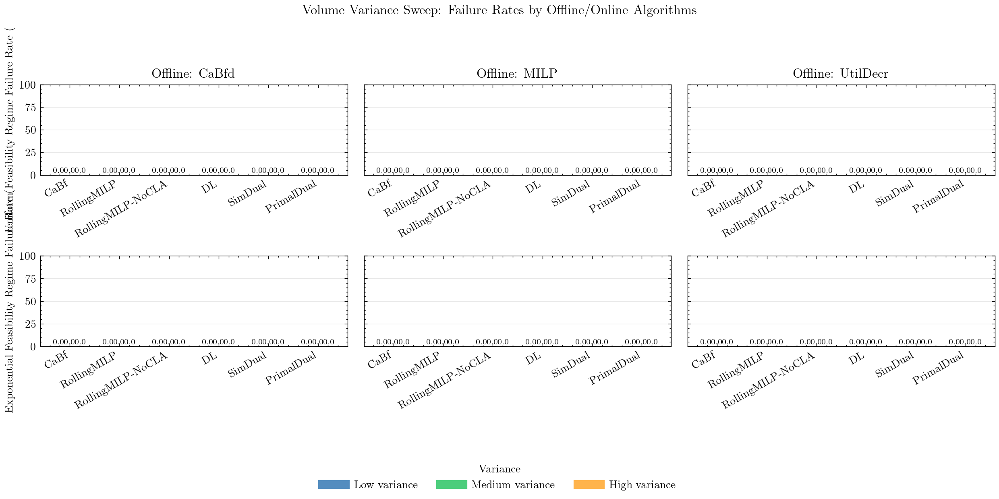

In [34]:
# FEAS_LOOP_BEGIN
df_eval_all = df_eval_master if "df_eval_master" in globals() and df_eval_master is not None else df_eval
df_opt_all = df_opt_master if "df_opt_master" in globals() and df_opt_master is not None else df_opt
df_per_seed_all = df_per_seed_master if "df_per_seed_master" in globals() and df_per_seed_master is not None else df_per_seed
FIG_DIR_BASE = FIG_DIR_ROOT

# 1B: Volume Variance - Failure Rate vs Variance (combined across feasibility)
if df_per_seed_all is not None:
    df_per_seed = df_per_seed_all.copy()
    if "scenario_base" in df_per_seed.columns:
        df_per_seed["scenario"] = df_per_seed["scenario_base"]

    vol_scenarios = [
        "vol_lowvar_off60_on40",
        "vol_midvar_off60_on40",
        "vol_highuncert_uniform_same_load_off60_on40",
    ]

    dispersion_map = {
        "vol_lowvar_off60_on40": "Low variance",
        "vol_midvar_off60_on40": "Medium variance",
        "vol_highuncert_uniform_same_load_off60_on40": "High variance",
    }

    df_disp_all = df_per_seed[
        (df_per_seed["kind"] == "eval")
        & (df_per_seed["scenario"].isin(vol_scenarios))
    ].copy()

    if not df_disp_all.empty:
        offline_fail_statuses = {"INFEASIBLE", "INF_OR_UNBD", "UNBOUNDED"}
        online_fail_statuses = {"INFEASIBLE"}

        df_disp_all["offline_failed"] = df_disp_all["offline_status"].isin(offline_fail_statuses)
        df_disp_all["online_failed"] = df_disp_all["online_status"].isin(online_fail_statuses)
        df_disp_all["any_failed"] = df_disp_all["offline_failed"] | df_disp_all["online_failed"]

        df_disp_all["dispersion"] = df_disp_all["scenario"].map(dispersion_map)
        df_disp_all = df_disp_all[df_disp_all["dispersion"].notna()].copy()

        df_fail_agg = df_disp_all.groupby(
            ["feasibility", "offline_short", "online_short", "dispersion"], dropna=False
        ).agg(
            failure_rate=("any_failed", "mean"),
            total_runs=("any_failed", "count"),
        ).reset_index()
        df_fail_agg["failure_rate"] = df_fail_agg["failure_rate"] * 100.0

        def binom_ci(pct, n):
            if n is None or n <= 1 or pct is None:
                return float("nan")
            p = pct / 100.0
            return 1.96 * (p * (1.0 - p) / n) ** 0.5 * 100.0

        df_fail_agg["ci"] = df_fail_agg.apply(
            lambda r: binom_ci(r["failure_rate"], r["total_runs"]), axis=1
        )

        offline_order = ["CaBfd", "MILP", "UtilDecr"]
        online_order = ["CaBf", "RollingMILP", "RollingMILP-NoCLA", "DL", "SimDual", "PrimalDual"]
        dispersion_order = ["Low variance", "Medium variance", "High variance"]
        disp_colors = {"Low variance": "C0", "Medium variance": "C1", "High variance": "C2"}

        nrows = len(FEAS_TAGS)
        ncols = len(offline_order)
        fig, axes = plt.subplots(
            nrows=nrows,
            ncols=ncols,
            figsize=(4.2 * ncols, 2.8 * max(1, nrows)),
            sharey=True,
            sharex=False,
        )

        if nrows == 1 and ncols == 1:
            axes = np.array([[axes]])
        elif nrows == 1:
            axes = np.array([axes])
        elif ncols == 1:
            axes = np.array([[ax] for ax in axes])

        for r, feas in enumerate(FEAS_TAGS):
            for c, offline_algo in enumerate(offline_order):
                ax = axes[r, c]
                df_off = df_fail_agg[
                    (df_fail_agg["feasibility"] == feas)
                    & (df_fail_agg["offline_short"] == offline_algo)
                ].copy()

                if df_off.empty:
                    if r == 0:
                        ax.set_title(f"Offline: {offline_algo} (no data)")
                    ax.set_ylim(0, 100)
                    ax.grid(True, axis="y", alpha=0.2)
                    continue

                base_positions = np.arange(1, len(online_order) + 1)
                width = 0.22
                offsets = [-width, 0.0, width]

                for disp, offset in zip(dispersion_order, offsets):
                    positions = []
                    heights = []
                    cis = []
                    labels = []
                    for i, online_algo in enumerate(online_order):
                        row = df_off[
                            (df_off["online_short"] == online_algo)
                            & (df_off["dispersion"] == disp)
                        ]
                        if row.empty:
                            height = float("nan")
                            ci = float("nan")
                            label = None
                        else:
                            height = float(row["failure_rate"].iloc[0])
                            ci = float(row["ci"].iloc[0])
                            label = f"{height:.1f}%"
                        positions.append(base_positions[i] + offset)
                        heights.append(height)
                        cis.append(ci)
                        labels.append(label)

                    ax.bar(
                        positions,
                        heights,
                        width=0.18,
                        color=disp_colors[disp],
                        alpha=0.7,
                    )
                    ax.errorbar(
                        positions,
                        heights,
                        yerr=cis,
                        fmt="none",
                        ecolor="black",
                        elinewidth=1,
                        capsize=3,
                        alpha=0.6,
                    )

                    for x, h, lab in zip(positions, heights, labels):
                        if lab is None or h != h:
                            continue
                        ax.text(x, h + 1.0, lab, ha="center", va="bottom", fontsize=7)

                if r == 0:
                    ax.set_title(f"Offline: {offline_algo}")
                if c == 0:
                    if feas == "uniform":
                        setting = "Uniform Feasibility Regime"
                    else:
                        setting = "Exponential Feasibility Regime"
                    ax.set_ylabel(f"{setting} Failure Rate (%)")

                ax.set_xticks(base_positions)
                ax.set_xticklabels(online_order, rotation=30, ha="right")
                ax.set_ylim(0, 100)
                ax.grid(True, axis="y", alpha=0.3)

        handles = [
            plt.Line2D([0], [0], color=disp_colors[d], lw=8, alpha=0.7, label=d)
            for d in dispersion_order
        ]
        fig.legend(
            handles=handles,
            title="Variance",
            loc="upper center",
            ncol=3,
            bbox_to_anchor=(0.5, -0.02),
        )
        fig.suptitle("Volume Variance Sweep: Failure Rates by Offline/Online Algorithms")
        fig.tight_layout(rect=[0, 0.05, 1, 0.92])
        fig.savefig(FIG_DIR_ROOT / "volume_variance_failures_all_feas.pdf", dpi=200, bbox_inches="tight")
        plt.show()
    else:
        print("Volume variance sweep data not found")
else:
    print("Volume variance sweep data not found")

df_eval = df_eval_all
df_opt = df_opt_all
df_per_seed = df_per_seed_all
# FEAS_LOOP_END


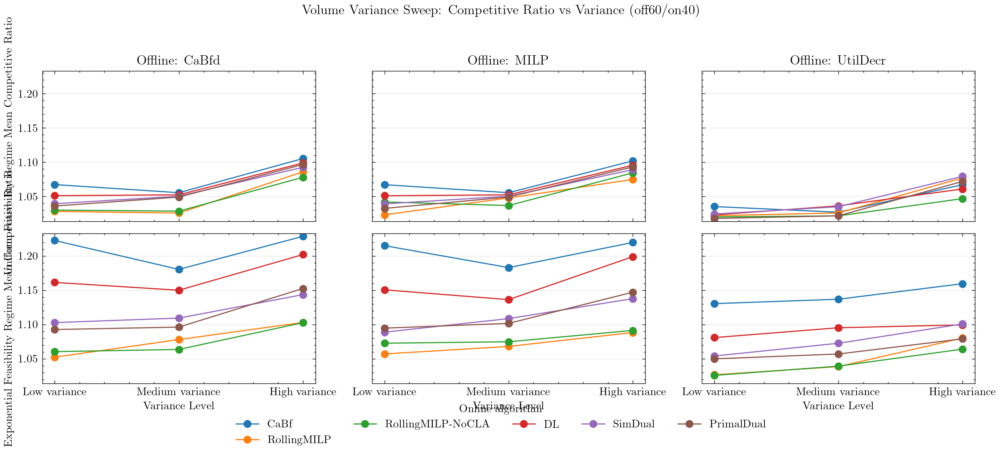

In [35]:
# FEAS_LOOP_BEGIN
# CR-only line plots across variance levels (rows = feasibility, cols = offline algo)
df_eval_all = df_eval_master if "df_eval_master" in globals() and df_eval_master is not None else df_eval
df_opt_all = df_opt_master if "df_opt_master" in globals() and df_opt_master is not None else df_opt
df_per_seed_all = df_per_seed_master if "df_per_seed_master" in globals() and df_per_seed_master is not None else df_per_seed
FIG_DIR_BASE = FIG_DIR_ROOT

if df_eval_all is not None and df_opt_all is not None:
    df_eval_use = df_eval_all.copy()
    df_opt_use = df_opt_all.copy()

    if "scenario_base" in df_eval_use.columns:
        df_eval_use["scenario"] = df_eval_use["scenario_base"]
    if "scenario_base" in df_opt_use.columns:
        df_opt_use["scenario"] = df_opt_use["scenario_base"]

    vol_scenarios = [
        "vol_lowvar_off60_on40",
        "vol_midvar_off60_on40",
        "vol_highuncert_uniform_same_load_off60_on40",
    ]

    df_eval_use = df_eval_use[df_eval_use["scenario"].isin(vol_scenarios)].copy()
    df_opt_use = df_opt_use[df_opt_use["scenario"].isin(vol_scenarios)].copy()

    if df_eval_use.empty or df_opt_use.empty:
        print("Volume variance sweep data not found")
    else:
        df_opt_key = df_opt_use[["scenario", "feasibility", "total_objective_mean"]].rename(
            columns={"total_objective_mean": "optimal_objective_mean"}
        )
        df_cr = df_eval_use.merge(df_opt_key, on=["scenario", "feasibility"], how="left")
        df_cr = df_cr[df_cr["optimal_objective_mean"].notna()].copy()
        df_cr["competitive_ratio"] = df_cr["total_objective_mean"] / df_cr["optimal_objective_mean"]

        disp_map = {
            "vol_lowvar_off60_on40": ("Low variance", 0),
            "vol_midvar_off60_on40": ("Medium variance", 1),
            "vol_highuncert_uniform_same_load_off60_on40": ("High variance", 2),
        }
        df_cr["disp_label"] = df_cr["scenario"].map(lambda x: disp_map.get(x, (x, 0))[0])
        df_cr["disp_order"] = df_cr["scenario"].map(lambda x: disp_map.get(x, (x, 0))[1])

        cr_agg = df_cr.groupby(
            ["feasibility", "offline_short", "online_short", "disp_order"], dropna=False
        ).agg(mean_cr=("competitive_ratio", "mean")).reset_index()

        offline_order = ["CaBfd", "MILP", "UtilDecr"]
        online_order = ["CaBf", "RollingMILP", "RollingMILP-NoCLA", "DL", "SimDual", "PrimalDual"]
        disp_order = [0, 1, 2]
        disp_labels = ["Low variance", "Medium variance", "High variance"]

        y_min = cr_agg["mean_cr"].min()
        y_max = cr_agg["mean_cr"].max()
        if pd.isna(y_min) or pd.isna(y_max):
            y_min, y_max = 0.0, 1.0
        y_pad = 0.02 * (y_max - y_min) if y_max > y_min else 0.02 * max(1.0, abs(y_max))

        nrows = len(FEAS_TAGS)
        ncols = len(offline_order)
        fig, axes = plt.subplots(
            nrows=nrows,
            ncols=ncols,
            figsize=(4.2 * ncols, 2.8 * max(1, nrows)),
            sharex=True,
            sharey=True,
        )

        if nrows == 1 and ncols == 1:
            axes = np.array([[axes]])
        elif nrows == 1:
            axes = np.array([axes])
        elif ncols == 1:
            axes = np.array([[ax] for ax in axes])

        colors = {algo: plt.cm.tab10(i % 10) for i, algo in enumerate(online_order)}

        for r, feas in enumerate(FEAS_TAGS):
            for c, offline in enumerate(offline_order):
                ax = axes[r, c]
                df_off = cr_agg[
                    (cr_agg["feasibility"] == feas)
                    & (cr_agg["offline_short"] == offline)
                ].copy()

                if df_off.empty:
                    if r == 0:
                        ax.set_title(f"Offline: {offline} (no data)")
                    ax.set_ylim(y_min - y_pad, y_max + y_pad)
                    ax.grid(True, axis="y", alpha=0.2)
                    continue

                for online in online_order:
                    df_on = df_off[df_off["online_short"] == online].copy()
                    if df_on.empty:
                        continue
                    df_on = df_on.set_index("disp_order").reindex(disp_order)
                    ax.plot(
                        disp_order,
                        df_on["mean_cr"].values,
                        marker="o",
                        label=str(online),
                        color=colors[online],
                    )

                if r == 0:
                    ax.set_title(f"Offline: {offline}")
                if c == 0:
                    if feas == "uniform":
                        setting = "Uniform Feasibility Regime"
                    else:
                        setting = "Exponential Feasibility Regime"
                    ax.set_ylabel(f"{setting} Mean Competitive Ratio")
                if r == nrows - 1:
                    ax.set_xlabel("Variance Level")
                ax.set_xticks(disp_order)
                ax.set_xticklabels(disp_labels)
                ax.set_ylim(y_min - y_pad, y_max + y_pad)
                ax.grid(True, axis="y", alpha=0.3)

        from matplotlib.lines import Line2D
        handles = [Line2D([0], [0], color=colors[a], marker="o", linestyle="-", label=a) for a in online_order]
        fig.legend(
            handles=handles,
            title="Online algorithm",
            ncol=min(5, len(handles)),
            loc="lower center",
            bbox_to_anchor=(0.5, -0.02),
        )

        fig.suptitle("Volume Variance Sweep: Competitive Ratio vs Variance (off60/on40)")
        fig.tight_layout(rect=[0, 0.05, 1, 0.95])
        fig.savefig(FIG_DIR_ROOT / "volume_variance_tradeoff_cr_lines_all_feas.pdf", dpi=200, bbox_inches="tight")
        plt.show()
else:
    print("Volume variance sweep data not found")

df_eval = df_eval_all
df_opt = df_opt_all
df_per_seed = df_per_seed_all
# FEAS_LOOP_END


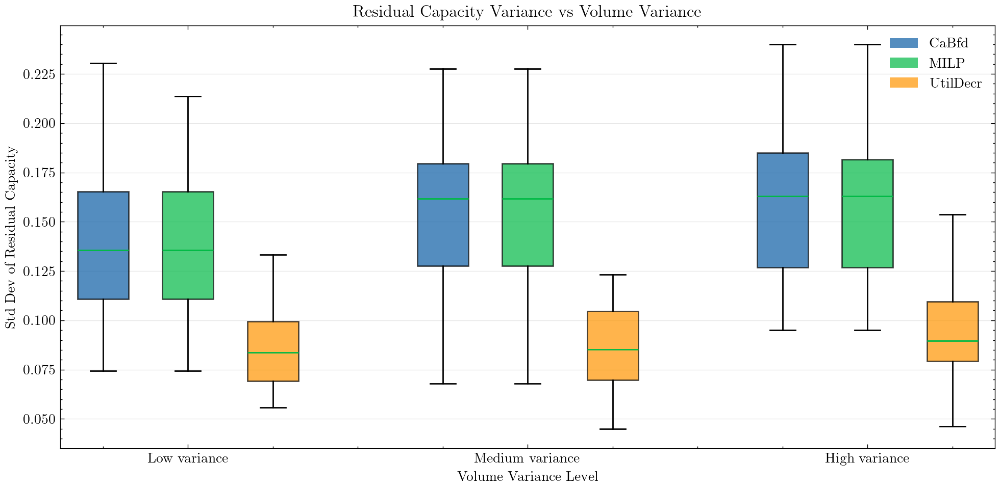

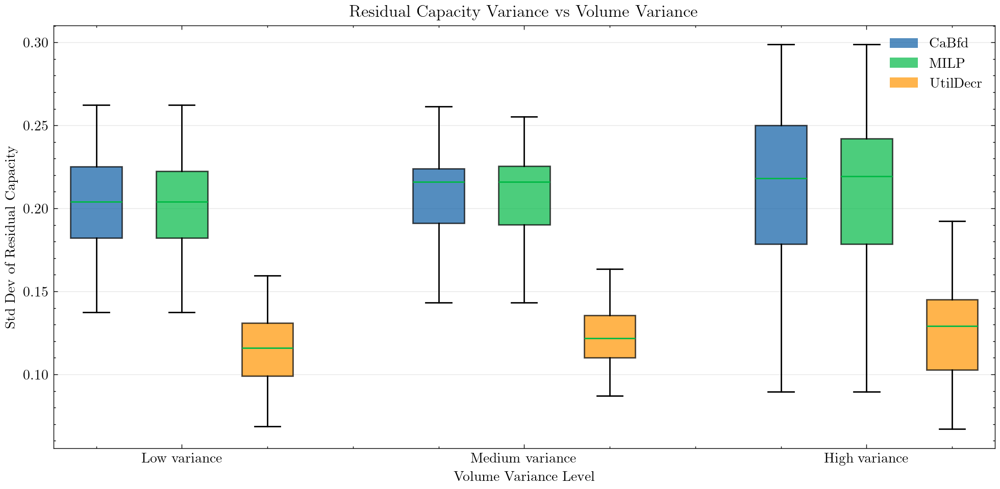

In [36]:
# FEAS_LOOP_BEGIN
df_eval_all = df_eval_master if "df_eval_master" in globals() and df_eval_master is not None else df_eval
df_opt_all = df_opt_master if "df_opt_master" in globals() and df_opt_master is not None else df_opt
df_per_seed_all = df_per_seed_master if "df_per_seed_master" in globals() and df_per_seed_master is not None else df_per_seed
FIG_DIR_BASE = FIG_DIR_ROOT
for feas in FEAS_TAGS:
    FIG_DIR = FIG_DIR_BASE / feas if FIGS_BY_FEAS else FIG_DIR_BASE
    FIG_DIR.mkdir(parents=True, exist_ok=True)
    df_eval = df_eval_all[df_eval_all["feasibility"] == feas].copy() if df_eval_all is not None else None
    df_opt = df_opt_all[df_opt_all["feasibility"] == feas].copy() if df_opt_all is not None else None
    df_per_seed = df_per_seed_all[df_per_seed_all["feasibility"] == feas].copy() if df_per_seed_all is not None else None
    if df_eval is not None and "scenario_base" in df_eval.columns:
        df_eval["scenario"] = df_eval["scenario_base"]
    if df_opt is not None and "scenario_base" in df_opt.columns:
        df_opt["scenario"] = df_opt["scenario_base"]
    if df_per_seed is not None and "scenario_base" in df_per_seed.columns:
        df_per_seed["scenario"] = df_per_seed["scenario_base"]
    # 1C: Volume Variance - Residual Capacity Variance
    if df_per_seed is not None:
        vol_scenarios = ["vol_lowvar_off60_on40", "vol_midvar_off60_on40", "vol_highuncert_uniform_same_load_off60_on40"]
    
        df_disp_res = df_per_seed[
            (df_per_seed["kind"] == "eval")
            & (df_per_seed["scenario"].isin(vol_scenarios))
        ].copy()
    
        if not df_disp_res.empty:
            # Filter for successful runs only
            offline_fail_statuses = {"INFEASIBLE", "INF_OR_UNBD", "UNBOUNDED"}
            df_disp_res = df_disp_res[~df_disp_res["offline_status"].isin(offline_fail_statuses)].copy()
        
            # Check if offline_util_per_bin data is available
            if "offline_util_per_bin" in df_disp_res.columns:
                df_disp_res = df_disp_res[df_disp_res["offline_util_per_bin"].notna()].copy()
            
                if not df_disp_res.empty:
                    # Calculate residual capacity variance for each run
                    def calc_residual_std(util_list):
                        if util_list is None or len(util_list) == 0:
                            return np.nan
                        residuals = 1.0 - np.array(util_list)
                        return np.std(residuals)
                
                    df_disp_res["residual_std"] = df_disp_res["offline_util_per_bin"].apply(calc_residual_std)
                    df_disp_res = df_disp_res[df_disp_res["residual_std"].notna()]
                
                    # Map scenario names
                    df_disp_res["dispersion"] = df_disp_res["scenario"].apply(map_dispersion_label)
                
                    # Plot box plot by dispersion level
                    fig, ax = plt.subplots(figsize=(10.0, 5.0))
                
                    dispersion_order = ["Low variance", "Medium variance", "High variance"]
                    offline_algos = ["CaBfd", "MILP", "UtilDecr"]
                
                    # Prepare data for box plot
                    data_by_dispersion = []
                    labels = []
                    positions = []
                    pos = 0
                
                    for disp in dispersion_order:
                        for i, algo in enumerate(offline_algos):
                            df_subset = df_disp_res[
                                (df_disp_res["dispersion"] == disp)
                                & (df_disp_res["offline_short"] == algo)
                            ]
                            if not df_subset.empty:
                                data_by_dispersion.append(df_subset["residual_std"].values)
                                labels.append(f"{algo}")
                                positions.append(pos)
                            pos += 1
                        pos += 1  # Gap between dispersion levels
                
                    if data_by_dispersion:
                        bp = ax.boxplot(
                            data_by_dispersion,
                            positions=positions,
                            widths=0.6,
                            patch_artist=True,
                            showfliers=False,
                        )
                    
                        # Color by algorithm
                        colors = {"CaBfd": "C0", "MILP": "C1", "UtilDecr": "C2"}
                        for patch, label in zip(bp['boxes'], labels):
                            algo = label.split()[0]
                            patch.set_facecolor(colors.get(algo, "gray"))
                            patch.set_alpha(0.7)
                    
                        ax.set_xlabel("Volume Variance Level")
                        ax.set_ylabel("Std Dev of Residual Capacity")
                        ax.set_title("Residual Capacity Variance vs Volume Variance")
                    
                        # Set x-tick labels
                        group_positions = []
                        pos = 0
                        for disp in dispersion_order:
                            group_positions.append(pos + (len(offline_algos) - 1) / 2)
                            pos += len(offline_algos) + 1
                    
                        ax.set_xticks(group_positions)
                        ax.set_xticklabels(dispersion_order)
                        ax.grid(True, axis="y", alpha=0.3)
                    
                        # Legend
                        from matplotlib.patches import Patch
                        legend_elements = [Patch(facecolor=colors[algo], alpha=0.7, label=algo) for algo in offline_algos]
                        ax.legend(handles=legend_elements, loc="best")
                    
                        fig.tight_layout()
                        fig.savefig(FIG_DIR / f"volume_dispersion_residual_variance_{feas}.pdf", dpi=200, bbox_inches="tight")
                        plt.show()
                    else:
                        print("No data to plot after filtering")
                else:
                    print("No valid residual capacity data after filtering")
            else:
                print("offline_util_per_bin column not found")
        else:
            print("Volume dispersion sweep data not found")
df_eval = df_eval_all
df_opt = df_opt_all
df_per_seed = df_per_seed_all
# FEAS_LOOP_END


<>:250: SyntaxWarning: invalid escape sequence '\s'
<>:267: SyntaxWarning: invalid escape sequence '\s'
<>:250: SyntaxWarning: invalid escape sequence '\s'
<>:267: SyntaxWarning: invalid escape sequence '\s'
/tmp/ipykernel_2067729/2633095944.py:250: SyntaxWarning: invalid escape sequence '\s'
  ax.set_ylabel(f"{setting}\n $\sigma$ of residual capacity")
/tmp/ipykernel_2067729/2633095944.py:267: SyntaxWarning: invalid escape sequence '\s'
  fig.suptitle("Volume Variance Sweep: Residual Capacity Standard Deviation ($\sigma$)")


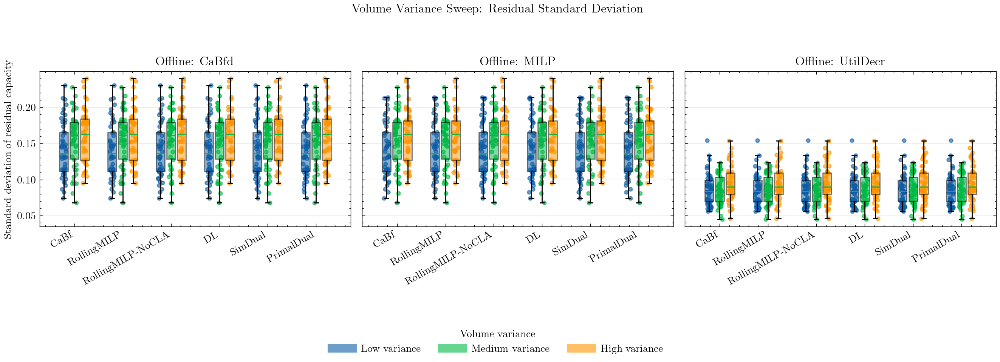

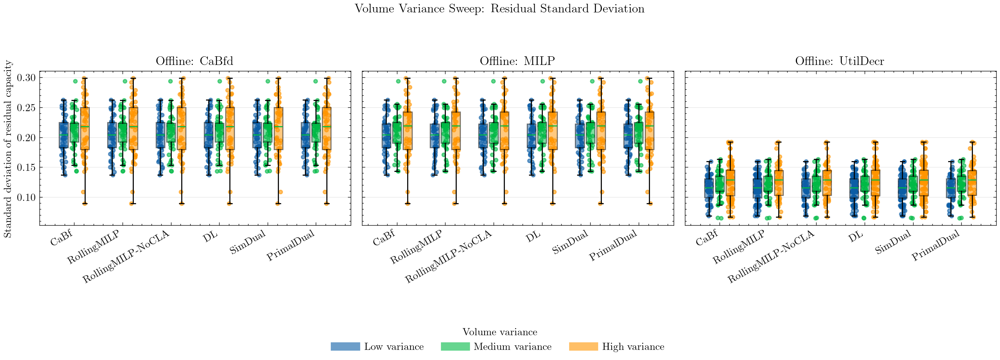

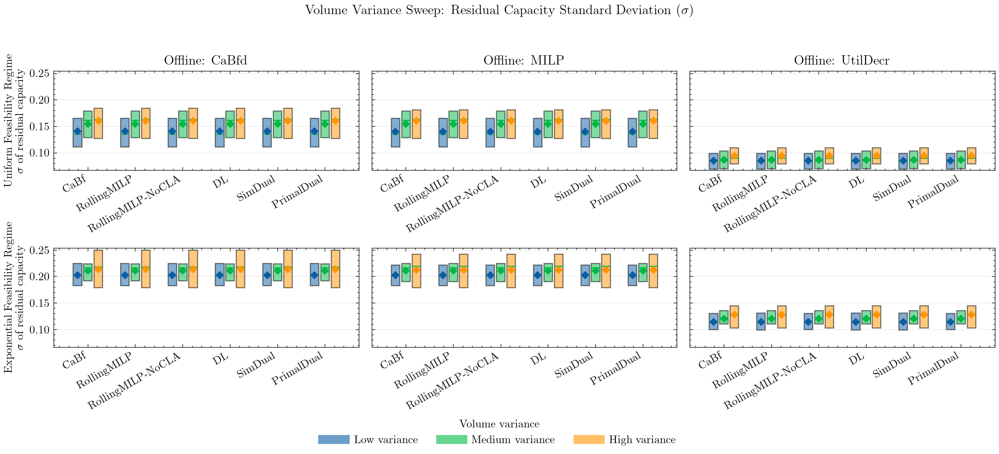

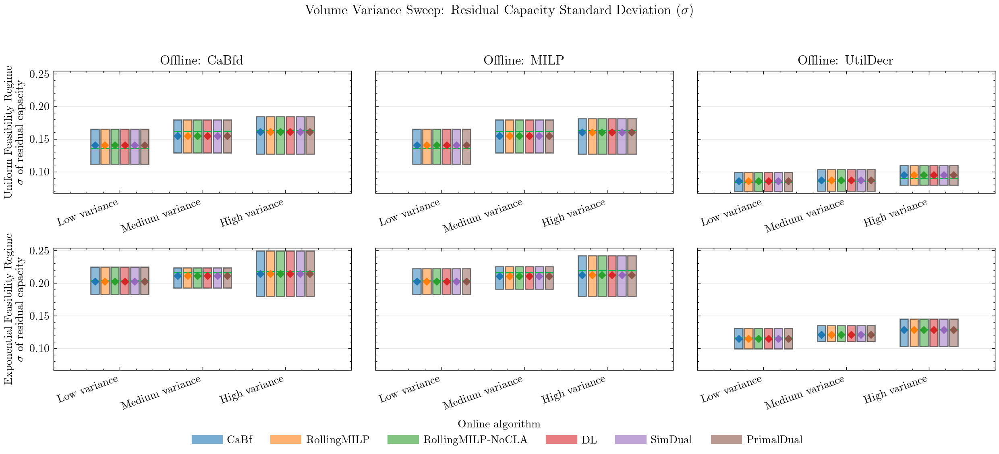

In [37]:
# FEAS_LOOP_BEGIN
df_eval_all = df_eval_master if "df_eval_master" in globals() and df_eval_master is not None else df_eval
df_opt_all = df_opt_master if "df_opt_master" in globals() and df_opt_master is not None else df_opt
df_per_seed_all = df_per_seed_master if "df_per_seed_master" in globals() and df_per_seed_master is not None else df_per_seed
FIG_DIR_BASE = FIG_DIR_ROOT

for feas in FEAS_TAGS:
    FIG_DIR = FIG_DIR_BASE / feas if FIGS_BY_FEAS else FIG_DIR_BASE
    FIG_DIR.mkdir(parents=True, exist_ok=True)
    df_eval = df_eval_all[df_eval_all["feasibility"] == feas].copy() if df_eval_all is not None else None
    df_opt = df_opt_all[df_opt_all["feasibility"] == feas].copy() if df_opt_all is not None else None
    df_per_seed = df_per_seed_all[df_per_seed_all["feasibility"] == feas].copy() if df_per_seed_all is not None else None
    if df_eval is not None and "scenario_base" in df_eval.columns:
        df_eval["scenario"] = df_eval["scenario_base"]
    if df_opt is not None and "scenario_base" in df_opt.columns:
        df_opt["scenario"] = df_opt["scenario_base"]
    if df_per_seed is not None and "scenario_base" in df_per_seed.columns:
        df_per_seed["scenario"] = df_per_seed["scenario_base"]

    # 1C: Volume Variance - Residual Capacity Variance (per feas)
    if df_per_seed is not None:
        vol_scenarios = [
            "vol_lowvar_off60_on40",
            "vol_midvar_off60_on40",
            "vol_highuncert_uniform_same_load_off60_on40",
        ]

        df_disp_res = df_per_seed[
            (df_per_seed["kind"] == "eval")
            & (df_per_seed["scenario"].isin(vol_scenarios))
        ].copy()

        if not df_disp_res.empty:
            offline_fail_statuses = {"INFEASIBLE", "INF_OR_UNBD", "UNBOUNDED"}
            df_disp_res = df_disp_res[~df_disp_res["offline_status"].isin(offline_fail_statuses)].copy()

            if "offline_util_per_bin" in df_disp_res.columns:
                df_disp_res = df_disp_res[df_disp_res["offline_util_per_bin"].notna()].copy()

                if not df_disp_res.empty:
                    def calc_residual_std(util_list):
                        if util_list is None or len(util_list) == 0:
                            return float("nan")
                        residuals = 1.0 - np.array(util_list)
                        return float(np.std(residuals))

                    df_disp_res["residual_std"] = df_disp_res["offline_util_per_bin"].apply(calc_residual_std)
                    df_disp_res = df_disp_res[df_disp_res["residual_std"].notna()]

                    df_disp_res["dispersion"] = df_disp_res["scenario"].apply(map_dispersion_label)

                    offline_order = ["CaBfd", "MILP", "UtilDecr"]
                    online_order = ["CaBf", "RollingMILP", "RollingMILP-NoCLA", "DL", "SimDual", "PrimalDual"]
                    dispersion_order = ["Low variance", "Medium variance", "High variance"]
                    disp_colors = {"Low variance": "C0", "Medium variance": "C1", "High variance": "C2"}

                    fig, axes = plt.subplots(1, 3, figsize=(13.5, 4.2), sharey=True)
                    rng = np.random.default_rng(3)

                    for ax, offline_algo in zip(axes, offline_order):
                        df_off = df_disp_res[df_disp_res["offline_short"] == offline_algo].copy()
                        if df_off.empty:
                            ax.set_title(f"Offline: {offline_algo} (no data)")
                            ax.axis("off")
                            continue

                        base_positions = np.arange(1, len(online_order) + 1)
                        width = 0.22
                        offsets = [-width, 0.0, width]

                        for disp, offset in zip(dispersion_order, offsets):
                            data = []
                            positions = []
                            for i, online_algo in enumerate(online_order):
                                vals = df_off[
                                    (df_off["online_short"] == online_algo)
                                    & (df_off["dispersion"] == disp)
                                ]["residual_std"].dropna().values
                                data.append(vals if len(vals) else [np.nan])
                                positions.append(base_positions[i] + offset)

                            bp = ax.boxplot(
                                data,
                                positions=positions,
                                widths=0.18,
                                showfliers=False,
                                patch_artist=True,
                            )
                            for patch in bp["boxes"]:
                                patch.set_facecolor(disp_colors[disp])
                                patch.set_alpha(0.5)

                            for pos, vals in zip(positions, data):
                                vals = np.array(vals, dtype=float)
                                vals = vals[~np.isnan(vals)]
                                if len(vals) == 0:
                                    continue
                                jitter = rng.uniform(-0.05, 0.05, size=len(vals))
                                ax.scatter(pos + jitter, vals, s=12, alpha=0.6, color=disp_colors[disp])

                        ax.set_title(f"Offline: {offline_algo}")
                        ax.set_xticks(base_positions)
                        ax.set_xticklabels(online_order, rotation=30, ha="right")
                        ax.grid(True, axis="y", alpha=0.3)

                    axes[0].set_ylabel("Standard deviation of residual capacity")
                    handles = [
                        plt.Line2D([0], [0], color=disp_colors[d], lw=8, alpha=0.6, label=d)
                        for d in dispersion_order
                    ]
                    fig.legend(handles=handles, title="Volume variance", loc="upper center", ncol=3, bbox_to_anchor=(0.5, -0.02))
                    fig.suptitle("Volume Variance Sweep: Residual Standard Deviation")
                    fig.tight_layout(rect=[0, 0.05, 1, 0.92])
                    fig.savefig(FIG_DIR / f"volume_dispersion_residual_variance_{feas}.pdf", dpi=200, bbox_inches="tight")
                    plt.show()
                else:
                    print("No valid residual capacity data after filtering")
            else:
                print("offline_util_per_bin column not found")
        else:
            print("Volume dispersion sweep data not found")

# Combined plot: residual variance by dispersion and algorithm (all feas)
if df_per_seed_all is not None:
    df_disp_res_all = df_per_seed_all[df_per_seed_all["kind"] == "eval"].copy()
    if "scenario_base" in df_disp_res_all.columns:
        df_disp_res_all["scenario"] = df_disp_res_all["scenario_base"]

    vol_scenarios = [
        "vol_lowvar_off60_on40",
        "vol_midvar_off60_on40",
        "vol_highuncert_uniform_same_load_off60_on40",
    ]
    df_disp_res_all = df_disp_res_all[df_disp_res_all["scenario"].isin(vol_scenarios)].copy()

    if not df_disp_res_all.empty:
        offline_fail_statuses = {"INFEASIBLE", "INF_OR_UNBD", "UNBOUNDED"}
        df_disp_res_all = df_disp_res_all[~df_disp_res_all["offline_status"].isin(offline_fail_statuses)].copy()

        if "offline_util_per_bin" in df_disp_res_all.columns:
            df_disp_res_all = df_disp_res_all[df_disp_res_all["offline_util_per_bin"].notna()].copy()

            if not df_disp_res_all.empty:
                def calc_residual_std(util_list):
                    if util_list is None or len(util_list) == 0:
                        return float("nan")
                    residuals = 1.0 - np.array(util_list)
                    return float(np.std(residuals))

                df_disp_res_all["residual_std"] = df_disp_res_all["offline_util_per_bin"].apply(calc_residual_std)
                df_disp_res_all = df_disp_res_all[df_disp_res_all["residual_std"].notna()]

                df_disp_res_all["dispersion"] = df_disp_res_all["scenario"].apply(map_dispersion_label)
                df_disp_res_all = df_disp_res_all[df_disp_res_all["dispersion"].notna()].copy()

                offline_order = ["CaBfd", "MILP", "UtilDecr"]
                online_order = ["CaBf", "RollingMILP", "RollingMILP-NoCLA", "DL", "SimDual", "PrimalDual"]
                dispersion_order = ["Low variance", "Medium variance", "High variance"]
                disp_colors = {"Low variance": "C0", "Medium variance": "C1", "High variance": "C2"}

                # Use a tighter robust range so differences in residual variance are more visible.
                y_min = df_disp_res_all["residual_std"].quantile(0.05)
                y_max = df_disp_res_all["residual_std"].quantile(0.95)
                if pd.isna(y_min) or pd.isna(y_max) or y_min >= y_max:
                    y_min = df_disp_res_all["residual_std"].quantile(0.01)
                    y_max = df_disp_res_all["residual_std"].quantile(0.99)
                if pd.isna(y_min) or pd.isna(y_max) or y_min >= y_max:
                    y_min = df_disp_res_all["residual_std"].min()
                    y_max = df_disp_res_all["residual_std"].max()
                if pd.isna(y_min) or pd.isna(y_max):
                    y_min, y_max = 0.0, 1.0
                y_pad = 0.03 * (y_max - y_min) if y_max > y_min else 0.03 * max(1.0, abs(y_max))

                nrows = len(FEAS_TAGS)
                ncols = len(offline_order)
                fig, axes = plt.subplots(
                    nrows=nrows,
                    ncols=ncols,
                    figsize=(4.2 * ncols, 2.8 * max(1, nrows)),
                    sharey=True,
                    sharex=False,
                )

                if nrows == 1 and ncols == 1:
                    axes = np.array([[axes]])
                elif nrows == 1:
                    axes = np.array([axes])
                elif ncols == 1:
                    axes = np.array([[ax] for ax in axes])


                for r, feas in enumerate(FEAS_TAGS):
                    for c, offline_algo in enumerate(offline_order):
                        ax = axes[r, c]
                        df_off = df_disp_res_all[
                            (df_disp_res_all["feasibility"] == feas)
                            & (df_disp_res_all["offline_short"] == offline_algo)
                        ].copy()

                        if df_off.empty:
                            if r == 0:
                                ax.set_title(f"Offline: {offline_algo} (no data)")
                            ax.set_ylim(y_min - y_pad, y_max + y_pad)
                            ax.grid(True, axis="y", alpha=0.2)
                            continue

                        base_positions = np.arange(1, len(online_order) + 1)
                        width = 0.22
                        offsets = [-width, 0.0, width]

                        for disp, offset in zip(dispersion_order, offsets):
                            data = []
                            positions = []
                            for i, online_algo in enumerate(online_order):
                                vals = df_off[
                                    (df_off["online_short"] == online_algo)
                                    & (df_off["dispersion"] == disp)
                                ]["residual_std"].dropna().values
                                data.append(vals if len(vals) else [np.nan])
                                positions.append(base_positions[i] + offset)

                            bp = ax.boxplot(
                                data,
                                positions=positions,
                                widths=0.18,
                                showfliers=False,
                                patch_artist=True,
                                whiskerprops={"linewidth": 0},
                                capprops={"linewidth": 0},
                            )
                            for patch in bp["boxes"]:
                                patch.set_facecolor(disp_colors[disp])
                                patch.set_alpha(0.5)

                            for pos, vals in zip(positions, data):
                                vals = np.array(vals, dtype=float)
                                vals = vals[~np.isnan(vals)]
                                if len(vals) == 0:
                                    continue
                                mean_val = float(np.mean(vals))
                                ax.scatter(pos, mean_val, s=18, color=disp_colors[disp], marker="D", zorder=3)

                        if r == 0:
                            ax.set_title(f"Offline: {offline_algo}")
                        if c == 0:
                            if feas == "uniform":
                                setting = "Uniform Feasibility Regime"
                            else: 
                                setting = "Exponential Feasibility Regime"
                            ax.set_ylabel(f"{setting}\n $\sigma$ of residual capacity")
                        ax.set_xticks(base_positions)
                        ax.set_xticklabels(online_order, rotation=30, ha="right")
                        ax.set_ylim(y_min - y_pad, y_max + y_pad)
                        ax.grid(True, axis="y", alpha=0.3)

                handles = [
                    plt.Line2D([0], [0], color=disp_colors[d], lw=8, alpha=0.6, label=d)
                    for d in dispersion_order
                ]
                fig.legend(
                    handles=handles,
                    title="Volume variance",
                    loc="lower center",
                    ncol=3,
                    bbox_to_anchor=(0.5, -0.02),
                )
                fig.suptitle("Volume Variance Sweep: Residual Capacity Standard Deviation ($\sigma$)")
                fig.tight_layout(rect=[0, 0.05, 1, 0.95])
                fig.savefig(FIG_DIR_ROOT / "volume_dispersion_residual_variance_all_feas.pdf", dpi=200, bbox_inches="tight")
                plt.show()

                # Additional boxplot grid: x-axis = variance, grouped by online algorithm
                hybrid_online_order = ["CaBf", "RollingMILP", "RollingMILP-NoCLA", "DL", "SimDual", "PrimalDual"]
                online_colors = {algo: plt.cm.tab10(i % 10) for i, algo in enumerate(hybrid_online_order)}
                fig, axes = plt.subplots(
                    nrows=nrows,
                    ncols=ncols,
                    figsize=(4.2 * ncols, 2.8 * max(1, nrows)),
                    sharey=True,
                    sharex=False,
                )

                if nrows == 1 and ncols == 1:
                    axes = np.array([[axes]])
                elif nrows == 1:
                    axes = np.array([axes])
                elif ncols == 1:
                    axes = np.array([[ax] for ax in axes])

                box_width = 0.12
                online_offsets = np.linspace(-(len(online_order) - 1) / 2 * box_width, (len(online_order) - 1) / 2 * box_width, len(online_order))

                for r, feas in enumerate(FEAS_TAGS):
                    for c, offline_algo in enumerate(offline_order):
                        ax = axes[r, c]
                        df_off = df_disp_res_all[
                            (df_disp_res_all["feasibility"] == feas)
                            & (df_disp_res_all["offline_short"] == offline_algo)
                        ].copy()

                        if df_off.empty:
                            if r == 0:
                                ax.set_title(f"Offline: {offline_algo} (no data)")
                            if c == 0:
                                if feas == "uniform":
                                    setting = "Uniform Feasibility Regime"
                                else:
                                    setting = "Exponential Feasibility Regime"
                                ax.set_ylabel(f"{setting}\n $\\sigma$ of residual capacity")
                            ax.set_ylim(y_min - y_pad, y_max + y_pad)
                            ax.grid(True, axis="y", alpha=0.2)
                            continue

                        base_positions = np.arange(1, len(dispersion_order) + 1)

                        for online_algo, offset in zip(online_order, online_offsets):
                            data = []
                            positions = []
                            for i, disp in enumerate(dispersion_order):
                                vals = df_off[
                                    (df_off["online_short"] == online_algo)
                                    & (df_off["dispersion"] == disp)
                                ]["residual_std"].dropna().values
                                data.append(vals if len(vals) else [np.nan])
                                positions.append(base_positions[i] + offset)

                            bp = ax.boxplot(
                                data,
                                positions=positions,
                                widths=0.10,
                                showfliers=False,
                                patch_artist=True,
                                whiskerprops={"linewidth": 0},
                                capprops={"linewidth": 0},
                            )
                            for patch in bp["boxes"]:
                                patch.set_facecolor(online_colors[online_algo])
                                patch.set_alpha(0.5)

                            for pos, vals in zip(positions, data):
                                vals = np.array(vals, dtype=float)
                                vals = vals[~np.isnan(vals)]
                                if len(vals) == 0:
                                    continue
                                mean_val = float(np.mean(vals))
                                ax.scatter(pos, mean_val, s=18, color=online_colors[online_algo], marker="D", zorder=3)

                        if r == 0:
                            ax.set_title(f"Offline: {offline_algo}")
                        if c == 0:
                            if feas == "uniform":
                                setting = "Uniform Feasibility Regime"
                            else:
                                setting = "Exponential Feasibility Regime"
                            ax.set_ylabel(f"{setting}\n $\\sigma$ of residual capacity")
                        ax.set_xticks(base_positions)
                        ax.set_xticklabels(dispersion_order, rotation=20, ha="right")
                        ax.set_ylim(y_min - y_pad, y_max + y_pad)
                        ax.grid(True, axis="y", alpha=0.3)

                handles = [
                    plt.Line2D([0], [0], color=online_colors[a], lw=8, alpha=0.6, label=a)
                    for a in online_order
                ]
                fig.legend(
                    handles=handles,
                    title="Online algorithm",
                    loc="lower center",
                    ncol=len(online_order),
                    bbox_to_anchor=(0.5, -0.02),
                )
                fig.suptitle("Volume Variance Sweep: Residual Capacity Standard Deviation ($\\sigma$)")
                fig.tight_layout(rect=[0, 0.05, 1, 0.95])
                fig.savefig(FIG_DIR_ROOT / "volume_dispersion_residual_variance_grouped_by_algo_all_feas.pdf", dpi=200, bbox_inches="tight")
                plt.show()
            else:
                print("No valid residual capacity data after filtering (all feas)")
        else:
            print("offline_util_per_bin column not found (all feas)")
    else:
        print("Volume dispersion sweep data not found (all feas)")

df_eval = df_eval_all
df_opt = df_opt_all
df_per_seed = df_per_seed_all
# FEAS_LOOP_END


# Feasibility Sparsity Sweep Analysis

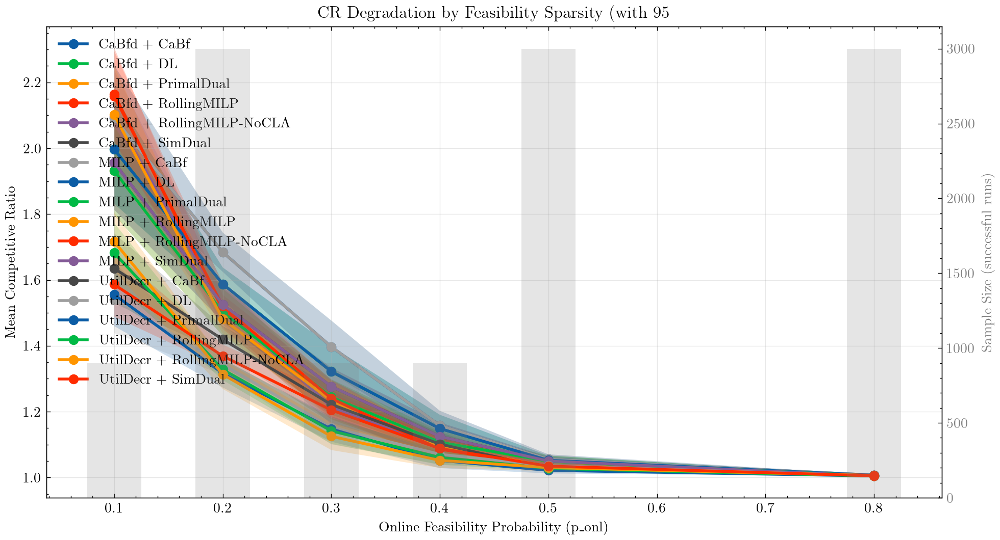

In [38]:
# FEAS_LOOP_BEGIN
df_eval_all = df_eval_master if "df_eval_master" in globals() and df_eval_master is not None else df_eval
df_opt_all = df_opt_master if "df_opt_master" in globals() and df_opt_master is not None else df_opt
df_per_seed_all = df_per_seed_master if "df_per_seed_master" in globals() and df_per_seed_master is not None else df_per_seed
FIG_DIR_BASE = FIG_DIR_ROOT
for feas in FEAS_TAGS:
    FIG_DIR = FIG_DIR_BASE / feas if FIGS_BY_FEAS else FIG_DIR_BASE
    FIG_DIR.mkdir(parents=True, exist_ok=True)
    df_eval = df_eval_all[df_eval_all["feasibility"] == feas].copy() if df_eval_all is not None else None
    df_opt = df_opt_all[df_opt_all["feasibility"] == feas].copy() if df_opt_all is not None else None
    df_per_seed = df_per_seed_all[df_per_seed_all["feasibility"] == feas].copy() if df_per_seed_all is not None else None
    if df_eval is not None and "scenario_base" in df_eval.columns:
        df_eval["scenario"] = df_eval["scenario_base"]
    if df_opt is not None and "scenario_base" in df_opt.columns:
        df_opt["scenario"] = df_opt["scenario_base"]
    if df_per_seed is not None and "scenario_base" in df_per_seed.columns:
        df_per_seed["scenario"] = df_per_seed["scenario_base"]
    if feas != "uniform":
        continue
    # 2B: Feasibility Sparsity - CR Degradation Near Boundary
    if df_per_seed is not None:
        sparse_scenarios = [
            "graph_0.1_off60_on40",
            "graph_sparse_off60_on40",
            "graph_0.3_off60_on40",
            "graph_0.4_off60_on40",
            "graph_mid_off60_on40",
            "graph_dense_off60_on40",
        ]

        df_sparse_cr = df_per_seed[
            (df_per_seed["kind"] == "eval")
            & (df_per_seed["scenario"].isin(sparse_scenarios))
        ].copy()

        df_opt_sparse = df_per_seed[
            (df_per_seed["kind"] == "optimal")
            & (df_per_seed["scenario"].isin(sparse_scenarios))
        ].copy()

        if not df_sparse_cr.empty:
            # Filter for successful runs
            offline_fail_statuses = {"INFEASIBLE", "INF_OR_UNBD", "UNBOUNDED"}
            online_fail_statuses = {"INFEASIBLE"}

            df_sparse_success = df_sparse_cr[
                (~df_sparse_cr["offline_status"].isin(offline_fail_statuses))
                & (~df_sparse_cr["online_status"].isin(online_fail_statuses))
            ].copy()

            df_opt_success = df_opt_sparse[
                ~df_opt_sparse["status"].isin(offline_fail_statuses)
            ].copy()
            df_opt_success = df_opt_success.rename(columns={"total_objective": "optimal_objective"})

            # Merge with optimal
            df_sparse_merged = df_sparse_success.merge(
                df_opt_success[["scenario", "seed", "optimal_objective"]],
                on=["scenario", "seed"],
                how="left",
            )

            df_sparse_merged = df_sparse_merged[df_sparse_merged["optimal_objective"].notna()]
            df_sparse_merged = df_sparse_merged[df_sparse_merged["total_objective"].notna()]
            df_sparse_merged["competitive_ratio"] = (
                df_sparse_merged["total_objective"] / df_sparse_merged["optimal_objective"]
            )

            # Map scenarios
            sparsity_map = {
                "graph_0.1_off60_on40": ("p_onl=0.1", 0.1),
                "graph_sparse_off60_on40": ("p_onl=0.2", 0.2),
                "graph_0.3_off60_on40": ("p_onl=0.3", 0.3),
                "graph_0.4_off60_on40": ("p_onl=0.4", 0.4),
                "graph_mid_off60_on40": ("p_onl=0.5", 0.5),
                "graph_dense_off60_on40": ("p_onl=0.8", 0.8),
            }
            df_sparse_merged["sparsity_label"] = df_sparse_merged["scenario"].map(lambda x: sparsity_map.get(x, (x, 0))[0])
            df_sparse_merged["sparsity_val"] = df_sparse_merged["scenario"].map(lambda x: sparsity_map.get(x, (x, 0))[1])

            # Count samples per sparsity level
            sample_counts = df_sparse_merged.groupby(["sparsity_label", "sparsity_val"]).size().reset_index(name="sample_size")

            # Create figure with two y-axes
            fig, ax1 = plt.subplots(figsize=(10.0, 5.5))

            pipelines = sorted(df_sparse_merged["pipeline"].unique())

            # Plot CR with confidence bands
            for pipeline in pipelines:
                df_pipe = df_sparse_merged[df_sparse_merged["pipeline"] == pipeline]
                df_agg = df_pipe.groupby(["sparsity_label", "sparsity_val"]).agg(
                    mean_cr=("competitive_ratio", "mean"),
                    std_cr=("competitive_ratio", "std"),
                    count=("competitive_ratio", "count"),
                ).reset_index()

                # Calculate 95% confidence interval
                df_agg["ci"] = 1.96 * df_agg["std_cr"] / np.sqrt(df_agg["count"])
                df_agg = df_agg.sort_values("sparsity_val")

                ax1.plot(
                    df_agg["sparsity_val"],
                    df_agg["mean_cr"],
                    marker="o",
                    label=pipeline,
                    linewidth=2,
                    markersize=6,
                )
                ax1.fill_between(
                    df_agg["sparsity_val"],
                    df_agg["mean_cr"] - df_agg["ci"],
                    df_agg["mean_cr"] + df_agg["ci"],
                    alpha=0.2,
                )

            ax1.set_xlabel("Online Feasibility Probability (p_onl)")
            ax1.set_ylabel("Mean Competitive Ratio")
            ax1.set_title("CR Degradation by Feasibility Sparsity (with 95% CI)")
            ax1.legend(loc="upper left")
            ax1.grid(True, alpha=0.3)

            # Add secondary y-axis for sample size
            ax2 = ax1.twinx()
            sample_counts_sorted = sample_counts.sort_values("sparsity_val")
            ax2.bar(
                sample_counts_sorted["sparsity_val"],
                sample_counts_sorted["sample_size"],
                alpha=0.2,
                color="gray",
                width=0.05,
            )
            ax2.set_ylabel("Sample Size (successful runs)", color="gray")
            ax2.tick_params(axis="y", labelcolor="gray")

            fig.tight_layout()
            fig.savefig(FIG_DIR / f"feasibility_sparsity_cr_degradation_{feas}.pdf", dpi=200, bbox_inches="tight")
            plt.show()
        else:
            print("Feasibility sparsity sweep data not found")
df_eval = df_eval_all
df_opt = df_opt_all
df_per_seed = df_per_seed_all
# FEAS_LOOP_END


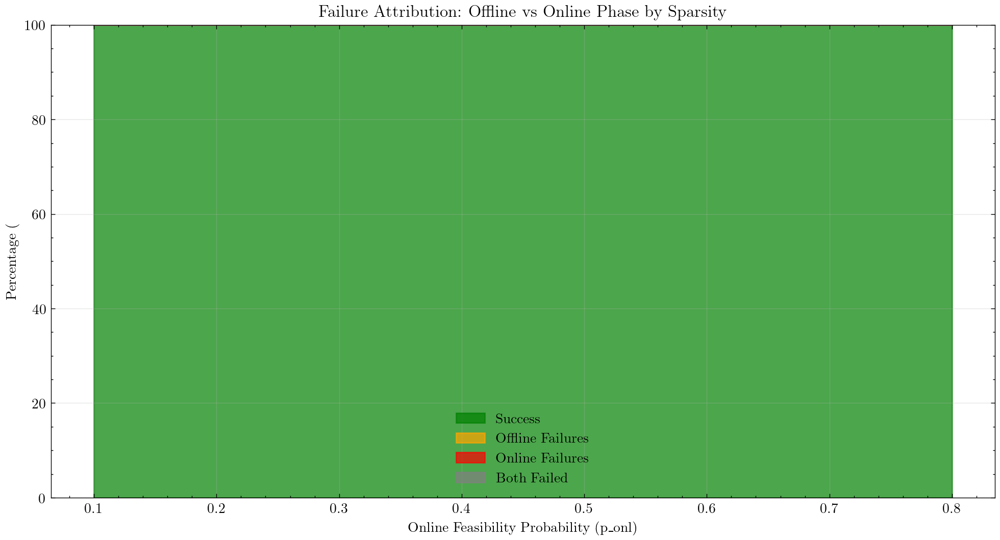

In [39]:
# FEAS_LOOP_BEGIN
df_eval_all = df_eval_master if "df_eval_master" in globals() and df_eval_master is not None else df_eval
df_opt_all = df_opt_master if "df_opt_master" in globals() and df_opt_master is not None else df_opt
df_per_seed_all = df_per_seed_master if "df_per_seed_master" in globals() and df_per_seed_master is not None else df_per_seed
FIG_DIR_BASE = FIG_DIR_ROOT
for feas in FEAS_TAGS:
    FIG_DIR = FIG_DIR_BASE / feas if FIGS_BY_FEAS else FIG_DIR_BASE
    FIG_DIR.mkdir(parents=True, exist_ok=True)
    df_eval = df_eval_all[df_eval_all["feasibility"] == feas].copy() if df_eval_all is not None else None
    df_opt = df_opt_all[df_opt_all["feasibility"] == feas].copy() if df_opt_all is not None else None
    df_per_seed = df_per_seed_all[df_per_seed_all["feasibility"] == feas].copy() if df_per_seed_all is not None else None
    if df_eval is not None and "scenario_base" in df_eval.columns:
        df_eval["scenario"] = df_eval["scenario_base"]
    if df_opt is not None and "scenario_base" in df_opt.columns:
        df_opt["scenario"] = df_opt["scenario_base"]
    if df_per_seed is not None and "scenario_base" in df_per_seed.columns:
        df_per_seed["scenario"] = df_per_seed["scenario_base"]
    if feas != "uniform":
        continue
    # 2C: Feasibility Sparsity - Offline vs Online Failure Attribution
    if df_per_seed is not None:
        sparse_scenarios = [
            "graph_0.1_off60_on40",
            "graph_sparse_off60_on40",
            "graph_0.3_off60_on40",
            "graph_0.4_off60_on40",
            "graph_mid_off60_on40",
            "graph_dense_off60_on40",
        ]

        df_sparse_attr = df_per_seed[
            (df_per_seed["kind"] == "eval")
            & (df_per_seed["scenario"].isin(sparse_scenarios))
        ].copy()

        if not df_sparse_attr.empty:
            # Define failure statuses
            offline_fail_statuses = {"INFEASIBLE", "INF_OR_UNBD", "UNBOUNDED"}
            online_fail_statuses = {"INFEASIBLE"}

            # Categorize failures (mutually exclusive for plotting)
            df_sparse_attr["offline_failed"] = df_sparse_attr["offline_status"].isin(offline_fail_statuses)
            df_sparse_attr["online_failed"] = df_sparse_attr["online_status"].isin(online_fail_statuses)
            df_sparse_attr["both_failed"] = df_sparse_attr["offline_failed"] & df_sparse_attr["online_failed"]
            df_sparse_attr["offline_only"] = df_sparse_attr["offline_failed"] & ~df_sparse_attr["online_failed"]
            df_sparse_attr["online_only"] = df_sparse_attr["online_failed"] & ~df_sparse_attr["offline_failed"]
            df_sparse_attr["both_success"] = (~df_sparse_attr["offline_failed"]) & (~df_sparse_attr["online_failed"])

            # Map scenarios
            sparsity_map = {
                "graph_0.1_off60_on40": ("p_onl=0.1", 0.1),
                "graph_sparse_off60_on40": ("p_onl=0.2", 0.2),
                "graph_0.3_off60_on40": ("p_onl=0.3", 0.3),
                "graph_0.4_off60_on40": ("p_onl=0.4", 0.4),
                "graph_mid_off60_on40": ("p_onl=0.5", 0.5),
                "graph_dense_off60_on40": ("p_onl=0.8", 0.8),
            }
            df_sparse_attr["sparsity_label"] = df_sparse_attr["scenario"].map(lambda x: sparsity_map.get(x, (x, 0))[0])
            df_sparse_attr["sparsity_val"] = df_sparse_attr["scenario"].map(lambda x: sparsity_map.get(x, (x, 0))[1])

            # Aggregate by sparsity level
            df_attr_agg = df_sparse_attr.groupby(["sparsity_label", "sparsity_val"], dropna=False).agg(
                total=("seed", "count"),
                offline_only=("offline_only", "sum"),
                online_only=("online_only", "sum"),
                both_failed=("both_failed", "sum"),
                both_success=("both_success", "sum"),
            ).reset_index()

            # Calculate percentages
            df_attr_agg["offline_fail_pct"] = (df_attr_agg["offline_only"] / df_attr_agg["total"] * 100)
            df_attr_agg["online_fail_pct"] = (df_attr_agg["online_only"] / df_attr_agg["total"] * 100)
            df_attr_agg["both_fail_pct"] = (df_attr_agg["both_failed"] / df_attr_agg["total"] * 100)
            df_attr_agg["success_pct"] = (df_attr_agg["both_success"] / df_attr_agg["total"] * 100)
            df_attr_agg = df_attr_agg.sort_values("sparsity_val")

            # Plot stacked area chart
            fig, ax = plt.subplots(figsize=(10.0, 5.5))

            sparsity_vals = df_attr_agg["sparsity_val"].values
            success_vals = df_attr_agg["success_pct"].values
            offline_vals = df_attr_agg["offline_fail_pct"].values
            online_vals = df_attr_agg["online_fail_pct"].values
            both_vals = df_attr_agg["both_fail_pct"].values

            ax.fill_between(sparsity_vals, 0, success_vals, alpha=0.7, label="Success", color="green")
            ax.fill_between(
                sparsity_vals,
                success_vals,
                success_vals + offline_vals,
                alpha=0.7,
                label="Offline Failures",
                color="orange",
            )
            ax.fill_between(
                sparsity_vals,
                success_vals + offline_vals,
                success_vals + offline_vals + online_vals,
                alpha=0.7,
                label="Online Failures",
                color="red",
            )
            ax.fill_between(
                sparsity_vals,
                success_vals + offline_vals + online_vals,
                success_vals + offline_vals + online_vals + both_vals,
                alpha=0.7,
                label="Both Failed",
                color="gray",
            )

            ax.set_xlabel("Online Feasibility Probability (p_onl)")
            ax.set_ylabel("Percentage (%)")
            ax.set_title("Failure Attribution: Offline vs Online Phase by Sparsity")
            ax.legend(loc="best")
            ax.grid(True, alpha=0.3)
            ax.set_ylim([0, 100])

            fig.tight_layout()
            fig.savefig(FIG_DIR / f"feasibility_sparsity_failure_attribution_{feas}.pdf", dpi=200, bbox_inches="tight")
            plt.show()
        else:
            print("Feasibility sparsity sweep data not found")
df_eval = df_eval_all
df_opt = df_opt_all
df_per_seed = df_per_seed_all
# FEAS_LOOP_END


/tmp/ipykernel_2067729/2450964208.py:116: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(


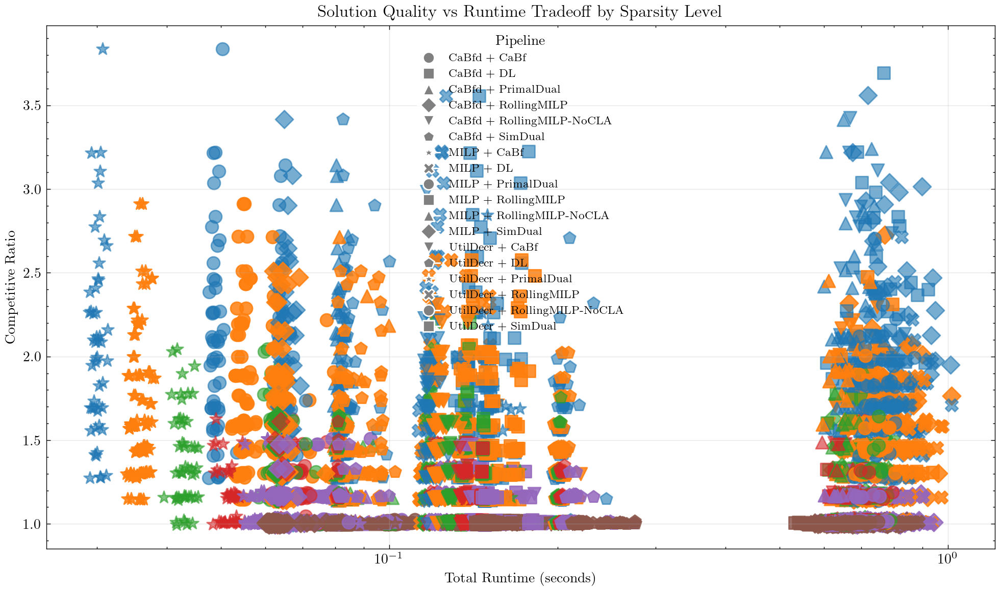

In [40]:
# FEAS_LOOP_BEGIN
df_eval_all = df_eval_master if "df_eval_master" in globals() and df_eval_master is not None else df_eval
df_opt_all = df_opt_master if "df_opt_master" in globals() and df_opt_master is not None else df_opt
df_per_seed_all = df_per_seed_master if "df_per_seed_master" in globals() and df_per_seed_master is not None else df_per_seed
FIG_DIR_BASE = FIG_DIR_ROOT
for feas in FEAS_TAGS:
    FIG_DIR = FIG_DIR_BASE / feas if FIGS_BY_FEAS else FIG_DIR_BASE
    FIG_DIR.mkdir(parents=True, exist_ok=True)
    df_eval = df_eval_all[df_eval_all["feasibility"] == feas].copy() if df_eval_all is not None else None
    df_opt = df_opt_all[df_opt_all["feasibility"] == feas].copy() if df_opt_all is not None else None
    df_per_seed = df_per_seed_all[df_per_seed_all["feasibility"] == feas].copy() if df_per_seed_all is not None else None
    if df_eval is not None and "scenario_base" in df_eval.columns:
        df_eval["scenario"] = df_eval["scenario_base"]
    if df_opt is not None and "scenario_base" in df_opt.columns:
        df_opt["scenario"] = df_opt["scenario_base"]
    if df_per_seed is not None and "scenario_base" in df_per_seed.columns:
        df_per_seed["scenario"] = df_per_seed["scenario_base"]
    if feas != "uniform":
        continue
    # 2D: Feasibility Sparsity - Solution Quality vs Runtime Tradeoff
    if df_per_seed is not None:
        sparse_scenarios = [
            "graph_0.1_off60_on40",
            "graph_sparse_off60_on40",
            "graph_0.3_off60_on40",
            "graph_0.4_off60_on40",
            "graph_mid_off60_on40",
            "graph_dense_off60_on40",
        ]

        df_sparse_tradeoff = df_per_seed[
            (df_per_seed["kind"] == "eval")
            & (df_per_seed["scenario"].isin(sparse_scenarios))
        ].copy()

        df_opt_tradeoff = df_per_seed[
            (df_per_seed["kind"] == "optimal")
            & (df_per_seed["scenario"].isin(sparse_scenarios))
        ].copy()

        if not df_sparse_tradeoff.empty:
            # Filter for successful runs
            offline_fail_statuses = {"INFEASIBLE", "INF_OR_UNBD", "UNBOUNDED"}
            online_fail_statuses = {"INFEASIBLE"}

            df_sparse_succ = df_sparse_tradeoff[
                (~df_sparse_tradeoff["offline_status"].isin(offline_fail_statuses))
                & (~df_sparse_tradeoff["online_status"].isin(online_fail_statuses))
            ].copy()

            df_opt_succ = df_opt_tradeoff[
                ~df_opt_tradeoff["status"].isin(offline_fail_statuses)
            ].copy()
            df_opt_succ = df_opt_succ.rename(columns={"total_objective": "optimal_objective"})

            # Merge with optimal
            df_merged_tradeoff = df_sparse_succ.merge(
                df_opt_succ[["scenario", "seed", "optimal_objective"]],
                on=["scenario", "seed"],
                how="left",
            )

            df_merged_tradeoff = df_merged_tradeoff[df_merged_tradeoff["optimal_objective"].notna()]
            df_merged_tradeoff = df_merged_tradeoff[df_merged_tradeoff["total_objective"].notna()]
            df_merged_tradeoff["competitive_ratio"] = (
                df_merged_tradeoff["total_objective"] / df_merged_tradeoff["optimal_objective"]
            )

            # Map scenarios
            sparsity_map = {
                "graph_0.1_off60_on40": ("p_onl=0.1", 0.1),
                "graph_sparse_off60_on40": ("p_onl=0.2", 0.2),
                "graph_0.3_off60_on40": ("p_onl=0.3", 0.3),
                "graph_0.4_off60_on40": ("p_onl=0.4", 0.4),
                "graph_mid_off60_on40": ("p_onl=0.5", 0.5),
                "graph_dense_off60_on40": ("p_onl=0.8", 0.8),
            }
            df_merged_tradeoff["sparsity_label"] = df_merged_tradeoff["scenario"].map(lambda x: sparsity_map.get(x, (x, 0))[0])
            df_merged_tradeoff["sparsity_val"] = df_merged_tradeoff["scenario"].map(lambda x: sparsity_map.get(x, (x, 0))[1])

            # Compute total runtime if missing
            if "total_runtime" not in df_merged_tradeoff.columns:
                if "offline_runtime" in df_merged_tradeoff.columns and "online_runtime" in df_merged_tradeoff.columns:
                    df_merged_tradeoff["total_runtime"] = (
                        df_merged_tradeoff["offline_runtime"].fillna(0) + df_merged_tradeoff["online_runtime"].fillna(0)
                    )
                else:
                    print("total_runtime column not found")

            # Check if runtime data is available
            if "total_runtime" in df_merged_tradeoff.columns:
                df_merged_tradeoff = df_merged_tradeoff[df_merged_tradeoff["total_runtime"].notna()]

                if not df_merged_tradeoff.empty:
                    # Create scatter plot
                    fig, ax = plt.subplots(figsize=(10.0, 6.0))

                    sparsity_levels = sorted(
                        [s for s in df_merged_tradeoff["sparsity_label"].dropna().unique()],
                        key=lambda x: float(str(x).split("=")[-1]),
                    )
                    pipelines = sorted(df_merged_tradeoff["pipeline"].unique())

                    # Use different markers for different algorithms
                    markers = ["o", "s", "^", "D", "v", "p", "*", "X"]

                    # Color map for sparsity levels
                    colors_sparse = {label: plt.cm.tab10(i % 10) for i, label in enumerate(sparsity_levels)}

                    for i, pipeline in enumerate(pipelines):
                        df_pipe = df_merged_tradeoff[df_merged_tradeoff["pipeline"] == pipeline]

                        for sparsity in sparsity_levels:
                            df_subset = df_pipe[df_pipe["sparsity_label"] == sparsity]
                            if not df_subset.empty:
                                ax.scatter(
                                    df_subset["total_runtime"],
                                    df_subset["competitive_ratio"],
                                    marker=markers[i % len(markers)],
                                    c=colors_sparse.get(sparsity, "gray"),
                                    s=80,
                                    alpha=0.6,
                                    label=f"{pipeline} ({sparsity})",
                                )

                    ax.set_xlabel("Total Runtime (seconds)")
                    ax.set_ylabel("Competitive Ratio")
                    ax.set_title("Solution Quality vs Runtime Tradeoff by Sparsity Level")
                    ax.set_xscale("log")
                    ax.grid(True, alpha=0.3)

                    # Simplified legend
                    from matplotlib.lines import Line2D
                    legend_elements = []
                    for i, pipeline in enumerate(pipelines):
                        legend_elements.append(
                            Line2D(
                                [0], [0],
                                marker=markers[i % len(markers)],
                                color="w",
                                markerfacecolor="gray",
                                markersize=8,
                                label=pipeline,
                            )
                        )
                    ax.legend(handles=legend_elements, loc="best", fontsize=8, title="Pipeline")

                    fig.tight_layout()
                    fig.savefig(FIG_DIR / f"feasibility_sparsity_runtime_quality_{feas}.pdf", dpi=200, bbox_inches="tight")
                    plt.show()
                else:
                    print("No valid runtime and CR data")
            else:
                print("total_runtime column not found")
        else:
            print("Feasibility sparsity sweep data not found")
df_eval = df_eval_all
df_opt = df_opt_all
df_per_seed = df_per_seed_all
# FEAS_LOOP_END


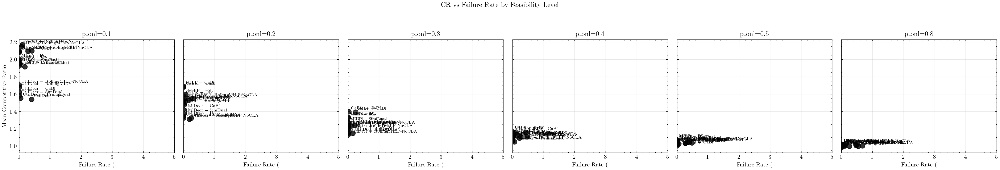

In [41]:
# FEAS_LOOP_BEGIN
df_eval_all = df_eval_master if "df_eval_master" in globals() and df_eval_master is not None else df_eval
df_opt_all = df_opt_master if "df_opt_master" in globals() and df_opt_master is not None else df_opt
df_per_seed_all = df_per_seed_master if "df_per_seed_master" in globals() and df_per_seed_master is not None else df_per_seed
FIG_DIR_BASE = FIG_DIR_ROOT
for feas in FEAS_TAGS:
    FIG_DIR = FIG_DIR_BASE / feas if FIGS_BY_FEAS else FIG_DIR_BASE
    FIG_DIR.mkdir(parents=True, exist_ok=True)
    df_eval = df_eval_all[df_eval_all["feasibility"] == feas].copy() if df_eval_all is not None else None
    df_opt = df_opt_all[df_opt_all["feasibility"] == feas].copy() if df_opt_all is not None else None
    df_per_seed = df_per_seed_all[df_per_seed_all["feasibility"] == feas].copy() if df_per_seed_all is not None else None
    if df_eval is not None and "scenario_base" in df_eval.columns:
        df_eval["scenario"] = df_eval["scenario_base"]
    if df_opt is not None and "scenario_base" in df_opt.columns:
        df_opt["scenario"] = df_opt["scenario_base"]
    if df_per_seed is not None and "scenario_base" in df_per_seed.columns:
        df_per_seed["scenario"] = df_per_seed["scenario_base"]
    if feas != "uniform":
        continue
    # 2E: Feasibility Sparsity - CR vs Failure Rate Tradeoff (per feasibility level)
    if df_per_seed is not None:
        sparse_scenarios = [
            "graph_0.1_off60_on40",
            "graph_sparse_off60_on40",
            "graph_0.3_off60_on40",
            "graph_0.4_off60_on40",
            "graph_mid_off60_on40",
            "graph_dense_off60_on40",
        ]

        df_eval = df_per_seed[
            (df_per_seed["kind"] == "eval")
            & (df_per_seed["scenario"].isin(sparse_scenarios))
        ].copy()

        df_opt = df_per_seed[
            (df_per_seed["kind"] == "optimal")
            & (df_per_seed["scenario"].isin(sparse_scenarios))
        ].copy()

        if not df_eval.empty:
            offline_fail_statuses = {"INFEASIBLE", "INF_OR_UNBD", "UNBOUNDED"}
            online_fail_statuses = {"INFEASIBLE"}

            # Failure rate per pipeline + scenario (all runs)
            df_eval["offline_failed"] = df_eval["offline_status"].isin(offline_fail_statuses)
            df_eval["online_failed"] = df_eval["online_status"].isin(online_fail_statuses)
            df_eval["any_failed"] = df_eval["offline_failed"] | df_eval["online_failed"]

            fail_agg = df_eval.groupby(["scenario", "pipeline"], dropna=False).agg(
                failure_rate=("any_failed", "mean"),
                total_runs=("any_failed", "count"),
            ).reset_index()
            fail_agg["failure_rate"] = fail_agg["failure_rate"] * 100.0

            # CR per pipeline + scenario (successful runs only)
            df_success = df_eval[
                (~df_eval["offline_failed"]) & (~df_eval["online_failed"])
            ].copy()

            df_opt_success = df_opt[
                ~df_opt["status"].isin(offline_fail_statuses)
            ].copy()
            df_opt_success = df_opt_success.rename(columns={"total_objective": "optimal_objective"})

            df_cr = df_success.merge(
                df_opt_success[["scenario", "seed", "optimal_objective"]],
                on=["scenario", "seed"],
                how="left",
            )
            df_cr = df_cr[df_cr["optimal_objective"].notna()]
            df_cr = df_cr[df_cr["total_objective"].notna()]
            df_cr["competitive_ratio"] = df_cr["total_objective"] / df_cr["optimal_objective"]

            cr_agg = df_cr.groupby(["scenario", "pipeline"], dropna=False).agg(
                mean_cr=("competitive_ratio", "mean"),
                count=("competitive_ratio", "count"),
            ).reset_index()

            # Merge tradeoff data
            tradeoff = fail_agg.merge(
                cr_agg,
                on=["scenario", "pipeline"],
                how="left",
            )

            # Map scenarios to sparsity labels
            sparsity_map = {
                "graph_0.1_off60_on40": ("p_onl=0.1", 0.1),
                "graph_sparse_off60_on40": ("p_onl=0.2", 0.2),
                "graph_0.3_off60_on40": ("p_onl=0.3", 0.3),
                "graph_0.4_off60_on40": ("p_onl=0.4", 0.4),
                "graph_mid_off60_on40": ("p_onl=0.5", 0.5),
                "graph_dense_off60_on40": ("p_onl=0.8", 0.8),
            }
            tradeoff["sparsity_label"] = tradeoff["scenario"].map(lambda x: sparsity_map.get(x, (x, 0))[0])
            tradeoff["sparsity_val"] = tradeoff["scenario"].map(lambda x: sparsity_map.get(x, (x, 0))[1])

            sparsity_order = [f"p_onl={p:.1f}" for p in [0.1, 0.2, 0.3, 0.4, 0.5, 0.8]]
            fig, axes = plt.subplots(1, len(sparsity_order), figsize=(4.0 * len(sparsity_order), 4.2), sharey=True)
            if len(sparsity_order) == 1:
                axes = np.array([axes])
            rng = np.random.default_rng(5)

            for ax, label in zip(axes, sparsity_order):
                df_sub = tradeoff[tradeoff["sparsity_label"] == label].copy()
                if df_sub.empty:
                    ax.set_title(f"{label} (no data)")
                    ax.axis("off")
                    continue

                # Jitter points slightly to reduce overlap (esp. near zero failure rate)
                x = df_sub["failure_rate"].to_numpy(dtype=float)
                y = df_sub["mean_cr"].to_numpy(dtype=float)
                x_jitter = rng.normal(0.0, 0.25, size=len(x))
                y_jitter = rng.normal(0.0, 0.01, size=len(y))
                x_plot = (x + x_jitter).clip(min=0.0)
                y_plot = y + y_jitter

                ax.scatter(
                    x_plot,
                    y_plot,
                    s=70,
                    color="black",
                    alpha=0.8,
                )
                for (xp, yp), (_, row) in zip(zip(x_plot, y_plot), df_sub.iterrows()):
                    ax.annotate(
                        row["pipeline"],
                        (xp, yp),
                        xytext=(4, 4),
                        textcoords="offset points",
                        fontsize=7,
                    )

                ax.set_title(label)
                ax.set_xlabel("Failure Rate (%)")
                ax.grid(True, alpha=0.3)
                max_fail = float(df_sub["failure_rate"].max()) if not df_sub["failure_rate"].isna().all() else 0.0
                ax.set_xlim(0, max(5.0, max_fail * 1.2))

            axes[0].set_ylabel("Mean Competitive Ratio")
            fig.suptitle("CR vs Failure Rate by Feasibility Level")
            fig.tight_layout(rect=[0, 0.0, 1, 0.92])
            fig.savefig(FIG_DIR / f"feasibility_tradeoff_cr_failure_{feas}.pdf", dpi=200, bbox_inches="tight")

        

            plt.show()
        else:
            print("Feasibility sparsity sweep data not found")
df_eval = df_eval_all
df_opt = df_opt_all
df_per_seed = df_per_seed_all
# FEAS_LOOP_END


<>:24: SyntaxWarning: invalid escape sequence '\%'
<>:25: SyntaxWarning: invalid escape sequence '\%'
<>:26: SyntaxWarning: invalid escape sequence '\%'
<>:82: SyntaxWarning: invalid escape sequence '\%'
<>:82: SyntaxWarning: invalid escape sequence '\%'
<>:82: SyntaxWarning: invalid escape sequence '\%'
<>:24: SyntaxWarning: invalid escape sequence '\%'
<>:25: SyntaxWarning: invalid escape sequence '\%'
<>:26: SyntaxWarning: invalid escape sequence '\%'
<>:82: SyntaxWarning: invalid escape sequence '\%'
<>:82: SyntaxWarning: invalid escape sequence '\%'
<>:82: SyntaxWarning: invalid escape sequence '\%'
/tmp/ipykernel_2067729/4143068633.py:24: SyntaxWarning: invalid escape sequence '\%'
  **{base_scenarios[i]: ("No Reshuffling (60\% Offline Share)", p_labels[i]) for i in range(len(p_specs))},
/tmp/ipykernel_2067729/4143068633.py:25: SyntaxWarning: invalid escape sequence '\%'
  **{reshuffle_6040[i]: ("Reshuffling (60\% Offline Share)", p_labels[i]) for i in range(len(p_specs))},
/tmp/

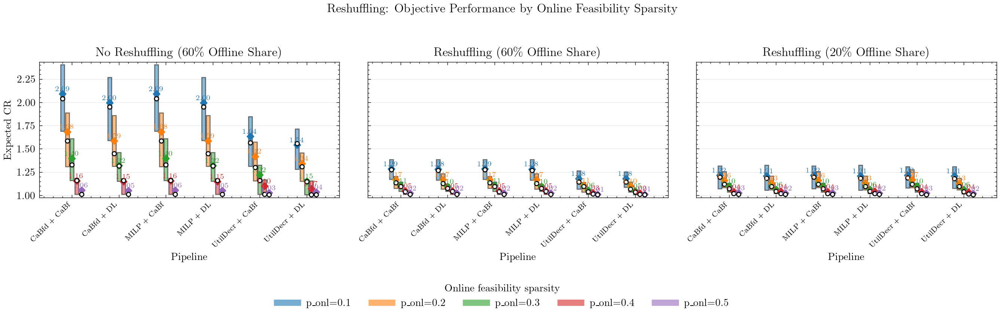

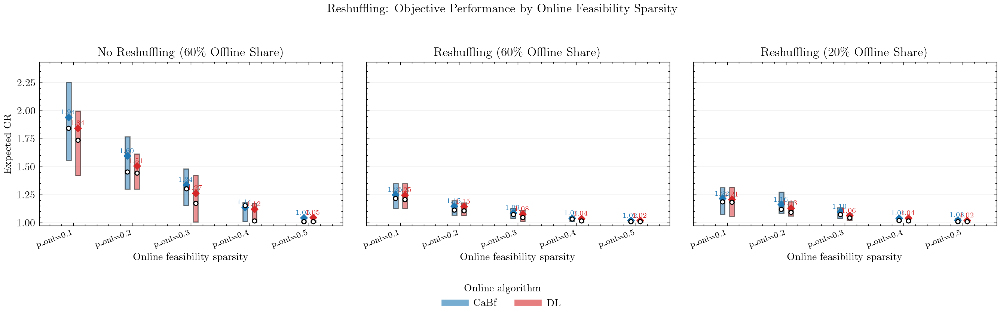

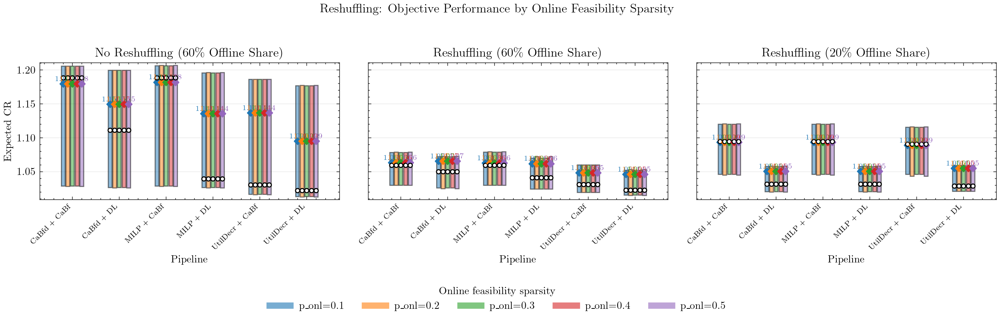

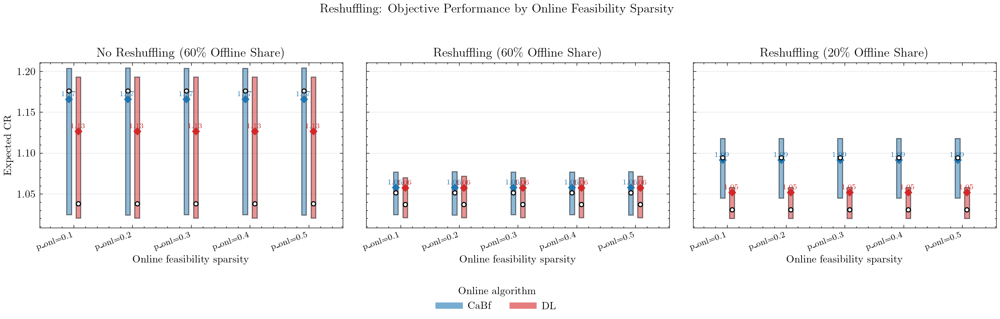

In [42]:
# FEAS_LOOP_BEGIN
df_eval_all = df_eval_master if "df_eval_master" in globals() and df_eval_master is not None else df_eval
df_opt_all = df_opt_master if "df_opt_master" in globals() and df_opt_master is not None else df_opt
df_per_seed_all = df_per_seed_master if "df_per_seed_master" in globals() and df_per_seed_master is not None else df_per_seed
FIG_DIR_BASE = FIG_DIR_ROOT

# 2F: Reshuffling comparison (CR only), separate plot per feasibility
if df_per_seed_all is not None:
    p_specs = [
        ("0.1", 0.1),
        ("sparse", 0.2),
        ("0.3", 0.3),
        ("0.4", 0.4),
        ("mid", 0.5),
        #("dense", 0.8),
    ]
    base_scenarios = [f"graph_{tag}_off60_on40" for tag, _ in p_specs]
    reshuffle_6040 = [f"graph_{tag}_off60_on40_reshuffle" for tag, _ in p_specs]
    reshuffle_2080 = [f"graph_{tag}_off20_on80_reshuffle" for tag, _ in p_specs]

    scenarios_all = base_scenarios + reshuffle_6040 + reshuffle_2080
    p_labels = [f"p_onl={p:.1f}" for _, p in p_specs]
    scenario_label_map = {
        **{base_scenarios[i]: ("No Reshuffling (60\% Offline Share)", p_labels[i]) for i in range(len(p_specs))},
        **{reshuffle_6040[i]: ("Reshuffling (60\% Offline Share)", p_labels[i]) for i in range(len(p_specs))},
        **{reshuffle_2080[i]: ("Reshuffling (20\% Offline Share)", p_labels[i]) for i in range(len(p_specs))},
    }
    #"No reshuffling (60\% offline share)", "Reshuffling (60\% offline share)", "Reshuffling (20\% offline share)"

    online_keep = ["CaBf", "DL"]
    offline_fail_statuses = {"INFEASIBLE", "INF_OR_UNBD", "UNBOUNDED"}
    online_fail_statuses = {"INFEASIBLE"}

    def add_labels(df_in):
        df_out = df_in.copy()
        df_out["setting"] = df_out["scenario"].map(lambda x: scenario_label_map.get(x, (None, None))[0])
        df_out["p_label"] = df_out["scenario"].map(lambda x: scenario_label_map.get(x, (None, None))[1])
        return df_out

    for feas in FEAS_TAGS:
        df_per_seed = df_per_seed_all[df_per_seed_all["feasibility"] == feas].copy()
        if df_per_seed is None or df_per_seed.empty:
            continue
        if "scenario_base" in df_per_seed.columns:
            df_per_seed["scenario"] = df_per_seed["scenario_base"]

        df_eval = df_per_seed[
            (df_per_seed["kind"] == "eval")
            & (df_per_seed["scenario"].isin(scenarios_all))
        ].copy()
        df_opt = df_per_seed[
            (df_per_seed["kind"] == "optimal")
            & (df_per_seed["scenario"].isin(scenarios_all))
        ].copy()

        if df_eval.empty or df_opt.empty:
            continue

        df_eval = df_eval[df_eval["online_short"].isin(online_keep)].copy()

        df_eval["offline_failed"] = df_eval["offline_status"].isin(offline_fail_statuses)
        df_eval["online_failed"] = df_eval["online_status"].isin(online_fail_statuses)
        df_eval["any_failed"] = df_eval["offline_failed"] | df_eval["online_failed"]

        df_success = df_eval[(~df_eval["offline_failed"]) & (~df_eval["online_failed"])].copy()
        df_opt_success = df_opt[~df_opt["status"].isin(offline_fail_statuses)].copy()
        df_opt_success = df_opt_success.rename(columns={"total_objective": "optimal_objective"})
        df_cr = df_success.merge(
            df_opt_success[["scenario", "seed", "optimal_objective"]],
            on=["scenario", "seed"],
            how="left",
        )
        df_cr = df_cr[df_cr["optimal_objective"].notna()]
        df_cr = df_cr[df_cr["total_objective"].notna()]
        df_cr["value"] = df_cr["total_objective"] / df_cr["optimal_objective"]
        df_cr = add_labels(df_cr)

        if df_cr.empty:
            print(f"Reshuffling data not found for 20/80 or 60/40 settings ({feas})")
            continue

        setting_order = ["No Reshuffling (60\% Offline Share)", "Reshuffling (60\% Offline Share)", "Reshuffling (20\% Offline Share)"]
        p_order = p_labels
        p_colors = {p: plt.cm.tab10(i % 10) for i, p in enumerate(p_order)}

        grouped = df_cr.groupby(["setting", "pipeline", "p_label"], dropna=False)["value"]
        q1 = grouped.quantile(0.25)
        q3 = grouped.quantile(0.75)
        q1_vals = q1.dropna().values
        q3_vals = q3.dropna().values
        if len(q1_vals) and len(q3_vals):
            y_min = float(np.min(q1_vals))
            y_max = float(np.max(q3_vals))
            if not np.isfinite(y_min) or not np.isfinite(y_max) or y_min >= y_max:
                y_min = float(np.min(df_cr["value"].dropna().values))
                y_max = float(np.max(df_cr["value"].dropna().values))
            y_pad = 0.02 * (y_max - y_min) if y_max > y_min else 0.02 * max(1.0, abs(y_max))
        else:
            y_min, y_max, y_pad = 0.0, 1.0, 0.02

        fig, axes = plt.subplots(1, 3, figsize=(13.5, 4.2), sharey=True)
        rng = np.random.default_rng(4)

        for ax, setting in zip(axes, setting_order):
            sub = df_cr[df_cr["setting"] == setting].copy()
            if sub.empty:
                ax.set_title(f"{setting} (no data)")
                ax.axis("off")
                continue

            pipelines = sorted(sub["pipeline"].unique())
            x_base = np.arange(1, len(pipelines) + 1)
            width = 0.10
            offsets = np.linspace(-(len(p_order) - 1) / 2 * width, (len(p_order) - 1) / 2 * width, len(p_order))

            for p_label, off in zip(p_order, offsets):
                data = []
                positions = []
                for i, pipe in enumerate(pipelines):
                    vals = sub[(sub["pipeline"] == pipe) & (sub["p_label"] == p_label)]["value"].dropna().values
                    data.append(vals if len(vals) else [np.nan])
                    positions.append(x_base[i] + off)

                bp = ax.boxplot(
                    data,
                    positions=positions,
                    widths=0.08,
                    showfliers=False,
                    patch_artist=True,
                    whiskerprops={"linewidth": 0},
                    capprops={"linewidth": 0},
                    medianprops={"color": "black", "linewidth": 1.2},
                )
                for patch in bp["boxes"]:
                    patch.set_facecolor(p_colors[p_label])
                    patch.set_alpha(0.5)

                y_offset = 0.01 * (y_max - y_min) if y_max > y_min else 0.01
                for pos, vals in zip(positions, data):
                    vals = np.array(vals, dtype=float)
                    vals = vals[~np.isnan(vals)]
                    if len(vals) == 0:
                        continue
                    mean_val = float(np.mean(vals))
                    median_val = float(np.median(vals))
                    ax.scatter(pos, mean_val, s=20, marker="D", color=p_colors[p_label], zorder=3)
                    ax.scatter(pos, median_val, s=16, marker="o", facecolor="white", edgecolor="black", zorder=3)
                    ax.text(
                        pos,
                        mean_val + y_offset,
                        f"{mean_val:.2f}",
                        ha="center",
                        va="bottom",
                        fontsize=7,
                        color=p_colors[p_label],
                    )

            ax.set_title(setting)
            ax.set_xlabel("Pipeline")
            ax.set_xticks(x_base)
            ax.set_xticklabels(pipelines, rotation=45, ha="right", fontsize=7)
            ax.set_ylim(y_min - y_pad, y_max + y_pad)
            ax.grid(True, axis="y", alpha=0.3)
        axes[0].set_ylabel(f"Expected CR")

        # if feas == "uniform": setting = "Uniform Feasibility Regime" 
        # else: setting = "Exponential Feasibility Regime"
        # axes[0].set_ylabel(f"{setting}\n CR (per-instance)")
        handles = [
            plt.Line2D([0], [0], color=p_colors[p], lw=6, alpha=0.6, label=p)
            for p in p_order
        ]
        fig.legend(handles=handles, title="Online feasibility sparsity", loc="lower center", ncol=max(1, len(p_order)), frameon=False, bbox_to_anchor=(0.5, -0.02))
        fig.suptitle("Reshuffling: Objective Performance by Online Feasibility Sparsity")
        fig.tight_layout(rect=[0, 0.12, 1, 0.95])
        fig.savefig(FIG_DIR_ROOT / f"reshuffle_cr_by_setting_{feas}.pdf", dpi=200, bbox_inches="tight")
        plt.show()

        # Additional plot: x-axis = feasibility sparsity, grouped by online algorithm colors
        hybrid_online_order = ["CaBf", "RollingMILP", "RollingMILP-NoCLA", "DL", "SimDual", "PrimalDual"]
        online_order = [o for o in hybrid_online_order if (o in online_keep) and (o in df_cr["online_short"].unique())]
        online_colors = {o: plt.cm.tab10(i % 10) for i, o in enumerate(hybrid_online_order)}

        fig, axes = plt.subplots(1, 3, figsize=(13.5, 4.2), sharey=True)

        for ax, setting in zip(axes, setting_order):
            sub = df_cr[df_cr["setting"] == setting].copy()
            if sub.empty:
                ax.set_title(f"{setting} (no data)")
                ax.axis("off")
                continue

            x_base = np.arange(1, len(p_order) + 1)
            width = 0.16
            offsets = np.linspace(-(len(online_order) - 1) / 2 * width, (len(online_order) - 1) / 2 * width, len(online_order))

            for online_algo, off in zip(online_order, offsets):
                data = []
                positions = []
                for i, p_label in enumerate(p_order):
                    vals = sub[(sub["p_label"] == p_label) & (sub["online_short"] == online_algo)]["value"].dropna().values
                    data.append(vals if len(vals) else [np.nan])
                    positions.append(x_base[i] + off)

                bp = ax.boxplot(
                    data,
                    positions=positions,
                    widths=0.08,
                    showfliers=False,
                    patch_artist=True,
                    whiskerprops={"linewidth": 0},
                    capprops={"linewidth": 0},
                    medianprops={"color": "black", "linewidth": 1.2},
                )
                for patch in bp["boxes"]:
                    patch.set_facecolor(online_colors[online_algo])
                    patch.set_alpha(0.5)

                y_offset = 0.01 * (y_max - y_min) if y_max > y_min else 0.01
                for pos, vals in zip(positions, data):
                    vals = np.array(vals, dtype=float)
                    vals = vals[~np.isnan(vals)]
                    if len(vals) == 0:
                        continue
                    mean_val = float(np.mean(vals))
                    median_val = float(np.median(vals))
                    ax.scatter(pos, mean_val, s=20, marker="D", color=online_colors[online_algo], zorder=3)
                    ax.scatter(pos, median_val, s=16, marker="o", facecolor="white", edgecolor="black", zorder=3)
                    ax.text(
                        pos,
                        mean_val + y_offset,
                        f"{mean_val:.2f}",
                        ha="center",
                        va="bottom",
                        fontsize=7,
                        color=online_colors[online_algo],
                    )

            ax.set_title(setting)
            ax.set_xlabel("Online feasibility sparsity")
            ax.set_xticks(x_base)
            ax.set_xticklabels(p_order, rotation=20, ha="right", fontsize=8)
            ax.set_ylim(y_min - y_pad, y_max + y_pad)
            ax.grid(True, axis="y", alpha=0.3)
        axes[0].set_ylabel(f"Expected CR")

        handles = [
            plt.Line2D([0], [0], color=online_colors[o], lw=6, alpha=0.6, label=o)
            for o in online_order
        ]
        fig.legend(handles=handles, title="Online algorithm", loc="lower center", ncol=max(1, len(online_order)), frameon=False, bbox_to_anchor=(0.5, -0.02))
        fig.suptitle("Reshuffling: Objective Performance by Online Feasibility Sparsity")
        fig.tight_layout(rect=[0, 0.12, 1, 0.95])
        fig.savefig(FIG_DIR_ROOT / f"reshuffle_cr_by_setting_grouped_by_algo_{feas}.pdf", dpi=200, bbox_inches="tight")
        plt.show()
else:
    print("Reshuffling data not found for 20/80 or 60/40 settings")

df_eval = df_eval_all
df_opt = df_opt_all
df_per_seed = df_per_seed_all
# FEAS_LOOP_END


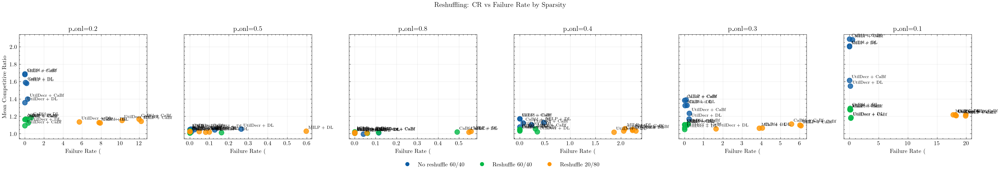

In [43]:
# FEAS_LOOP_BEGIN
df_eval_all = df_eval_master if "df_eval_master" in globals() and df_eval_master is not None else df_eval
df_opt_all = df_opt_master if "df_opt_master" in globals() and df_opt_master is not None else df_opt
df_per_seed_all = df_per_seed_master if "df_per_seed_master" in globals() and df_per_seed_master is not None else df_per_seed
FIG_DIR_BASE = FIG_DIR_ROOT
for feas in FEAS_TAGS:
    FIG_DIR = FIG_DIR_BASE / feas if FIGS_BY_FEAS else FIG_DIR_BASE
    FIG_DIR.mkdir(parents=True, exist_ok=True)
    df_eval = df_eval_all[df_eval_all["feasibility"] == feas].copy() if df_eval_all is not None else None
    df_opt = df_opt_all[df_opt_all["feasibility"] == feas].copy() if df_opt_all is not None else None
    df_per_seed = df_per_seed_all[df_per_seed_all["feasibility"] == feas].copy() if df_per_seed_all is not None else None
    if df_eval is not None and "scenario_base" in df_eval.columns:
        df_eval["scenario"] = df_eval["scenario_base"]
    if df_opt is not None and "scenario_base" in df_opt.columns:
        df_opt["scenario"] = df_opt["scenario_base"]
    if df_per_seed is not None and "scenario_base" in df_per_seed.columns:
        df_per_seed["scenario"] = df_per_seed["scenario_base"]
    if feas != "uniform":
        continue
    # 2G: Reshuffling tradeoff (CR vs Failure Rate) by sparsity
    if df_per_seed is not None:
        p_specs = [
            ("sparse", 0.2),
            ("mid", 0.5),
            ("dense", 0.8),
            ("0.4", 0.4),
            ("0.3", 0.3),
            ("0.1", 0.1),
        ]
        base_scenarios = [f"graph_{tag}_off60_on40" for tag, _ in p_specs]
        reshuffle_6040 = [f"graph_{tag}_off60_on40_reshuffle" for tag, _ in p_specs]
        reshuffle_2080 = [f"graph_{tag}_off20_on80_reshuffle" for tag, _ in p_specs]

        scenarios_all = base_scenarios + reshuffle_6040 + reshuffle_2080
        p_labels = [f"p_onl={p:.1f}" for _, p in p_specs]
        scenario_label_map = {
            **{base_scenarios[i]: ("No reshuffle 60/40", p_labels[i]) for i in range(len(p_specs))},
            **{reshuffle_6040[i]: ("Reshuffle 60/40", p_labels[i]) for i in range(len(p_specs))},
            **{reshuffle_2080[i]: ("Reshuffle 20/80", p_labels[i]) for i in range(len(p_specs))},
        }

        df_eval = df_per_seed[
            (df_per_seed["kind"] == "eval")
            & (df_per_seed["scenario"].isin(scenarios_all))
        ].copy()

        df_opt = df_per_seed[
            (df_per_seed["kind"] == "optimal")
            & (df_per_seed["scenario"].isin(scenarios_all))
        ].copy()

        if df_eval.empty:
            print("Reshuffling data not found for tradeoff plot")
        else:
            online_keep = ["CaBf", "DL"]
            df_eval = df_eval[df_eval["online_short"].isin(online_keep)].copy()

            offline_fail_statuses = {"INFEASIBLE", "INF_OR_UNBD", "UNBOUNDED"}
            online_fail_statuses = {"INFEASIBLE"}

            df_eval["offline_failed"] = df_eval["offline_status"].isin(offline_fail_statuses)
            df_eval["online_failed"] = df_eval["online_status"].isin(online_fail_statuses)
            df_eval["any_failed"] = df_eval["offline_failed"] | df_eval["online_failed"]

            fail_agg = df_eval.groupby(["scenario", "pipeline"], dropna=False).agg(
                failure_rate=("any_failed", "mean"),
            ).reset_index()
            fail_agg["failure_rate"] = fail_agg["failure_rate"] * 100.0

            df_success = df_eval[(~df_eval["offline_failed"]) & (~df_eval["online_failed"])].copy()
            df_opt_success = df_opt[~df_opt["status"].isin(offline_fail_statuses)].copy()
            df_opt_success = df_opt_success.rename(columns={"total_objective": "optimal_objective"})
            df_cr = df_success.merge(
                df_opt_success[["scenario", "seed", "optimal_objective"]],
                on=["scenario", "seed"],
                how="left",
            )
            df_cr = df_cr[df_cr["optimal_objective"].notna()]
            df_cr = df_cr[df_cr["total_objective"].notna()]
            df_cr["competitive_ratio"] = df_cr["total_objective"] / df_cr["optimal_objective"]

            cr_agg = df_cr.groupby(["scenario", "pipeline"], dropna=False).agg(
                mean_cr=("competitive_ratio", "mean"),
            ).reset_index()

            tradeoff = fail_agg.merge(cr_agg, on=["scenario", "pipeline"], how="left")
            tradeoff["setting"] = tradeoff["scenario"].map(lambda x: scenario_label_map.get(x, (None, None))[0])
            tradeoff["p_label"] = tradeoff["scenario"].map(lambda x: scenario_label_map.get(x, (None, None))[1])

            setting_order = ["No reshuffle 60/40", "Reshuffle 60/40", "Reshuffle 20/80"]
            colors = {"No reshuffle 60/40": "C0", "Reshuffle 60/40": "C1", "Reshuffle 20/80": "C2"}

            fig, axes = plt.subplots(1, len(p_labels), figsize=(4.0 * len(p_labels), 4.2), sharey=True)
            if len(p_labels) == 1:
                axes = np.array([axes])
            rng = np.random.default_rng(9)

            for ax, p_label in zip(axes, p_labels):
                df_sub = tradeoff[tradeoff["p_label"] == p_label].copy()
                if df_sub.empty:
                    ax.set_title(f"{p_label} (no data)")
                    ax.axis("off")
                    continue

                for setting in setting_order:
                    df_set = df_sub[df_sub["setting"] == setting].copy()
                    if df_set.empty:
                        continue
                    x = df_set["failure_rate"].to_numpy(dtype=float)
                    y = df_set["mean_cr"].to_numpy(dtype=float)
                    x_jitter = rng.normal(0.0, 0.25, size=len(x))
                    y_jitter = rng.normal(0.0, 0.01, size=len(y))
                    x_plot = (x + x_jitter).clip(min=0.0)
                    y_plot = y + y_jitter

                    ax.scatter(x_plot, y_plot, s=70, color=colors[setting], alpha=0.8, label=setting)
                    for (xp, yp), (_, row) in zip(zip(x_plot, y_plot), df_set.iterrows()):
                        ax.annotate(
                            row["pipeline"],
                            (xp, yp),
                            xytext=(4, 4),
                            textcoords="offset points",
                            fontsize=7,
                        )

                ax.set_title(p_label)
                ax.set_xlabel("Failure Rate (%)")
                ax.grid(True, alpha=0.3)

            axes[0].set_ylabel("Mean Competitive Ratio")
            handles = [plt.Line2D([0], [0], marker='o', linestyle='None', color=colors[s], label=s) for s in setting_order]
            fig.legend(handles=handles, loc="lower center", ncol=3, frameon=False, bbox_to_anchor=(0.5, 0.01))
            fig.suptitle("Reshuffling: CR vs Failure Rate by Sparsity")
            fig.tight_layout(rect=[0, 0.08, 1, 0.95])
            fig.savefig(FIG_DIR / f"reshuffle_tradeoff_by_sparsity_{feas}.pdf", dpi=200, bbox_inches="tight")
            plt.show()
df_eval = df_eval_all
df_opt = df_opt_all
df_per_seed = df_per_seed_all
# FEAS_LOOP_END


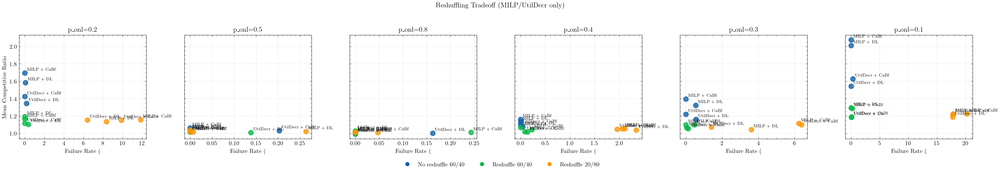

In [44]:
# FEAS_LOOP_BEGIN
df_eval_all = df_eval_master if "df_eval_master" in globals() and df_eval_master is not None else df_eval
df_opt_all = df_opt_master if "df_opt_master" in globals() and df_opt_master is not None else df_opt
df_per_seed_all = df_per_seed_master if "df_per_seed_master" in globals() and df_per_seed_master is not None else df_per_seed
FIG_DIR_BASE = FIG_DIR_ROOT
for feas in FEAS_TAGS:
    FIG_DIR = FIG_DIR_BASE / feas if FIGS_BY_FEAS else FIG_DIR_BASE
    FIG_DIR.mkdir(parents=True, exist_ok=True)
    df_eval = df_eval_all[df_eval_all["feasibility"] == feas].copy() if df_eval_all is not None else None
    df_opt = df_opt_all[df_opt_all["feasibility"] == feas].copy() if df_opt_all is not None else None
    df_per_seed = df_per_seed_all[df_per_seed_all["feasibility"] == feas].copy() if df_per_seed_all is not None else None
    if df_eval is not None and "scenario_base" in df_eval.columns:
        df_eval["scenario"] = df_eval["scenario_base"]
    if df_opt is not None and "scenario_base" in df_opt.columns:
        df_opt["scenario"] = df_opt["scenario_base"]
    if df_per_seed is not None and "scenario_base" in df_per_seed.columns:
        df_per_seed["scenario"] = df_per_seed["scenario_base"]
    if feas != "uniform":
        continue
    # 2G-A: Reshuffling tradeoff by sparsity (drop CaBfd offline)
    if df_per_seed is not None:
        p_specs = [
            ("sparse", 0.2),
            ("mid", 0.5),
            ("dense", 0.8),
            ("0.4", 0.4),
            ("0.3", 0.3),
            ("0.1", 0.1),
        ]
        base_scenarios = [f"graph_{tag}_off60_on40" for tag, _ in p_specs]
        reshuffle_6040 = [f"graph_{tag}_off60_on40_reshuffle" for tag, _ in p_specs]
        reshuffle_2080 = [f"graph_{tag}_off20_on80_reshuffle" for tag, _ in p_specs]

        scenarios_all = base_scenarios + reshuffle_6040 + reshuffle_2080
        p_labels = [f"p_onl={p:.1f}" for _, p in p_specs]
        scenario_label_map = {
            **{base_scenarios[i]: ("No reshuffle 60/40", p_labels[i]) for i in range(len(p_specs))},
            **{reshuffle_6040[i]: ("Reshuffle 60/40", p_labels[i]) for i in range(len(p_specs))},
            **{reshuffle_2080[i]: ("Reshuffle 20/80", p_labels[i]) for i in range(len(p_specs))},
        }

        df_eval = df_per_seed[
            (df_per_seed["kind"] == "eval")
            & (df_per_seed["scenario"].isin(scenarios_all))
        ].copy()

        df_opt = df_per_seed[
            (df_per_seed["kind"] == "optimal")
            & (df_per_seed["scenario"].isin(scenarios_all))
        ].copy()

        if df_eval.empty:
            print("Reshuffling data not found for tradeoff plot")
        else:
            # Filter: keep only MILP/UtilDecr offline
            df_eval = df_eval[df_eval["offline_short"].isin(["MILP", "UtilDecr"])].copy()
            online_keep = ["CaBf", "DL"]
            df_eval = df_eval[df_eval["online_short"].isin(online_keep)].copy()

            offline_fail_statuses = {"INFEASIBLE", "INF_OR_UNBD", "UNBOUNDED"}
            online_fail_statuses = {"INFEASIBLE"}
            df_eval["offline_failed"] = df_eval["offline_status"].isin(offline_fail_statuses)
            df_eval["online_failed"] = df_eval["online_status"].isin(online_fail_statuses)
            df_eval["any_failed"] = df_eval["offline_failed"] | df_eval["online_failed"]

            fail_agg = df_eval.groupby(["scenario", "pipeline"], dropna=False).agg(
                failure_rate=("any_failed", "mean"),
            ).reset_index()
            fail_agg["failure_rate"] = fail_agg["failure_rate"] * 100.0

            df_success = df_eval[(~df_eval["offline_failed"]) & (~df_eval["online_failed"])].copy()
            df_opt_success = df_opt[~df_opt["status"].isin(offline_fail_statuses)].copy()
            df_opt_success = df_opt_success.rename(columns={"total_objective": "optimal_objective"})
            df_cr = df_success.merge(
                df_opt_success[["scenario", "seed", "optimal_objective"]],
                on=["scenario", "seed"],
                how="left",
            )
            df_cr = df_cr[df_cr["optimal_objective"].notna()]
            df_cr = df_cr[df_cr["total_objective"].notna()]
            df_cr["competitive_ratio"] = df_cr["total_objective"] / df_cr["optimal_objective"]

            cr_agg = df_cr.groupby(["scenario", "pipeline"], dropna=False).agg(
                mean_cr=("competitive_ratio", "mean"),
            ).reset_index()

            tradeoff = fail_agg.merge(cr_agg, on=["scenario", "pipeline"], how="left")
            tradeoff["setting"] = tradeoff["scenario"].map(lambda x: scenario_label_map.get(x, (None, None))[0])
            tradeoff["p_label"] = tradeoff["scenario"].map(lambda x: scenario_label_map.get(x, (None, None))[1])

            setting_order = ["No reshuffle 60/40", "Reshuffle 60/40", "Reshuffle 20/80"]
            colors = {"No reshuffle 60/40": "C0", "Reshuffle 60/40": "C1", "Reshuffle 20/80": "C2"}

            fig, axes = plt.subplots(1, len(p_labels), figsize=(4.0 * len(p_labels), 4.2), sharey=True)
            if len(p_labels) == 1:
                axes = np.array([axes])
            rng = np.random.default_rng(9)

            for ax, p_label in zip(axes, p_labels):
                df_sub = tradeoff[tradeoff["p_label"] == p_label].copy()
                if df_sub.empty:
                    ax.set_title(f"{p_label} (no data)")
                    ax.axis("off")
                    continue

                for setting in setting_order:
                    df_set = df_sub[df_sub["setting"] == setting].copy()
                    if df_set.empty:
                        continue
                    x = df_set["failure_rate"].to_numpy(dtype=float)
                    y = df_set["mean_cr"].to_numpy(dtype=float)
                    x_jitter = rng.normal(0.0, 0.25, size=len(x))
                    y_jitter = rng.normal(0.0, 0.01, size=len(y))
                    x_plot = (x + x_jitter).clip(min=0.0)
                    y_plot = y + y_jitter

                    ax.scatter(x_plot, y_plot, s=70, color=colors[setting], alpha=0.8, label=setting)
                    for (xp, yp), (_, row) in zip(zip(x_plot, y_plot), df_set.iterrows()):
                        ax.annotate(
                            row["pipeline"],
                            (xp, yp),
                            xytext=(4, 4),
                            textcoords="offset points",
                            fontsize=7,
                        )

                ax.set_title(p_label)
                ax.set_xlabel("Failure Rate (%)")
                ax.grid(True, alpha=0.3)

            axes[0].set_ylabel("Mean Competitive Ratio")
            handles = [plt.Line2D([0], [0], marker='o', linestyle='None', color=colors[s], label=s) for s in setting_order]
            fig.legend(handles=handles, loc="lower center", ncol=3, frameon=False, bbox_to_anchor=(0.5, 0.01))
            fig.suptitle("Reshuffling Tradeoff (MILP/UtilDecr only)")
            fig.tight_layout(rect=[0, 0.08, 1, 0.95])
            fig.savefig(FIG_DIR / f"reshuffle_tradeoff_by_sparsity_no_cabfd_{feas}.pdf", dpi=200, bbox_inches="tight")
            plt.show()
df_eval = df_eval_all
df_opt = df_opt_all
df_per_seed = df_per_seed_all
# FEAS_LOOP_END


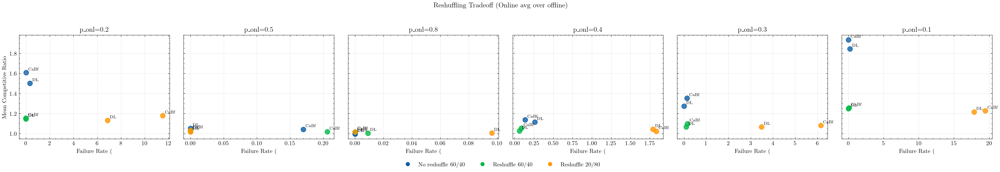

In [45]:
# FEAS_LOOP_BEGIN
df_eval_all = df_eval_master if "df_eval_master" in globals() and df_eval_master is not None else df_eval
df_opt_all = df_opt_master if "df_opt_master" in globals() and df_opt_master is not None else df_opt
df_per_seed_all = df_per_seed_master if "df_per_seed_master" in globals() and df_per_seed_master is not None else df_per_seed
FIG_DIR_BASE = FIG_DIR_ROOT
for feas in FEAS_TAGS:
    FIG_DIR = FIG_DIR_BASE / feas if FIGS_BY_FEAS else FIG_DIR_BASE
    FIG_DIR.mkdir(parents=True, exist_ok=True)
    df_eval = df_eval_all[df_eval_all["feasibility"] == feas].copy() if df_eval_all is not None else None
    df_opt = df_opt_all[df_opt_all["feasibility"] == feas].copy() if df_opt_all is not None else None
    df_per_seed = df_per_seed_all[df_per_seed_all["feasibility"] == feas].copy() if df_per_seed_all is not None else None
    if df_eval is not None and "scenario_base" in df_eval.columns:
        df_eval["scenario"] = df_eval["scenario_base"]
    if df_opt is not None and "scenario_base" in df_opt.columns:
        df_opt["scenario"] = df_opt["scenario_base"]
    if df_per_seed is not None and "scenario_base" in df_per_seed.columns:
        df_per_seed["scenario"] = df_per_seed["scenario_base"]
    if feas != "uniform":
        continue
    # 2G-B: Reshuffling tradeoff by sparsity (aggregate over offline solvers)
    if df_per_seed is not None:
        p_specs = [
            ("sparse", 0.2),
            ("mid", 0.5),
            ("dense", 0.8),
            ("0.4", 0.4),
            ("0.3", 0.3),
            ("0.1", 0.1),
        ]
        base_scenarios = [f"graph_{tag}_off60_on40" for tag, _ in p_specs]
        reshuffle_6040 = [f"graph_{tag}_off60_on40_reshuffle" for tag, _ in p_specs]
        reshuffle_2080 = [f"graph_{tag}_off20_on80_reshuffle" for tag, _ in p_specs]

        scenarios_all = base_scenarios + reshuffle_6040 + reshuffle_2080
        p_labels = [f"p_onl={p:.1f}" for _, p in p_specs]
        scenario_label_map = {
            **{base_scenarios[i]: ("No reshuffle 60/40", p_labels[i]) for i in range(len(p_specs))},
            **{reshuffle_6040[i]: ("Reshuffle 60/40", p_labels[i]) for i in range(len(p_specs))},
            **{reshuffle_2080[i]: ("Reshuffle 20/80", p_labels[i]) for i in range(len(p_specs))},
        }

        df_eval = df_per_seed[
            (df_per_seed["kind"] == "eval")
            & (df_per_seed["scenario"].isin(scenarios_all))
        ].copy()

        df_opt = df_per_seed[
            (df_per_seed["kind"] == "optimal")
            & (df_per_seed["scenario"].isin(scenarios_all))
        ].copy()

        if df_eval.empty:
            print("Reshuffling data not found for tradeoff plot")
        else:
            online_keep = ["CaBf", "DL"]
            df_eval = df_eval[df_eval["online_short"].isin(online_keep)].copy()

            offline_fail_statuses = {"INFEASIBLE", "INF_OR_UNBD", "UNBOUNDED"}
            online_fail_statuses = {"INFEASIBLE"}

            df_eval["offline_failed"] = df_eval["offline_status"].isin(offline_fail_statuses)
            df_eval["online_failed"] = df_eval["online_status"].isin(online_fail_statuses)
            df_eval["any_failed"] = df_eval["offline_failed"] | df_eval["online_failed"]

            # Failure rate per scenario/online
            fail_agg = df_eval.groupby(["scenario", "online_short"], dropna=False).agg(
                failure_rate=("any_failed", "mean"),
            ).reset_index()
            fail_agg["failure_rate"] = fail_agg["failure_rate"] * 100.0

            df_success = df_eval[(~df_eval["offline_failed"]) & (~df_eval["online_failed"])].copy()
            df_opt_success = df_opt[~df_opt["status"].isin(offline_fail_statuses)].copy()
            df_opt_success = df_opt_success.rename(columns={"total_objective": "optimal_objective"})
            df_cr = df_success.merge(
                df_opt_success[["scenario", "seed", "optimal_objective"]],
                on=["scenario", "seed"],
                how="left",
            )
            df_cr = df_cr[df_cr["optimal_objective"].notna()]
            df_cr = df_cr[df_cr["total_objective"].notna()]
            df_cr["competitive_ratio"] = df_cr["total_objective"] / df_cr["optimal_objective"]

            cr_agg = df_cr.groupby(["scenario", "online_short"], dropna=False).agg(
                mean_cr=("competitive_ratio", "mean"),
            ).reset_index()

            tradeoff = fail_agg.merge(cr_agg, on=["scenario", "online_short"], how="left")
            tradeoff["setting"] = tradeoff["scenario"].map(lambda x: scenario_label_map.get(x, (None, None))[0])
            tradeoff["p_label"] = tradeoff["scenario"].map(lambda x: scenario_label_map.get(x, (None, None))[1])

            setting_order = ["No reshuffle 60/40", "Reshuffle 60/40", "Reshuffle 20/80"]
            colors = {"No reshuffle 60/40": "C0", "Reshuffle 60/40": "C1", "Reshuffle 20/80": "C2"}

            fig, axes = plt.subplots(1, len(p_labels), figsize=(4.0 * len(p_labels), 4.2), sharey=True)
            if len(p_labels) == 1:
                axes = np.array([axes])
            rng = np.random.default_rng(11)

            for ax, p_label in zip(axes, p_labels):
                df_sub = tradeoff[tradeoff["p_label"] == p_label].copy()
                if df_sub.empty:
                    ax.set_title(f"{p_label} (no data)")
                    ax.axis("off")
                    continue

                for setting in setting_order:
                    df_set = df_sub[df_sub["setting"] == setting].copy()
                    if df_set.empty:
                        continue
                    x = df_set["failure_rate"].to_numpy(dtype=float)
                    y = df_set["mean_cr"].to_numpy(dtype=float)
                    x_jitter = rng.normal(0.0, 0.25, size=len(x))
                    y_jitter = rng.normal(0.0, 0.01, size=len(y))
                    x_plot = (x + x_jitter).clip(min=0.0)
                    y_plot = y + y_jitter

                    ax.scatter(x_plot, y_plot, s=70, color=colors[setting], alpha=0.8, label=setting)
                    for (xp, yp), (_, row) in zip(zip(x_plot, y_plot), df_set.iterrows()):
                        ax.annotate(
                            row["online_short"],
                            (xp, yp),
                            xytext=(4, 4),
                            textcoords="offset points",
                            fontsize=7,
                        )

                ax.set_title(p_label)
                ax.set_xlabel("Failure Rate (%)")
                ax.grid(True, alpha=0.3)

            axes[0].set_ylabel("Mean Competitive Ratio")
            handles = [plt.Line2D([0], [0], marker='o', linestyle='None', color=colors[s], label=s) for s in setting_order]
            fig.legend(handles=handles, loc="lower center", ncol=3, frameon=False, bbox_to_anchor=(0.5, 0.01))
            fig.suptitle("Reshuffling Tradeoff (Online avg over offline)")
            fig.tight_layout(rect=[0, 0.08, 1, 0.95])
            fig.savefig(FIG_DIR / f"reshuffle_tradeoff_by_sparsity_online_avg_{feas}.pdf", dpi=200, bbox_inches="tight")
            plt.show()
df_eval = df_eval_all
df_opt = df_opt_all
df_per_seed = df_per_seed_all
# FEAS_LOOP_END


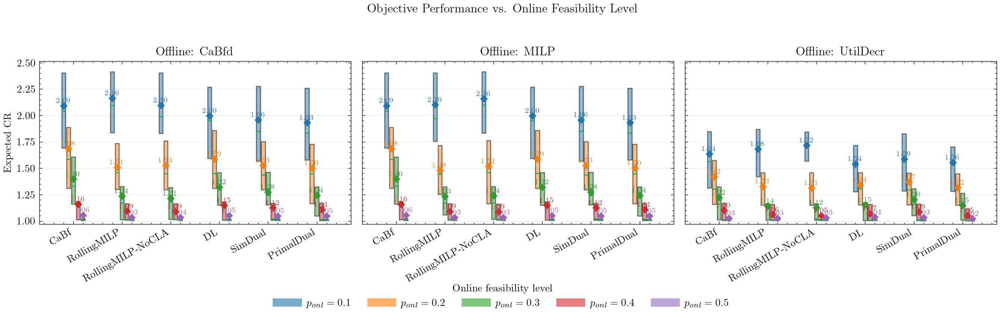

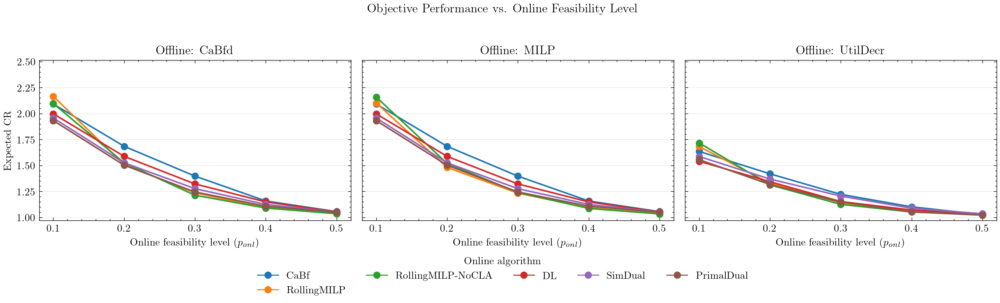

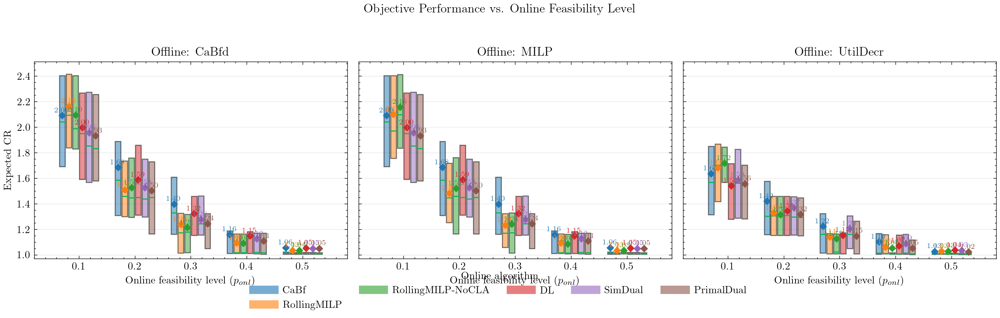

In [46]:
# Uniform only: separate sparsity boxplot + line plot (legends at bottom)

df_eval_all = df_eval_master if "df_eval_master" in globals() and df_eval_master is not None else df_eval
df_opt_all = df_opt_master if "df_opt_master" in globals() and df_opt_master is not None else df_opt
df_per_seed_all = df_per_seed_master if "df_per_seed_master" in globals() and df_per_seed_master is not None else df_per_seed
FIG_DIR_BASE = FIG_DIR_ROOT

sparse_scenarios = [
    "graph_0.1_off60_on40",
    "graph_sparse_off60_on40",
    "graph_0.3_off60_on40",
    "graph_0.4_off60_on40",
    "graph_mid_off60_on40",
    "graph_dense_off60_on40",
]

sparsity_map = {
    "graph_0.1_off60_on40": ("p_onl=0.1", 0.1),
    "graph_sparse_off60_on40": ("p_onl=0.2", 0.2),
    "graph_0.3_off60_on40": ("p_onl=0.3", 0.3),
    "graph_0.4_off60_on40": ("p_onl=0.4", 0.4),
    "graph_mid_off60_on40": ("p_onl=0.5", 0.5),
    "graph_dense_off60_on40": ("p_onl=0.8", 0.8),
}

sparsity_order = [0.1, 0.2, 0.3, 0.4, 0.5]#, 0.8

offline_order = ["CaBfd", "MILP", "UtilDecr"]
online_order = ["CaBf", "RollingMILP", "RollingMILP-NoCLA", "DL", "SimDual", "PrimalDual"]

feas = "uniform"
FIG_DIR = FIG_DIR_BASE / feas if FIGS_BY_FEAS else FIG_DIR_BASE
FIG_DIR.mkdir(parents=True, exist_ok=True)

if df_per_seed_all is None:
    print("Feasibility sparsity sweep data not found (uniform)")
else:
    df_per_seed = df_per_seed_all[df_per_seed_all["feasibility"] == feas].copy()
    if "scenario_base" in df_per_seed.columns:
        df_per_seed["scenario"] = df_per_seed["scenario_base"]

    df_eval_use = df_per_seed[
        (df_per_seed["kind"] == "eval")
        & (df_per_seed["scenario"].isin(sparse_scenarios))
    ].copy()
    df_opt_use = df_per_seed[
        (df_per_seed["kind"] == "optimal")
        & (df_per_seed["scenario"].isin(sparse_scenarios))
    ].copy()

    if df_eval_use.empty or df_opt_use.empty:
        print("Feasibility sparsity sweep data not found (uniform)")
    else:
        offline_fail_statuses = {"INFEASIBLE", "INF_OR_UNBD", "UNBOUNDED"}
        online_fail_statuses = {"INFEASIBLE"}

        df_eval_use = df_eval_use[
            (~df_eval_use["offline_status"].isin(offline_fail_statuses))
            & (~df_eval_use["online_status"].isin(online_fail_statuses))
        ].copy()
        df_opt_use = df_opt_use[~df_opt_use["status"].isin(offline_fail_statuses)].copy()
        df_opt_use = df_opt_use.rename(columns={"total_objective": "optimal_objective"})

        # Multiple reruns can create duplicate optimal rows per (scenario, seed).
        # Keep the latest record so the merge remains many-to-one.
        if "run_dt" in df_opt_use.columns:
            df_opt_use = df_opt_use.sort_values("run_dt")
        elif "run_id" in df_opt_use.columns:
            df_opt_use = df_opt_use.sort_values("run_id")
        df_opt_use = df_opt_use.drop_duplicates(subset=["scenario", "seed"], keep="last")

        df_cr = df_eval_use.merge(
            df_opt_use[["scenario", "seed", "optimal_objective"]],
            on=["scenario", "seed"],
            how="left",
            validate="many_to_one",
        )
        df_cr = df_cr[df_cr["optimal_objective"].notna()]
        df_cr = df_cr[df_cr["total_objective"].notna()]
        df_cr["competitive_ratio"] = df_cr["total_objective"] / df_cr["optimal_objective"]
        df_cr["sparsity_val"] = df_cr["scenario"].map(lambda x: sparsity_map.get(x, (x, None))[1])
        df_cr = df_cr[df_cr["sparsity_val"].notna()].copy()

        if df_cr.empty:
            print("No valid sparsity CR data after filtering (uniform)")
        else:
            y_min = df_cr["competitive_ratio"].quantile(0.02)
            y_max = df_cr["competitive_ratio"].quantile(0.98)
            if pd.isna(y_min) or pd.isna(y_max) or y_min >= y_max:
                y_min = df_cr["competitive_ratio"].min()
                y_max = df_cr["competitive_ratio"].max()
            if pd.isna(y_min) or pd.isna(y_max):
                y_min, y_max = 0.0, 1.0
            y_pad = 0.02 * (y_max - y_min) if y_max > y_min else 0.02 * max(1.0, abs(y_max))

            # Boxplot-only figure
            fig, axes = plt.subplots(1, len(offline_order), figsize=(13.5, 4.2), sharey=True)
            if len(offline_order) == 1:
                axes = np.array([axes])

            sparsity_colors = {v: plt.cm.tab10(i % 10) for i, v in enumerate(sparsity_order)}

            for ax, offline_algo in zip(axes, offline_order):
                df_off = df_cr[df_cr["offline_short"] == offline_algo].copy()
                if df_off.empty:
                    ax.set_title(f"Offline: {offline_algo} (no data)")
                    ax.axis("off")
                    continue

                base_positions = np.arange(1, len(online_order) + 1)
                width = 0.10
                offsets = np.linspace(-(len(sparsity_order) - 1) / 2 * width, (len(sparsity_order) - 1) / 2 * width, len(sparsity_order))

                for sparsity_val, offset in zip(sparsity_order, offsets):
                    data = []
                    positions = []
                    for i, online_algo in enumerate(online_order):
                        vals = df_off[
                            (df_off["online_short"] == online_algo)
                            & (df_off["sparsity_val"] == sparsity_val)
                        ]["competitive_ratio"].dropna().values
                        data.append(vals if len(vals) else [np.nan])
                        positions.append(base_positions[i] + offset)

                    bp = ax.boxplot(
                        data,
                        positions=positions,
                        widths=0.08,
                        showfliers=False,
                        patch_artist=True,
                        whiskerprops={"linewidth": 0},
                        capprops={"linewidth": 0},
                    )
                    for patch in bp["boxes"]:
                        patch.set_facecolor(sparsity_colors[sparsity_val])
                        patch.set_alpha(0.5)

                    y_offset = 0.01 * (y_max - y_min) if y_max > y_min else 0.01
                    for pos, vals in zip(positions, data):
                        vals = np.array(vals, dtype=float)
                        vals = vals[~np.isnan(vals)]
                        if len(vals) == 0:
                            continue
                        mean_val = float(np.mean(vals))
                        ax.scatter(pos, mean_val, s=18, color=sparsity_colors[sparsity_val], marker="D", zorder=3)
                        ax.text(
                            pos,
                            mean_val + y_offset,
                            f"{mean_val:.2f}",
                            ha="center",
                            va="bottom",
                            fontsize=7,
                            color=sparsity_colors[sparsity_val],
                        )

                ax.set_title(f"Offline: {offline_algo}")
                ax.set_xticks(base_positions)
                ax.set_xticklabels(online_order, rotation=30, ha="right")
                ax.set_ylim(y_min - y_pad, y_max + y_pad)
                ax.grid(True, axis="y", alpha=0.3)

            axes[0].set_ylabel("Expected CR")
            sparsity_handles = [
                plt.Line2D([0], [0], color=sparsity_colors[v], lw=8, alpha=0.6, label=f"$p_{{onl}}={v:.1f}$")
                for v in sparsity_order
            ]
            fig.legend(
                handles=sparsity_handles,
                title="Online feasibility level",
                ncol=min(6, len(sparsity_handles)),
                loc="lower center",
                bbox_to_anchor=(0.5, -0.02),
            )
            fig.suptitle("Objective Performance vs. Online Feasibility Level")
            fig.tight_layout(rect=[0, 0.05, 1, 0.95])
            fig.savefig(FIG_DIR / "feasibility_tradeoff_cr_sparsity_box_uniform.pdf", dpi=200, bbox_inches="tight")
            plt.show()

            # Line-only figure (Expected CR = mean of per-instance ratios)
            df_expected = df_cr.copy()

            # Line-only figure
            fig, axes = plt.subplots(1, len(offline_order), figsize=(13.5, 3.8), sharey=True)
            if len(offline_order) == 1:
                axes = np.array([axes])

            line_colors = {algo: plt.cm.tab10(i % 10) for i, algo in enumerate(online_order)}

            for ax, offline_algo in zip(axes, offline_order):
                df_off = df_expected[df_expected["offline_short"] == offline_algo].copy()
                if df_off.empty:
                    ax.set_title(f"Offline: {offline_algo} (no data)")
                    ax.axis("off")
                    continue

                for online_algo in online_order:
                    df_line = df_off[df_off["online_short"] == online_algo].copy()
                    if df_line.empty:
                        continue
                    means = (
                        df_line.groupby("sparsity_val")["competitive_ratio"]
                        .mean()
                        .reindex(sparsity_order)
                    )
                    ax.plot(
                        sparsity_order,
                        means.values,
                        marker="o",
                        linewidth=1.5,
                        label=online_algo,
                        color=line_colors[online_algo],
                    )

                ax.set_title(f"Offline: {offline_algo}")
                ax.set_xticks(sparsity_order)
                ax.set_xticklabels([f"{v:.1f}" for v in sparsity_order])
                ax.set_xlabel("Online feasibility level ($p_{onl}$)")
                ax.set_ylim(y_min - y_pad, y_max + y_pad)
                ax.grid(True, axis="y", alpha=0.3)

            axes[0].set_ylabel("Expected CR")
            line_handles = [
                plt.Line2D([0], [0], color=line_colors[a], marker="o", linestyle='-', label=a)
                for a in online_order
            ]
            fig.legend(
                handles=line_handles,
                title="Online algorithm",
                ncol=min(5, len(line_handles)),
                loc="lower center",
                bbox_to_anchor=(0.5, -0.08),
            )
            fig.suptitle("Objective Performance vs. Online Feasibility Level")
            fig.tight_layout(rect=[0, 0.08, 1, 0.95])
            fig.savefig(FIG_DIR / "feasibility_tradeoff_cr_sparsity_lines_uniform.pdf", dpi=200, bbox_inches="tight")
            plt.show()

            # Additional boxplot: x-axis = feasibility level, grouped by online algorithm
            fig, axes = plt.subplots(1, len(offline_order), figsize=(13.5, 4.2), sharey=True)
            if len(offline_order) == 1:
                axes = np.array([axes])

            box_width = 0.12
            online_offsets = np.linspace(-(len(online_order) - 1) / 2 * box_width, (len(online_order) - 1) / 2 * box_width, len(online_order))

            for ax, offline_algo in zip(axes, offline_order):
                df_off = df_cr[df_cr["offline_short"] == offline_algo].copy()
                if df_off.empty:
                    ax.set_title(f"Offline: {offline_algo} (no data)")
                    ax.axis("off")
                    continue

                base_positions = np.arange(1, len(sparsity_order) + 1)

                for online_algo, offset in zip(online_order, online_offsets):
                    data = []
                    positions = []
                    for i, sparsity_val in enumerate(sparsity_order):
                        vals = df_off[
                            (df_off["online_short"] == online_algo)
                            & (df_off["sparsity_val"] == sparsity_val)
                        ]["competitive_ratio"].dropna().values
                        data.append(vals if len(vals) else [np.nan])
                        positions.append(base_positions[i] + offset)

                    bp = ax.boxplot(
                        data,
                        positions=positions,
                        widths=0.10,
                        showfliers=False,
                        patch_artist=True,
                        whiskerprops={"linewidth": 0},
                        capprops={"linewidth": 0},
                    )
                    for patch in bp["boxes"]:
                        patch.set_facecolor(line_colors[online_algo])
                        patch.set_alpha(0.5)

                    y_offset = 0.01 * (y_max - y_min) if y_max > y_min else 0.01
                    for pos, vals in zip(positions, data):
                        vals = np.array(vals, dtype=float)
                        vals = vals[~np.isnan(vals)]
                        if len(vals) == 0:
                            continue
                        mean_val = float(np.mean(vals))
                        ax.scatter(pos, mean_val, s=18, color=line_colors[online_algo], marker="D", zorder=3)
                        ax.text(
                            pos,
                            mean_val + y_offset,
                            f"{mean_val:.2f}",
                            ha="center",
                            va="bottom",
                            fontsize=7,
                            color=line_colors[online_algo],
                        )

                ax.set_title(f"Offline: {offline_algo}")
                ax.set_xticks(base_positions)
                ax.set_xticklabels([f"{v:.1f}" for v in sparsity_order])
                ax.set_xlabel("Online feasibility level ($p_{onl}$)")
                ax.set_ylim(y_min - y_pad, y_max + y_pad)
                ax.grid(True, axis="y", alpha=0.3)

            axes[0].set_ylabel("Expected CR")
            online_handles = [
                plt.Line2D([0], [0], color=line_colors[a], lw=8, alpha=0.6, label=a)
                for a in online_order
            ]
            fig.legend(
                handles=online_handles,
                title="Online algorithm",
                ncol=min(5, len(online_handles)),
                loc="lower center",
                bbox_to_anchor=(0.5, -0.02),
            )
            fig.suptitle("Objective Performance vs. Online Feasibility Level")
            fig.tight_layout(rect=[0, 0.05, 1, 0.95])
            fig.savefig(FIG_DIR / "feasibility_tradeoff_cr_sparsity_box_by_feas_uniform.pdf", dpi=200, bbox_inches="tight")
            plt.show()


df_eval = df_eval_all
df_opt = df_opt_all
df_per_seed = df_per_seed_all
# FEAS_LOOP_END


# Load Regimes Sweep Analysis

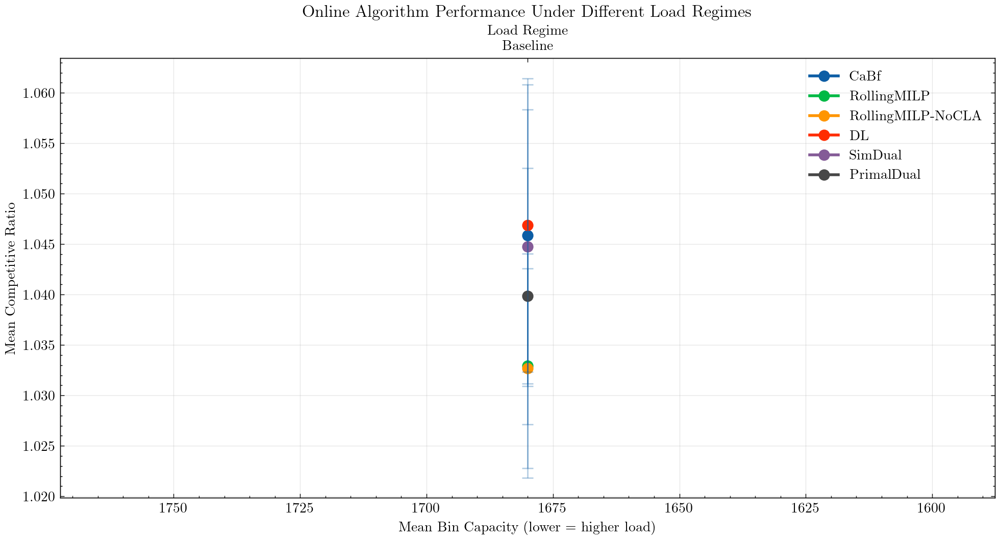

Found 900 successful runs across 1 load scenarios


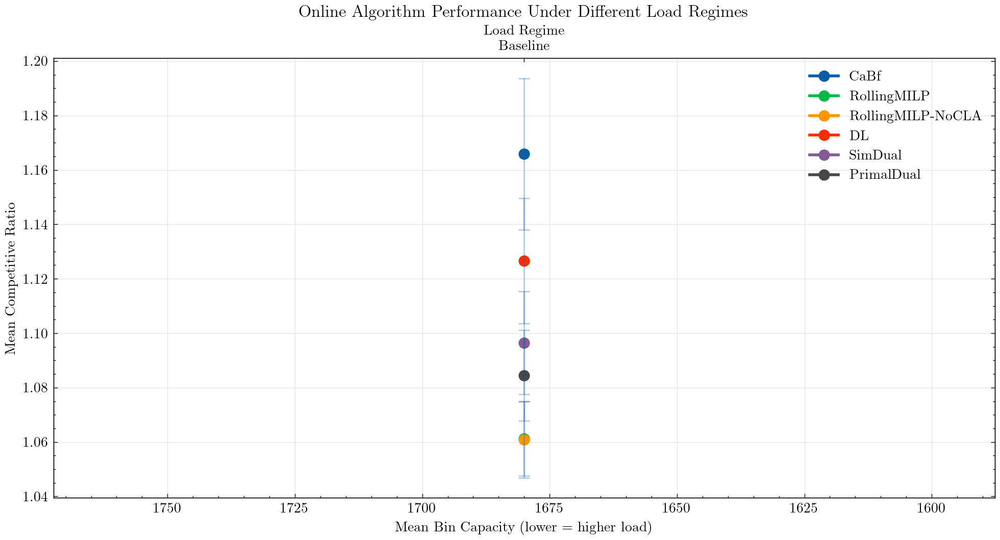

Found 900 successful runs across 1 load scenarios


In [47]:
# FEAS_LOOP_BEGIN
df_eval_all = df_eval_master if "df_eval_master" in globals() and df_eval_master is not None else df_eval
df_opt_all = df_opt_master if "df_opt_master" in globals() and df_opt_master is not None else df_opt
df_per_seed_all = df_per_seed_master if "df_per_seed_master" in globals() and df_per_seed_master is not None else df_per_seed
FIG_DIR_BASE = FIG_DIR_ROOT
for feas in FEAS_TAGS:
    FIG_DIR = FIG_DIR_BASE / feas if FIGS_BY_FEAS else FIG_DIR_BASE
    FIG_DIR.mkdir(parents=True, exist_ok=True)
    df_eval = df_eval_all[df_eval_all["feasibility"] == feas].copy() if df_eval_all is not None else None
    df_opt = df_opt_all[df_opt_all["feasibility"] == feas].copy() if df_opt_all is not None else None
    df_per_seed = df_per_seed_all[df_per_seed_all["feasibility"] == feas].copy() if df_per_seed_all is not None else None
    if df_eval is not None and "scenario_base" in df_eval.columns:
        df_eval["scenario"] = df_eval["scenario_base"]
    if df_opt is not None and "scenario_base" in df_opt.columns:
        df_opt["scenario"] = df_opt["scenario_base"]
    if df_per_seed is not None and "scenario_base" in df_per_seed.columns:
        df_per_seed["scenario"] = df_per_seed["scenario_base"]
    # 3B: Load Regimes - Online Algorithm Stress Test
    # Load regime scenarios: underload, baseline (normal), overload (all off60_on40 or close)
    if df_per_seed is not None:
        # Include baseline scenario for comparison
        load_scenarios = [
            "load_overload_off50_on50",  # b_mean=1360.0 (high load)
            "vol_midvar_off60_on40",  # baseline load (b_mean=default~1680)
            "load_underload_off50_on50",  # b_mean=1880.0 (low load)
        ]

        df_load = df_per_seed[
            (df_per_seed["kind"] == "eval")
            & (df_per_seed["scenario"].isin(load_scenarios))
        ].copy()

        df_opt_load = df_per_seed[
            (df_per_seed["kind"] == "optimal")
            & (df_per_seed["scenario"].isin(load_scenarios))
        ].copy()

        if not df_load.empty:
            # Filter for successful runs
            offline_fail_statuses = {"INFEASIBLE", "INF_OR_UNBD", "UNBOUNDED"}
            online_fail_statuses = {"INFEASIBLE"}

            df_load_success = df_load[
                (~df_load["offline_status"].isin(offline_fail_statuses))
                & (~df_load["online_status"].isin(online_fail_statuses))
            ].copy()

            df_opt_success = df_opt_load[
                ~df_opt_load["status"].isin(offline_fail_statuses)
            ].copy()
            df_opt_success = df_opt_success.rename(columns={"total_objective": "optimal_objective"})

            # Merge with optimal
            df_load_merged = df_load_success.merge(
                df_opt_success[["scenario", "seed", "optimal_objective"]],
                on=["scenario", "seed"],
                how="left",
            )

            df_load_merged = df_load_merged[df_load_merged["optimal_objective"].notna()]
            df_load_merged = df_load_merged[df_load_merged["total_objective"].notna()]
            df_load_merged["competitive_ratio"] = (
                df_load_merged["total_objective"] / df_load_merged["optimal_objective"]
            )

            # Map scenario names to load labels
            load_map = {
                "load_underload_off50_on50": ("Underload", 1880.0),
                "vol_midvar_off60_on40": ("Baseline", 1680.0),
                "load_overload_off50_on50": ("Overload", 1360.0),
            }
            df_load_merged["load_label"] = df_load_merged["scenario"].map(lambda x: load_map.get(x, (x, 0))[0])
            df_load_merged["load_val"] = df_load_merged["scenario"].map(lambda x: load_map.get(x, (x, 0))[1])

            # Aggregate by load regime and online algorithm
            df_load_agg = df_load_merged.groupby(
                ["load_label", "load_val", "online_short"], dropna=False
            ).agg(
                mean_cr=("competitive_ratio", "mean"),
                std_cr=("competitive_ratio", "std"),
                count=("competitive_ratio", "count"),
            ).reset_index()

            # Calculate 95% CI
            df_load_agg["ci"] = 1.96 * df_load_agg["std_cr"] / np.sqrt(df_load_agg["count"])

            # Plot
            fig, ax = plt.subplots(figsize=(10.0, 5.5))

            online_order = ["CaBf", "RollingMILP", "RollingMILP-NoCLA", "DL", "SimDual", "PrimalDual"]
            df_plot = df_load_agg[df_load_agg["online_short"].isin(online_order)]

            for algo in online_order:
                df_algo = df_plot[df_plot["online_short"] == algo].sort_values("load_val", ascending=False)
                if not df_algo.empty:
                    ax.plot(
                        df_algo["load_val"],
                        df_algo["mean_cr"],
                        marker="o",
                        label=algo,
                        linewidth=2,
                        markersize=7,
                    )
                    # Add error bars
                    ax.errorbar(
                        df_algo["load_val"],
                        df_algo["mean_cr"],
                        yerr=df_algo["ci"],
                        fmt="none",
                        alpha=0.3,
                        capsize=4,
                    )

            ax.set_xlabel("Mean Bin Capacity (lower = higher load)")
            ax.set_ylabel("Mean Competitive Ratio")
            ax.set_title("Online Algorithm Performance Under Different Load Regimes")
            ax.legend(loc="best")
            ax.grid(True, alpha=0.3)
            ax.invert_xaxis()  # Invert so high load is on the right

            # Add secondary x-axis labels
            load_labels = df_load_agg.sort_values("load_val", ascending=False)["load_label"].unique()
            load_vals = sorted(df_load_agg["load_val"].unique(), reverse=True)
            ax2 = ax.twiny()
            ax2.set_xlim(ax.get_xlim())
            ax2.set_xticks(load_vals)
            ax2.set_xticklabels(load_labels)
            ax2.set_xlabel("Load Regime")

            fig.tight_layout()
            fig.savefig(FIG_DIR / f"load_regimes_online_stress_test_{feas}.pdf", dpi=200, bbox_inches="tight")
            plt.show()

            print(f"Found {len(df_load_merged)} successful runs across {len(df_load_merged['scenario'].unique())} load scenarios")
        else:
            print("Load regime sweep data not found")
df_eval = df_eval_all
df_opt = df_opt_all
df_per_seed = df_per_seed_all
# FEAS_LOOP_END


<>:213: SyntaxWarning: invalid escape sequence '\%'
<>:316: SyntaxWarning: invalid escape sequence '\%'
<>:213: SyntaxWarning: invalid escape sequence '\%'
<>:316: SyntaxWarning: invalid escape sequence '\%'
/tmp/ipykernel_2067729/729545317.py:213: SyntaxWarning: invalid escape sequence '\%'
  ax.set_xlabel("Offline share (\%)")
/tmp/ipykernel_2067729/729545317.py:316: SyntaxWarning: invalid escape sequence '\%'
  ax.set_xlabel("Offline share (\%)")


Saved: /u/halle/rsim/home_at/projects/Bachelorarbeit/outputs/bgap/analysis/figures/primal_dual_pricing_mode_comparison_by_feas_and_offline_solver.pdf
Saved: /u/halle/rsim/home_at/projects/Bachelorarbeit/outputs/bgap/analysis/figures/dynamic_learning_pricing_mode_comparison_by_feas_and_offline_solver.pdf
Saved: /u/halle/rsim/home_at/projects/Bachelorarbeit/outputs/bgap/analysis/figures/primal_dual_dynamic_learning_pricing_mode_comparison_by_feas_and_offline_solver.pdf


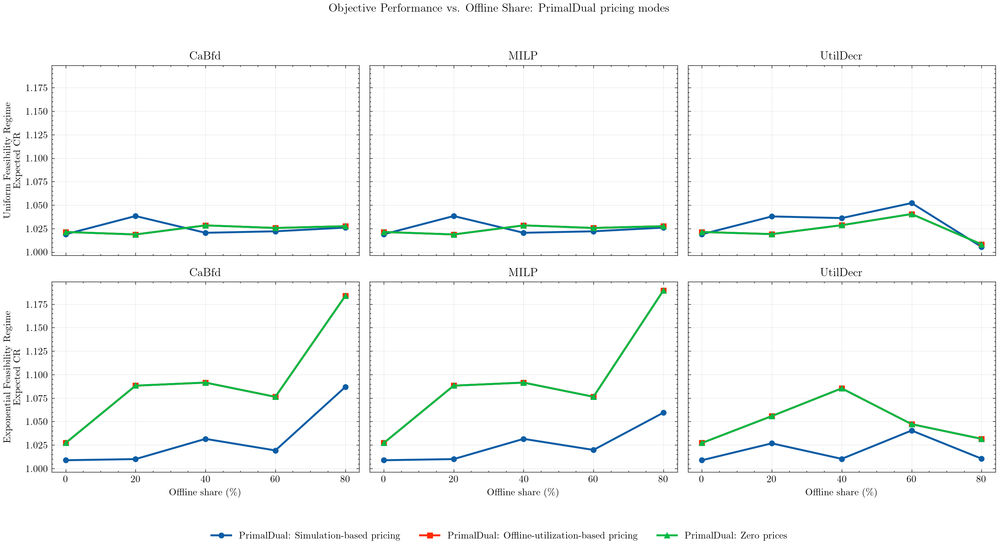

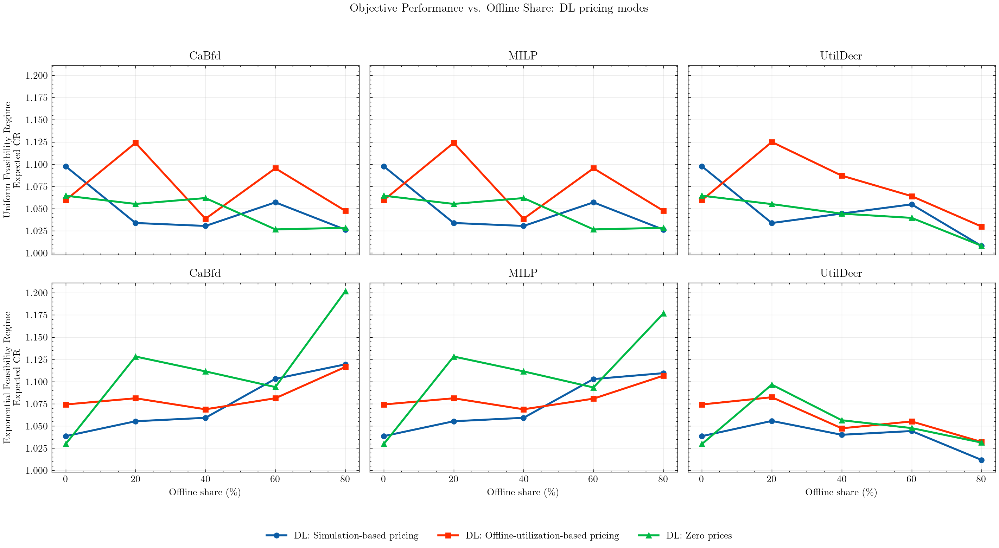

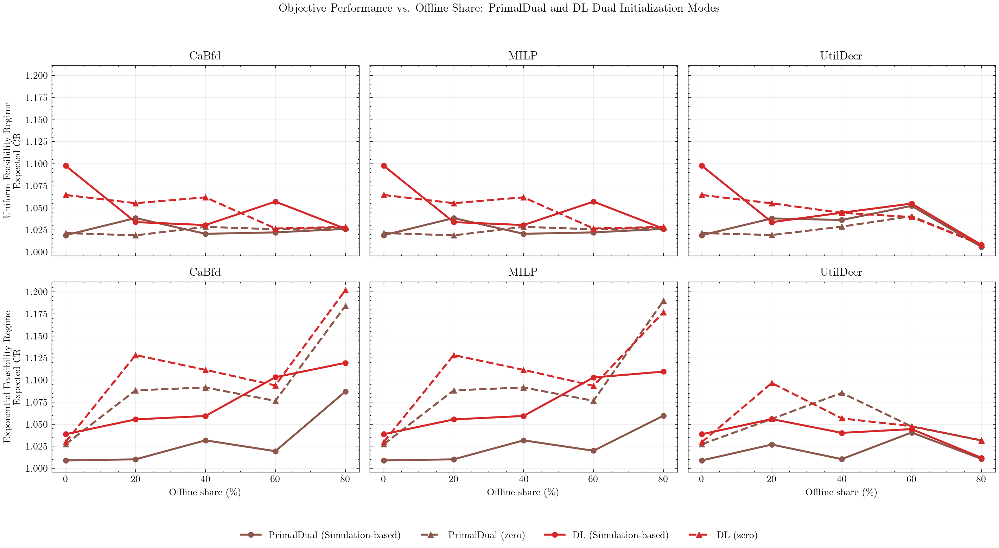

In [48]:
# Dedicated comparison: pricing modes for PrimalDual and DynamicLearning
pd_simlp_dir =  ROOT / "outputs/bgap/results/param_sweep_primaldual_simlp" #BASE_DIR#
pd_offline_util_dir = ROOT / "outputs/bgap/results/param_sweep_primaldual_offline_util"
pd_zero_dir = ROOT / "outputs/bgap/results/param_sweep_primaldual_zero"

dla_zero_dir =  ROOT / "outputs/bgap/results/param_sweep_dla_zero" #BASE_DIR#
dla_simlp_dir = ROOT / "outputs/bgap/results/param_sweep_dla_simlp"
dla_offline_util_dir = ROOT / "outputs/bgap/results/param_sweep_dla_offline_util"

ratio_grid = [0, 20, 40, 60, 80]

online_specs = [
    {
        "online_key": "primal_dual",
        "online_label": "PrimalDual",
        "mode_sources": [
            ("sim_lp", "PrimalDual: Simulation-based pricing", pd_simlp_dir),
            ("offline_util", "PrimalDual: Offline-utilization-based pricing", pd_offline_util_dir),
            ("zero", "PrimalDual: Zero prices", pd_zero_dir),
        ],
    },
    {
        "online_key": "dynamic_learning",
        "online_label": "DL",
        "mode_sources": [
            ("sim_lp", "DL: Simulation-based pricing", dla_simlp_dir),
            ("offline_util", "DL: Offline-utilization-based pricing", dla_offline_util_dir),
            ("zero", "DL: Zero prices", dla_zero_dir),
        ],
    },
]

offline_specs = [
    ("cabfd", "CaBfd", ["cabfd"]),
    ("milp", "MILP", ["bgap_milp", "binpacking_milp"]),
    ("util", "UtilDecr", ["util"]),
]

def _latest_result_file(scenario_dir: Path, prefix: str):
    candidates = list(scenario_dir.glob(f"{prefix}_*.json"))
    if not candidates:
        return None

    def _ts_key(path: Path) -> str:
        m = FILENAME_RE.match(path.name)
        return m.group("ts") if m else ""

    return max(candidates, key=_ts_key)


def _latest_eval_file(scenario_dir: Path, offline_aliases, online_key: str):
    for offline_key in offline_aliases:
        path = _latest_result_file(scenario_dir, f"eval_{offline_key}+{online_key}")
        if path is not None:
            return path, offline_key
    return None, None


def _expected_cr(eval_path: Path, opt_path: Path) -> float:
    eval_data = read_json(eval_path)
    opt_data = read_json(opt_path)

    eval_per_seed = eval_data.get("per_seed") or []
    opt_per_seed = opt_data.get("per_seed") or []

    if eval_per_seed and opt_per_seed:
        eval_by_seed = {}
        for row in eval_per_seed:
            seed = row.get("seed")
            total_obj = row.get("total_objective_penalized", row.get("total_objective"))
            if seed is None or total_obj is None:
                continue
            eval_by_seed[int(seed)] = float(total_obj)

        opt_by_seed = {}
        for row in opt_per_seed:
            seed = row.get("seed")
            total_obj = row.get("total_objective_penalized", row.get("total_objective"))
            if seed is None or total_obj is None:
                continue
            opt_by_seed[int(seed)] = float(total_obj)

        common = sorted(set(eval_by_seed) & set(opt_by_seed))
        ratios = [
            eval_by_seed[seed] / opt_by_seed[seed]
            for seed in common
            if opt_by_seed[seed] > 0
        ]
        if ratios:
            return float(np.mean(ratios))

    eval_agg = eval_data.get("aggregate", {})
    opt_agg = opt_data.get("aggregate", {})
    eval_mean = eval_agg.get("total_objective_penalized_mean", eval_agg.get("total_objective_mean"))
    opt_mean = opt_agg.get("total_objective_penalized_mean", opt_agg.get("total_objective_mean"))
    if eval_mean is None or opt_mean in (None, 0):
        return float("nan")
    return float(eval_mean) / float(opt_mean)


rows = []
missing = []
for feas in FEAS_TAGS:
    for off_pct in ratio_grid:
        scenario = f"baseline_midvar_off{off_pct}_on{100 - off_pct}_{feas}"
        for offline_group, offline_label, offline_aliases in offline_specs:
            for online_spec in online_specs:
                online_key = online_spec["online_key"]
                online_label = online_spec["online_label"]
                for mode_key, mode_label, src_dir in online_spec["mode_sources"]:
                    scenario_dir = src_dir / scenario
                    eval_path, matched_offline = _latest_eval_file(scenario_dir, offline_aliases, online_key)
                    opt_path = _latest_result_file(scenario_dir, "optimal_full_horizon")
                    if eval_path is None or opt_path is None:
                        missing.append((online_key, mode_key, offline_group, scenario))
                        continue
                    cr = _expected_cr(eval_path, opt_path)
                    if not np.isfinite(cr):
                        missing.append((online_key, mode_key, offline_group, scenario))
                        continue
                    rows.append(
                        {
                            "feasibility": feas,
                            "offline_pct": off_pct,
                            "offline_group": offline_group,
                            "offline_label": offline_label,
                            "offline_key": matched_offline,
                            "online_key": online_key,
                            "online_label": online_label,
                            "mode_key": mode_key,
                            "mode_label": mode_label,
                            "expected_cr": cr,
                        }
                    )

if not rows:
    print("No comparison data available for the pricing-mode plot.")
else:
    df_mode = pd.DataFrame(rows)

    feas_list = list(FEAS_TAGS)
    nrows = len(feas_list)
    ncols = len(offline_specs)

    style = {
        ("primal_dual", "sim_lp"): {"color": "C0", "marker": "o", "linestyle": "-"},
        ("primal_dual", "offline_util"): {"color": "C3", "marker": "s", "linestyle": "-"},
        ("primal_dual", "zero"): {"color": "C1", "marker": "^", "linestyle": "-"},
        ("dynamic_learning", "sim_lp"): {"color": "C0", "marker": "o", "linestyle": "-"},
        ("dynamic_learning", "offline_util"): {"color": "C3", "marker": "s", "linestyle": "-"},
        ("dynamic_learning", "zero"): {"color": "C1", "marker": "^", "linestyle": "-"},
    }

    for online_spec in online_specs:
        online_key = online_spec["online_key"]
        online_label = online_spec["online_label"]

        df_online = df_mode[df_mode["online_key"] == online_key].copy()
        if df_online.empty:
            print(f"No rows available for {online_label}.")
            continue

        fig, axes = plt.subplots(
            nrows,
            ncols,
            figsize=(4.8 * ncols, 3.9 * nrows),
            sharex=True,
            sharey=True,
        )
        axes = np.array(axes, dtype=object)
        if axes.ndim == 1:
            if nrows == 1:
                axes = axes.reshape(1, ncols)
            elif ncols == 1:
                axes = axes.reshape(nrows, 1)

        for r, feas in enumerate(feas_list):
            for c, (offline_group, offline_label, _) in enumerate(offline_specs):
                ax = axes[r, c]
                sub = df_online[
                    (df_online["feasibility"] == feas)
                    & (df_online["offline_group"] == offline_group)
                ].copy()

                ax.set_title(f"{offline_label}")
                ax.set_xticks(ratio_grid)
                ax.grid(True, alpha=0.25)

                if c == 0:
                    temp = "Uniform Feasibility Regime" if feas == "uniform" else "Exponential Feasibility Regime"
                    ax.set_ylabel(f"{temp}\nExpected CR")

                if sub.empty:
                    continue

                for mode_key, mode_label, _ in online_spec["mode_sources"]:
                    line_df = sub[sub["mode_key"] == mode_key].sort_values("offline_pct")
                    if line_df.empty:
                        continue
                    st = style.get((online_key, mode_key), {"color": "C7", "marker": "o", "linestyle": "-"})
                    ax.plot(
                        line_df["offline_pct"],
                        line_df["expected_cr"],
                        label=mode_label,
                        color=st["color"],
                        marker=st["marker"],
                        linestyle=st["linestyle"],
                        linewidth=2.0,
                        markersize=5,
                    )

                if r == nrows - 1:
                    ax.set_xlabel("Offline share (\%)")

        legend_handles = []
        legend_labels = []
        for ax in axes.ravel():
            h, l = ax.get_legend_handles_labels()
            for hh, ll in zip(h, l):
                if ll not in legend_labels:
                    legend_handles.append(hh)
                    legend_labels.append(ll)
        if legend_handles:
            fig.legend(
                legend_handles,
                legend_labels,
                loc="lower center",
                ncol=min(3, len(legend_handles)),
                bbox_to_anchor=(0.5, -0.015),
            )

        fig.suptitle(f"Objective Performance vs. Offline Share: {online_label} pricing modes")
        fig.tight_layout(rect=[0, 0.06, 1, 0.95])

        out_path = FIG_DIR_ROOT / f"{online_key}_pricing_mode_comparison_by_feas_and_offline_solver.pdf"
        fig.savefig(out_path, dpi=200, bbox_inches="tight")
        print(f"Saved: {out_path}")


    # Additional combined plot: PrimalDual + DL, simulation-based vs zero (color by algorithm, linestyle by mode)
    combined_online_keys = ["primal_dual", "dynamic_learning"]
    combined_mode_keys = ["sim_lp", "zero"]
    online_key_to_label = {
        "primal_dual": "PrimalDual",
        "dynamic_learning": "DL",
    }
    hybrid_online_order = ["CaBf", "RollingMILP", "RollingMILP-NoCLA", "DL", "SimDual", "PrimalDual"]
    online_colors = {algo: plt.cm.tab10(i % 10) for i, algo in enumerate(hybrid_online_order)}
    mode_linestyle = {"sim_lp": "-", "zero": "--"}
    mode_marker = {"sim_lp": "o", "zero": "^"}
    mode_display_name = {"sim_lp": "Simulation-based", "zero": "zero"}

    df_combo = df_mode[
        df_mode["online_key"].isin(combined_online_keys)
        & df_mode["mode_key"].isin(combined_mode_keys)
    ].copy()

    if df_combo.empty:
        print("No rows available for combined PrimalDual + DL pricing-mode comparison.")
    else:
        fig, axes = plt.subplots(
            nrows,
            ncols,
            figsize=(4.8 * ncols, 3.9 * nrows),
            sharex=True,
            sharey=True,
        )
        axes = np.array(axes, dtype=object)
        if axes.ndim == 1:
            if nrows == 1:
                axes = axes.reshape(1, ncols)
            elif ncols == 1:
                axes = axes.reshape(nrows, 1)

        for r, feas in enumerate(feas_list):
            for c, (offline_group, offline_label, _) in enumerate(offline_specs):
                ax = axes[r, c]
                sub = df_combo[
                    (df_combo["feasibility"] == feas)
                    & (df_combo["offline_group"] == offline_group)
                ].copy()

                ax.set_title(f"{offline_label}")
                ax.set_xticks(ratio_grid)
                ax.grid(True, alpha=0.25)

                if c == 0:
                    temp = "Uniform Feasibility Regime" if feas == "uniform" else "Exponential Feasibility Regime"
                    ax.set_ylabel(f"{temp}\nExpected CR")

                if sub.empty:
                    continue

                for online_key in combined_online_keys:
                    algo_label = online_key_to_label.get(online_key, online_key)
                    color = online_colors.get(algo_label, "C7")
                    for mode_key in combined_mode_keys:
                        line_df = sub[
                            (sub["online_key"] == online_key)
                            & (sub["mode_key"] == mode_key)
                        ].sort_values("offline_pct")
                        if line_df.empty:
                            continue
                        ax.plot(
                            line_df["offline_pct"],
                            line_df["expected_cr"],
                            label=f"{algo_label} ({mode_display_name.get(mode_key, mode_key)})",
                            color=color,
                            marker=mode_marker.get(mode_key, "o"),
                            linestyle=mode_linestyle.get(mode_key, "-"),
                            linewidth=2.0,
                            markersize=5,
                        )

                if r == nrows - 1:
                    ax.set_xlabel("Offline share (\%)")

        legend_handles = []
        legend_labels = []
        for ax in axes.ravel():
            h, l = ax.get_legend_handles_labels()
            for hh, ll in zip(h, l):
                if ll not in legend_labels:
                    legend_handles.append(hh)
                    legend_labels.append(ll)
        if legend_handles:
            fig.legend(
                legend_handles,
                legend_labels,
                loc="lower center",
                ncol=min(4, len(legend_handles)),
                bbox_to_anchor=(0.5, -0.015),
            )

        fig.suptitle("Objective Performance vs. Offline Share: PrimalDual and DL Dual Initialization Modes")
        fig.tight_layout(rect=[0, 0.06, 1, 0.95])

        out_path = FIG_DIR_ROOT / "primal_dual_dynamic_learning_pricing_mode_comparison_by_feas_and_offline_solver.pdf"
        fig.savefig(out_path, dpi=200, bbox_inches="tight")
        print(f"Saved: {out_path}")

if missing:
    miss_df = pd.DataFrame(missing, columns=["online", "mode", "offline", "scenario"])
    print(f"Skipped {len(missing)} missing/unusable combinations.")
    print(miss_df.groupby(["online", "mode"], dropna=False).size().rename("missing_count").reset_index())



# Presentation Plots

Clean versions of the key plots for use in presentations.
- **RollingMILP** throughout this section refers exclusively to the **no-cost-lookahead** variant.
- The cost-lookahead RollingMILP is excluded from all plots below.
- All other algorithms are unchanged.
- Figures are saved to `outputs/bgap/analysis/figures/presentation/`.

In [49]:
# ── Presentation plot setup ────────────────────────────────────────────────────
# "RollingMILP" in presentation = no-cost-lookahead variant (RollingMILP-NoCLA in main analysis).
# The cost-lookahead variant is excluded everywhere below.

PRES_FIG_DIR = FIG_DIR_ROOT / "presentation"
PRES_FIG_DIR.mkdir(parents=True, exist_ok=True)

# Raw online_short labels (as mapped by cell 5's online_map)
_PRES_RAW_ORDER   = ["CaBf", "RollingMILP-NoCLA", "DL", "SimDual", "PrimalDual"]
_PRES_RENAME      = {"RollingMILP-NoCLA": "RollingMILP"}
PRES_ONLINE_ORDER = [_PRES_RENAME.get(a, a) for a in _PRES_RAW_ORDER]  # display names

# Colors: re-index by presentation position so the 5 displayed algos get
# tab10(0..4) = blue, orange, green, red, purple
PRES_COLORS = {a: plt.cm.tab10(i % 10) for i, a in enumerate(PRES_ONLINE_ORDER)}

def pres_filter_rename(df, col="online_short"):
    """Keep only presentation algos and rename NoCLA → RollingMILP."""
    df = df[df[col].isin(_PRES_RAW_ORDER)].copy()
    df[col] = df[col].map(lambda x: _PRES_RENAME.get(x, x))
    return df

print("Presentation setup complete.")
print("NOTE: 'RollingMILP' in all presentation plots = no-cost-lookahead variant (NoCLA).")
print("Online order:", PRES_ONLINE_ORDER)
print("Colors:", {k: "#{:02x}{:02x}{:02x}".format(int(v[0]*255), int(v[1]*255), int(v[2]*255)) for k, v in PRES_COLORS.items()})

Presentation setup complete.
NOTE: 'RollingMILP' in all presentation plots = no-cost-lookahead variant (NoCLA).
Online order: ['CaBf', 'RollingMILP', 'DL', 'SimDual', 'PrimalDual']
Colors: {'CaBf': '#1f77b4', 'RollingMILP': '#ff7f0e', 'DL': '#2ca02c', 'SimDual': '#d62728', 'PrimalDual': '#9467bd'}


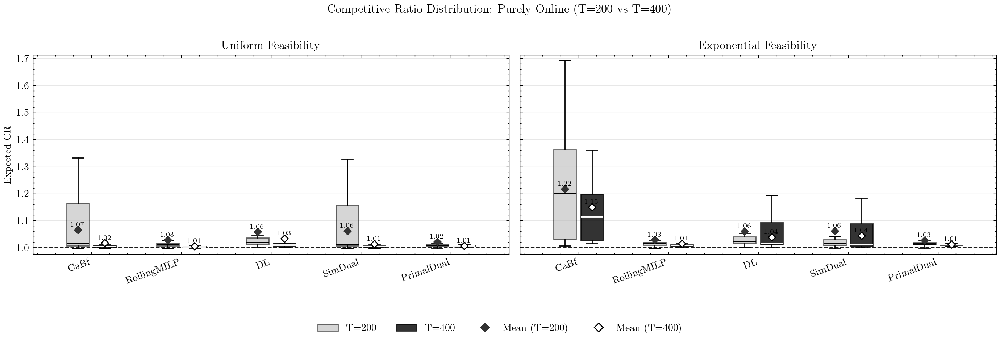

In [50]:
# Presentation Plot 1: CR Distribution (h=200 vs h=400) – CR only, no runtime
df_per_seed_all = df_per_seed_master if "df_per_seed_master" in globals() and df_per_seed_master is not None else df_per_seed

if df_per_seed_all is None:
    print("No per-seed data available.")
else:
    offline_fail_statuses = {"INFEASIBLE", "INF_OR_UNBD", "UNBOUNDED"}
    online_fail_statuses  = {"INFEASIBLE"}
    base_scenario = "baseline_midvar_off0_on100"
    long_scenario = "online_h400_off0_on400"

    feas_list = list(FEAS_TAGS)
    ncols = len(feas_list)

    # Global y-range pass
    all_vals = []
    for feas in feas_list:
        df_ps = df_per_seed_all[df_per_seed_all["feasibility"] == feas].copy()
        if df_ps.empty:
            continue
        if "scenario_base" in df_ps.columns:
            df_ps["scenario"] = df_ps["scenario_base"]
        df_on = df_ps[(df_ps["kind"] == "eval") & (df_ps["T_off"] == 0) &
                      (df_ps["scenario"].isin([base_scenario, long_scenario]))].copy()
        df_on = pres_filter_rename(df_on)
        df_on = df_on[~df_on["offline_status"].isin(offline_fail_statuses) &
                      ~df_on["online_status"].isin(online_fail_statuses)]
        df_op = df_ps[(df_ps["kind"] == "optimal") & (df_ps["T_off"] == 0) &
                      (df_ps["scenario"].isin([base_scenario, long_scenario]))].copy()
        df_op = df_op[~df_op["status"].isin(offline_fail_statuses)].rename(
            columns={"total_objective": "optimal_objective"})
        df_j = df_on.merge(df_op[["scenario", "seed", "optimal_objective"]],
                           on=["scenario", "seed"], how="left")
        df_j = df_j[df_j["optimal_objective"].notna() & df_j["online_objective"].notna()]
        df_j["cr"] = df_j["online_objective"] / df_j["optimal_objective"]
        all_vals.extend(df_j["cr"].dropna().tolist())

    if all_vals:
        gy_min = float(min(all_vals))
        gy_max = float(max(all_vals))
        gy_pad = 0.03 * (gy_max - gy_min) if gy_max > gy_min else 0.03
    else:
        gy_min, gy_max, gy_pad = 0.9, 1.5, 0.02

    fig, axes = plt.subplots(1, ncols, figsize=(7.0 * max(1, ncols), 4.5), sharey=True)
    if ncols == 1:
        axes = np.array([axes])

    for col, feas in enumerate(feas_list):
        ax = axes[col]
        df_ps = df_per_seed_all[df_per_seed_all["feasibility"] == feas].copy()
        if df_ps.empty:
            ax.set_title(f"{feas}: no data"); continue
        if "scenario_base" in df_ps.columns:
            df_ps["scenario"] = df_ps["scenario_base"]

        df_on = df_ps[(df_ps["kind"] == "eval") & (df_ps["T_off"] == 0) &
                      (df_ps["scenario"].isin([base_scenario, long_scenario]))].copy()
        df_on = pres_filter_rename(df_on)
        df_on_s = df_on[~df_on["offline_status"].isin(offline_fail_statuses) &
                        ~df_on["online_status"].isin(online_fail_statuses)].copy()

        df_op = df_ps[(df_ps["kind"] == "optimal") & (df_ps["T_off"] == 0) &
                      (df_ps["scenario"].isin([base_scenario, long_scenario]))].copy()
        df_op = df_op[~df_op["status"].isin(offline_fail_statuses)].rename(
            columns={"total_objective": "optimal_objective"})

        df_j = df_on_s.merge(df_op[["scenario", "seed", "optimal_objective"]],
                             on=["scenario", "seed"], how="left")
        df_j = df_j[df_j["optimal_objective"].notna() & df_j["online_objective"].notna()].copy()
        df_j["competitive_ratio"] = df_j["online_objective"] / df_j["optimal_objective"]
        df_j["online_short"] = pd.Categorical(df_j["online_short"],
                                               categories=PRES_ONLINE_ORDER, ordered=True)

        data_200, data_400, labels = [], [], []
        for algo in PRES_ONLINE_ORDER:
            v200 = df_j[(df_j["online_short"] == algo) & (df_j["scenario"] == base_scenario)][
                "competitive_ratio"].dropna().values
            v400 = df_j[(df_j["online_short"] == algo) & (df_j["scenario"] == long_scenario)][
                "competitive_ratio"].dropna().values
            if len(v200) == 0 and len(v400) == 0:
                continue
            data_200.append(v200); data_400.append(v400); labels.append(algo)

        if not labels:
            ax.set_title(f"{feas}: no data"); continue

        positions = np.arange(1, len(labels) + 1)
        pos_200 = positions - 0.15
        pos_400 = positions + 0.15

        ax.boxplot(data_200, positions=pos_200, widths=0.25, showfliers=False,
                   patch_artist=True,
                   boxprops=dict(facecolor="#bbbbbb", alpha=0.6),
                   medianprops=dict(color="black", linewidth=1.4),
                   whiskerprops=dict(color="black", linewidth=1.0),
                   capprops=dict(color="black", linewidth=1.0))
        ax.boxplot(data_400, positions=pos_400, widths=0.25, showfliers=False,
                   patch_artist=True,
                   boxprops=dict(facecolor="#000000", alpha=0.8),
                   medianprops=dict(color="white", linewidth=1.4),
                   whiskerprops=dict(color="black", linewidth=1.0),
                   capprops=dict(color="black", linewidth=1.0))

        ax.axhline(1.0, color="black", linestyle="--", linewidth=1)
        setting = "Uniform Feasibility" if feas == "uniform" else "Exponential Feasibility"
        ax.set_title(setting)
        if col == 0:
            ax.set_ylabel("Expected CR")
        ax.set_xticks(positions)
        ax.set_xticklabels(labels, rotation=20, ha="right")
        ax.set_ylim(gy_min - gy_pad, gy_max + gy_pad)
        ax.grid(True, axis="y", alpha=0.3)

        y_off = 0.01 * (gy_max - gy_min) if gy_max > gy_min else 0.01
        for pos, vals in zip(pos_200, data_200):
            v = np.array(vals, dtype=float); v = v[~np.isnan(v)]
            if len(v):
                mv = float(np.mean(v))
                ax.scatter(pos, mv, s=26, marker="D", color="#333333", zorder=3)
                ax.text(pos, mv + y_off, f"{mv:.2f}", ha="center", va="bottom",
                        fontsize=7, color="black")
        for pos, vals in zip(pos_400, data_400):
            v = np.array(vals, dtype=float); v = v[~np.isnan(v)]
            if len(v):
                mv = float(np.mean(v))
                ax.scatter(pos, mv, s=26, marker="D", facecolor="white",
                           edgecolor="black", zorder=3)
                ax.text(pos, mv + y_off, f"{mv:.2f}", ha="center", va="bottom",
                        fontsize=7, color="black")

    style_handles = [
        plt.Rectangle((0,0), 1, 1, facecolor="#bbbbbb", alpha=0.6,
                       edgecolor="black", label="T=200"),
        plt.Rectangle((0,0), 1, 1, facecolor="#000000", alpha=0.8,
                       edgecolor="black", label="T=400"),
        plt.Line2D([0], [0], marker="D", linestyle="None",
                   color="#333333", label="Mean (T=200)"),
        plt.Line2D([0], [0], marker="D", linestyle="None", markerfacecolor="white",
                   markeredgecolor="black", label="Mean (T=400)"),
    ]
    fig.legend(handles=style_handles, ncol=4, loc="lower center",
               frameon=False, bbox_to_anchor=(0.5, -0.06))
    fig.suptitle("Competitive Ratio Distribution: Purely Online (T=200 vs T=400)")
    fig.tight_layout(rect=[0, 0.08, 1, 0.97])
    fig.savefig(PRES_FIG_DIR / "pres_cr_distribution_h200_h400.pdf", dpi=200, bbox_inches="tight")
    plt.show()

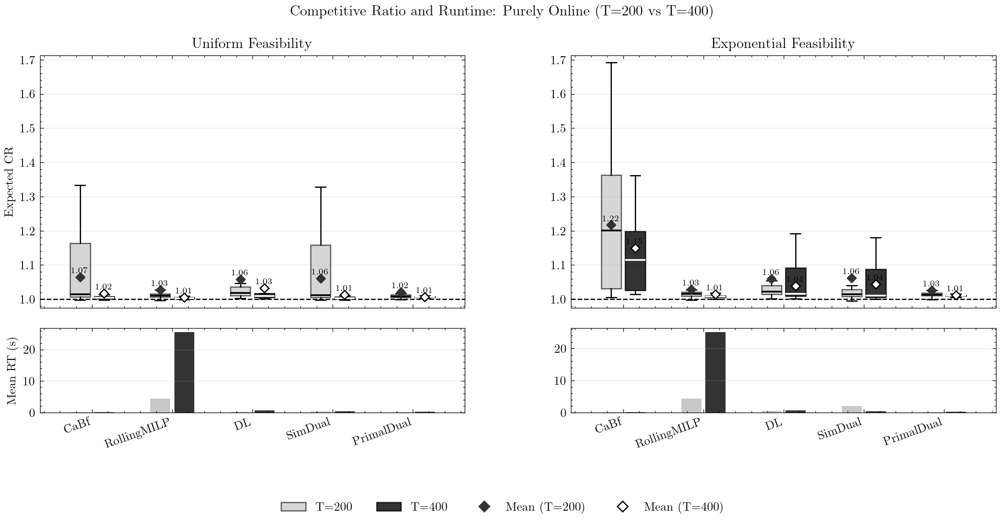

In [51]:
# Presentation Plot 1b: CR Distribution + Runtime (h=200 vs h=400)
df_per_seed_all = df_per_seed_master if "df_per_seed_master" in globals() and df_per_seed_master is not None else df_per_seed

if df_per_seed_all is None:
    print("No per-seed data available.")
else:
    offline_fail_statuses = {"INFEASIBLE", "INF_OR_UNBD", "UNBOUNDED"}
    online_fail_statuses  = {"INFEASIBLE"}
    base_scenario = "baseline_midvar_off0_on100"
    long_scenario = "online_h400_off0_on400"

    feas_list = list(FEAS_TAGS)
    ncols = len(feas_list)

    # Global y-range pass
    all_vals = []
    for feas in feas_list:
        df_ps = df_per_seed_all[df_per_seed_all["feasibility"] == feas].copy()
        if df_ps.empty:
            continue
        if "scenario_base" in df_ps.columns:
            df_ps["scenario"] = df_ps["scenario_base"]
        df_on = df_ps[(df_ps["kind"] == "eval") & (df_ps["T_off"] == 0) &
                      (df_ps["scenario"].isin([base_scenario, long_scenario]))].copy()
        df_on = pres_filter_rename(df_on)
        df_on = df_on[~df_on["offline_status"].isin(offline_fail_statuses) &
                      ~df_on["online_status"].isin(online_fail_statuses)]
        df_op = df_ps[(df_ps["kind"] == "optimal") & (df_ps["T_off"] == 0) &
                      (df_ps["scenario"].isin([base_scenario, long_scenario]))].copy()
        df_op = df_op[~df_op["status"].isin(offline_fail_statuses)].rename(
            columns={"total_objective": "optimal_objective"})
        df_j = df_on.merge(df_op[["scenario", "seed", "optimal_objective"]],
                           on=["scenario", "seed"], how="left")
        df_j = df_j[df_j["optimal_objective"].notna() & df_j["online_objective"].notna()]
        df_j["cr"] = df_j["online_objective"] / df_j["optimal_objective"]
        all_vals.extend(df_j["cr"].dropna().tolist())

    if all_vals:
        gy_min = float(min(all_vals))
        gy_max = float(max(all_vals))
        gy_pad = 0.03 * (gy_max - gy_min) if gy_max > gy_min else 0.03
    else:
        gy_min, gy_max, gy_pad = 0.9, 1.5, 0.02

    fig, axes = plt.subplots(
        2, ncols,
        figsize=(7.0 * max(1, ncols), 5.8),
        sharex="col",
        gridspec_kw={"height_ratios": [3, 1]},
    )
    if ncols == 1:
        axes = np.array([[axes[0]], [axes[1]]])

    for col, feas in enumerate(feas_list):
        ax_box     = axes[0, col]
        ax_runtime = axes[1, col]

        df_ps = df_per_seed_all[df_per_seed_all["feasibility"] == feas].copy()
        if df_ps.empty:
            ax_box.set_title(f"{feas}: no data"); ax_runtime.axis("off"); continue
        if "scenario_base" in df_ps.columns:
            df_ps["scenario"] = df_ps["scenario_base"]

        df_on_all = df_ps[(df_ps["kind"] == "eval") & (df_ps["T_off"] == 0) &
                          (df_ps["scenario"].isin([base_scenario, long_scenario]))].copy()
        df_on_all = pres_filter_rename(df_on_all)
        df_on_s = df_on_all[~df_on_all["offline_status"].isin(offline_fail_statuses) &
                            ~df_on_all["online_status"].isin(online_fail_statuses)].copy()

        df_op = df_ps[(df_ps["kind"] == "optimal") & (df_ps["T_off"] == 0) &
                      (df_ps["scenario"].isin([base_scenario, long_scenario]))].copy()
        df_op = df_op[~df_op["status"].isin(offline_fail_statuses)].rename(
            columns={"total_objective": "optimal_objective"})

        df_j = df_on_s.merge(df_op[["scenario", "seed", "optimal_objective"]],
                             on=["scenario", "seed"], how="left")
        df_j = df_j[df_j["optimal_objective"].notna() & df_j["online_objective"].notna()].copy()
        df_j["competitive_ratio"] = df_j["online_objective"] / df_j["optimal_objective"]
        df_j["online_short"] = pd.Categorical(df_j["online_short"],
                                               categories=PRES_ONLINE_ORDER, ordered=True)

        data_200, data_400, labels = [], [], []
        for algo in PRES_ONLINE_ORDER:
            v200 = df_j[(df_j["online_short"] == algo) & (df_j["scenario"] == base_scenario)][
                "competitive_ratio"].dropna().values
            v400 = df_j[(df_j["online_short"] == algo) & (df_j["scenario"] == long_scenario)][
                "competitive_ratio"].dropna().values
            if len(v200) == 0 and len(v400) == 0:
                continue
            data_200.append(v200); data_400.append(v400); labels.append(algo)

        if not labels:
            ax_box.set_title(f"{feas}: no data"); ax_runtime.axis("off"); continue

        positions = np.arange(1, len(labels) + 1)
        pos_200 = positions - 0.15
        pos_400 = positions + 0.15

        # ── CR boxplot ────────────────────────────────────────────────────────
        ax_box.boxplot(data_200, positions=pos_200, widths=0.25, showfliers=False,
                       patch_artist=True,
                       boxprops=dict(facecolor="#bbbbbb", alpha=0.6),
                       medianprops=dict(color="black", linewidth=1.4),
                       whiskerprops=dict(color="black", linewidth=1.0),
                       capprops=dict(color="black", linewidth=1.0))
        ax_box.boxplot(data_400, positions=pos_400, widths=0.25, showfliers=False,
                       patch_artist=True,
                       boxprops=dict(facecolor="#000000", alpha=0.8),
                       medianprops=dict(color="white", linewidth=1.4),
                       whiskerprops=dict(color="black", linewidth=1.0),
                       capprops=dict(color="black", linewidth=1.0))

        ax_box.axhline(1.0, color="black", linestyle="--", linewidth=1)
        setting = "Uniform Feasibility" if feas == "uniform" else "Exponential Feasibility"
        ax_box.set_title(setting)
        if col == 0:
            ax_box.set_ylabel("Expected CR")
        ax_box.set_ylim(gy_min - gy_pad, gy_max + gy_pad)
        ax_box.tick_params(axis="x", labelbottom=False)
        ax_box.grid(True, axis="y", alpha=0.3)

        y_off = 0.01 * (gy_max - gy_min) if gy_max > gy_min else 0.01
        for pos, vals in zip(pos_200, data_200):
            v = np.array(vals, dtype=float); v = v[~np.isnan(v)]
            if len(v):
                mv = float(np.mean(v))
                ax_box.scatter(pos, mv, s=26, marker="D", color="#333333", zorder=3)
                ax_box.text(pos, mv + y_off, f"{mv:.2f}", ha="center", va="bottom",
                            fontsize=7, color="black")
        for pos, vals in zip(pos_400, data_400):
            v = np.array(vals, dtype=float); v = v[~np.isnan(v)]
            if len(v):
                mv = float(np.mean(v))
                ax_box.scatter(pos, mv, s=26, marker="D", facecolor="white",
                               edgecolor="black", zorder=3)
                ax_box.text(pos, mv + y_off, f"{mv:.2f}", ha="center", va="bottom",
                            fontsize=7, color="black")

        # ── Runtime bar chart ─────────────────────────────────────────────────
        mean_rt_200 = [0.0] * len(labels)
        mean_rt_400 = [0.0] * len(labels)
        if "online_runtime" in df_on_all.columns:
            rt_stats = (df_on_all[df_on_all["online_short"].isin(labels)]
                        .groupby(["scenario", "online_short"])["online_runtime"]
                        .mean())
            for i, algo in enumerate(labels):
                for scen, arr in [(base_scenario, mean_rt_200), (long_scenario, mean_rt_400)]:
                    try:
                        arr[i] = float(rt_stats.loc[(scen, algo)])
                    except KeyError:
                        pass

        ax_runtime.bar(pos_200, mean_rt_200, width=0.25, color="#bbbbbb", alpha=0.8)
        ax_runtime.bar(pos_400, mean_rt_400, width=0.25, color="#000000", alpha=0.8)
        if col == 0:
            ax_runtime.set_ylabel("Mean RT (s)")
        ax_runtime.set_xticks(positions)
        ax_runtime.set_xticklabels(labels, rotation=20, ha="right")
        ax_runtime.grid(True, axis="y", alpha=0.3)

    style_handles = [
        plt.Rectangle((0,0), 1, 1, facecolor="#bbbbbb", alpha=0.6, edgecolor="black", label="T=200"),
        plt.Rectangle((0,0), 1, 1, facecolor="#000000", alpha=0.8, edgecolor="black", label="T=400"),
        plt.Line2D([0], [0], marker="D", linestyle="None", color="#333333", label="Mean (T=200)"),
        plt.Line2D([0], [0], marker="D", linestyle="None", markerfacecolor="white",
                   markeredgecolor="black", label="Mean (T=400)"),
    ]
    fig.legend(handles=style_handles, ncol=4, loc="lower center",
               frameon=False, bbox_to_anchor=(0.5, -0.04))
    fig.suptitle("Competitive Ratio and Runtime: Purely Online (T=200 vs T=400)")
    fig.subplots_adjust(wspace=0.25, hspace=0.12, bottom=0.18)
    fig.savefig(PRES_FIG_DIR / "pres_cr_runtime_h200_h400.pdf", dpi=200, bbox_inches="tight")
    plt.show()

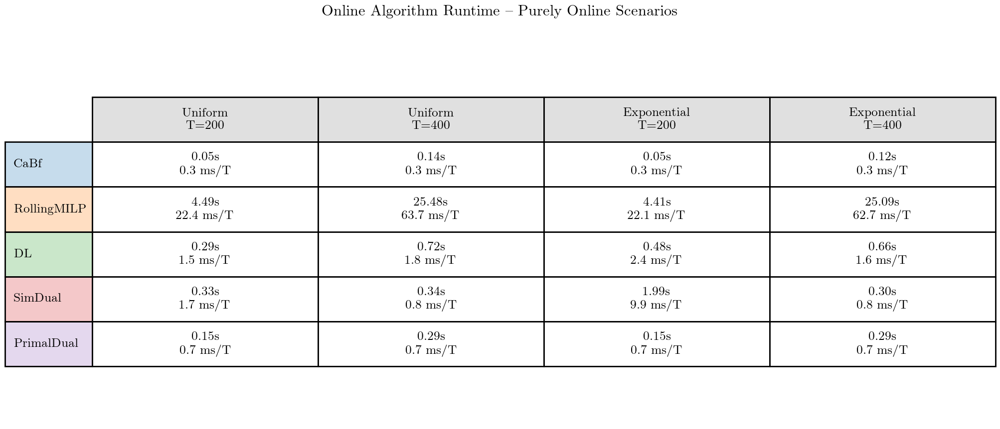

In [52]:
# Presentation Plot 2: Runtime table – one table, each cell shows "Xs  /  Yms/T"
df_per_seed_all = df_per_seed_master if "df_per_seed_master" in globals() and df_per_seed_master is not None else df_per_seed

if df_per_seed_all is None or "online_runtime" not in df_per_seed_all.columns:
    print("No runtime data available.")
else:
    base_scenario = "baseline_midvar_off0_on100"
    long_scenario = "online_h400_off0_on400"
    # actual T_onl values for each scenario
    T_ONL = {base_scenario: 200, long_scenario: 400}
    horizon_labels = {base_scenario: "T=200", long_scenario: "T=400"}
    feas_list = list(FEAS_TAGS)
    feas_display = {"uniform": "Uniform", "expbin_a2": "Exponential"}

    # Collect (mean_rt_s, rt_per_T_ms) per (feas, horizon_label, algo)
    rt_data = {}
    for feas in feas_list:
        df_ps = df_per_seed_all[df_per_seed_all["feasibility"] == feas].copy()
        if df_ps.empty:
            continue
        if "scenario_base" in df_ps.columns:
            df_ps["scenario"] = df_ps["scenario_base"]
        df_rt = df_ps[
            (df_ps["kind"] == "eval")
            & (df_ps["T_off"] == 0)
            & (df_ps["scenario"].isin([base_scenario, long_scenario]))
        ].copy()
        df_rt = pres_filter_rename(df_rt)
        for scen, t_onl in T_ONL.items():
            hlabel = horizon_labels[scen]
            for algo in PRES_ONLINE_ORDER:
                vals = df_rt[
                    (df_rt["online_short"] == algo) & (df_rt["scenario"] == scen)
                ]["online_runtime"].dropna()
                if len(vals) == 0:
                    continue
                mean_rt_s = float(vals.mean())
                rt_per_T_ms = mean_rt_s / t_onl * 1000.0
                rt_data[(feas, hlabel, algo)] = (mean_rt_s, rt_per_T_ms)

    if not rt_data:
        print("No runtime data found for presentation scenarios.")
    else:
        # Columns: Uniform T=200 | Uniform T=400 | Exp T=200 | Exp T=400
        col_specs = [
            (feas, horizon_labels[scen])
            for feas in feas_list
            for scen in [base_scenario, long_scenario]
        ]
        col_headers = [
            f"{feas_display.get(f, f)}\n{h}"
            for f, h in col_specs
        ]
        n_cols = len(col_specs)
        n_rows = len(PRES_ONLINE_ORDER)

        # Each cell: "X.XXs\nY.Yms/T"
        table_data = []
        for algo in PRES_ONLINE_ORDER:
            row = []
            for feas, hlabel in col_specs:
                key = (feas, hlabel, algo)
                if key in rt_data:
                    rt_s, rt_ms = rt_data[key]
                    row.append(f"{rt_s:.2f}s\n{rt_ms:.1f} ms/T")
                else:
                    row.append("—")
            table_data.append(row)

        fig_h = max(3.5, 0.65 * n_rows + 1.2)
        fig_w = max(6.0, 2.1 * n_cols + 1.8)
        fig, ax = plt.subplots(figsize=(fig_w, fig_h))
        ax.axis("off")

        tbl = ax.table(
            cellText=table_data,
            rowLabels=PRES_ONLINE_ORDER,
            colLabels=col_headers,
            cellLoc="center",
            loc="center",
        )
        tbl.auto_set_font_size(False)
        tbl.set_fontsize(9)
        tbl.scale(1.1, 2.4)  # tall cells to fit two lines

        # Shade row headers by algo color
        for row_i, algo in enumerate(PRES_ONLINE_ORDER):
            rgba = PRES_COLORS.get(algo, plt.cm.tab10(0))
            r, g, b = rgba[0], rgba[1], rgba[2]
            tbl[(row_i + 1, -1)].set_facecolor((r, g, b, 0.25))
        # Shade column headers
        for col_i in range(n_cols):
            tbl[(0, col_i)].set_facecolor("#e0e0e0")

        fig.suptitle("Online Algorithm Runtime – Purely Online Scenarios", fontsize=11)
        fig.tight_layout()
        fig.savefig(PRES_FIG_DIR / "pres_runtime_table.pdf", dpi=200, bbox_inches="tight")
        plt.show()

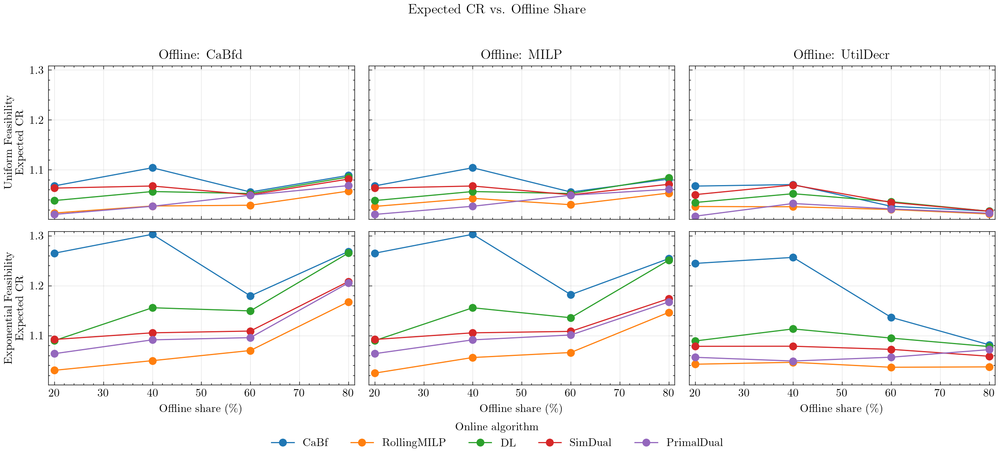

In [53]:
# Presentation Plot 3: Hybrid CR Grid (offline solvers × feasibility)
if "df_baseline_expected" not in globals() or df_baseline_expected is None:
    print("Run the df_baseline_expected cell first.")
else:
    df_plot = df_baseline_expected.copy()
    df_plot = df_plot[df_plot["offline_pct"].gt(0).fillna(False)].copy()
    # Apply presentation rename on online_algorithm column
    df_plot = pres_filter_rename(df_plot, col="online_algorithm")

    if df_plot.empty:
        print("No data after presentation filtering.")
    else:
        offline_order = ["CaBfd", "MILP", "UtilDecr"]
        feas_order    = ["uniform", "expbin_a2"]

        df_plot["offline_algorithm"] = pd.Categorical(
            df_plot["offline_algorithm"], categories=offline_order, ordered=True)
        df_plot["online_algorithm"]  = pd.Categorical(
            df_plot["online_algorithm"],  categories=PRES_ONLINE_ORDER, ordered=True)
        df_plot["feasibility"]       = pd.Categorical(
            df_plot["feasibility"],       categories=feas_order, ordered=True)

        y_min = df_plot["expected_cr"].min()
        y_max = df_plot["expected_cr"].max()
        if pd.isna(y_min) or pd.isna(y_max):
            y_min, y_max = 0.0, 1.0
        y_pad = 0.02 * (y_max - y_min) if y_max > y_min else 0.02 * max(1.0, abs(y_max))
        x_min = df_plot["offline_pct"].min()
        x_max = df_plot["offline_pct"].max()
        x_pad = 0.02 * (x_max - x_min) if x_max > x_min else 1

        nrows = len(feas_order)
        ncols = len(offline_order)
        fig, axes = plt.subplots(nrows=nrows, ncols=ncols,
                                 figsize=(4.2 * ncols, 2.8 * nrows),
                                 sharex=True, sharey=True)
        if nrows == 1 and ncols == 1:
            axes = np.array([[axes]])
        elif nrows == 1:
            axes = np.array([axes])
        elif ncols == 1:
            axes = np.array([[ax] for ax in axes])

        for r, feas in enumerate(feas_order):
            for c, offline in enumerate(offline_order):
                ax = axes[r, c]
                df_sub = df_plot[
                    (df_plot["offline_algorithm"] == offline) &
                    (df_plot["feasibility"]        == feas)
                ].copy()
                if df_sub.empty:
                    if r == 0:
                        ax.set_title(f"{offline} (no data)")
                    ax.grid(True, alpha=0.2)
                    ax.set_ylim(y_min - y_pad, y_max + y_pad)
                    ax.set_xlim(x_min - x_pad, x_max + x_pad)
                else:
                    for online in PRES_ONLINE_ORDER:
                        df_on = df_sub[df_sub["online_algorithm"] == online]
                        if df_on.empty:
                            continue
                        ax.plot(df_on["offline_pct"], df_on["expected_cr"],
                                marker="o", label=str(online),
                                color=PRES_COLORS.get(online, "C7"))
                    if r == 0:
                        ax.set_title("Offline: " + str(offline))
                    ax.set_ylim(y_min - y_pad, y_max + y_pad)
                    ax.set_xlim(x_min - x_pad, x_max + x_pad)
                    ax.grid(True, alpha=0.3)
                setting = "Uniform Feasibility" if feas == "uniform" else "Exponential Feasibility"
                if c == 0:
                    ax.set_ylabel(f"{setting}\nExpected CR")
                if r == nrows - 1:
                    ax.set_xlabel(r"Offline share (\%)")

        from matplotlib.lines import Line2D
        handles = [Line2D([0], [0], color=PRES_COLORS.get(a, "C7"), marker="o",
                          linestyle="-", label=a)
                   for a in PRES_ONLINE_ORDER]
        fig.legend(handles=handles, title="Online algorithm",
                   ncol=min(5, len(handles)), loc="lower center",
                   bbox_to_anchor=(0.5, -0.02), frameon=False)
        fig.suptitle("Expected CR vs. Offline Share")
        fig.tight_layout(rect=[0, 0.05, 1, 0.96])
        fig.savefig(PRES_FIG_DIR / "pres_hybrid_cr_grid.pdf", dpi=200, bbox_inches="tight")
        plt.show()


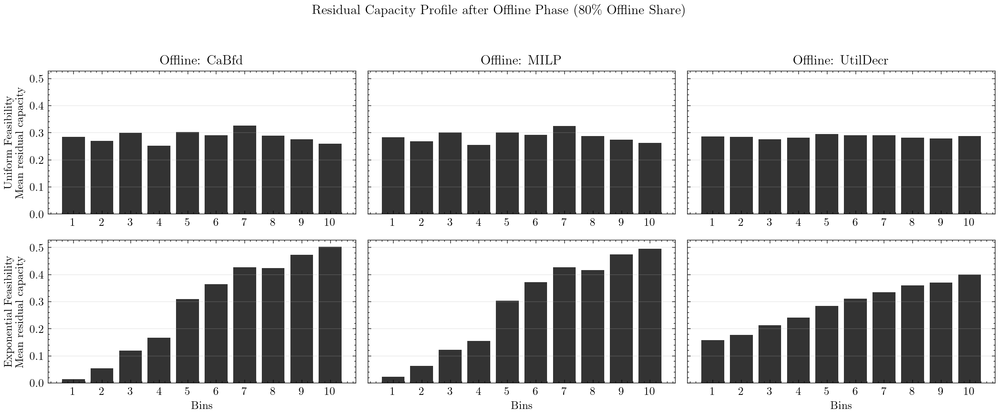

In [54]:
# Presentation Plot 4: Offline Residual Capacity Profile (unchanged)
if df_per_seed is None and (df_per_seed_master is None if "df_per_seed_master" in globals() else True):
    print("No per-seed data available.")
else:
    _df_ps_res = df_per_seed_master if "df_per_seed_master" in globals() and df_per_seed_master is not None else df_per_seed
    df_res_all = _df_ps_res[
        (_df_ps_res["kind"]   == "eval")
        & (_df_ps_res["family"] == "baseline")
        & (_df_ps_res["T_off"]  == 160)
    ].copy()
    df_res_all = df_res_all[df_res_all["offline_util_per_bin"].notna()]

    if df_res_all.empty:
        print("No per-bin offline utilization data for baseline with T_off = 160")
    else:
        offline_order = ["CaBfd", "MILP", "UtilDecr"]
        feas_order    = ["uniform", "expbin_a2"]

        grouped_by_feas = {}
        for feas in feas_order:
            df_res = df_res_all[df_res_all["feasibility"] == feas].copy()
            if df_res.empty:
                grouped_by_feas[feas] = None
                continue
            util_matrix     = df_res["offline_util_per_bin"].apply(pd.Series)
            residual_matrix = 1.0 - util_matrix
            residual_matrix["offline_short"] = df_res["offline_short"].values
            grouped = residual_matrix.groupby("offline_short", dropna=False).mean(numeric_only=True)
            grouped_by_feas[feas] = grouped

        nrows = len(feas_order)
        ncols = len(offline_order)
        fig, axes = plt.subplots(nrows, ncols,
                                 figsize=(4.2 * ncols, 2.8 * nrows), sharey=True)
        if nrows == 1 and ncols == 1:
            axes = np.array([[axes]])
        elif nrows == 1:
            axes = np.array([axes])
        elif ncols == 1:
            axes = np.array([[ax] for ax in axes])

        for r, feas in enumerate(feas_order):
            grouped = grouped_by_feas.get(feas)
            for c, algo in enumerate(offline_order):
                ax = axes[r, c]
                if grouped is None or algo not in grouped.index:
                    if r == 0:
                        ax.set_title(f"{algo} (no data)")
                    ax.axis("off")
                    continue
                values = grouped.loc[algo].values
                bins   = np.arange(1, len(values) + 1)
                ax.bar(bins, values, color="black", alpha=0.8)
                if r == 0:
                    ax.set_title(f"Offline: {algo}")
                if c == 0:
                    setting = "Uniform Feasibility" if feas == "uniform" else "Exponential Feasibility"
                    ax.set_ylabel(f"{setting}\nMean residual capacity")
                if r == nrows - 1:
                    ax.set_xlabel("Bins")
                ax.set_xticks(bins)
                ax.set_xticklabels(bins)
                ax.grid(True, axis="y", alpha=0.3)

        fig.suptitle(r"Residual Capacity Profile after Offline Phase (80\% Offline Share)")
        fig.tight_layout(rect=[0, 0.05, 1, 0.95])
        fig.savefig(PRES_FIG_DIR / "pres_offline_residual_profile.pdf", dpi=200, bbox_inches="tight")
        plt.show()


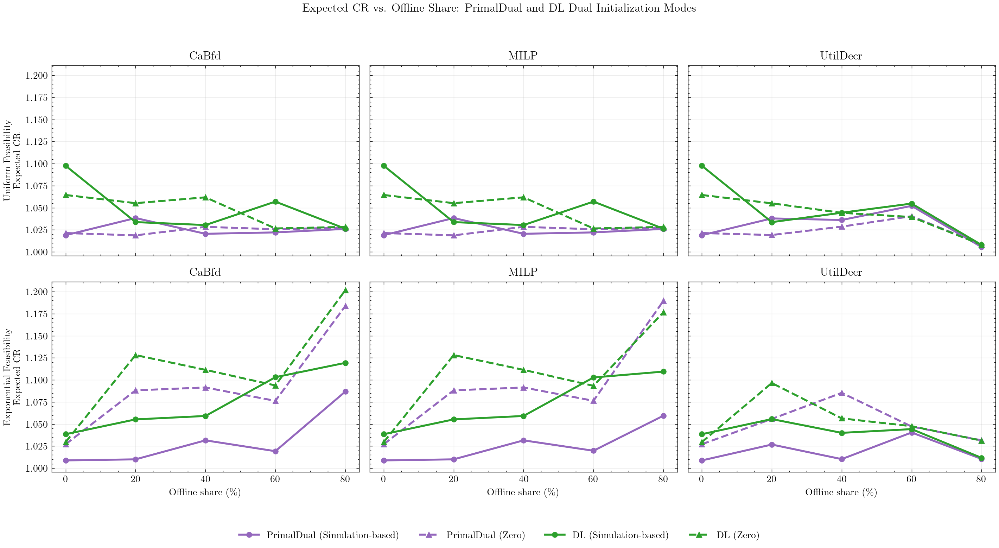

In [55]:
# Presentation Plot 5: PrimalDual & DynamicLearning pricing modes
# Reuses df_mode computed in the pricing-mode comparison cell above.
if "df_mode" not in globals() or df_mode is None or df_mode.empty:
    print("df_mode not available. Run the pricing-mode comparison cell first.")
else:
    combined_online_keys = ["primal_dual", "dynamic_learning"]
    combined_mode_keys   = ["sim_lp", "zero"]
    online_key_to_label  = {"primal_dual": "PrimalDual", "dynamic_learning": "DL"}
    mode_linestyle       = {"sim_lp": "-",  "zero": "--"}
    mode_marker          = {"sim_lp": "o",  "zero": "^"}
    mode_display_name    = {"sim_lp": "Simulation-based", "zero": "Zero"}
    online_colors        = PRES_COLORS

    df_combo = df_mode[
        df_mode["online_key"].isin(combined_online_keys) &
        df_mode["mode_key"].isin(combined_mode_keys)
    ].copy()

    if df_combo.empty:
        print("No rows for combined PrimalDual + DL pricing-mode comparison.")
    else:
        feas_list   = list(FEAS_TAGS)
        offline_specs_pres = [
            ("cabfd", "CaBfd", ["cabfd"]),
            ("milp",  "MILP",  ["bgap_milp", "binpacking_milp"]),
            ("util",  "UtilDecr", ["util"]),
        ]
        nrows = len(feas_list)
        ncols = len(offline_specs_pres)

        fig, axes = plt.subplots(nrows, ncols,
                                 figsize=(4.8 * ncols, 3.9 * nrows),
                                 sharex=True, sharey=True)
        axes = np.array(axes, dtype=object)
        if axes.ndim == 1:
            axes = axes.reshape(1, ncols) if nrows == 1 else axes.reshape(nrows, 1)

        ratio_grid = [0, 20, 40, 60, 80]
        for r, feas in enumerate(feas_list):
            for c, (offline_group, offline_label, _) in enumerate(offline_specs_pres):
                ax = axes[r, c]
                sub = df_combo[
                    (df_combo["feasibility"]   == feas) &
                    (df_combo["offline_group"] == offline_group)
                ].copy()
                ax.set_title(f"{offline_label}")
                ax.set_xticks(ratio_grid)
                ax.grid(True, alpha=0.25)
                if c == 0:
                    temp = "Uniform Feasibility" if feas == "uniform" else "Exponential Feasibility"
                    ax.set_ylabel(f"{temp}\nExpected CR")
                if sub.empty:
                    continue
                for online_key in combined_online_keys:
                    algo_label = online_key_to_label.get(online_key, online_key)
                    color = online_colors.get(algo_label, "C7")
                    for mode_key in combined_mode_keys:
                        line_df = sub[
                            (sub["online_key"] == online_key) &
                            (sub["mode_key"]   == mode_key)
                        ].sort_values("offline_pct")
                        if line_df.empty:
                            continue
                        ax.plot(
                            line_df["offline_pct"],
                            line_df["expected_cr"],
                            label=f"{algo_label} ({mode_display_name.get(mode_key, mode_key)})",
                            color=color,
                            marker=mode_marker.get(mode_key, "o"),
                            linestyle=mode_linestyle.get(mode_key, "-"),
                            linewidth=2.0,
                            markersize=5,
                        )
                if r == nrows - 1:
                    ax.set_xlabel(r"Offline share (\%)")

        legend_handles, legend_labels = [], []
        for ax in axes.ravel():
            h, l = ax.get_legend_handles_labels()
            for hh, ll in zip(h, l):
                if ll not in legend_labels:
                    legend_handles.append(hh); legend_labels.append(ll)
        if legend_handles:
            fig.legend(legend_handles, legend_labels,
                       loc="lower center", ncol=min(4, len(legend_handles)),
                       bbox_to_anchor=(0.5, -0.015), frameon=False)

        fig.suptitle("Expected CR vs. Offline Share: PrimalDual and DL Dual Initialization Modes")
        fig.tight_layout(rect=[0, 0.06, 1, 0.95])
        fig.savefig(PRES_FIG_DIR / "pres_primal_dual_dynamic_learning_pricing_modes.pdf",
                    dpi=200, bbox_inches="tight")
        plt.show()


/tmp/ipykernel_2067729/2715562299.py:90: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = (df_line.groupby("dispersion")["expected_cr"]
/tmp/ipykernel_2067729/2715562299.py:90: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = (df_line.groupby("dispersion")["expected_cr"]
/tmp/ipykernel_2067729/2715562299.py:90: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = (df_line.groupby("dispersion")["expected_cr"]
/

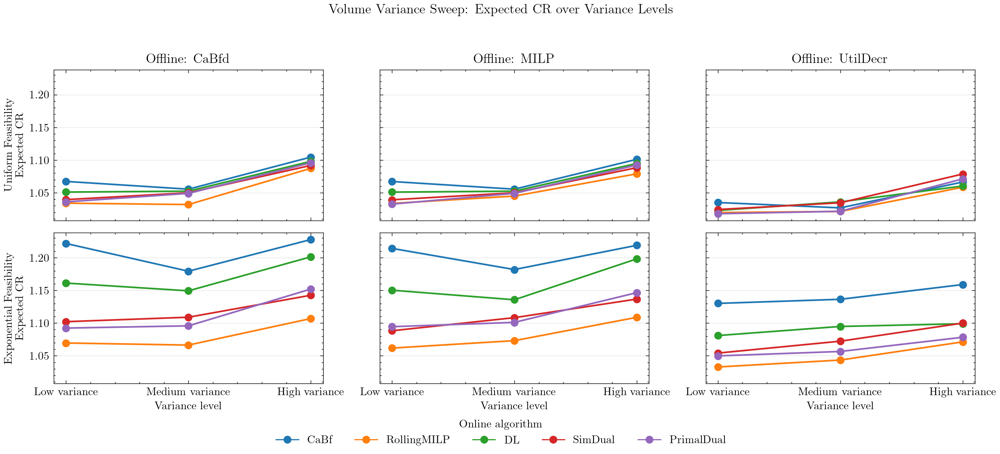

In [56]:
# Presentation Plot 6: Volume Variance Sweep – CR lines per offline×feas grid
df_per_seed_all = df_per_seed_master if "df_per_seed_master" in globals() and df_per_seed_master is not None else df_per_seed

if df_per_seed_all is None:
    print("No per-seed data available.")
else:
    dispersion_patterns = {
        "vol_lowvar":            "Low variance",
        "vol_midvar":            "Medium variance",
        "vol_highuncert_uniform":"High variance",
    }
    dispersion_order = ["Low variance", "Medium variance", "High variance"]
    offline_order    = ["CaBfd", "MILP", "UtilDecr"]

    def _add_dispersion_label(df, scenario_col="scenario"):
        if df is None or df.empty or scenario_col not in df.columns:
            return df
        series = df[scenario_col].astype(str)
        labels = pd.Series(index=df.index, dtype=object)
        for key, label in dispersion_patterns.items():
            labels.loc[series.str.contains(key, na=False)] = label
        df = df.copy()
        df["dispersion"] = labels
        return df[df["dispersion"].notna()]

    offline_fail_statuses = {"INFEASIBLE", "INF_OR_UNBD", "UNBOUNDED"}
    online_fail_statuses  = {"INFEASIBLE"}

    df_eval_d  = df_per_seed_all[df_per_seed_all["kind"] == "eval"].copy()
    df_opt_d   = df_per_seed_all[df_per_seed_all["kind"] == "optimal"].copy()
    for _df in [df_eval_d, df_opt_d]:
        if "scenario_base" in _df.columns:
            _df["scenario"] = _df["scenario_base"]

    df_eval_d = _add_dispersion_label(df_eval_d)
    df_opt_d  = _add_dispersion_label(df_opt_d)

    df_eval_d = df_eval_d[
        (~df_eval_d["offline_status"].isin(offline_fail_statuses)) &
        (~df_eval_d["online_status"].isin(online_fail_statuses))
    ].copy()
    df_opt_d  = df_opt_d[~df_opt_d["status"].isin(offline_fail_statuses)].copy()
    df_opt_d  = df_opt_d.rename(columns={"total_objective": "optimal_objective"})

    # Apply presentation filter before merge
    df_eval_d = pres_filter_rename(df_eval_d)

    df_cr_d = df_eval_d.merge(
        df_opt_d[["scenario", "feasibility", "seed", "optimal_objective"]],
        on=["scenario", "feasibility", "seed"],
        how="left",
    )
    df_cr_d = df_cr_d[df_cr_d["optimal_objective"].notna() &
                       df_cr_d["total_objective"].notna()].copy()
    df_cr_d["expected_cr"] = df_cr_d["total_objective"] / df_cr_d["optimal_objective"]
    df_cr_d["dispersion"]  = pd.Categorical(
        df_cr_d["dispersion"], categories=dispersion_order, ordered=True)

    if df_cr_d.empty:
        print("No volume dispersion data after filtering.")
    else:
        nrows = len(FEAS_TAGS)
        ncols = len(offline_order)
        fig, axes = plt.subplots(nrows=nrows, ncols=ncols,
                                 figsize=(4.2 * ncols, 2.8 * max(1, nrows)),
                                 sharey=True, sharex=True)
        if nrows == 1 and ncols == 1:
            axes = np.array([[axes]])
        elif nrows == 1:
            axes = np.array([axes])
        elif ncols == 1:
            axes = np.array([[ax] for ax in axes])

        for r, feas in enumerate(FEAS_TAGS):
            for c, offline_algo in enumerate(offline_order):
                ax = axes[r, c]
                df_sub = df_cr_d[
                    (df_cr_d["feasibility"]   == feas) &
                    (df_cr_d["offline_short"] == offline_algo)
                ].copy()
                if df_sub.empty:
                    if r == 0:
                        ax.set_title(f"{offline_algo} (no data)")
                    ax.grid(True, axis="y", alpha=0.2)
                    continue
                for online_algo in PRES_ONLINE_ORDER:
                    df_line = df_sub[df_sub["online_short"] == online_algo].copy()
                    if df_line.empty:
                        continue
                    means = (df_line.groupby("dispersion")["expected_cr"]
                             .mean().reindex(dispersion_order))
                    ax.plot(dispersion_order, means.values,
                            marker="o", linewidth=1.5, label=online_algo,
                            color=PRES_COLORS.get(online_algo, "C7"))
                if r == 0:
                    ax.set_title(f"Offline: {offline_algo}")
                if c == 0:
                    setting = "Uniform Feasibility" if feas == "uniform" else "Exponential Feasibility"
                    ax.set_ylabel(f"{setting}\nExpected CR")
                if r == nrows - 1:
                    ax.set_xlabel("Variance level")
                ax.grid(True, axis="y", alpha=0.3)

        from matplotlib.lines import Line2D
        handles = [Line2D([0], [0], color=PRES_COLORS.get(a, "C7"), marker="o",
                          linestyle="-", label=a)
                   for a in PRES_ONLINE_ORDER]
        fig.legend(handles=handles, title="Online algorithm",
                   ncol=len(handles), loc="lower center",
                   bbox_to_anchor=(0.5, -0.02), frameon=False)
        fig.suptitle("Volume Variance Sweep: Expected CR over Variance Levels")
        fig.tight_layout(rect=[0, 0.05, 1, 0.95])
        fig.savefig(PRES_FIG_DIR / "pres_volume_dispersion_cr_lines.pdf",
                    dpi=200, bbox_inches="tight")
        plt.show()


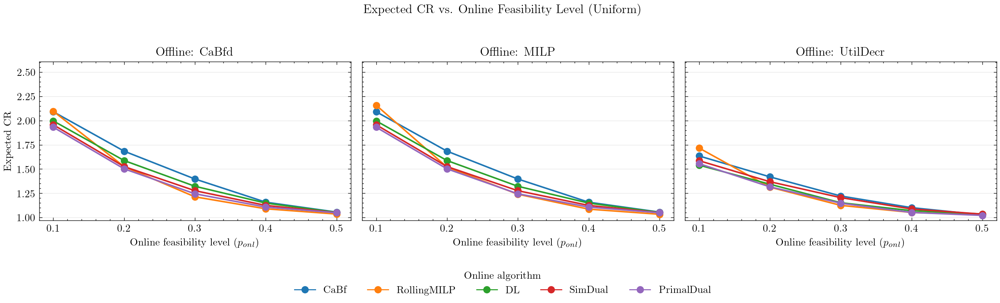

In [57]:
# Presentation Plot 7: Feasibility Sweep – CR vs. online sparsity (uniform, line plot)
df_per_seed_all = df_per_seed_master if "df_per_seed_master" in globals() and df_per_seed_master is not None else df_per_seed

sparse_scenarios = [
    "graph_0.1_off60_on40",
    "graph_sparse_off60_on40",
    "graph_0.3_off60_on40",
    "graph_0.4_off60_on40",
    "graph_mid_off60_on40",
]
sparsity_map = {
    "graph_0.1_off60_on40":    ("p_onl=0.1", 0.1),
    "graph_sparse_off60_on40": ("p_onl=0.2", 0.2),
    "graph_0.3_off60_on40":    ("p_onl=0.3", 0.3),
    "graph_0.4_off60_on40":    ("p_onl=0.4", 0.4),
    "graph_mid_off60_on40":    ("p_onl=0.5", 0.5),
}
sparsity_order = [0.1, 0.2, 0.3, 0.4, 0.5]
offline_order  = ["CaBfd", "MILP", "UtilDecr"]
feas = "uniform"

if df_per_seed_all is None:
    print("No per-seed data.")
else:
    df_ps = df_per_seed_all[df_per_seed_all["feasibility"] == feas].copy()
    if "scenario_base" in df_ps.columns:
        df_ps["scenario"] = df_ps["scenario_base"]

    df_ev = df_ps[(df_ps["kind"] == "eval") &
                  (df_ps["scenario"].isin(sparse_scenarios))].copy()
    df_op = df_ps[(df_ps["kind"] == "optimal") &
                  (df_ps["scenario"].isin(sparse_scenarios))].copy()

    if df_ev.empty or df_op.empty:
        print("Feasibility sparsity sweep data not found (uniform).")
    else:
        offline_fail_statuses = {"INFEASIBLE", "INF_OR_UNBD", "UNBOUNDED"}
        online_fail_statuses  = {"INFEASIBLE"}

        df_ev = df_ev[
            (~df_ev["offline_status"].isin(offline_fail_statuses)) &
            (~df_ev["online_status"].isin(online_fail_statuses))
        ].copy()
        df_op = df_op[~df_op["status"].isin(offline_fail_statuses)].copy()
        df_op = df_op.rename(columns={"total_objective": "optimal_objective"})

        if "run_dt" in df_op.columns:
            df_op = df_op.sort_values("run_dt")
        elif "run_id" in df_op.columns:
            df_op = df_op.sort_values("run_id")
        df_op = df_op.drop_duplicates(subset=["scenario", "seed"], keep="last")

        # Apply presentation filter
        df_ev = pres_filter_rename(df_ev)

        df_cr = df_ev.merge(
            df_op[["scenario", "seed", "optimal_objective"]],
            on=["scenario", "seed"], how="left", validate="many_to_one")
        df_cr = df_cr[df_cr["optimal_objective"].notna() &
                       df_cr["total_objective"].notna()].copy()
        df_cr["competitive_ratio"] = df_cr["total_objective"] / df_cr["optimal_objective"]
        df_cr["sparsity_val"] = df_cr["scenario"].map(
            lambda x: sparsity_map.get(x, (x, None))[1])
        df_cr = df_cr[df_cr["sparsity_val"].notna()].copy()

        if df_cr.empty:
            print("No valid sparsity CR data after filtering (uniform).")
        else:
            y_min = df_cr["competitive_ratio"].quantile(0.02)
            y_max = df_cr["competitive_ratio"].quantile(0.98)
            if pd.isna(y_min) or pd.isna(y_max) or y_min >= y_max:
                y_min = df_cr["competitive_ratio"].min()
                y_max = df_cr["competitive_ratio"].max()
            if pd.isna(y_min) or pd.isna(y_max):
                y_min, y_max = 0.0, 1.0
            y_pad = 0.02 * (y_max - y_min) if y_max > y_min else 0.02 * max(1.0, abs(y_max))

            fig, axes = plt.subplots(1, len(offline_order),
                                     figsize=(13.5, 3.8), sharey=True)
            if len(offline_order) == 1:
                axes = np.array([axes])

            for ax, offline_algo in zip(axes, offline_order):
                df_off = df_cr[df_cr["offline_short"] == offline_algo].copy()
                if df_off.empty:
                    ax.set_title(f"Offline: {offline_algo} (no data)")
                    ax.axis("off")
                    continue
                for online_algo in PRES_ONLINE_ORDER:
                    df_line = df_off[df_off["online_short"] == online_algo].copy()
                    if df_line.empty:
                        continue
                    means = (df_line.groupby("sparsity_val")["competitive_ratio"]
                             .mean().reindex(sparsity_order))
                    ax.plot(sparsity_order, means.values,
                            marker="o", linewidth=1.5, label=online_algo,
                            color=PRES_COLORS.get(online_algo, "C7"))
                ax.set_title(f"Offline: {offline_algo}")
                ax.set_xticks(sparsity_order)
                ax.set_xticklabels([f"{v:.1f}" for v in sparsity_order])
                ax.set_xlabel(r"Online feasibility level ($p_{onl}$)")
                ax.set_ylim(y_min - y_pad, y_max + y_pad)
                ax.grid(True, axis="y", alpha=0.3)

            axes[0].set_ylabel("Expected CR")

            from matplotlib.lines import Line2D
            handles = [Line2D([0], [0], color=PRES_COLORS.get(a, "C7"), marker="o",
                              linestyle="-", label=a)
                       for a in PRES_ONLINE_ORDER]
            fig.legend(handles=handles, title="Online algorithm",
                       ncol=min(5, len(handles)), loc="lower center",
                       bbox_to_anchor=(0.5, -0.08), frameon=False)
            fig.suptitle("Expected CR vs. Online Feasibility Level (Uniform)")
            fig.tight_layout(rect=[0, 0.08, 1, 0.95])
            fig.savefig(PRES_FIG_DIR / "pres_feasibility_tradeoff_cr_lines_uniform.pdf",
                        dpi=200, bbox_inches="tight")
            plt.show()


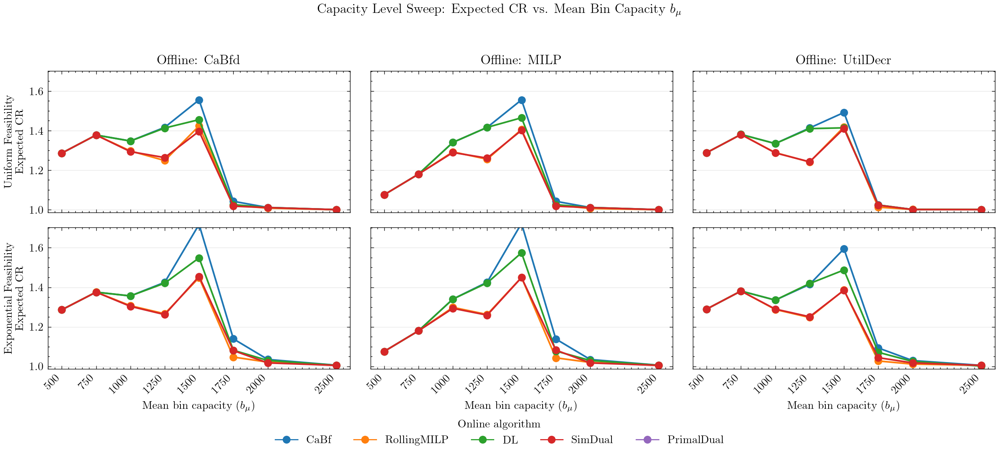

In [58]:
# Presentation Plot 8: Capacity Level Sweep – CR vs. mean bin capacity (b_mean)
df_per_seed_all = df_per_seed_master if "df_per_seed_master" in globals() and df_per_seed_master is not None else df_per_seed

if df_per_seed_all is None:
    print("No per-seed data available.")
else:
    import re

    cap_mu_values  = [500, 750, 1000, 1250, 1500, 1750, 2000, 2500]
    cap_scenarios  = [f"cap_mu{mu}_off60_on40" for mu in cap_mu_values]
    offline_order  = ["CaBfd", "MILP", "UtilDecr"]

    offline_fail_statuses = {"INFEASIBLE", "INF_OR_UNBD", "UNBOUNDED"}
    online_fail_statuses  = {"INFEASIBLE"}

    df_eval_c = df_per_seed_all[df_per_seed_all["kind"] == "eval"].copy()
    df_opt_c  = df_per_seed_all[df_per_seed_all["kind"] == "optimal"].copy()

    for _df in [df_eval_c, df_opt_c]:
        if "scenario_base" in _df.columns:
            _df["scenario"] = _df["scenario_base"]

    df_eval_c = df_eval_c[df_eval_c["scenario"].isin(cap_scenarios)].copy()
    df_opt_c  = df_opt_c[df_opt_c["scenario"].isin(cap_scenarios)].copy()

    df_eval_c = df_eval_c[
        (~df_eval_c["offline_status"].isin(offline_fail_statuses)) &
        (~df_eval_c["online_status"].isin(online_fail_statuses))
    ].copy()
    df_opt_c  = df_opt_c[~df_opt_c["status"].isin(offline_fail_statuses)].copy()
    df_opt_c  = df_opt_c.rename(columns={"total_objective": "optimal_objective"})

    # Deduplicate optimal (keep latest run per scenario/feas/seed)
    if "run_dt" in df_opt_c.columns:
        df_opt_c = df_opt_c.sort_values("run_dt")
    elif "run_id" in df_opt_c.columns:
        df_opt_c = df_opt_c.sort_values("run_id")
    df_opt_c = df_opt_c.drop_duplicates(subset=["scenario", "feasibility", "seed"], keep="last")

    df_eval_c = pres_filter_rename(df_eval_c)

    if df_eval_c.empty or df_opt_c.empty:
        print("Capacity sweep data not found. Run cap_sweep first.")
    else:
        def _extract_mu(s):
            m = re.match(r"cap_mu(\d+)_off", str(s))
            return int(m.group(1)) if m else None

        df_eval_c["cap_mu"] = df_eval_c["scenario"].map(_extract_mu)
        df_opt_c["cap_mu"]  = df_opt_c["scenario"].map(_extract_mu)

        df_cr_c = df_eval_c.merge(
            df_opt_c[["scenario", "feasibility", "seed", "optimal_objective"]],
            on=["scenario", "feasibility", "seed"],
            how="left",
        )
        df_cr_c = df_cr_c[
            df_cr_c["optimal_objective"].notna() & df_cr_c["total_objective"].notna()
        ].copy()
        df_cr_c["competitive_ratio"] = df_cr_c["total_objective"] / df_cr_c["optimal_objective"]

        if df_cr_c.empty:
            print("No valid capacity sweep CR data after merge.")
        else:
            y_min = df_cr_c["competitive_ratio"].quantile(0.02)
            y_max = df_cr_c["competitive_ratio"].quantile(0.98)
            if pd.isna(y_min) or pd.isna(y_max) or y_min >= y_max:
                y_min = df_cr_c["competitive_ratio"].min()
                y_max = df_cr_c["competitive_ratio"].max()
            if pd.isna(y_min) or pd.isna(y_max):
                y_min, y_max = 0.9, 1.5
            y_pad = 0.02 * (y_max - y_min) if y_max > y_min else 0.02

            nrows = len(FEAS_TAGS)
            ncols = len(offline_order)
            fig, axes = plt.subplots(
                nrows=nrows, ncols=ncols,
                figsize=(4.2 * ncols, 2.8 * max(1, nrows)),
                sharey=True, sharex=True,
            )
            if nrows == 1 and ncols == 1:
                axes = np.array([[axes]])
            elif nrows == 1:
                axes = np.array([axes])
            elif ncols == 1:
                axes = np.array([[ax] for ax in axes])

            for r, feas in enumerate(FEAS_TAGS):
                for c, offline_algo in enumerate(offline_order):
                    ax = axes[r, c]
                    df_sub = df_cr_c[
                        (df_cr_c["feasibility"]   == feas) &
                        (df_cr_c["offline_short"] == offline_algo)
                    ].copy()
                    if df_sub.empty:
                        if r == 0:
                            ax.set_title(f"{offline_algo} (no data)")
                        ax.grid(True, axis="y", alpha=0.2)
                        continue
                    for online_algo in PRES_ONLINE_ORDER:
                        df_line = df_sub[df_sub["online_short"] == online_algo].copy()
                        if df_line.empty:
                            continue
                        means = (
                            df_line.groupby("cap_mu")["competitive_ratio"]
                            .mean()
                            .reindex(cap_mu_values)
                        )
                        ax.plot(
                            cap_mu_values, means.values,
                            marker="o", linewidth=1.5, label=online_algo,
                            color=PRES_COLORS.get(online_algo, "C7"),
                        )
                    if r == 0:
                        ax.set_title(f"Offline: {offline_algo}")
                    if c == 0:
                        setting = "Uniform Feasibility" if feas == "uniform" else "Exponential Feasibility"
                        ax.set_ylabel(f"{setting}\nExpected CR")
                    if r == nrows - 1:
                        ax.set_xlabel(r"Mean bin capacity ($b_\mu$)")
                    ax.set_xticks(cap_mu_values)
                    ax.set_xticklabels([str(v) for v in cap_mu_values], rotation=45, ha="right")
                    ax.set_ylim(y_min - y_pad, y_max + y_pad)
                    ax.grid(True, axis="y", alpha=0.3)

            from matplotlib.lines import Line2D
            handles = [
                Line2D([0], [0], color=PRES_COLORS.get(a, "C7"), marker="o",
                       linestyle="-", label=a)
                for a in PRES_ONLINE_ORDER
            ]
            fig.legend(
                handles=handles, title="Online algorithm",
                ncol=len(handles), loc="lower center",
                bbox_to_anchor=(0.5, -0.02), frameon=False,
            )
            fig.suptitle(r"Capacity Level Sweep: Expected CR vs. Mean Bin Capacity $b_\mu$")
            fig.tight_layout(rect=[0, 0.05, 1, 0.95])
            fig.savefig(PRES_FIG_DIR / "pres_cap_sweep_cr_lines.pdf", dpi=200, bbox_inches="tight")
            plt.show()


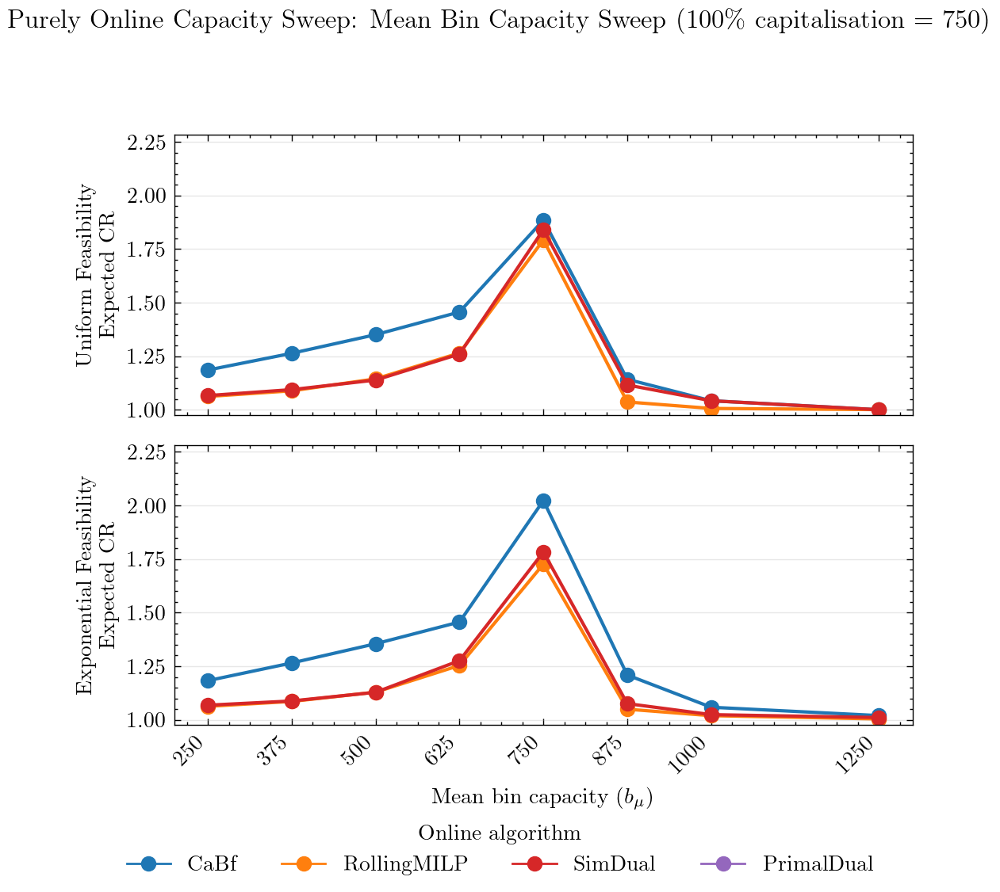

In [62]:

# Presentation Plot 9: Purely Online Capacity Sweep – CR vs. b_mu (T_off=0, T_onl=100)
# T_off=0 → offline solver is a no-op; only online algorithm choice matters.
# b_mu values = Family-4 / 2  →  identical utilisation levels (300 % … 60 %).
df_per_seed_all = df_per_seed_master if "df_per_seed_master" in globals() and df_per_seed_master is not None else df_per_seed

# Show only the four main online algorithms; exclude DL (too similar to others in this setting)
_PLOT9_ALGOS = ["CaBf", "RollingMILP", "SimDual", "PrimalDual"]

if df_per_seed_all is None:
    print("No per-seed data available.")
else:
    import re

    cap_ol_mu_values = [250, 375, 500, 625, 750, 875, 1000, 1250]
    cap_ol_scenarios = [f"cap_mu{mu}_online_off0_on100" for mu in cap_ol_mu_values]

    offline_fail_statuses = {"INFEASIBLE", "INF_OR_UNBD", "UNBOUNDED"}
    online_fail_statuses  = {"INFEASIBLE"}

    df_eval_c = df_per_seed_all[df_per_seed_all["kind"] == "eval"].copy()
    df_opt_c  = df_per_seed_all[df_per_seed_all["kind"] == "optimal"].copy()

    for _df in [df_eval_c, df_opt_c]:
        if "scenario_base" in _df.columns:
            _df["scenario"] = _df["scenario_base"]

    df_eval_c = df_eval_c[df_eval_c["scenario"].isin(cap_ol_scenarios)].copy()
    df_opt_c  = df_opt_c[df_opt_c["scenario"].isin(cap_ol_scenarios)].copy()

    df_eval_c = df_eval_c[
        (~df_eval_c["offline_status"].isin(offline_fail_statuses)) &
        (~df_eval_c["online_status"].isin(online_fail_statuses))
    ].copy()
    df_opt_c = df_opt_c[~df_opt_c["status"].isin(offline_fail_statuses)].copy()
    df_opt_c = df_opt_c.rename(columns={"total_objective": "optimal_objective"})

    # Deduplicate optimal (keep latest run per scenario/feas/seed)
    if "run_dt" in df_opt_c.columns:
        df_opt_c = df_opt_c.sort_values("run_dt")
    elif "run_id" in df_opt_c.columns:
        df_opt_c = df_opt_c.sort_values("run_id")
    df_opt_c = df_opt_c.drop_duplicates(subset=["scenario", "feasibility", "seed"], keep="last")

    # T_off=0: all offline solvers are equivalent (no-op).  Keep only "MILP" to avoid
    # triple-counting if other solvers were accidentally run.
    df_eval_c = df_eval_c[df_eval_c["offline_short"] == "MILP"].copy()

    df_eval_c = pres_filter_rename(df_eval_c)
    # Restrict to the four algorithms for this plot
    df_eval_c = df_eval_c[df_eval_c["online_short"].isin(_PLOT9_ALGOS)].copy()

    if df_eval_c.empty or df_opt_c.empty:
        print("Purely online capacity sweep data not found — run cap_ol_* tmux sessions first.")
    else:
        def _extract_ol_mu(s):
            m = re.match(r"cap_mu(\d+)_online_off0_on100", str(s))
            return int(m.group(1)) if m else None

        df_eval_c["cap_mu"] = df_eval_c["scenario"].map(_extract_ol_mu)
        df_opt_c["cap_mu"]  = df_opt_c["scenario"].map(_extract_ol_mu)

        df_cr_c = df_eval_c.merge(
            df_opt_c[["scenario", "feasibility", "seed", "optimal_objective"]],
            on=["scenario", "feasibility", "seed"],
            how="left",
        )
        df_cr_c = df_cr_c[
            df_cr_c["optimal_objective"].notna() & df_cr_c["total_objective"].notna()
        ].copy()
        df_cr_c["competitive_ratio"] = df_cr_c["total_objective"] / df_cr_c["optimal_objective"]

        if df_cr_c.empty:
            print("No valid CR data after merge — optimal benchmark may not have run yet.")
        else:
            y_min = df_cr_c["competitive_ratio"].quantile(0.02)
            y_max = df_cr_c["competitive_ratio"].quantile(0.98)
            if pd.isna(y_min) or pd.isna(y_max) or y_min >= y_max:
                y_min = df_cr_c["competitive_ratio"].min()
                y_max = df_cr_c["competitive_ratio"].max()
            if pd.isna(y_min) or pd.isna(y_max):
                y_min, y_max = 0.9, 1.5
            y_pad = 0.02 * (y_max - y_min) if y_max > y_min else 0.02

            nrows = len(FEAS_TAGS)
            fig, axes = plt.subplots(
                nrows=nrows, ncols=1,
                figsize=(5.5, 2.8 * max(1, nrows)),
                sharey=True, sharex=True,
            )
            if nrows == 1:
                axes = np.array([axes])

            for r, feas in enumerate(FEAS_TAGS):
                ax = axes[r]
                df_sub = df_cr_c[df_cr_c["feasibility"] == feas].copy()
                if df_sub.empty:
                    ax.text(0.5, 0.5, "no data", transform=ax.transAxes, ha="center")
                    continue
                for online_algo in _PLOT9_ALGOS:
                    df_line = df_sub[df_sub["online_short"] == online_algo].copy()
                    if df_line.empty:
                        continue
                    means = (
                        df_line.groupby("cap_mu")["competitive_ratio"]
                        .mean()
                        .reindex(cap_ol_mu_values)
                    )
                    ax.plot(
                        cap_ol_mu_values, means.values,
                        marker="o", linewidth=1.5, label=online_algo,
                        color=PRES_COLORS.get(online_algo, "C7"),
                    )
                setting = "Uniform Feasibility" if feas == "uniform" else "Exponential Feasibility"
                ax.set_ylabel(f"{setting}\nExpected CR")
                if r == nrows - 1:
                    ax.set_xlabel(r"Mean bin capacity ($b_\mu$)")
                ax.set_xticks(cap_ol_mu_values)
                ax.set_xticklabels([str(v) for v in cap_ol_mu_values], rotation=45, ha="right")
                ax.set_ylim(y_min - y_pad, y_max + y_pad)
                ax.grid(True, axis="y", alpha=0.3)

            from matplotlib.lines import Line2D
            handles = [
                Line2D([0], [0], color=PRES_COLORS.get(a, "C7"), marker="o",
                       linestyle="-", label=a)
                for a in _PLOT9_ALGOS
            ]
            fig.legend(
                handles=handles, title="Online algorithm",
                ncol=len(handles), loc="lower center",
                bbox_to_anchor=(0.5, -0.02), frameon=False,
            )
            fig.suptitle(
                r"Purely Online Capacity Sweep: Mean Bin Capacity Sweep (100\% capitalisation = 750)"
            )
            fig.tight_layout(rect=[0, 0.05, 1, 0.92])
            fig.savefig(PRES_FIG_DIR / "pres_cap_online_sweep_cr_lines.pdf", dpi=200, bbox_inches="tight")
            plt.show()

# ── Interpretation ─────────────────────────────────────────────────────────────
# All four algorithms produce a hill-shaped CR curve that peaks around nominal
# utilisation (b_mu ≈ 500–750) and falls back toward 1 at both extremes.  At
# low b_mu the system is heavily overloaded and most items cannot be placed by
# any algorithm, so all curves converge.  At high b_mu capacity is abundant and
# every policy trivially finds a near-optimal assignment, again converging to 1.
# In the peak region the algorithms do spread apart, with RollingMILP lowest,
# CaBf highest, and PrimalDual / SimDual in between.
#
# The hill shape is the key finding: it reveals that algorithm choice is only
# consequential in a narrow band around nominal load, exactly where capacity
# constraints become binding but the problem is still feasible.  Outside this
# band — either severely overloaded or comfortably under-loaded — no online
# policy can do much better or worse than another.  This justifies focusing
# algorithm development and deployment effort on the critical utilisation regime,
# and shows that lookahead (RollingMILP) and price-signal approaches (PrimalDual,
# SimDual) offer a meaningful advantage over pure greedy heuristics precisely
# where it matters most.
